# EMO: FINE-TUNE GPT-3 MODEL
## ACL 2023 Conference
## WASSA 2023 Shared Task on Empathy, Emotion, and Personality Detection in Interactions
More details [here](https://codalab.lisn.upsaclay.fr/competitions/11167#learn_the_details)

In [1]:
import openai
import numpy as np
import pandas as pd
import re, os
import ftfy
import time
from typing import List
from copy import deepcopy
import difflib, json
import tiktoken
import backoff
from sklearn.metrics import classification_report, multilabel_confusion_matrix

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 400)

import warnings
warnings.filterwarnings("ignore")
#os.path.join()

In [2]:
multi_spaces = re.compile('\s{2,}')

def clean_text(s):
    if not isinstance(s, str):
        return s
    for char in ['�', '•']:
        if char in s:
            s = s.replace(char, ' ')
    s = ftfy.fix_text(s)
    
    #s = clean.sub(' ', s.lower())
    s = multi_spaces.sub(' ', s)
        
    return s.strip()

In [3]:
# new new version (Dec 2022)
def upsample_all( df_, labels_col='target', random_state=47 ):
    '''
        Upsample each class in column labels_col of pandas dataframe df_
        to the number of data points in majority class
    '''
    # get sub-dataframes for each class & max length
    labels = df_[labels_col].unique()
    dframes, df_lengths = dict(), dict()
    for i in labels:
        temp          = df_[ df_[labels_col] == i ]
        dframes[i]    = temp.copy()
        df_lengths[i] = len(temp)

    max_len = max( list(df_lengths.values()) )
    df_lengths = {k: max_len-v for k,v in df_lengths.items()}                     # difference - how many to resample

    # upsample with replacement to max length
    for i in labels:
        if df_lengths[i] == max_len:
            dframes[i] = dframes[i].sample( frac=1, random_state=random_state )      # we know it's overrepresented
        else:
            if len(dframes[i]) >= df_lengths[i]:
                replace = False                                                      # enough data points
            else:
                replace = True
            temp = dframes[i].sample( df_lengths[i], replace=replace, random_state=random_state )
            dframes[i] = pd.concat( [dframes[i].copy(), temp.copy()] )               # df len + (max_len-df len)
            dframes[i] = dframes[i].sample( frac=1, random_state=random_state )      # shuffle

    # combine and reshuffle
    df_merged = pd.concat( list(dframes.values()) )
    df_merged = df_merged.sample( frac=1, random_state=random_state ).reset_index(drop=True)

    return df_merged

In [4]:
# target variables
label2key = {   
    'Anger':    0,
    'Disgust':  1,
    'Fear':     2,
    'Hope':     3,    
    'Joy':      4,
    'Neutral':  5,
    'Sadness':  6,
    'Surprise': 7,
}
key2label = {v: k for k,v in label2key.items()}
print(key2label)

{0: 'Anger', 1: 'Disgust', 2: 'Fear', 3: 'Hope', 4: 'Joy', 5: 'Neutral', 6: 'Sadness', 7: 'Surprise'}


In [5]:
def get_target(emotions: List[str])->List[int]:
    '''
        Convert list of strings with categories into list of 0s and 1s with length 8 because there are 8 categories;
        1 in the i-th position means that this essay belongs to the i-th category as in key2label[i]
    '''
    res  = [0]*8
    idxs = [label2key[e] for e in emotions]    
    for idx in idxs:
        res[idx] = 1
    return res

In [7]:
random_state = 47

# Load and prepare data

In [8]:
file1    = 'data/df_train.pkl'
df_train = pd.read_pickle(file1)

file2    = 'data/df_dev.pkl'
df_dev   = pd.read_pickle(file2)

file3    = 'data/df_augmented.pkl'
df_aug   = pd.read_pickle(file3)
df_aug['emotion']        = df_aug['emotion'].apply( lambda x: [x] if isinstance(x,str) else x)
df_aug['target_encoded'] = df_aug['emotion'].apply( get_target )

file4 = 'data/WASSA23_essay_level_test.tsv'
df_test = pd.read_csv(file4, sep='\t', encoding='utf-8')
df_test['essay_clean'] = df_test['essay'].apply( clean_text )

print(df_train.shape, df_dev.shape, df_aug.shape, df_test.shape)

2023-05-09 22:40:37.256319: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


(792, 36) (208, 41) (165, 3) (100, 13)


In [9]:
df_test['essay_clean'].values

array(['hi my dear friend, how r you?. Are you used in mobile phone have very facilities the particular very social media .It is more enjoy to see this object. Infact today facebook , twiter, instagram to promote upcoming business. In observing analysis meting in running analysis the easy to communicate ,another friend was tell very thank you .',
       "The loss of human life is always a tragic event, and the death of American soldiers overseas is no exception. I get really angry when I hear that one of our soldiers have lost their life in the Taliban or any other place overseas. These brave men and women put their lives on the line to protect their country and defend the principles of freedom and democracy. It's important to honor their sacrifices and remember their service. It's also essential to reflect on the causes and consequences of war and strive to find peaceful solutions to conflicts whenever possible. I believe that we should work towards a way that conflicts can be solved 

In [9]:
# add augmented data
df_aug['essay_clean']              = df_aug['essay'].values
df_aug['essay_clean_spellchecked'] = df_aug['essay'].values
df_aug['emotion_no_2nd_neut']      = df_aug['emotion'].values
print('Misspelled column names:', [c for c in df_aug.columns if c not in df_train.columns])
df_aug.head()

Misspelled column names: []


,essay,emotion,target_encoded,essay_clean,essay_clean_spellchecked,emotion_no_2nd_neut
0,The rising number of drug addiction cases is a...,[Hope],"[0, 0, 0, 1, 0, 0, 0, 0]",The rising number of drug addiction cases is a...,The rising number of drug addiction cases is a...,[Hope]
1,I'm flabbergasted by this new medical treatmen...,[Surprise],"[0, 0, 0, 0, 0, 0, 0, 1]",I'm flabbergasted by this new medical treatmen...,I'm flabbergasted by this new medical treatmen...,[Surprise]
2,The single mother worked multiple jobs to prov...,[Joy],"[0, 0, 0, 0, 1, 0, 0, 0]",The single mother worked multiple jobs to prov...,The single mother worked multiple jobs to prov...,[Joy]
3,I just came across an article about a recent o...,[Fear],"[0, 0, 1, 0, 0, 0, 0, 0]",I just came across an article about a recent o...,I just came across an article about a recent o...,[Fear]
4,"She was diagnosed with a severe illness, but s...",[Joy],"[0, 0, 0, 0, 1, 0, 0, 0]","She was diagnosed with a severe illness, but s...","She was diagnosed with a severe illness, but s...",[Joy]


In [10]:
# merge augmented data with train set
print('Before concatenation:', df_train.shape)
df_train = pd.concat([ df_train.copy(), df_aug.copy() ]).sample(frac=1, random_state=random_state)
print('After concatenation:', df_train.shape)
print(df_train.isna().sum())
df_train.head(25)

Before concatenation: (792, 36)
After concatenation: (957, 36)
article_id                    165
conversation_id               165
speaker_number                165
essay_id                      165
speaker_id                    165
essay                           0
essay_clean                     0
split                         165
gender                        165
education                     165
race                          165
age                           165
income                        165
emotion                         0
target_encoded                  0
target_encoded2               165
compare                       165
emotion_count                 165
char_length                   165
word_length                   165
article                       165
article_clean                 165
essay_clean_docs              165
essay_clean_spellchecked        0
article_clean_docs            165
article_clean_spellchecked    165
compare1                      165
compare2           

,article_id,conversation_id,speaker_number,essay_id,speaker_id,essay,essay_clean,split,gender,education,race,age,income,emotion,target_encoded,target_encoded2,compare,emotion_count,char_length,word_length,article,article_clean,essay_clean_docs,essay_clean_spellchecked,article_clean_docs,article_clean_spellchecked,compare1,compare2,gpt_embedding,emotion_no_2nd_neut,gpt35_keywords,gpt35_title,gpt35_summary,gpt4_summary,gpt4_title,gpt4_keywords
45,NaN,NaN,NaN,NaN,NaN,The increase in school shootings really scares...,The increase in school shootings really scares...,NaN,NaN,NaN,NaN,NaN,NaN,[Fear],"[0, 0, 1, 0, 0, 0, 0, 0]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,The increase in school shootings really scares...,NaN,NaN,NaN,NaN,NaN,[Fear],NaN,NaN,NaN,NaN,NaN,NaN
736,13.0,433.0,2.0,932.0,16.0,It id very troubling how many innocent people ...,It id very troubling how many innocent people ...,train,2,5,1,28,50000,[Fear],"[0, 0, 1, 0, 0, 0, 0, 0]","[0, 0, 1, 0, 0, 0, 0, 0]",True,1.0,345.0,64.0,2 U.S. troops killed fighting Taliban in Afgha...,2 U.S. troops killed fighting Taliban in Afgha...,"(It, i, d, very, troubling, how, many, innocen...",It id very troubling how many innocent people ...,"(2, U.S., troops, killed, fighting, Taliban, i...",2 U.S. troops killed fighting Taliban in Afgha...,False,True,"[0.017318040132522583, -0.003410669509321451, ...",[Fear],"innocent people, dying, events, air strike, wr...",The Tragic Normalcy of Unnecessary Deaths,The text expresses concern over the number of ...,The text expresses concern over innocent peopl...,"""Innocent Lives Lost: Unnecessary Tragedies an...","troubling, innocent people, dying, events, air..."
298,91.0,378.0,1.0,377.0,20.0,I just read this horrifying article. I am actu...,I just read this horrifying article. I am actu...,train,1,3,1,33,58000,"[Disgust, Sadness]","[0, 1, 0, 0, 0, 0, 1, 0]","[0, 1, 0, 0, 0, 0, 1, 0]",True,2.0,800.0,161.0,Child sex abuse victim recalls horror of being...,Child sex abuse victim recalls horror of being...,"(I, just, read, this, horrifying, article, ., ...",I just read this horrifying article. I am actu...,"(Child, sex, abuse, victim, recalls, horror, o...",Child sex abuse victim recalls horror of being...,True,True,"[-0.0024616268929094076, -0.01490007434040308,...","[Disgust, Sadness]","horrifying, article, disturbing, woman, Dr. Ph...",Disturbing Account of Child Sexual Abuse by Pa...,The text describes a disturbing article about ...,The text discusses a disturbing article about ...,"""Survivor of Childhood Abuse Shares Her Story ...","horrifying article, disturbing, woman, Dr. Phi..."
786,218.0,493.0,2.0,992.0,7.0,"Dear friend, I have just read an article a...","Dear friend, I have just read an article about...",train,1,2,5,29,44000,[Neutral],"[0, 0, 0, 0, 0, 1, 0, 0]","[0, 0, 0, 0, 0, 1, 0, 0]",True,1.0,358.0,39.0,Millions exposed to dangerous lead levels in U...,Millions exposed to dangerous lead levels in U...,"(Dear, friend, ,, I, have, just, read, an, art...","Dear friend, I have just read an article about...","(Millions, exposed, to, dangerous, lead, level...",Millions exposed to dangerous lead levels in U...,True,True,"[0.0035916080232709646, -0.015032850205898285,...",[Neutral],"water crisis, Flint, America, clean water",The Water Crisis in Flint and America,The author is disturbed by an article about th...,The text discusses the author's concern about ...,"""The Water Crisis in Flint and Beyond: America...","Dear friend, read, article, disturbed, water c..."
688,367.0,371.0,2.0,870.0,17.0,"I think that after reading the article, it jus...","I think that after reading the article, it jus...",train,1,6,1,29,85000,[Sadness],"[0, 0, 0, 0, 0, 0, 1, 0]","[0, 0, 0, 0, 0, 0, 1, 0]",True,1.0,406.0,78.0,US-Backed Air Campaign Accused Of War Crimes I...,US-Backed Air Campaign Accused Of War Crimes I...,"(I, think, that, after, reading, the, article,...","I think that after reading the article, it jus...","(US, -, Backed, Air, Campaign, Accused, Of, Wa...

In [15]:
# merge train set with augmented data with the dev set for prediction on test set
print([c for c in df_dev.columns if c not in df_train.columns])
print([c for c in df_train.columns if c not in df_dev.columns])
print([c for c in df_aug.columns if c not in df_train.columns])
print([c for c in df_aug.columns if c not in df_dev.columns])

print(df_train.shape, df_dev.shape)
df_combined = pd.concat([ df_train.copy(), df_dev.copy() ]).sample(frac=1, random_state=random_state)
print(df_combined.shape)
print(df_combined.isna().sum())
df_combined.head(25)

['closest_texts', 'davinci_preds2', 'davinci_preds_converted2', 'davinci_preds_encoded2', 'davinci_preds3', 'davinci_preds_converted3', 'davinci_preds_encoded3']
['target_encoded2', 'compare']
[]
[]
(957, 36) (208, 41)
(1165, 43)
article_id                    165
conversation_id               165
speaker_number                165
essay_id                      165
speaker_id                    165
essay                           0
essay_clean                     0
split                         165
gender                        165
education                     165
race                          165
age                           165
income                        165
emotion                         0
target_encoded                  0
target_encoded2               373
compare                       373
emotion_count                 165
char_length                   165
word_length                   165
article                       165
article_clean                 165
essay_clean_docs      

,article_id,conversation_id,speaker_number,essay_id,speaker_id,essay,essay_clean,split,gender,education,race,age,income,emotion,target_encoded,target_encoded2,compare,emotion_count,char_length,word_length,article,article_clean,essay_clean_docs,essay_clean_spellchecked,article_clean_docs,article_clean_spellchecked,compare1,compare2,gpt_embedding,emotion_no_2nd_neut,gpt35_keywords,gpt35_title,gpt35_summary,gpt4_summary,gpt4_title,gpt4_keywords,closest_texts,davinci_preds2,davinci_preds_converted2,davinci_preds_encoded2,davinci_preds3,davinci_preds_converted3,davinci_preds_encoded3
472,134.0,108.0,2.0,607.0,32.0,this is so gross! Can you imagine living in a ...,this is so gross! Can you imagine living in a ...,train,2,2,1,34,50000,"[Disgust, Sadness]","[0, 1, 0, 0, 0, 0, 1, 0]","[0, 1, 0, 0, 0, 0, 1, 0]",True,2.0,341.0,65.0,"Food, water fears remain year after Brazil min...","Food, water fears remain year after Brazil min...","(this, is, so, gross, !, Can, you, imagine, li...",this is so gross! Can you imagine living in a ...,"(Food, ,, water, fears, remain, year, after, B...","Food, water fears remain year after Brazil min...",True,False,"[0.013234701938927174, 0.0030052964575588703, ...","[Disgust, Sadness]","gross, living, place, water, mud, poor people,...",Contaminated Water Leaves Residents Struggling...,The text expresses disgust at the situation of...,The text discusses the unfortunate situation o...,"""Water Crisis: Struggles and Compensation for ...","gross, imagine, living, can't drink water, mud...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
113,171.0,26.0,2.0,525.0,74.0,I just read an article about the Islamic State...,I just read an article about the Islamic State...,dev,1,4,1,29,39000,[Neutral],"[0, 0, 0, 0, 0, 1, 0, 0]",NaN,NaN,1.0,520.0,88.0,"Iraqi Christians, scarred by Islamic State’s c...","Iraqi Christians, scarred by Islamic State's c...","(I, just, read, an, article, about, the, Islam...",I just read an article about the Islamic State...,"(Iraqi, Christians, ,, scarred, by, Islamic, S...","Iraqi Christians, scarred by Islamic State's c...",True,False,"[-0.01757517084479332, -0.02955576218664646, -...",[Neutral],"Islamic State, Christians, Mosul, militant rel...",The Threat of Militant Religious Groups and th...,The author expresses concern about the Islamic...,The text discusses the author's concern about ...,"""Islamic State's Treatment of Christians and t...","Islamic State, treatment of Christians, Mosul,...",[I just read an article about the persecution ...,"[[0.7846703466285886, Neutral], [0.12701663714...","[Neutral, Disgust]","[0, 1, 0, 0, 0, 1, 0, 0]","[[0.47291131631664335, Neutral], [0.2514882022...","[Neutral, Disgust]","[0, 1, 0, 0, 0, 1, 0, 0]"
574,245.0,240.0,2.0,739.0,53.0,Articles like this really hit home for me. I t...,Articles like this really hit home for me. I t...,train,2,3,1,27,25000,[Hope],"[0, 0, 0, 1, 0, 0, 0, 0]","[0, 0, 0, 1, 0, 0, 0, 0]",True,1.0,660.0,123.0,POLICE ASKING FOR HELP REUNITING UNIDENTIFIED ...,POLICE ASKING FOR HELP REUNITING UNIDENTIFIED ...,"(Articles, like, this, really, hit, home, for,...",Articles like this really hit home for me. I t...,"(POLICE, ASKING, FOR, HELP, REUNITING, UNIDENT...",POLICE ASKING FOR HELP Reuniting UNIDENTIFIED ...,False,False,"[0.006730290595442057, 0.007951286621391773, 0...",[Hope],"older people, protected, watched carefully, de...",Protecting Older Adults with Dementia: A Perso...,The author expresses concern for the safety of...,"The text expresses concern for older people, e...",Protecting and Assisting Elderly Individuals w...,"hit home, older people, protected, watched car...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
666,186.0,345.0,2.0,844.0,8.0,This article on Kenya and South Sudan is so sa...,This article on Kenya and South Sudan is so sa...,train,2,6,1,62,29000,[Sadness],"[0, 0, 0, 0, 0, 0, 1, 0]","[0, 0, 0, 0, 0, 0, 1, 0]",True,1.0,356.0,68.0,"Kenya deports South Sudan opposition official,...","Kenya deports South Sudan opposition official,...","(This,

In [8]:
# explore differences between a clean and spellchecked essay columns
df_train['compare'] = df_train['essay_clean'] == df_train['essay_clean_spellchecked']
df_train['compare'].value_counts()

True     690
False    102
Name: compare, dtype: int64

In [13]:
# spellcheck may have hijacked the narrative in some cases (by making incorrect corrections)
# I should have used ChatGPT for spellcheck
for e1, e2 in df_train[ df_train['compare']==False ][['essay_clean', 'essay_clean_spellchecked']].values:
    print('CLEAN:\n', e1, sep='')
    print('\nSPELLCHECKED:\n', e2, sep='')
    
    for i,s in enumerate(difflib.ndiff(e1, e2)):
        if s[0]==' ': continue
        elif s[0]=='-':
            print(u'Delete "{}" from position {}'.format(s[-1],i))
        elif s[0]=='+':
            print(u'Add "{}" to position {}'.format(s[-1],i))    
    print('\n', '='*77, '\n')      

CLEAN:
I just read a really interesting but depressing article. It was about a woman who lived in the UK. She was the founding editor of Elle magazine. She was only thirty when the magazine started which is crazy to me. Imagine being thirty and running a whole magazine. She suffered from depression all of her life and even wrote a book about it. She was admitted into a mental hospital because she was struggling with her depression. The mental hospoital cleared her and let her go. Soon after she walked into the ocean and drowned. It is so sad that she did not get the help she needed. I hope all of our friends know that we are here for them and support them no matter whatthey are going through.

SPELLCHECKED:
I just read a really interesting but depressing article. It was about a woman who lived in the UK. She was the founding editor of Elle magazine. She was only thirty when the magazine started which is crazy to me. Imagine being thirty and running a whole magazine. She suffered from d

### Using original emotions column as multilabels

In [23]:
dict_list      = []
text_col       = 'essay_clean'
emotion_col    = 'emotion'
prompt_end     = '\n\n###\n\n'
completion_end = '\n###'
for prompt, completion in df_train[[text_col, emotion_col]].values:
    dict_list.append({ "prompt":     prompt + prompt_end,
                       "completion": ' ' + '/'.join(sorted(completion)) + completion_end })

In [19]:
file = 'data/data_all_emotions_multilabel.jsonl'
with open(file, 'w') as f:
    for entry in dict_list:
        json.dump(entry, f)
        f.write('\n')

### Using deneutralized emotions column as multilabels

In [21]:
dict_list      = []
text_col       = 'essay_clean'
emotion_col    = 'emotion_no_2nd_neut'
prompt_end     = '\n\n###\n\n'
completion_end = '\n###'
for prompt, completion in df_train[[text_col, emotion_col]].values:
    dict_list.append({ "prompt":     prompt + prompt_end,
                       "completion": ' ' + '/'.join(sorted(completion)) + completion_end })

In [22]:
file = 'data/data_abbrev_emotions_multilabel.jsonl'
with open(file, 'w') as f:
    for entry in dict_list:
        json.dump(entry, f)
        f.write('\n')

### Using original emotions column as unilabels

In [12]:
dict_list      = []
text_col       = 'essay_clean'
emotion_col    = 'emotion'
prompt_end     = '\n\n###\n\n'
completion_end = '\n###'
print(df_train.shape, df_train.explode(emotion_col).shape)
for prompt, completion in df_train.explode(emotion_col)[[text_col, emotion_col]].values:
    dict_list.append({ "prompt":     prompt + prompt_end,
                       "completion": ' ' + completion + completion_end })
print(len(dict_list))

(957, 36) (1106, 36)
1106


In [15]:
#file = 'data/data_all_emotions_unilabel.jsonl'                 # name of file without augmented data
file = 'data/data_all_emotions_augmented_unilabel.jsonl'
with open(file, 'w') as f:
    for entry in dict_list:
        json.dump(entry, f)
        f.write('\n')

### Using deneutralized emotions column as unilabels

In [27]:
dict_list      = []
text_col       = 'essay_clean'
emotion_col    = 'emotion_no_2nd_neut'
prompt_end     = '\n\n###\n\n'
completion_end = '\n###'
for prompt, completion in df_train.explode(emotion_col)[[text_col, emotion_col]].values:
    dict_list.append({ "prompt":     prompt + prompt_end,
                       "completion": ' ' + completion + completion_end })

In [28]:
file = 'data/data_abbrev_emotions_unilabel.jsonl'
with open(file, 'w') as f:
    for entry in dict_list:
        json.dump(entry, f)
        f.write('\n')

In [29]:
len(dict_list)

903

In [18]:
text_col       = 'essay_clean'
emotion_col    = 'emotion_no_2nd_neut'
prompt_end     = '\n\n###\n\n'
completion_end = '\n###'

### Using original emotions column as unilabels FOR ALL DATA

In [16]:
dict_list      = []
text_col       = 'essay_clean'
emotion_col    = 'emotion'
prompt_end     = '\n\n###\n\n'
completion_end = '\n###'
print(df_combined.shape, df_combined.explode(emotion_col).shape)
for prompt, completion in df_combined.explode(emotion_col)[[text_col, emotion_col]].values:
    dict_list.append({ "prompt":     prompt + prompt_end,
                       "completion": ' ' + completion + completion_end })
print(len(dict_list))

(1165, 43) (1352, 43)
1352


In [19]:
#file = 'data/data_all_emotions_unilabel.jsonl'                 # name of file without augmented data
file = 'data/data_all_emotions_augmented_unilabel_train_dev_combined.jsonl'
with open(file, 'w') as f:
    for entry in dict_list:
        json.dump(entry, f)
        f.write('\n')

# Fine-tune OpenAI DaVinci model 1
Fine-tuning DaVinci on de-neutralized dataset: if there are two emotions assigned to one essay, and one of them is neutral, neutral was removed

__CLI usage to fine-tune a pretrained model__: https://platform.openai.com/docs/guides/fine-tuning 

__To make sure each of the above generated data files is suitable for a fine-tuning job__:  
```openai tools fine_tunes.prepare_data -f data_all_emotions_unilabel.jsonl```

__Fine-tuning CLI command used__:  
```openai api fine_tunes.create -t data_abbrev_emotions_unilabel.jsonl -m davinci --suffix "abbrev_emotions_unilabel_20230509"```  
where `-t` is the training data file `-m` is name of the pre-trained model and `--suffix` is the custom name of the new fine-tuned model

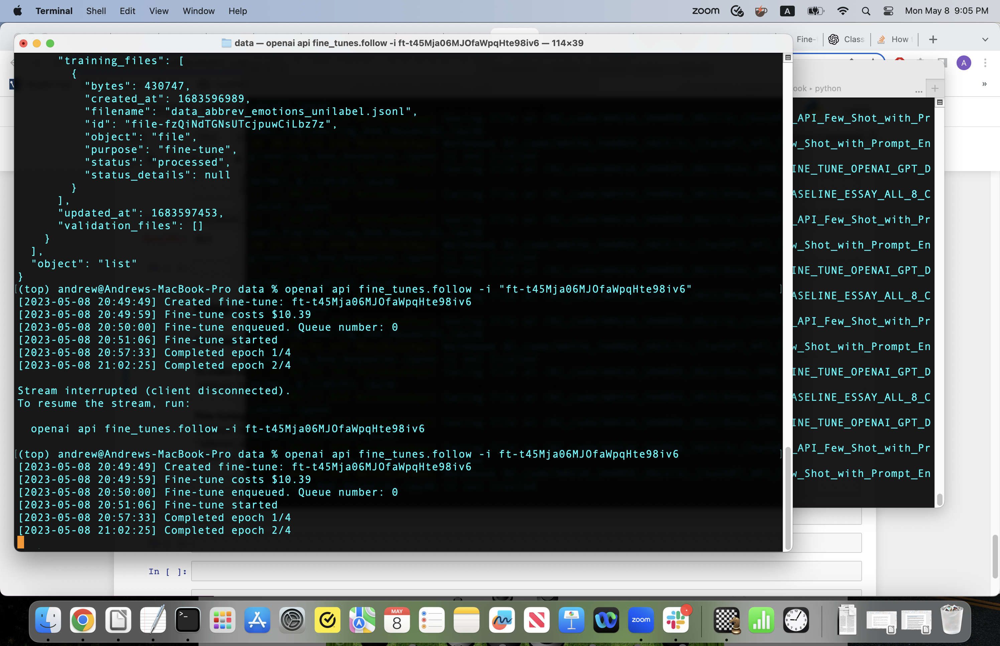

# Apply fine-tuned model 1 onto the dev set
Completion API for this kind of models: https://platform.openai.com/docs/api-reference/completions/create

OpenAI recommends using only one token as a label, but I used words that consist of 2 tokens. Therefore, sadness became sad, and disgust is dis. Need to take this into accout next time, otherwise the logprobs are only approximate.

In [36]:
openai.api_key = os.getenv("OPENAI_API_KEY")
model = "davinci:ft-tovoz-rosnim:abbrev-emotions-unilabel-20230509-2023-05-09-02-12-51"

In [92]:
@backoff.on_exception(backoff.expo, openai.error.RateLimitError, max_time=10)
def get_fine_tuned_response(model_, prompt_, temperature=0, max_tokens=None):
    '''Send request, return reponse'''
    response  = openai.Completion.create(
        model = model_,
        prompt = prompt_,       
        temperature=0,
        logprobs=5,
        max_tokens=1,        
        #suffix=completion_end,        
        #top_p=1,
        #n=1,    # how many completions to gerenerate
        #presence_penalty=0,
        #frequency_penalty=0,
        #best_of=1,
        #stream = False,
        #stop=None, 
        #logit_bias=None,
    )
    #content = response['choices'][0]['message']['content'].strip()    
    return response

In [68]:
# correct predictions
pred2label = {   
    'Anger':    'Anger',
    'Dis':      'Disgust',
    'Fear':     'Fear',
    'Hope':     'Hope',    
    'Joy':      'Joy',
    'Neutral':  'Neutral',
    'Sad':      'Sadness',
    'Surprise': 'Surprise',
}

In [85]:
# one example
idx = 5
example      = df_dev[text_col].values[idx]
response     = get_response(model, example + prompt_end)
top_logprobs = response["choices"][0]["logprobs"]["top_logprobs"][0]
print('RESPONSE:\n', response, '\n')

probs = sorted([[np.exp(logp), token.strip()] for token, logp in top_logprobs.items()], reverse=True)
probs = [[a, pred2label.get(b)] for a,b in probs]
print(probs)

text = response["choices"][0]["text"]
print(text.strip())

RESPONSE:
 {
  "choices": [
    {
      "finish_reason": "length",
      "index": 0,
      "logprobs": {
        "text_offset": [
          387
        ],
        "token_logprobs": [
          -0.0052851182
        ],
        "tokens": [
          " Sad"
        ],
        "top_logprobs": [
          {
            " Dis": -6.1981215,
            " Fear": -7.3607345,
            " Hope": -7.1390553,
            " Neutral": -7.9061565,
            " Sad": -0.0052851182
          }
        ]
      },
      "text": " Sad"
    }
  ],
  "created": 1683610465,
  "id": "cmpl-7EAHR6DoWAZT5VWCjNuTPyl9GcD6S",
  "model": "davinci:ft-tovoz-rosnim:abbrev-emotions-unilabel-20230509-2023-05-09-02-12-51",
  "object": "text_completion",
  "usage": {
    "completion_tokens": 1,
    "prompt_tokens": 78,
    "total_tokens": 79
  }
} 

[[0.9947288234652641, 'Sadness'], [0.0020332465046782864, 'Disgust'], [0.0007935013632324337, 'Hope'], [0.0006357313433393986, 'Fear'], [0.00036846806950787146, 'Neutral']]
S

In [87]:
# apply to all examples from dev set
raw_response   = dict()
probs_response = dict()
text_response  = dict()

count = 0
for example in df_dev[text_col].values:
    if example in probs_response:
        continue
        
    response = get_fine_tuned_response(model, example + prompt_end)
    
    top_logprobs = response["choices"][0]["logprobs"]["top_logprobs"][0]
    probs = sorted([[np.exp(logp), token.strip()] for token, logp in top_logprobs.items()], reverse=True)
    probs = [[a, pred2label.get(b)] for a,b in probs]
    #print(probs)

    text = response["choices"][0]["text"].strip()
    #print(text.strip())
    
    raw_response[ example ]   = response
    probs_response[ example ] = probs
    text_response[ example ]  = text
    
    count += 1
    if count%10==0:
        print(f'Processed {count} essays')

In [95]:
len(raw_response), len(probs_response), len(text_response)

(208, 208, 208)

In [99]:
df_dev['davinci_preds'] = df_dev[text_col].map( probs_response )

In [101]:
# compare groundtruth and predictions
for a, b, c in df_dev[['emotion', emotion_col, 'davinci_preds']].values:
    print(f"Full: {a}    Brief: {b}")
    print(f"Predicted: {c}")
    print('\n', '='*77, '\n')

Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.9626679158598727, 'Sadness'], [0.023784920298926898, 'Disgust'], [0.007198282666153515, 'Anger'], [0.002588129150487364, 'Surprise'], [0.0006008723752336039, 'Joy']]


Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.5676326003021601, 'Neutral'], [0.4100844232969791, 'Sadness'], [0.015216663023938143, 'Hope'], [0.005891662871654562, 'Disgust'], [0.00021627690580160148, 'Anger']]


Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.7336483150490072, 'Sadness'], [0.09916131604192312, 'Joy'], [0.08876025571062728, 'Neutral'], [0.05562426233371642, 'Hope'], [0.004475435560663166, None]]


Full: ['Neutral']    Brief: ['Neutral']
Predicted: [[0.569137227968198, 'Sadness'], [0.41123728307280033, 'Neutral'], [0.011752338933866732, 'Surprise'], [0.0025323400063675394, 'Fear'], [0.002109128605437896, 'Disgust']]


Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.9922871802236559, 'Sadness'], [0.001953533880760787, 'Disgust'],

## Search for one (second) threshold
Use the second prediction when its probability > threshold

In [110]:
def convert_davinci_preds( dv_preds, threshold=0.2 ):
    ''' Convert Davinci predictions into a list of predicted emotions.
        First, add the top prediction, then add the second one if
        its probability > threshold
    '''
    res = [ dv_preds[0][1] ]
    if dv_preds[1][0] > threshold:
        res.append( dv_preds[1][1] )
    return res

In [118]:
res = []
thresholds = [i/100 for i in range(0,101)]
for t in thresholds:
    df_dev['davinci_preds_converted'] = df_dev['davinci_preds'].apply(lambda x: convert_davinci_preds(x,
                                                                                                      threshold=t,)
                                                                     )
    df_dev['davinci_preds_encoded']   = df_dev['davinci_preds_converted'].apply( lambda x: get_target(x) )

    y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
    y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded'].values.tolist() )
    labels = list(label2key.keys())
    print('Threshold:', t, '\n')
    print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )
    clf_rep = classification_report( y_dev_encoded, y_dev_pred_encoded, output_dict=True )    
    res.append([clf_rep['macro avg']['f1-score'], t])

Threshold: 0.0 

              precision    recall  f1-score   support

       Anger     0.6750    0.7105    0.6923        38
     Disgust     0.2262    0.7917    0.3519        24
        Fear     0.3043    0.8750    0.4516         8
        Hope     0.4054    0.9375    0.5660        16
         Joy     0.2500    0.5000    0.3333         2
     Neutral     0.5455    0.8889    0.6761        54
     Sadness     0.7090    0.9406    0.8085       101
    Surprise     0.1667    0.3333    0.2222         3

   micro avg     0.5120    0.8659    0.6435       246
   macro avg     0.4103    0.7472    0.5127       246
weighted avg     0.5775    0.8659    0.6785       246
 samples avg     0.5120    0.8822    0.6354       246

Threshold: 0.01 

              precision    recall  f1-score   support

       Anger     0.6923    0.7105    0.7013        38
     Disgust     0.3016    0.7917    0.4368        24
        Fear     0.4375    0.8750    0.5833         8
        Hope     0.4815    0.8125    0.6047

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

              precision    recall  f1-score   support

       Anger     0.8095    0.4474    0.5763        38
     Disgust     0.5172    0.6250    0.5660        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.7143    0.6250    0.6667        16
         Joy     0.0000    0.0000    0.0000         2
     Neutral     0.7368    0.7778    0.7568        54
     Sadness     0.8571    0.8911    0.8738       101
    Surprise     0.0000    0.0000    0.0000         3

   micro avg     0.7650    0.7276    0.7458       246
   macro avg     0.5437    0.4989    0.5133       246
weighted avg     0.7589    0.7276    0.7341       246
 samples avg     0.7909    0.7668    0.7596       246

Threshold: 0.29 

              precision    recall  f1-score   support

       Anger     0.8095    0.4474    0.5763        38
     Disgust     0.5769    0.6250    0.6000        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.7143    0.6250    0.6667        16
      

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

              precision    recall  f1-score   support

       Anger     0.8125    0.3421    0.4815        38
     Disgust     0.5909    0.5417    0.5652        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.7692    0.6250    0.6897        16
         Joy     0.0000    0.0000    0.0000         2
     Neutral     0.7170    0.7037    0.7103        54
     Sadness     0.8854    0.8416    0.8629       101
    Surprise     0.0000    0.0000    0.0000         3

   micro avg     0.7885    0.6667    0.7225       246
   macro avg     0.5612    0.4599    0.4970       246
weighted avg     0.7773    0.6667    0.7063       246
 samples avg     0.7885    0.7067    0.7340       246

Threshold: 0.6 

              precision    recall  f1-score   support

       Anger     0.8125    0.3421    0.4815        38
     Disgust     0.5909    0.5417    0.5652        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.7692    0.6250    0.6897        16
       

Threshold: 0.91 

              precision    recall  f1-score   support

       Anger     0.8125    0.3421    0.4815        38
     Disgust     0.5909    0.5417    0.5652        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.7692    0.6250    0.6897        16
         Joy     0.0000    0.0000    0.0000         2
     Neutral     0.7170    0.7037    0.7103        54
     Sadness     0.8854    0.8416    0.8629       101
    Surprise     0.0000    0.0000    0.0000         3

   micro avg     0.7885    0.6667    0.7225       246
   macro avg     0.5612    0.4599    0.4970       246
weighted avg     0.7773    0.6667    0.7063       246
 samples avg     0.7885    0.7067    0.7340       246

Threshold: 0.92 

              precision    recall  f1-score   support

       Anger     0.8125    0.3421    0.4815        38
     Disgust     0.5909    0.5417    0.5652        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.7692    0.6250    0.689

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

In [119]:
sorted(res, reverse=True)

[[0.5285231156997432, 0.01],
 [0.5243343849682309, 0.02],
 [0.5187682501057007, 0.17],
 [0.5175184605372197, 0.29],
 [0.5163669137602787, 0.2],
 [0.5159806917184123, 0.31],
 [0.5159806917184123, 0.3],
 [0.5158040179044044, 0.18],
 [0.5152403093585718, 0.32],
 [0.5151320173868068, 0.16],
 [0.5146977159689023, 0.27],
 [0.5146288211050042, 0.19],
 [0.5141928839781249, 0.22],
 [0.5138451195886535, 0.35],
 [0.5137315768448685, 0.26],
 [0.5134008120653634, 0.21],
 [0.5132731775183519, 0.28],
 [0.5132394319019227, 0.25],
 [0.5132394319019227, 0.24],
 [0.5127415893895004, 0.0],
 [0.512727988825878, 0.15],
 [0.5125970623915048, 0.33],
 [0.5124323431758772, 0.37],
 [0.5124323431758772, 0.36],
 [0.5119407306032213, 0.23],
 [0.5117518559196381, 0.34],
 [0.5096901331732586, 0.4],
 [0.5096901331732586, 0.39],
 [0.5091428694916666, 0.38],
 [0.5075573407049475, 0.14],
 [0.5075479166695558, 0.41],
 [0.5053719513550767, 0.43],
 [0.5053719513550767, 0.42],
 [0.503879220306271, 0.44],
 [0.5015644054914562

In [122]:
# using the best threshold
df_dev['davinci_preds_converted'] = df_dev['davinci_preds'].apply( lambda x: convert_davinci_preds( x,
                                                                                                    threshold=0.01, )
                                                                 )
df_dev['davinci_preds_encoded']   = df_dev['davinci_preds_converted'].apply( lambda x: get_target(x) )

y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded'].values.tolist() )
labels = list(label2key.keys())
print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )

              precision    recall  f1-score   support

       Anger     0.6923    0.7105    0.7013        38
     Disgust     0.3016    0.7917    0.4368        24
        Fear     0.4375    0.8750    0.5833         8
        Hope     0.4815    0.8125    0.6047        16
         Joy     0.3333    0.5000    0.4000         2
     Neutral     0.5595    0.8704    0.6812        54
     Sadness     0.7344    0.9307    0.8210       101
    Surprise     0.0000    0.0000    0.0000         3

   micro avg     0.5730    0.8455    0.6831       246
   macro avg     0.4425    0.6863    0.5285       246
weighted avg     0.6090    0.8455    0.6991       246
 samples avg     0.6178    0.8654    0.6963       246



## Search for 2 thresholds
Use the first prediction only when it probability > threshold_1; use the second prediction only when its probability > threshold_2

In [123]:
def convert_davinci_preds2( dv_preds, threshold_1=1.0, threshold_2=0.2 ):
    ''' Convert Davinci predictions into a list of predicted emotions.
        First, add the top prediction if its probability > trechold_1,
        then add the second one if its probability > threshold_2
    '''
    res      = []    
    proba1   = dv_preds[0][0]
    proba2   = dv_preds[1][0]    
    emotion1 = dv_preds[0][1]
    emotion2 = dv_preds[1][1]
    
    if proba1 >= threshold_1:
        res.append(emotion1)
    if proba2 >= threshold_2:
        res.append(emotion2)

    return res

In [128]:
res = []
thresholds = [i/100 for i in range(0,101)]
for t1 in thresholds:
    for t2 in thresholds:
        df_dev['davinci_preds_converted'] = df_dev['davinci_preds'].apply( lambda x: convert_davinci_preds2(x,
                                                                                         threshold_1=t1,
                                                                                         threshold_2=t2, )
                                                                         )
        df_dev['davinci_preds_encoded']   = df_dev['davinci_preds_converted'].apply( lambda x: get_target(x) )

        y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
        y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded'].values.tolist() )
        labels = list(label2key.keys())
        print('Threshold 1:', t1,)
        print('Threshold 2:', t2, '\n')
        #print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )
        clf_rep = classification_report( y_dev_encoded, y_dev_pred_encoded, output_dict=True )    
        res.append([clf_rep['macro avg']['f1-score'], t1, t2])

Threshold 1: 0.0
Threshold 2: 0.0 

Threshold 1: 0.0
Threshold 2: 0.01 

Threshold 1: 0.0
Threshold 2: 0.02 

Threshold 1: 0.0
Threshold 2: 0.03 

Threshold 1: 0.0
Threshold 2: 0.04 

Threshold 1: 0.0
Threshold 2: 0.05 

Threshold 1: 0.0
Threshold 2: 0.06 

Threshold 1: 0.0
Threshold 2: 0.07 

Threshold 1: 0.0
Threshold 2: 0.08 

Threshold 1: 0.0
Threshold 2: 0.09 

Threshold 1: 0.0
Threshold 2: 0.1 

Threshold 1: 0.0
Threshold 2: 0.11 

Threshold 1: 0.0
Threshold 2: 0.12 

Threshold 1: 0.0
Threshold 2: 0.13 

Threshold 1: 0.0
Threshold 2: 0.14 

Threshold 1: 0.0
Threshold 2: 0.15 

Threshold 1: 0.0
Threshold 2: 0.16 

Threshold 1: 0.0
Threshold 2: 0.17 

Threshold 1: 0.0
Threshold 2: 0.18 

Threshold 1: 0.0
Threshold 2: 0.19 

Threshold 1: 0.0
Threshold 2: 0.2 

Threshold 1: 0.0
Threshold 2: 0.21 

Threshold 1: 0.0
Threshold 2: 0.22 

Threshold 1: 0.0
Threshold 2: 0.23 

Threshold 1: 0.0
Threshold 2: 0.24 

Threshold 1: 0.0
Threshold 2: 0.25 

Threshold 1: 0.0
Threshold 2: 0.26 

Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.0
Threshold 2: 0.56 

Threshold 1: 0.0
Threshold 2: 0.57 

Threshold 1: 0.0
Threshold 2: 0.58 

Threshold 1: 0.0
Threshold 2: 0.59 

Threshold 1: 0.0
Threshold 2: 0.6 

Threshold 1: 0.0
Threshold 2: 0.61 

Threshold 1: 0.0
Threshold 2: 0.62 

Threshold 1: 0.0
Threshold 2: 0.63 

Threshold 1: 0.0
Threshold 2: 0.64 

Threshold 1: 0.0
Threshold 2: 0.65 

Threshold 1: 0.0
Threshold 2: 0.66 

Threshold 1: 0.0
Threshold 2: 0.67 

Threshold 1: 0.0
Threshold 2: 0.68 

Threshold 1: 0.0
Threshold 2: 0.69 

Threshold 1: 0.0
Threshold 2: 0.7 

Threshold 1: 0.0
Threshold 2: 0.71 

Threshold 1: 0.0
Threshold 2: 0.72 

Threshold 1: 0.0
Threshold 2: 0.73 

Threshold 1: 0.0
Threshold 2: 0.74 

Threshold 1: 0.0
Threshold 2: 0.75 

Threshold 1: 0.0
Threshold 2: 0.76 

Threshold 1: 0.0
Threshold 2: 0.77 

Threshold 1: 0.0
Threshold 2: 0.78 

Threshold 1: 0.0
Threshold 2: 0.79 

Threshold 1: 0.0
Threshold 2: 0.8 

Threshold 1: 0.0
Threshold 2: 0.81 

Threshold 1: 0.0
Threshold 2: 0.82 

Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.01
Threshold 2: 0.17 

Threshold 1: 0.01
Threshold 2: 0.18 

Threshold 1: 0.01
Threshold 2: 0.19 

Threshold 1: 0.01
Threshold 2: 0.2 

Threshold 1: 0.01
Threshold 2: 0.21 

Threshold 1: 0.01
Threshold 2: 0.22 

Threshold 1: 0.01
Threshold 2: 0.23 

Threshold 1: 0.01
Threshold 2: 0.24 

Threshold 1: 0.01
Threshold 2: 0.25 

Threshold 1: 0.01
Threshold 2: 0.26 

Threshold 1: 0.01
Threshold 2: 0.27 

Threshold 1: 0.01
Threshold 2: 0.28 

Threshold 1: 0.01
Threshold 2: 0.29 

Threshold 1: 0.01
Threshold 2: 0.3 

Threshold 1: 0.01
Threshold 2: 0.31 

Threshold 1: 0.01
Threshold 2: 0.32 

Threshold 1: 0.01
Threshold 2: 0.33 

Threshold 1: 0.01
Threshold 2: 0.34 

Threshold 1: 0.01
Threshold 2: 0.35 

Threshold 1: 0.01
Threshold 2: 0.36 

Threshold 1: 0.01
Threshold 2: 0.37 

Threshold 1: 0.01
Threshold 2: 0.38 

Threshold 1: 0.01
Threshold 2: 0.39 

Threshold 1: 0.01
Threshold 2: 0.4 

Threshold 1: 0.01
Threshold 2: 0.41 

Threshold 1: 0.01
Threshold 2: 0.42 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.01
Threshold 2: 0.8 

Threshold 1: 0.01
Threshold 2: 0.81 

Threshold 1: 0.01
Threshold 2: 0.82 

Threshold 1: 0.01
Threshold 2: 0.83 

Threshold 1: 0.01
Threshold 2: 0.84 

Threshold 1: 0.01
Threshold 2: 0.85 

Threshold 1: 0.01
Threshold 2: 0.86 

Threshold 1: 0.01
Threshold 2: 0.87 

Threshold 1: 0.01
Threshold 2: 0.88 

Threshold 1: 0.01
Threshold 2: 0.89 

Threshold 1: 0.01
Threshold 2: 0.9 

Threshold 1: 0.01
Threshold 2: 0.91 

Threshold 1: 0.01
Threshold 2: 0.92 

Threshold 1: 0.01
Threshold 2: 0.93 

Threshold 1: 0.01
Threshold 2: 0.94 

Threshold 1: 0.01
Threshold 2: 0.95 

Threshold 1: 0.01
Threshold 2: 0.96 

Threshold 1: 0.01
Threshold 2: 0.97 

Threshold 1: 0.01
Threshold 2: 0.98 

Threshold 1: 0.01
Threshold 2: 0.99 

Threshold 1: 0.01
Threshold 2: 1.0 

Threshold 1: 0.02
Threshold 2: 0.0 

Threshold 1: 0.02
Threshold 2: 0.01 

Threshold 1: 0.02
Threshold 2: 0.02 

Threshold 1: 0.02
Threshold 2: 0.03 

Threshold 1: 0.02
Threshold 2: 0.04 

Threshold 1: 0.0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.02
Threshold 2: 0.4 

Threshold 1: 0.02
Threshold 2: 0.41 

Threshold 1: 0.02
Threshold 2: 0.42 

Threshold 1: 0.02
Threshold 2: 0.43 

Threshold 1: 0.02
Threshold 2: 0.44 

Threshold 1: 0.02
Threshold 2: 0.45 

Threshold 1: 0.02
Threshold 2: 0.46 

Threshold 1: 0.02
Threshold 2: 0.47 

Threshold 1: 0.02
Threshold 2: 0.48 

Threshold 1: 0.02
Threshold 2: 0.49 

Threshold 1: 0.02
Threshold 2: 0.5 

Threshold 1: 0.02
Threshold 2: 0.51 

Threshold 1: 0.02
Threshold 2: 0.52 

Threshold 1: 0.02
Threshold 2: 0.53 

Threshold 1: 0.02
Threshold 2: 0.54 

Threshold 1: 0.02
Threshold 2: 0.55 

Threshold 1: 0.02
Threshold 2: 0.56 

Threshold 1: 0.02
Threshold 2: 0.57 

Threshold 1: 0.02
Threshold 2: 0.58 

Threshold 1: 0.02
Threshold 2: 0.59 

Threshold 1: 0.02
Threshold 2: 0.6 

Threshold 1: 0.02
Threshold 2: 0.61 

Threshold 1: 0.02
Threshold 2: 0.62 

Threshold 1: 0.02
Threshold 2: 0.63 

Threshold 1: 0.02
Threshold 2: 0.64 

Threshold 1: 0.02
Threshold 2: 0.65 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.03
Threshold 2: 0.01 

Threshold 1: 0.03
Threshold 2: 0.02 

Threshold 1: 0.03
Threshold 2: 0.03 

Threshold 1: 0.03
Threshold 2: 0.04 

Threshold 1: 0.03
Threshold 2: 0.05 

Threshold 1: 0.03
Threshold 2: 0.06 

Threshold 1: 0.03
Threshold 2: 0.07 

Threshold 1: 0.03
Threshold 2: 0.08 

Threshold 1: 0.03
Threshold 2: 0.09 

Threshold 1: 0.03
Threshold 2: 0.1 

Threshold 1: 0.03
Threshold 2: 0.11 

Threshold 1: 0.03
Threshold 2: 0.12 

Threshold 1: 0.03
Threshold 2: 0.13 

Threshold 1: 0.03
Threshold 2: 0.14 

Threshold 1: 0.03
Threshold 2: 0.15 

Threshold 1: 0.03
Threshold 2: 0.16 

Threshold 1: 0.03
Threshold 2: 0.17 

Threshold 1: 0.03
Threshold 2: 0.18 

Threshold 1: 0.03
Threshold 2: 0.19 

Threshold 1: 0.03
Threshold 2: 0.2 

Threshold 1: 0.03
Threshold 2: 0.21 

Threshold 1: 0.03
Threshold 2: 0.22 

Threshold 1: 0.03
Threshold 2: 0.23 

Threshold 1: 0.03
Threshold 2: 0.24 

Threshold 1: 0.03
Threshold 2: 0.25 

Threshold 1: 0.03
Threshold 2: 0.26 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.03
Threshold 2: 0.63 

Threshold 1: 0.03
Threshold 2: 0.64 

Threshold 1: 0.03
Threshold 2: 0.65 

Threshold 1: 0.03
Threshold 2: 0.66 

Threshold 1: 0.03
Threshold 2: 0.67 

Threshold 1: 0.03
Threshold 2: 0.68 

Threshold 1: 0.03
Threshold 2: 0.69 

Threshold 1: 0.03
Threshold 2: 0.7 

Threshold 1: 0.03
Threshold 2: 0.71 

Threshold 1: 0.03
Threshold 2: 0.72 

Threshold 1: 0.03
Threshold 2: 0.73 

Threshold 1: 0.03
Threshold 2: 0.74 

Threshold 1: 0.03
Threshold 2: 0.75 

Threshold 1: 0.03
Threshold 2: 0.76 

Threshold 1: 0.03
Threshold 2: 0.77 

Threshold 1: 0.03
Threshold 2: 0.78 

Threshold 1: 0.03
Threshold 2: 0.79 

Threshold 1: 0.03
Threshold 2: 0.8 

Threshold 1: 0.03
Threshold 2: 0.81 

Threshold 1: 0.03
Threshold 2: 0.82 

Threshold 1: 0.03
Threshold 2: 0.83 

Threshold 1: 0.03
Threshold 2: 0.84 

Threshold 1: 0.03
Threshold 2: 0.85 

Threshold 1: 0.03
Threshold 2: 0.86 

Threshold 1: 0.03
Threshold 2: 0.87 

Threshold 1: 0.03
Threshold 2: 0.88 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.04
Threshold 2: 0.23 

Threshold 1: 0.04
Threshold 2: 0.24 

Threshold 1: 0.04
Threshold 2: 0.25 

Threshold 1: 0.04
Threshold 2: 0.26 

Threshold 1: 0.04
Threshold 2: 0.27 

Threshold 1: 0.04
Threshold 2: 0.28 

Threshold 1: 0.04
Threshold 2: 0.29 

Threshold 1: 0.04
Threshold 2: 0.3 

Threshold 1: 0.04
Threshold 2: 0.31 

Threshold 1: 0.04
Threshold 2: 0.32 

Threshold 1: 0.04
Threshold 2: 0.33 

Threshold 1: 0.04
Threshold 2: 0.34 

Threshold 1: 0.04
Threshold 2: 0.35 

Threshold 1: 0.04
Threshold 2: 0.36 

Threshold 1: 0.04
Threshold 2: 0.37 

Threshold 1: 0.04
Threshold 2: 0.38 

Threshold 1: 0.04
Threshold 2: 0.39 

Threshold 1: 0.04
Threshold 2: 0.4 

Threshold 1: 0.04
Threshold 2: 0.41 

Threshold 1: 0.04
Threshold 2: 0.42 

Threshold 1: 0.04
Threshold 2: 0.43 

Threshold 1: 0.04
Threshold 2: 0.44 

Threshold 1: 0.04
Threshold 2: 0.45 

Threshold 1: 0.04
Threshold 2: 0.46 

Threshold 1: 0.04
Threshold 2: 0.47 

Threshold 1: 0.04
Threshold 2: 0.48 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.04
Threshold 2: 0.86 

Threshold 1: 0.04
Threshold 2: 0.87 

Threshold 1: 0.04
Threshold 2: 0.88 

Threshold 1: 0.04
Threshold 2: 0.89 

Threshold 1: 0.04
Threshold 2: 0.9 

Threshold 1: 0.04
Threshold 2: 0.91 

Threshold 1: 0.04
Threshold 2: 0.92 

Threshold 1: 0.04
Threshold 2: 0.93 

Threshold 1: 0.04
Threshold 2: 0.94 

Threshold 1: 0.04
Threshold 2: 0.95 

Threshold 1: 0.04
Threshold 2: 0.96 

Threshold 1: 0.04
Threshold 2: 0.97 

Threshold 1: 0.04
Threshold 2: 0.98 

Threshold 1: 0.04
Threshold 2: 0.99 

Threshold 1: 0.04
Threshold 2: 1.0 

Threshold 1: 0.05
Threshold 2: 0.0 

Threshold 1: 0.05
Threshold 2: 0.01 

Threshold 1: 0.05
Threshold 2: 0.02 

Threshold 1: 0.05
Threshold 2: 0.03 

Threshold 1: 0.05
Threshold 2: 0.04 

Threshold 1: 0.05
Threshold 2: 0.05 

Threshold 1: 0.05
Threshold 2: 0.06 

Threshold 1: 0.05
Threshold 2: 0.07 

Threshold 1: 0.05
Threshold 2: 0.08 

Threshold 1: 0.05
Threshold 2: 0.09 

Threshold 1: 0.05
Threshold 2: 0.1 

Threshold 1: 0.0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.05
Threshold 2: 0.47 

Threshold 1: 0.05
Threshold 2: 0.48 

Threshold 1: 0.05
Threshold 2: 0.49 

Threshold 1: 0.05
Threshold 2: 0.5 

Threshold 1: 0.05
Threshold 2: 0.51 

Threshold 1: 0.05
Threshold 2: 0.52 

Threshold 1: 0.05
Threshold 2: 0.53 

Threshold 1: 0.05
Threshold 2: 0.54 

Threshold 1: 0.05
Threshold 2: 0.55 

Threshold 1: 0.05
Threshold 2: 0.56 

Threshold 1: 0.05
Threshold 2: 0.57 

Threshold 1: 0.05
Threshold 2: 0.58 

Threshold 1: 0.05
Threshold 2: 0.59 

Threshold 1: 0.05
Threshold 2: 0.6 

Threshold 1: 0.05
Threshold 2: 0.61 

Threshold 1: 0.05
Threshold 2: 0.62 

Threshold 1: 0.05
Threshold 2: 0.63 

Threshold 1: 0.05
Threshold 2: 0.64 

Threshold 1: 0.05
Threshold 2: 0.65 

Threshold 1: 0.05
Threshold 2: 0.66 

Threshold 1: 0.05
Threshold 2: 0.67 

Threshold 1: 0.05
Threshold 2: 0.68 

Threshold 1: 0.05
Threshold 2: 0.69 

Threshold 1: 0.05
Threshold 2: 0.7 

Threshold 1: 0.05
Threshold 2: 0.71 

Threshold 1: 0.05
Threshold 2: 0.72 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.06
Threshold 2: 0.72 

Threshold 1: 0.06
Threshold 2: 0.73 

Threshold 1: 0.06
Threshold 2: 0.74 

Threshold 1: 0.06
Threshold 2: 0.75 

Threshold 1: 0.06
Threshold 2: 0.76 

Threshold 1: 0.06
Threshold 2: 0.77 

Threshold 1: 0.06
Threshold 2: 0.78 

Threshold 1: 0.06
Threshold 2: 0.79 

Threshold 1: 0.06
Threshold 2: 0.8 

Threshold 1: 0.06
Threshold 2: 0.81 

Threshold 1: 0.06
Threshold 2: 0.82 

Threshold 1: 0.06
Threshold 2: 0.83 

Threshold 1: 0.06
Threshold 2: 0.84 

Threshold 1: 0.06
Threshold 2: 0.85 

Threshold 1: 0.06
Threshold 2: 0.86 

Threshold 1: 0.06
Threshold 2: 0.87 

Threshold 1: 0.06
Threshold 2: 0.88 

Threshold 1: 0.06
Threshold 2: 0.89 

Threshold 1: 0.06
Threshold 2: 0.9 

Threshold 1: 0.06
Threshold 2: 0.91 

Threshold 1: 0.06
Threshold 2: 0.92 

Threshold 1: 0.06
Threshold 2: 0.93 

Threshold 1: 0.06
Threshold 2: 0.94 

Threshold 1: 0.06
Threshold 2: 0.95 

Threshold 1: 0.06
Threshold 2: 0.96 

Threshold 1: 0.06
Threshold 2: 0.97 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.07
Threshold 2: 0.34 

Threshold 1: 0.07
Threshold 2: 0.35 

Threshold 1: 0.07
Threshold 2: 0.36 

Threshold 1: 0.07
Threshold 2: 0.37 

Threshold 1: 0.07
Threshold 2: 0.38 

Threshold 1: 0.07
Threshold 2: 0.39 

Threshold 1: 0.07
Threshold 2: 0.4 

Threshold 1: 0.07
Threshold 2: 0.41 

Threshold 1: 0.07
Threshold 2: 0.42 

Threshold 1: 0.07
Threshold 2: 0.43 

Threshold 1: 0.07
Threshold 2: 0.44 

Threshold 1: 0.07
Threshold 2: 0.45 

Threshold 1: 0.07
Threshold 2: 0.46 

Threshold 1: 0.07
Threshold 2: 0.47 

Threshold 1: 0.07
Threshold 2: 0.48 

Threshold 1: 0.07
Threshold 2: 0.49 

Threshold 1: 0.07
Threshold 2: 0.5 

Threshold 1: 0.07
Threshold 2: 0.51 

Threshold 1: 0.07
Threshold 2: 0.52 

Threshold 1: 0.07
Threshold 2: 0.53 

Threshold 1: 0.07
Threshold 2: 0.54 

Threshold 1: 0.07
Threshold 2: 0.55 

Threshold 1: 0.07
Threshold 2: 0.56 

Threshold 1: 0.07
Threshold 2: 0.57 

Threshold 1: 0.07
Threshold 2: 0.58 

Threshold 1: 0.07
Threshold 2: 0.59 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.07
Threshold 2: 0.97 

Threshold 1: 0.07
Threshold 2: 0.98 

Threshold 1: 0.07
Threshold 2: 0.99 

Threshold 1: 0.07
Threshold 2: 1.0 

Threshold 1: 0.08
Threshold 2: 0.0 

Threshold 1: 0.08
Threshold 2: 0.01 

Threshold 1: 0.08
Threshold 2: 0.02 

Threshold 1: 0.08
Threshold 2: 0.03 

Threshold 1: 0.08
Threshold 2: 0.04 

Threshold 1: 0.08
Threshold 2: 0.05 

Threshold 1: 0.08
Threshold 2: 0.06 

Threshold 1: 0.08
Threshold 2: 0.07 

Threshold 1: 0.08
Threshold 2: 0.08 

Threshold 1: 0.08
Threshold 2: 0.09 

Threshold 1: 0.08
Threshold 2: 0.1 

Threshold 1: 0.08
Threshold 2: 0.11 

Threshold 1: 0.08
Threshold 2: 0.12 

Threshold 1: 0.08
Threshold 2: 0.13 

Threshold 1: 0.08
Threshold 2: 0.14 

Threshold 1: 0.08
Threshold 2: 0.15 

Threshold 1: 0.08
Threshold 2: 0.16 

Threshold 1: 0.08
Threshold 2: 0.17 

Threshold 1: 0.08
Threshold 2: 0.18 

Threshold 1: 0.08
Threshold 2: 0.19 

Threshold 1: 0.08
Threshold 2: 0.2 

Threshold 1: 0.08
Threshold 2: 0.21 

Threshold 1: 0.0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.08
Threshold 2: 0.58 

Threshold 1: 0.08
Threshold 2: 0.59 

Threshold 1: 0.08
Threshold 2: 0.6 

Threshold 1: 0.08
Threshold 2: 0.61 

Threshold 1: 0.08
Threshold 2: 0.62 

Threshold 1: 0.08
Threshold 2: 0.63 

Threshold 1: 0.08
Threshold 2: 0.64 

Threshold 1: 0.08
Threshold 2: 0.65 

Threshold 1: 0.08
Threshold 2: 0.66 

Threshold 1: 0.08
Threshold 2: 0.67 

Threshold 1: 0.08
Threshold 2: 0.68 

Threshold 1: 0.08
Threshold 2: 0.69 

Threshold 1: 0.08
Threshold 2: 0.7 

Threshold 1: 0.08
Threshold 2: 0.71 

Threshold 1: 0.08
Threshold 2: 0.72 

Threshold 1: 0.08
Threshold 2: 0.73 

Threshold 1: 0.08
Threshold 2: 0.74 

Threshold 1: 0.08
Threshold 2: 0.75 

Threshold 1: 0.08
Threshold 2: 0.76 

Threshold 1: 0.08
Threshold 2: 0.77 

Threshold 1: 0.08
Threshold 2: 0.78 

Threshold 1: 0.08
Threshold 2: 0.79 

Threshold 1: 0.08
Threshold 2: 0.8 

Threshold 1: 0.08
Threshold 2: 0.81 

Threshold 1: 0.08
Threshold 2: 0.82 

Threshold 1: 0.08
Threshold 2: 0.83 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.09
Threshold 2: 0.19 

Threshold 1: 0.09
Threshold 2: 0.2 

Threshold 1: 0.09
Threshold 2: 0.21 

Threshold 1: 0.09
Threshold 2: 0.22 

Threshold 1: 0.09
Threshold 2: 0.23 

Threshold 1: 0.09
Threshold 2: 0.24 

Threshold 1: 0.09
Threshold 2: 0.25 

Threshold 1: 0.09
Threshold 2: 0.26 

Threshold 1: 0.09
Threshold 2: 0.27 

Threshold 1: 0.09
Threshold 2: 0.28 

Threshold 1: 0.09
Threshold 2: 0.29 

Threshold 1: 0.09
Threshold 2: 0.3 

Threshold 1: 0.09
Threshold 2: 0.31 

Threshold 1: 0.09
Threshold 2: 0.32 

Threshold 1: 0.09
Threshold 2: 0.33 

Threshold 1: 0.09
Threshold 2: 0.34 

Threshold 1: 0.09
Threshold 2: 0.35 

Threshold 1: 0.09
Threshold 2: 0.36 

Threshold 1: 0.09
Threshold 2: 0.37 

Threshold 1: 0.09
Threshold 2: 0.38 

Threshold 1: 0.09
Threshold 2: 0.39 

Threshold 1: 0.09
Threshold 2: 0.4 

Threshold 1: 0.09
Threshold 2: 0.41 

Threshold 1: 0.09
Threshold 2: 0.42 

Threshold 1: 0.09
Threshold 2: 0.43 

Threshold 1: 0.09
Threshold 2: 0.44 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.09
Threshold 2: 0.81 

Threshold 1: 0.09
Threshold 2: 0.82 

Threshold 1: 0.09
Threshold 2: 0.83 

Threshold 1: 0.09
Threshold 2: 0.84 

Threshold 1: 0.09
Threshold 2: 0.85 

Threshold 1: 0.09
Threshold 2: 0.86 

Threshold 1: 0.09
Threshold 2: 0.87 

Threshold 1: 0.09
Threshold 2: 0.88 

Threshold 1: 0.09
Threshold 2: 0.89 

Threshold 1: 0.09
Threshold 2: 0.9 

Threshold 1: 0.09
Threshold 2: 0.91 

Threshold 1: 0.09
Threshold 2: 0.92 

Threshold 1: 0.09
Threshold 2: 0.93 

Threshold 1: 0.09
Threshold 2: 0.94 

Threshold 1: 0.09
Threshold 2: 0.95 

Threshold 1: 0.09
Threshold 2: 0.96 

Threshold 1: 0.09
Threshold 2: 0.97 

Threshold 1: 0.09
Threshold 2: 0.98 

Threshold 1: 0.09
Threshold 2: 0.99 

Threshold 1: 0.09
Threshold 2: 1.0 

Threshold 1: 0.1
Threshold 2: 0.0 

Threshold 1: 0.1
Threshold 2: 0.01 

Threshold 1: 0.1
Threshold 2: 0.02 

Threshold 1: 0.1
Threshold 2: 0.03 

Threshold 1: 0.1
Threshold 2: 0.04 

Threshold 1: 0.1
Threshold 2: 0.05 

Threshold 1: 0.1
Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.1
Threshold 2: 0.43 

Threshold 1: 0.1
Threshold 2: 0.44 

Threshold 1: 0.1
Threshold 2: 0.45 

Threshold 1: 0.1
Threshold 2: 0.46 

Threshold 1: 0.1
Threshold 2: 0.47 

Threshold 1: 0.1
Threshold 2: 0.48 

Threshold 1: 0.1
Threshold 2: 0.49 

Threshold 1: 0.1
Threshold 2: 0.5 

Threshold 1: 0.1
Threshold 2: 0.51 

Threshold 1: 0.1
Threshold 2: 0.52 

Threshold 1: 0.1
Threshold 2: 0.53 

Threshold 1: 0.1
Threshold 2: 0.54 

Threshold 1: 0.1
Threshold 2: 0.55 

Threshold 1: 0.1
Threshold 2: 0.56 

Threshold 1: 0.1
Threshold 2: 0.57 

Threshold 1: 0.1
Threshold 2: 0.58 

Threshold 1: 0.1
Threshold 2: 0.59 

Threshold 1: 0.1
Threshold 2: 0.6 

Threshold 1: 0.1
Threshold 2: 0.61 

Threshold 1: 0.1
Threshold 2: 0.62 

Threshold 1: 0.1
Threshold 2: 0.63 

Threshold 1: 0.1
Threshold 2: 0.64 

Threshold 1: 0.1
Threshold 2: 0.65 

Threshold 1: 0.1
Threshold 2: 0.66 

Threshold 1: 0.1
Threshold 2: 0.67 

Threshold 1: 0.1
Threshold 2: 0.68 

Threshold 1: 0.1
Threshold 2: 0.69 

Thr

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.11
Threshold 2: 0.05 

Threshold 1: 0.11
Threshold 2: 0.06 

Threshold 1: 0.11
Threshold 2: 0.07 

Threshold 1: 0.11
Threshold 2: 0.08 

Threshold 1: 0.11
Threshold 2: 0.09 

Threshold 1: 0.11
Threshold 2: 0.1 

Threshold 1: 0.11
Threshold 2: 0.11 

Threshold 1: 0.11
Threshold 2: 0.12 

Threshold 1: 0.11
Threshold 2: 0.13 

Threshold 1: 0.11
Threshold 2: 0.14 

Threshold 1: 0.11
Threshold 2: 0.15 

Threshold 1: 0.11
Threshold 2: 0.16 

Threshold 1: 0.11
Threshold 2: 0.17 

Threshold 1: 0.11
Threshold 2: 0.18 

Threshold 1: 0.11
Threshold 2: 0.19 

Threshold 1: 0.11
Threshold 2: 0.2 

Threshold 1: 0.11
Threshold 2: 0.21 

Threshold 1: 0.11
Threshold 2: 0.22 

Threshold 1: 0.11
Threshold 2: 0.23 

Threshold 1: 0.11
Threshold 2: 0.24 

Threshold 1: 0.11
Threshold 2: 0.25 

Threshold 1: 0.11
Threshold 2: 0.26 

Threshold 1: 0.11
Threshold 2: 0.27 

Threshold 1: 0.11
Threshold 2: 0.28 

Threshold 1: 0.11
Threshold 2: 0.29 

Threshold 1: 0.11
Threshold 2: 0.3 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.11
Threshold 2: 0.68 

Threshold 1: 0.11
Threshold 2: 0.69 

Threshold 1: 0.11
Threshold 2: 0.7 

Threshold 1: 0.11
Threshold 2: 0.71 

Threshold 1: 0.11
Threshold 2: 0.72 

Threshold 1: 0.11
Threshold 2: 0.73 

Threshold 1: 0.11
Threshold 2: 0.74 

Threshold 1: 0.11
Threshold 2: 0.75 

Threshold 1: 0.11
Threshold 2: 0.76 

Threshold 1: 0.11
Threshold 2: 0.77 

Threshold 1: 0.11
Threshold 2: 0.78 

Threshold 1: 0.11
Threshold 2: 0.79 

Threshold 1: 0.11
Threshold 2: 0.8 

Threshold 1: 0.11
Threshold 2: 0.81 

Threshold 1: 0.11
Threshold 2: 0.82 

Threshold 1: 0.11
Threshold 2: 0.83 

Threshold 1: 0.11
Threshold 2: 0.84 

Threshold 1: 0.11
Threshold 2: 0.85 

Threshold 1: 0.11
Threshold 2: 0.86 

Threshold 1: 0.11
Threshold 2: 0.87 

Threshold 1: 0.11
Threshold 2: 0.88 

Threshold 1: 0.11
Threshold 2: 0.89 

Threshold 1: 0.11
Threshold 2: 0.9 

Threshold 1: 0.11
Threshold 2: 0.91 

Threshold 1: 0.11
Threshold 2: 0.92 

Threshold 1: 0.11
Threshold 2: 0.93 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.12
Threshold 2: 0.29 

Threshold 1: 0.12
Threshold 2: 0.3 

Threshold 1: 0.12
Threshold 2: 0.31 

Threshold 1: 0.12
Threshold 2: 0.32 

Threshold 1: 0.12
Threshold 2: 0.33 

Threshold 1: 0.12
Threshold 2: 0.34 

Threshold 1: 0.12
Threshold 2: 0.35 

Threshold 1: 0.12
Threshold 2: 0.36 

Threshold 1: 0.12
Threshold 2: 0.37 

Threshold 1: 0.12
Threshold 2: 0.38 

Threshold 1: 0.12
Threshold 2: 0.39 

Threshold 1: 0.12
Threshold 2: 0.4 

Threshold 1: 0.12
Threshold 2: 0.41 

Threshold 1: 0.12
Threshold 2: 0.42 

Threshold 1: 0.12
Threshold 2: 0.43 

Threshold 1: 0.12
Threshold 2: 0.44 

Threshold 1: 0.12
Threshold 2: 0.45 

Threshold 1: 0.12
Threshold 2: 0.46 

Threshold 1: 0.12
Threshold 2: 0.47 

Threshold 1: 0.12
Threshold 2: 0.48 

Threshold 1: 0.12
Threshold 2: 0.49 

Threshold 1: 0.12
Threshold 2: 0.5 

Threshold 1: 0.12
Threshold 2: 0.51 

Threshold 1: 0.12
Threshold 2: 0.52 

Threshold 1: 0.12
Threshold 2: 0.53 

Threshold 1: 0.12
Threshold 2: 0.54 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.12
Threshold 2: 0.92 

Threshold 1: 0.12
Threshold 2: 0.93 

Threshold 1: 0.12
Threshold 2: 0.94 

Threshold 1: 0.12
Threshold 2: 0.95 

Threshold 1: 0.12
Threshold 2: 0.96 

Threshold 1: 0.12
Threshold 2: 0.97 

Threshold 1: 0.12
Threshold 2: 0.98 

Threshold 1: 0.12
Threshold 2: 0.99 

Threshold 1: 0.12
Threshold 2: 1.0 

Threshold 1: 0.13
Threshold 2: 0.0 

Threshold 1: 0.13
Threshold 2: 0.01 

Threshold 1: 0.13
Threshold 2: 0.02 

Threshold 1: 0.13
Threshold 2: 0.03 

Threshold 1: 0.13
Threshold 2: 0.04 

Threshold 1: 0.13
Threshold 2: 0.05 

Threshold 1: 0.13
Threshold 2: 0.06 

Threshold 1: 0.13
Threshold 2: 0.07 

Threshold 1: 0.13
Threshold 2: 0.08 

Threshold 1: 0.13
Threshold 2: 0.09 

Threshold 1: 0.13
Threshold 2: 0.1 

Threshold 1: 0.13
Threshold 2: 0.11 

Threshold 1: 0.13
Threshold 2: 0.12 

Threshold 1: 0.13
Threshold 2: 0.13 

Threshold 1: 0.13
Threshold 2: 0.14 

Threshold 1: 0.13
Threshold 2: 0.15 

Threshold 1: 0.13
Threshold 2: 0.16 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.13
Threshold 2: 0.52 

Threshold 1: 0.13
Threshold 2: 0.53 

Threshold 1: 0.13
Threshold 2: 0.54 

Threshold 1: 0.13
Threshold 2: 0.55 

Threshold 1: 0.13
Threshold 2: 0.56 

Threshold 1: 0.13
Threshold 2: 0.57 

Threshold 1: 0.13
Threshold 2: 0.58 

Threshold 1: 0.13
Threshold 2: 0.59 

Threshold 1: 0.13
Threshold 2: 0.6 

Threshold 1: 0.13
Threshold 2: 0.61 

Threshold 1: 0.13
Threshold 2: 0.62 

Threshold 1: 0.13
Threshold 2: 0.63 

Threshold 1: 0.13
Threshold 2: 0.64 

Threshold 1: 0.13
Threshold 2: 0.65 

Threshold 1: 0.13
Threshold 2: 0.66 

Threshold 1: 0.13
Threshold 2: 0.67 

Threshold 1: 0.13
Threshold 2: 0.68 

Threshold 1: 0.13
Threshold 2: 0.69 

Threshold 1: 0.13
Threshold 2: 0.7 

Threshold 1: 0.13
Threshold 2: 0.71 

Threshold 1: 0.13
Threshold 2: 0.72 

Threshold 1: 0.13
Threshold 2: 0.73 

Threshold 1: 0.13
Threshold 2: 0.74 

Threshold 1: 0.13
Threshold 2: 0.75 

Threshold 1: 0.13
Threshold 2: 0.76 

Threshold 1: 0.13
Threshold 2: 0.77 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.14
Threshold 2: 0.78 

Threshold 1: 0.14
Threshold 2: 0.79 

Threshold 1: 0.14
Threshold 2: 0.8 

Threshold 1: 0.14
Threshold 2: 0.81 

Threshold 1: 0.14
Threshold 2: 0.82 

Threshold 1: 0.14
Threshold 2: 0.83 

Threshold 1: 0.14
Threshold 2: 0.84 

Threshold 1: 0.14
Threshold 2: 0.85 

Threshold 1: 0.14
Threshold 2: 0.86 

Threshold 1: 0.14
Threshold 2: 0.87 

Threshold 1: 0.14
Threshold 2: 0.88 

Threshold 1: 0.14
Threshold 2: 0.89 

Threshold 1: 0.14
Threshold 2: 0.9 

Threshold 1: 0.14
Threshold 2: 0.91 

Threshold 1: 0.14
Threshold 2: 0.92 

Threshold 1: 0.14
Threshold 2: 0.93 

Threshold 1: 0.14
Threshold 2: 0.94 

Threshold 1: 0.14
Threshold 2: 0.95 

Threshold 1: 0.14
Threshold 2: 0.96 

Threshold 1: 0.14
Threshold 2: 0.97 

Threshold 1: 0.14
Threshold 2: 0.98 

Threshold 1: 0.14
Threshold 2: 0.99 

Threshold 1: 0.14
Threshold 2: 1.0 

Threshold 1: 0.15
Threshold 2: 0.0 

Threshold 1: 0.15
Threshold 2: 0.01 

Threshold 1: 0.15
Threshold 2: 0.02 

Threshold 1: 0.1

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.15
Threshold 2: 0.4 

Threshold 1: 0.15
Threshold 2: 0.41 

Threshold 1: 0.15
Threshold 2: 0.42 

Threshold 1: 0.15
Threshold 2: 0.43 

Threshold 1: 0.15
Threshold 2: 0.44 

Threshold 1: 0.15
Threshold 2: 0.45 

Threshold 1: 0.15
Threshold 2: 0.46 

Threshold 1: 0.15
Threshold 2: 0.47 

Threshold 1: 0.15
Threshold 2: 0.48 

Threshold 1: 0.15
Threshold 2: 0.49 

Threshold 1: 0.15
Threshold 2: 0.5 

Threshold 1: 0.15
Threshold 2: 0.51 

Threshold 1: 0.15
Threshold 2: 0.52 

Threshold 1: 0.15
Threshold 2: 0.53 

Threshold 1: 0.15
Threshold 2: 0.54 

Threshold 1: 0.15
Threshold 2: 0.55 

Threshold 1: 0.15
Threshold 2: 0.56 

Threshold 1: 0.15
Threshold 2: 0.57 

Threshold 1: 0.15
Threshold 2: 0.58 

Threshold 1: 0.15
Threshold 2: 0.59 

Threshold 1: 0.15
Threshold 2: 0.6 

Threshold 1: 0.15
Threshold 2: 0.61 

Threshold 1: 0.15
Threshold 2: 0.62 

Threshold 1: 0.15
Threshold 2: 0.63 

Threshold 1: 0.15
Threshold 2: 0.64 

Threshold 1: 0.15
Threshold 2: 0.65 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.16
Threshold 2: 0.02 

Threshold 1: 0.16
Threshold 2: 0.03 

Threshold 1: 0.16
Threshold 2: 0.04 

Threshold 1: 0.16
Threshold 2: 0.05 

Threshold 1: 0.16
Threshold 2: 0.06 

Threshold 1: 0.16
Threshold 2: 0.07 

Threshold 1: 0.16
Threshold 2: 0.08 

Threshold 1: 0.16
Threshold 2: 0.09 

Threshold 1: 0.16
Threshold 2: 0.1 

Threshold 1: 0.16
Threshold 2: 0.11 

Threshold 1: 0.16
Threshold 2: 0.12 

Threshold 1: 0.16
Threshold 2: 0.13 

Threshold 1: 0.16
Threshold 2: 0.14 

Threshold 1: 0.16
Threshold 2: 0.15 

Threshold 1: 0.16
Threshold 2: 0.16 

Threshold 1: 0.16
Threshold 2: 0.17 

Threshold 1: 0.16
Threshold 2: 0.18 

Threshold 1: 0.16
Threshold 2: 0.19 

Threshold 1: 0.16
Threshold 2: 0.2 

Threshold 1: 0.16
Threshold 2: 0.21 

Threshold 1: 0.16
Threshold 2: 0.22 

Threshold 1: 0.16
Threshold 2: 0.23 

Threshold 1: 0.16
Threshold 2: 0.24 

Threshold 1: 0.16
Threshold 2: 0.25 

Threshold 1: 0.16
Threshold 2: 0.26 

Threshold 1: 0.16
Threshold 2: 0.27 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.16
Threshold 2: 0.65 

Threshold 1: 0.16
Threshold 2: 0.66 

Threshold 1: 0.16
Threshold 2: 0.67 

Threshold 1: 0.16
Threshold 2: 0.68 

Threshold 1: 0.16
Threshold 2: 0.69 

Threshold 1: 0.16
Threshold 2: 0.7 

Threshold 1: 0.16
Threshold 2: 0.71 

Threshold 1: 0.16
Threshold 2: 0.72 

Threshold 1: 0.16
Threshold 2: 0.73 

Threshold 1: 0.16
Threshold 2: 0.74 

Threshold 1: 0.16
Threshold 2: 0.75 

Threshold 1: 0.16
Threshold 2: 0.76 

Threshold 1: 0.16
Threshold 2: 0.77 

Threshold 1: 0.16
Threshold 2: 0.78 

Threshold 1: 0.16
Threshold 2: 0.79 

Threshold 1: 0.16
Threshold 2: 0.8 

Threshold 1: 0.16
Threshold 2: 0.81 

Threshold 1: 0.16
Threshold 2: 0.82 

Threshold 1: 0.16
Threshold 2: 0.83 

Threshold 1: 0.16
Threshold 2: 0.84 

Threshold 1: 0.16
Threshold 2: 0.85 

Threshold 1: 0.16
Threshold 2: 0.86 

Threshold 1: 0.16
Threshold 2: 0.87 

Threshold 1: 0.16
Threshold 2: 0.88 

Threshold 1: 0.16
Threshold 2: 0.89 

Threshold 1: 0.16
Threshold 2: 0.9 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.17
Threshold 2: 0.26 

Threshold 1: 0.17
Threshold 2: 0.27 

Threshold 1: 0.17
Threshold 2: 0.28 

Threshold 1: 0.17
Threshold 2: 0.29 

Threshold 1: 0.17
Threshold 2: 0.3 

Threshold 1: 0.17
Threshold 2: 0.31 

Threshold 1: 0.17
Threshold 2: 0.32 

Threshold 1: 0.17
Threshold 2: 0.33 

Threshold 1: 0.17
Threshold 2: 0.34 

Threshold 1: 0.17
Threshold 2: 0.35 

Threshold 1: 0.17
Threshold 2: 0.36 

Threshold 1: 0.17
Threshold 2: 0.37 

Threshold 1: 0.17
Threshold 2: 0.38 

Threshold 1: 0.17
Threshold 2: 0.39 

Threshold 1: 0.17
Threshold 2: 0.4 

Threshold 1: 0.17
Threshold 2: 0.41 

Threshold 1: 0.17
Threshold 2: 0.42 

Threshold 1: 0.17
Threshold 2: 0.43 

Threshold 1: 0.17
Threshold 2: 0.44 

Threshold 1: 0.17
Threshold 2: 0.45 

Threshold 1: 0.17
Threshold 2: 0.46 

Threshold 1: 0.17
Threshold 2: 0.47 

Threshold 1: 0.17
Threshold 2: 0.48 

Threshold 1: 0.17
Threshold 2: 0.49 

Threshold 1: 0.17
Threshold 2: 0.5 

Threshold 1: 0.17
Threshold 2: 0.51 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.17
Threshold 2: 0.9 

Threshold 1: 0.17
Threshold 2: 0.91 

Threshold 1: 0.17
Threshold 2: 0.92 

Threshold 1: 0.17
Threshold 2: 0.93 

Threshold 1: 0.17
Threshold 2: 0.94 

Threshold 1: 0.17
Threshold 2: 0.95 

Threshold 1: 0.17
Threshold 2: 0.96 

Threshold 1: 0.17
Threshold 2: 0.97 

Threshold 1: 0.17
Threshold 2: 0.98 

Threshold 1: 0.17
Threshold 2: 0.99 

Threshold 1: 0.17
Threshold 2: 1.0 

Threshold 1: 0.18
Threshold 2: 0.0 

Threshold 1: 0.18
Threshold 2: 0.01 

Threshold 1: 0.18
Threshold 2: 0.02 

Threshold 1: 0.18
Threshold 2: 0.03 

Threshold 1: 0.18
Threshold 2: 0.04 

Threshold 1: 0.18
Threshold 2: 0.05 

Threshold 1: 0.18
Threshold 2: 0.06 

Threshold 1: 0.18
Threshold 2: 0.07 

Threshold 1: 0.18
Threshold 2: 0.08 

Threshold 1: 0.18
Threshold 2: 0.09 

Threshold 1: 0.18
Threshold 2: 0.1 

Threshold 1: 0.18
Threshold 2: 0.11 

Threshold 1: 0.18
Threshold 2: 0.12 

Threshold 1: 0.18
Threshold 2: 0.13 

Threshold 1: 0.18
Threshold 2: 0.14 

Threshold 1: 0.1

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.18
Threshold 2: 0.52 

Threshold 1: 0.18
Threshold 2: 0.53 

Threshold 1: 0.18
Threshold 2: 0.54 

Threshold 1: 0.18
Threshold 2: 0.55 

Threshold 1: 0.18
Threshold 2: 0.56 

Threshold 1: 0.18
Threshold 2: 0.57 

Threshold 1: 0.18
Threshold 2: 0.58 

Threshold 1: 0.18
Threshold 2: 0.59 

Threshold 1: 0.18
Threshold 2: 0.6 

Threshold 1: 0.18
Threshold 2: 0.61 

Threshold 1: 0.18
Threshold 2: 0.62 

Threshold 1: 0.18
Threshold 2: 0.63 

Threshold 1: 0.18
Threshold 2: 0.64 

Threshold 1: 0.18
Threshold 2: 0.65 

Threshold 1: 0.18
Threshold 2: 0.66 

Threshold 1: 0.18
Threshold 2: 0.67 

Threshold 1: 0.18
Threshold 2: 0.68 

Threshold 1: 0.18
Threshold 2: 0.69 

Threshold 1: 0.18
Threshold 2: 0.7 

Threshold 1: 0.18
Threshold 2: 0.71 

Threshold 1: 0.18
Threshold 2: 0.72 

Threshold 1: 0.18
Threshold 2: 0.73 

Threshold 1: 0.18
Threshold 2: 0.74 

Threshold 1: 0.18
Threshold 2: 0.75 

Threshold 1: 0.18
Threshold 2: 0.76 

Threshold 1: 0.18
Threshold 2: 0.77 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.19
Threshold 2: 0.13 

Threshold 1: 0.19
Threshold 2: 0.14 

Threshold 1: 0.19
Threshold 2: 0.15 

Threshold 1: 0.19
Threshold 2: 0.16 

Threshold 1: 0.19
Threshold 2: 0.17 

Threshold 1: 0.19
Threshold 2: 0.18 

Threshold 1: 0.19
Threshold 2: 0.19 

Threshold 1: 0.19
Threshold 2: 0.2 

Threshold 1: 0.19
Threshold 2: 0.21 

Threshold 1: 0.19
Threshold 2: 0.22 

Threshold 1: 0.19
Threshold 2: 0.23 

Threshold 1: 0.19
Threshold 2: 0.24 

Threshold 1: 0.19
Threshold 2: 0.25 

Threshold 1: 0.19
Threshold 2: 0.26 

Threshold 1: 0.19
Threshold 2: 0.27 

Threshold 1: 0.19
Threshold 2: 0.28 

Threshold 1: 0.19
Threshold 2: 0.29 

Threshold 1: 0.19
Threshold 2: 0.3 

Threshold 1: 0.19
Threshold 2: 0.31 

Threshold 1: 0.19
Threshold 2: 0.32 

Threshold 1: 0.19
Threshold 2: 0.33 

Threshold 1: 0.19
Threshold 2: 0.34 

Threshold 1: 0.19
Threshold 2: 0.35 

Threshold 1: 0.19
Threshold 2: 0.36 

Threshold 1: 0.19
Threshold 2: 0.37 

Threshold 1: 0.19
Threshold 2: 0.38 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.19
Threshold 2: 0.75 

Threshold 1: 0.19
Threshold 2: 0.76 

Threshold 1: 0.19
Threshold 2: 0.77 

Threshold 1: 0.19
Threshold 2: 0.78 

Threshold 1: 0.19
Threshold 2: 0.79 

Threshold 1: 0.19
Threshold 2: 0.8 

Threshold 1: 0.19
Threshold 2: 0.81 

Threshold 1: 0.19
Threshold 2: 0.82 

Threshold 1: 0.19
Threshold 2: 0.83 

Threshold 1: 0.19
Threshold 2: 0.84 

Threshold 1: 0.19
Threshold 2: 0.85 

Threshold 1: 0.19
Threshold 2: 0.86 

Threshold 1: 0.19
Threshold 2: 0.87 

Threshold 1: 0.19
Threshold 2: 0.88 

Threshold 1: 0.19
Threshold 2: 0.89 

Threshold 1: 0.19
Threshold 2: 0.9 

Threshold 1: 0.19
Threshold 2: 0.91 

Threshold 1: 0.19
Threshold 2: 0.92 

Threshold 1: 0.19
Threshold 2: 0.93 

Threshold 1: 0.19
Threshold 2: 0.94 

Threshold 1: 0.19
Threshold 2: 0.95 

Threshold 1: 0.19
Threshold 2: 0.96 

Threshold 1: 0.19
Threshold 2: 0.97 

Threshold 1: 0.19
Threshold 2: 0.98 

Threshold 1: 0.19
Threshold 2: 0.99 

Threshold 1: 0.19
Threshold 2: 1.0 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.2
Threshold 2: 0.35 

Threshold 1: 0.2
Threshold 2: 0.36 

Threshold 1: 0.2
Threshold 2: 0.37 

Threshold 1: 0.2
Threshold 2: 0.38 

Threshold 1: 0.2
Threshold 2: 0.39 

Threshold 1: 0.2
Threshold 2: 0.4 

Threshold 1: 0.2
Threshold 2: 0.41 

Threshold 1: 0.2
Threshold 2: 0.42 

Threshold 1: 0.2
Threshold 2: 0.43 

Threshold 1: 0.2
Threshold 2: 0.44 

Threshold 1: 0.2
Threshold 2: 0.45 

Threshold 1: 0.2
Threshold 2: 0.46 

Threshold 1: 0.2
Threshold 2: 0.47 

Threshold 1: 0.2
Threshold 2: 0.48 

Threshold 1: 0.2
Threshold 2: 0.49 

Threshold 1: 0.2
Threshold 2: 0.5 

Threshold 1: 0.2
Threshold 2: 0.51 

Threshold 1: 0.2
Threshold 2: 0.52 

Threshold 1: 0.2
Threshold 2: 0.53 

Threshold 1: 0.2
Threshold 2: 0.54 

Threshold 1: 0.2
Threshold 2: 0.55 

Threshold 1: 0.2
Threshold 2: 0.56 

Threshold 1: 0.2
Threshold 2: 0.57 

Threshold 1: 0.2
Threshold 2: 0.58 

Threshold 1: 0.2
Threshold 2: 0.59 

Threshold 1: 0.2
Threshold 2: 0.6 

Threshold 1: 0.2
Threshold 2: 0.61 

Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.2
Threshold 2: 0.98 

Threshold 1: 0.2
Threshold 2: 0.99 

Threshold 1: 0.2
Threshold 2: 1.0 

Threshold 1: 0.21
Threshold 2: 0.0 

Threshold 1: 0.21
Threshold 2: 0.01 

Threshold 1: 0.21
Threshold 2: 0.02 

Threshold 1: 0.21
Threshold 2: 0.03 

Threshold 1: 0.21
Threshold 2: 0.04 

Threshold 1: 0.21
Threshold 2: 0.05 

Threshold 1: 0.21
Threshold 2: 0.06 

Threshold 1: 0.21
Threshold 2: 0.07 

Threshold 1: 0.21
Threshold 2: 0.08 

Threshold 1: 0.21
Threshold 2: 0.09 

Threshold 1: 0.21
Threshold 2: 0.1 

Threshold 1: 0.21
Threshold 2: 0.11 

Threshold 1: 0.21
Threshold 2: 0.12 

Threshold 1: 0.21
Threshold 2: 0.13 

Threshold 1: 0.21
Threshold 2: 0.14 

Threshold 1: 0.21
Threshold 2: 0.15 

Threshold 1: 0.21
Threshold 2: 0.16 

Threshold 1: 0.21
Threshold 2: 0.17 

Threshold 1: 0.21
Threshold 2: 0.18 

Threshold 1: 0.21
Threshold 2: 0.19 

Threshold 1: 0.21
Threshold 2: 0.2 

Threshold 1: 0.21
Threshold 2: 0.21 

Threshold 1: 0.21
Threshold 2: 0.22 

Threshold 1: 0.21
T

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.21
Threshold 2: 0.6 

Threshold 1: 0.21
Threshold 2: 0.61 

Threshold 1: 0.21
Threshold 2: 0.62 

Threshold 1: 0.21
Threshold 2: 0.63 

Threshold 1: 0.21
Threshold 2: 0.64 

Threshold 1: 0.21
Threshold 2: 0.65 

Threshold 1: 0.21
Threshold 2: 0.66 

Threshold 1: 0.21
Threshold 2: 0.67 

Threshold 1: 0.21
Threshold 2: 0.68 

Threshold 1: 0.21
Threshold 2: 0.69 

Threshold 1: 0.21
Threshold 2: 0.7 

Threshold 1: 0.21
Threshold 2: 0.71 

Threshold 1: 0.21
Threshold 2: 0.72 

Threshold 1: 0.21
Threshold 2: 0.73 

Threshold 1: 0.21
Threshold 2: 0.74 

Threshold 1: 0.21
Threshold 2: 0.75 

Threshold 1: 0.21
Threshold 2: 0.76 

Threshold 1: 0.21
Threshold 2: 0.77 

Threshold 1: 0.21
Threshold 2: 0.78 

Threshold 1: 0.21
Threshold 2: 0.79 

Threshold 1: 0.21
Threshold 2: 0.8 

Threshold 1: 0.21
Threshold 2: 0.81 

Threshold 1: 0.21
Threshold 2: 0.82 

Threshold 1: 0.21
Threshold 2: 0.83 

Threshold 1: 0.21
Threshold 2: 0.84 

Threshold 1: 0.21
Threshold 2: 0.85 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.22
Threshold 2: 0.86 

Threshold 1: 0.22
Threshold 2: 0.87 

Threshold 1: 0.22
Threshold 2: 0.88 

Threshold 1: 0.22
Threshold 2: 0.89 

Threshold 1: 0.22
Threshold 2: 0.9 

Threshold 1: 0.22
Threshold 2: 0.91 

Threshold 1: 0.22
Threshold 2: 0.92 

Threshold 1: 0.22
Threshold 2: 0.93 

Threshold 1: 0.22
Threshold 2: 0.94 

Threshold 1: 0.22
Threshold 2: 0.95 

Threshold 1: 0.22
Threshold 2: 0.96 

Threshold 1: 0.22
Threshold 2: 0.97 

Threshold 1: 0.22
Threshold 2: 0.98 

Threshold 1: 0.22
Threshold 2: 0.99 

Threshold 1: 0.22
Threshold 2: 1.0 

Threshold 1: 0.23
Threshold 2: 0.0 

Threshold 1: 0.23
Threshold 2: 0.01 

Threshold 1: 0.23
Threshold 2: 0.02 

Threshold 1: 0.23
Threshold 2: 0.03 

Threshold 1: 0.23
Threshold 2: 0.04 

Threshold 1: 0.23
Threshold 2: 0.05 

Threshold 1: 0.23
Threshold 2: 0.06 

Threshold 1: 0.23
Threshold 2: 0.07 

Threshold 1: 0.23
Threshold 2: 0.08 

Threshold 1: 0.23
Threshold 2: 0.09 

Threshold 1: 0.23
Threshold 2: 0.1 

Threshold 1: 0.2

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.23
Threshold 2: 0.48 

Threshold 1: 0.23
Threshold 2: 0.49 

Threshold 1: 0.23
Threshold 2: 0.5 

Threshold 1: 0.23
Threshold 2: 0.51 

Threshold 1: 0.23
Threshold 2: 0.52 

Threshold 1: 0.23
Threshold 2: 0.53 

Threshold 1: 0.23
Threshold 2: 0.54 

Threshold 1: 0.23
Threshold 2: 0.55 

Threshold 1: 0.23
Threshold 2: 0.56 

Threshold 1: 0.23
Threshold 2: 0.57 

Threshold 1: 0.23
Threshold 2: 0.58 

Threshold 1: 0.23
Threshold 2: 0.59 

Threshold 1: 0.23
Threshold 2: 0.6 

Threshold 1: 0.23
Threshold 2: 0.61 

Threshold 1: 0.23
Threshold 2: 0.62 

Threshold 1: 0.23
Threshold 2: 0.63 

Threshold 1: 0.23
Threshold 2: 0.64 

Threshold 1: 0.23
Threshold 2: 0.65 

Threshold 1: 0.23
Threshold 2: 0.66 

Threshold 1: 0.23
Threshold 2: 0.67 

Threshold 1: 0.23
Threshold 2: 0.68 

Threshold 1: 0.23
Threshold 2: 0.69 

Threshold 1: 0.23
Threshold 2: 0.7 

Threshold 1: 0.23
Threshold 2: 0.71 

Threshold 1: 0.23
Threshold 2: 0.72 

Threshold 1: 0.23
Threshold 2: 0.73 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.24
Threshold 2: 0.73 

Threshold 1: 0.24
Threshold 2: 0.74 

Threshold 1: 0.24
Threshold 2: 0.75 

Threshold 1: 0.24
Threshold 2: 0.76 

Threshold 1: 0.24
Threshold 2: 0.77 

Threshold 1: 0.24
Threshold 2: 0.78 

Threshold 1: 0.24
Threshold 2: 0.79 

Threshold 1: 0.24
Threshold 2: 0.8 

Threshold 1: 0.24
Threshold 2: 0.81 

Threshold 1: 0.24
Threshold 2: 0.82 

Threshold 1: 0.24
Threshold 2: 0.83 

Threshold 1: 0.24
Threshold 2: 0.84 

Threshold 1: 0.24
Threshold 2: 0.85 

Threshold 1: 0.24
Threshold 2: 0.86 

Threshold 1: 0.24
Threshold 2: 0.87 

Threshold 1: 0.24
Threshold 2: 0.88 

Threshold 1: 0.24
Threshold 2: 0.89 

Threshold 1: 0.24
Threshold 2: 0.9 

Threshold 1: 0.24
Threshold 2: 0.91 

Threshold 1: 0.24
Threshold 2: 0.92 

Threshold 1: 0.24
Threshold 2: 0.93 

Threshold 1: 0.24
Threshold 2: 0.94 

Threshold 1: 0.24
Threshold 2: 0.95 

Threshold 1: 0.24
Threshold 2: 0.96 

Threshold 1: 0.24
Threshold 2: 0.97 

Threshold 1: 0.24
Threshold 2: 0.98 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.25
Threshold 2: 0.35 

Threshold 1: 0.25
Threshold 2: 0.36 

Threshold 1: 0.25
Threshold 2: 0.37 

Threshold 1: 0.25
Threshold 2: 0.38 

Threshold 1: 0.25
Threshold 2: 0.39 

Threshold 1: 0.25
Threshold 2: 0.4 

Threshold 1: 0.25
Threshold 2: 0.41 

Threshold 1: 0.25
Threshold 2: 0.42 

Threshold 1: 0.25
Threshold 2: 0.43 

Threshold 1: 0.25
Threshold 2: 0.44 

Threshold 1: 0.25
Threshold 2: 0.45 

Threshold 1: 0.25
Threshold 2: 0.46 

Threshold 1: 0.25
Threshold 2: 0.47 

Threshold 1: 0.25
Threshold 2: 0.48 

Threshold 1: 0.25
Threshold 2: 0.49 

Threshold 1: 0.25
Threshold 2: 0.5 

Threshold 1: 0.25
Threshold 2: 0.51 

Threshold 1: 0.25
Threshold 2: 0.52 

Threshold 1: 0.25
Threshold 2: 0.53 

Threshold 1: 0.25
Threshold 2: 0.54 

Threshold 1: 0.25
Threshold 2: 0.55 

Threshold 1: 0.25
Threshold 2: 0.56 

Threshold 1: 0.25
Threshold 2: 0.57 

Threshold 1: 0.25
Threshold 2: 0.58 

Threshold 1: 0.25
Threshold 2: 0.59 

Threshold 1: 0.25
Threshold 2: 0.6 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.25
Threshold 2: 0.95 

Threshold 1: 0.25
Threshold 2: 0.96 

Threshold 1: 0.25
Threshold 2: 0.97 

Threshold 1: 0.25
Threshold 2: 0.98 

Threshold 1: 0.25
Threshold 2: 0.99 

Threshold 1: 0.25
Threshold 2: 1.0 

Threshold 1: 0.26
Threshold 2: 0.0 

Threshold 1: 0.26
Threshold 2: 0.01 

Threshold 1: 0.26
Threshold 2: 0.02 

Threshold 1: 0.26
Threshold 2: 0.03 

Threshold 1: 0.26
Threshold 2: 0.04 

Threshold 1: 0.26
Threshold 2: 0.05 

Threshold 1: 0.26
Threshold 2: 0.06 

Threshold 1: 0.26
Threshold 2: 0.07 

Threshold 1: 0.26
Threshold 2: 0.08 

Threshold 1: 0.26
Threshold 2: 0.09 

Threshold 1: 0.26
Threshold 2: 0.1 

Threshold 1: 0.26
Threshold 2: 0.11 

Threshold 1: 0.26
Threshold 2: 0.12 

Threshold 1: 0.26
Threshold 2: 0.13 

Threshold 1: 0.26
Threshold 2: 0.14 

Threshold 1: 0.26
Threshold 2: 0.15 

Threshold 1: 0.26
Threshold 2: 0.16 

Threshold 1: 0.26
Threshold 2: 0.17 

Threshold 1: 0.26
Threshold 2: 0.18 

Threshold 1: 0.26
Threshold 2: 0.19 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.26
Threshold 2: 0.56 

Threshold 1: 0.26
Threshold 2: 0.57 

Threshold 1: 0.26
Threshold 2: 0.58 

Threshold 1: 0.26
Threshold 2: 0.59 

Threshold 1: 0.26
Threshold 2: 0.6 

Threshold 1: 0.26
Threshold 2: 0.61 

Threshold 1: 0.26
Threshold 2: 0.62 

Threshold 1: 0.26
Threshold 2: 0.63 

Threshold 1: 0.26
Threshold 2: 0.64 

Threshold 1: 0.26
Threshold 2: 0.65 

Threshold 1: 0.26
Threshold 2: 0.66 

Threshold 1: 0.26
Threshold 2: 0.67 

Threshold 1: 0.26
Threshold 2: 0.68 

Threshold 1: 0.26
Threshold 2: 0.69 

Threshold 1: 0.26
Threshold 2: 0.7 

Threshold 1: 0.26
Threshold 2: 0.71 

Threshold 1: 0.26
Threshold 2: 0.72 

Threshold 1: 0.26
Threshold 2: 0.73 

Threshold 1: 0.26
Threshold 2: 0.74 

Threshold 1: 0.26
Threshold 2: 0.75 

Threshold 1: 0.26
Threshold 2: 0.76 

Threshold 1: 0.26
Threshold 2: 0.77 

Threshold 1: 0.26
Threshold 2: 0.78 

Threshold 1: 0.26
Threshold 2: 0.79 

Threshold 1: 0.26
Threshold 2: 0.8 

Threshold 1: 0.26
Threshold 2: 0.81 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.27
Threshold 2: 0.16 

Threshold 1: 0.27
Threshold 2: 0.17 

Threshold 1: 0.27
Threshold 2: 0.18 

Threshold 1: 0.27
Threshold 2: 0.19 

Threshold 1: 0.27
Threshold 2: 0.2 

Threshold 1: 0.27
Threshold 2: 0.21 

Threshold 1: 0.27
Threshold 2: 0.22 

Threshold 1: 0.27
Threshold 2: 0.23 

Threshold 1: 0.27
Threshold 2: 0.24 

Threshold 1: 0.27
Threshold 2: 0.25 

Threshold 1: 0.27
Threshold 2: 0.26 

Threshold 1: 0.27
Threshold 2: 0.27 

Threshold 1: 0.27
Threshold 2: 0.28 

Threshold 1: 0.27
Threshold 2: 0.29 

Threshold 1: 0.27
Threshold 2: 0.3 

Threshold 1: 0.27
Threshold 2: 0.31 

Threshold 1: 0.27
Threshold 2: 0.32 

Threshold 1: 0.27
Threshold 2: 0.33 

Threshold 1: 0.27
Threshold 2: 0.34 

Threshold 1: 0.27
Threshold 2: 0.35 

Threshold 1: 0.27
Threshold 2: 0.36 

Threshold 1: 0.27
Threshold 2: 0.37 

Threshold 1: 0.27
Threshold 2: 0.38 

Threshold 1: 0.27
Threshold 2: 0.39 

Threshold 1: 0.27
Threshold 2: 0.4 

Threshold 1: 0.27
Threshold 2: 0.41 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.27
Threshold 2: 0.78 

Threshold 1: 0.27
Threshold 2: 0.79 

Threshold 1: 0.27
Threshold 2: 0.8 

Threshold 1: 0.27
Threshold 2: 0.81 

Threshold 1: 0.27
Threshold 2: 0.82 

Threshold 1: 0.27
Threshold 2: 0.83 

Threshold 1: 0.27
Threshold 2: 0.84 

Threshold 1: 0.27
Threshold 2: 0.85 

Threshold 1: 0.27
Threshold 2: 0.86 

Threshold 1: 0.27
Threshold 2: 0.87 

Threshold 1: 0.27
Threshold 2: 0.88 

Threshold 1: 0.27
Threshold 2: 0.89 

Threshold 1: 0.27
Threshold 2: 0.9 

Threshold 1: 0.27
Threshold 2: 0.91 

Threshold 1: 0.27
Threshold 2: 0.92 

Threshold 1: 0.27
Threshold 2: 0.93 

Threshold 1: 0.27
Threshold 2: 0.94 

Threshold 1: 0.27
Threshold 2: 0.95 

Threshold 1: 0.27
Threshold 2: 0.96 

Threshold 1: 0.27
Threshold 2: 0.97 

Threshold 1: 0.27
Threshold 2: 0.98 

Threshold 1: 0.27
Threshold 2: 0.99 

Threshold 1: 0.27
Threshold 2: 1.0 

Threshold 1: 0.28
Threshold 2: 0.0 

Threshold 1: 0.28
Threshold 2: 0.01 

Threshold 1: 0.28
Threshold 2: 0.02 

Threshold 1: 0.2

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.28
Threshold 2: 0.4 

Threshold 1: 0.28
Threshold 2: 0.41 

Threshold 1: 0.28
Threshold 2: 0.42 

Threshold 1: 0.28
Threshold 2: 0.43 

Threshold 1: 0.28
Threshold 2: 0.44 

Threshold 1: 0.28
Threshold 2: 0.45 

Threshold 1: 0.28
Threshold 2: 0.46 

Threshold 1: 0.28
Threshold 2: 0.47 

Threshold 1: 0.28
Threshold 2: 0.48 

Threshold 1: 0.28
Threshold 2: 0.49 

Threshold 1: 0.28
Threshold 2: 0.5 

Threshold 1: 0.28
Threshold 2: 0.51 

Threshold 1: 0.28
Threshold 2: 0.52 

Threshold 1: 0.28
Threshold 2: 0.53 

Threshold 1: 0.28
Threshold 2: 0.54 

Threshold 1: 0.28
Threshold 2: 0.55 

Threshold 1: 0.28
Threshold 2: 0.56 

Threshold 1: 0.28
Threshold 2: 0.57 

Threshold 1: 0.28
Threshold 2: 0.58 

Threshold 1: 0.28
Threshold 2: 0.59 

Threshold 1: 0.28
Threshold 2: 0.6 

Threshold 1: 0.28
Threshold 2: 0.61 

Threshold 1: 0.28
Threshold 2: 0.62 

Threshold 1: 0.28
Threshold 2: 0.63 

Threshold 1: 0.28
Threshold 2: 0.64 

Threshold 1: 0.28
Threshold 2: 0.65 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.29
Threshold 2: 0.02 

Threshold 1: 0.29
Threshold 2: 0.03 

Threshold 1: 0.29
Threshold 2: 0.04 

Threshold 1: 0.29
Threshold 2: 0.05 

Threshold 1: 0.29
Threshold 2: 0.06 

Threshold 1: 0.29
Threshold 2: 0.07 

Threshold 1: 0.29
Threshold 2: 0.08 

Threshold 1: 0.29
Threshold 2: 0.09 

Threshold 1: 0.29
Threshold 2: 0.1 

Threshold 1: 0.29
Threshold 2: 0.11 

Threshold 1: 0.29
Threshold 2: 0.12 

Threshold 1: 0.29
Threshold 2: 0.13 

Threshold 1: 0.29
Threshold 2: 0.14 

Threshold 1: 0.29
Threshold 2: 0.15 

Threshold 1: 0.29
Threshold 2: 0.16 

Threshold 1: 0.29
Threshold 2: 0.17 

Threshold 1: 0.29
Threshold 2: 0.18 

Threshold 1: 0.29
Threshold 2: 0.19 

Threshold 1: 0.29
Threshold 2: 0.2 

Threshold 1: 0.29
Threshold 2: 0.21 

Threshold 1: 0.29
Threshold 2: 0.22 

Threshold 1: 0.29
Threshold 2: 0.23 

Threshold 1: 0.29
Threshold 2: 0.24 

Threshold 1: 0.29
Threshold 2: 0.25 

Threshold 1: 0.29
Threshold 2: 0.26 

Threshold 1: 0.29
Threshold 2: 0.27 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.29
Threshold 2: 0.64 

Threshold 1: 0.29
Threshold 2: 0.65 

Threshold 1: 0.29
Threshold 2: 0.66 

Threshold 1: 0.29
Threshold 2: 0.67 

Threshold 1: 0.29
Threshold 2: 0.68 

Threshold 1: 0.29
Threshold 2: 0.69 

Threshold 1: 0.29
Threshold 2: 0.7 

Threshold 1: 0.29
Threshold 2: 0.71 

Threshold 1: 0.29
Threshold 2: 0.72 

Threshold 1: 0.29
Threshold 2: 0.73 

Threshold 1: 0.29
Threshold 2: 0.74 

Threshold 1: 0.29
Threshold 2: 0.75 

Threshold 1: 0.29
Threshold 2: 0.76 

Threshold 1: 0.29
Threshold 2: 0.77 

Threshold 1: 0.29
Threshold 2: 0.78 

Threshold 1: 0.29
Threshold 2: 0.79 

Threshold 1: 0.29
Threshold 2: 0.8 

Threshold 1: 0.29
Threshold 2: 0.81 

Threshold 1: 0.29
Threshold 2: 0.82 

Threshold 1: 0.29
Threshold 2: 0.83 

Threshold 1: 0.29
Threshold 2: 0.84 

Threshold 1: 0.29
Threshold 2: 0.85 

Threshold 1: 0.29
Threshold 2: 0.86 

Threshold 1: 0.29
Threshold 2: 0.87 

Threshold 1: 0.29
Threshold 2: 0.88 

Threshold 1: 0.29
Threshold 2: 0.89 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.3
Threshold 2: 0.25 

Threshold 1: 0.3
Threshold 2: 0.26 

Threshold 1: 0.3
Threshold 2: 0.27 

Threshold 1: 0.3
Threshold 2: 0.28 

Threshold 1: 0.3
Threshold 2: 0.29 

Threshold 1: 0.3
Threshold 2: 0.3 

Threshold 1: 0.3
Threshold 2: 0.31 

Threshold 1: 0.3
Threshold 2: 0.32 

Threshold 1: 0.3
Threshold 2: 0.33 

Threshold 1: 0.3
Threshold 2: 0.34 

Threshold 1: 0.3
Threshold 2: 0.35 

Threshold 1: 0.3
Threshold 2: 0.36 

Threshold 1: 0.3
Threshold 2: 0.37 

Threshold 1: 0.3
Threshold 2: 0.38 

Threshold 1: 0.3
Threshold 2: 0.39 

Threshold 1: 0.3
Threshold 2: 0.4 

Threshold 1: 0.3
Threshold 2: 0.41 

Threshold 1: 0.3
Threshold 2: 0.42 

Threshold 1: 0.3
Threshold 2: 0.43 

Threshold 1: 0.3
Threshold 2: 0.44 

Threshold 1: 0.3
Threshold 2: 0.45 

Threshold 1: 0.3
Threshold 2: 0.46 

Threshold 1: 0.3
Threshold 2: 0.47 

Threshold 1: 0.3
Threshold 2: 0.48 

Threshold 1: 0.3
Threshold 2: 0.49 

Threshold 1: 0.3
Threshold 2: 0.5 

Threshold 1: 0.3
Threshold 2: 0.51 

Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.3
Threshold 2: 0.86 

Threshold 1: 0.3
Threshold 2: 0.87 

Threshold 1: 0.3
Threshold 2: 0.88 

Threshold 1: 0.3
Threshold 2: 0.89 

Threshold 1: 0.3
Threshold 2: 0.9 

Threshold 1: 0.3
Threshold 2: 0.91 

Threshold 1: 0.3
Threshold 2: 0.92 

Threshold 1: 0.3
Threshold 2: 0.93 

Threshold 1: 0.3
Threshold 2: 0.94 

Threshold 1: 0.3
Threshold 2: 0.95 

Threshold 1: 0.3
Threshold 2: 0.96 

Threshold 1: 0.3
Threshold 2: 0.97 

Threshold 1: 0.3
Threshold 2: 0.98 

Threshold 1: 0.3
Threshold 2: 0.99 

Threshold 1: 0.3
Threshold 2: 1.0 

Threshold 1: 0.31
Threshold 2: 0.0 

Threshold 1: 0.31
Threshold 2: 0.01 

Threshold 1: 0.31
Threshold 2: 0.02 

Threshold 1: 0.31
Threshold 2: 0.03 

Threshold 1: 0.31
Threshold 2: 0.04 

Threshold 1: 0.31
Threshold 2: 0.05 

Threshold 1: 0.31
Threshold 2: 0.06 

Threshold 1: 0.31
Threshold 2: 0.07 

Threshold 1: 0.31
Threshold 2: 0.08 

Threshold 1: 0.31
Threshold 2: 0.09 

Threshold 1: 0.31
Threshold 2: 0.1 

Threshold 1: 0.31
Threshold 2: 

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.31
Threshold 2: 0.45 

Threshold 1: 0.31
Threshold 2: 0.46 

Threshold 1: 0.31
Threshold 2: 0.47 

Threshold 1: 0.31
Threshold 2: 0.48 

Threshold 1: 0.31
Threshold 2: 0.49 

Threshold 1: 0.31
Threshold 2: 0.5 

Threshold 1: 0.31
Threshold 2: 0.51 

Threshold 1: 0.31
Threshold 2: 0.52 

Threshold 1: 0.31
Threshold 2: 0.53 

Threshold 1: 0.31
Threshold 2: 0.54 

Threshold 1: 0.31
Threshold 2: 0.55 

Threshold 1: 0.31
Threshold 2: 0.56 

Threshold 1: 0.31
Threshold 2: 0.57 

Threshold 1: 0.31
Threshold 2: 0.58 

Threshold 1: 0.31
Threshold 2: 0.59 

Threshold 1: 0.31
Threshold 2: 0.6 

Threshold 1: 0.31
Threshold 2: 0.61 

Threshold 1: 0.31
Threshold 2: 0.62 

Threshold 1: 0.31
Threshold 2: 0.63 

Threshold 1: 0.31
Threshold 2: 0.64 

Threshold 1: 0.31
Threshold 2: 0.65 

Threshold 1: 0.31
Threshold 2: 0.66 

Threshold 1: 0.31
Threshold 2: 0.67 

Threshold 1: 0.31
Threshold 2: 0.68 

Threshold 1: 0.31
Threshold 2: 0.69 

Threshold 1: 0.31
Threshold 2: 0.7 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.32
Threshold 2: 0.69 

Threshold 1: 0.32
Threshold 2: 0.7 

Threshold 1: 0.32
Threshold 2: 0.71 

Threshold 1: 0.32
Threshold 2: 0.72 

Threshold 1: 0.32
Threshold 2: 0.73 

Threshold 1: 0.32
Threshold 2: 0.74 

Threshold 1: 0.32
Threshold 2: 0.75 

Threshold 1: 0.32
Threshold 2: 0.76 

Threshold 1: 0.32
Threshold 2: 0.77 

Threshold 1: 0.32
Threshold 2: 0.78 

Threshold 1: 0.32
Threshold 2: 0.79 

Threshold 1: 0.32
Threshold 2: 0.8 

Threshold 1: 0.32
Threshold 2: 0.81 

Threshold 1: 0.32
Threshold 2: 0.82 

Threshold 1: 0.32
Threshold 2: 0.83 

Threshold 1: 0.32
Threshold 2: 0.84 

Threshold 1: 0.32
Threshold 2: 0.85 

Threshold 1: 0.32
Threshold 2: 0.86 

Threshold 1: 0.32
Threshold 2: 0.87 

Threshold 1: 0.32
Threshold 2: 0.88 

Threshold 1: 0.32
Threshold 2: 0.89 

Threshold 1: 0.32
Threshold 2: 0.9 

Threshold 1: 0.32
Threshold 2: 0.91 

Threshold 1: 0.32
Threshold 2: 0.92 

Threshold 1: 0.32
Threshold 2: 0.93 

Threshold 1: 0.32
Threshold 2: 0.94 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.33
Threshold 2: 0.28 

Threshold 1: 0.33
Threshold 2: 0.29 

Threshold 1: 0.33
Threshold 2: 0.3 

Threshold 1: 0.33
Threshold 2: 0.31 

Threshold 1: 0.33
Threshold 2: 0.32 

Threshold 1: 0.33
Threshold 2: 0.33 

Threshold 1: 0.33
Threshold 2: 0.34 

Threshold 1: 0.33
Threshold 2: 0.35 

Threshold 1: 0.33
Threshold 2: 0.36 

Threshold 1: 0.33
Threshold 2: 0.37 

Threshold 1: 0.33
Threshold 2: 0.38 

Threshold 1: 0.33
Threshold 2: 0.39 

Threshold 1: 0.33
Threshold 2: 0.4 

Threshold 1: 0.33
Threshold 2: 0.41 

Threshold 1: 0.33
Threshold 2: 0.42 

Threshold 1: 0.33
Threshold 2: 0.43 

Threshold 1: 0.33
Threshold 2: 0.44 

Threshold 1: 0.33
Threshold 2: 0.45 

Threshold 1: 0.33
Threshold 2: 0.46 

Threshold 1: 0.33
Threshold 2: 0.47 

Threshold 1: 0.33
Threshold 2: 0.48 

Threshold 1: 0.33
Threshold 2: 0.49 

Threshold 1: 0.33
Threshold 2: 0.5 

Threshold 1: 0.33
Threshold 2: 0.51 

Threshold 1: 0.33
Threshold 2: 0.52 

Threshold 1: 0.33
Threshold 2: 0.53 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.33
Threshold 2: 0.9 

Threshold 1: 0.33
Threshold 2: 0.91 

Threshold 1: 0.33
Threshold 2: 0.92 

Threshold 1: 0.33
Threshold 2: 0.93 

Threshold 1: 0.33
Threshold 2: 0.94 

Threshold 1: 0.33
Threshold 2: 0.95 

Threshold 1: 0.33
Threshold 2: 0.96 

Threshold 1: 0.33
Threshold 2: 0.97 

Threshold 1: 0.33
Threshold 2: 0.98 

Threshold 1: 0.33
Threshold 2: 0.99 

Threshold 1: 0.33
Threshold 2: 1.0 

Threshold 1: 0.34
Threshold 2: 0.0 

Threshold 1: 0.34
Threshold 2: 0.01 

Threshold 1: 0.34
Threshold 2: 0.02 

Threshold 1: 0.34
Threshold 2: 0.03 

Threshold 1: 0.34
Threshold 2: 0.04 

Threshold 1: 0.34
Threshold 2: 0.05 

Threshold 1: 0.34
Threshold 2: 0.06 

Threshold 1: 0.34
Threshold 2: 0.07 

Threshold 1: 0.34
Threshold 2: 0.08 

Threshold 1: 0.34
Threshold 2: 0.09 

Threshold 1: 0.34
Threshold 2: 0.1 

Threshold 1: 0.34
Threshold 2: 0.11 

Threshold 1: 0.34
Threshold 2: 0.12 

Threshold 1: 0.34
Threshold 2: 0.13 

Threshold 1: 0.34
Threshold 2: 0.14 

Threshold 1: 0.3

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.34
Threshold 2: 0.51 

Threshold 1: 0.34
Threshold 2: 0.52 

Threshold 1: 0.34
Threshold 2: 0.53 

Threshold 1: 0.34
Threshold 2: 0.54 

Threshold 1: 0.34
Threshold 2: 0.55 

Threshold 1: 0.34
Threshold 2: 0.56 

Threshold 1: 0.34
Threshold 2: 0.57 

Threshold 1: 0.34
Threshold 2: 0.58 

Threshold 1: 0.34
Threshold 2: 0.59 

Threshold 1: 0.34
Threshold 2: 0.6 

Threshold 1: 0.34
Threshold 2: 0.61 

Threshold 1: 0.34
Threshold 2: 0.62 

Threshold 1: 0.34
Threshold 2: 0.63 

Threshold 1: 0.34
Threshold 2: 0.64 

Threshold 1: 0.34
Threshold 2: 0.65 

Threshold 1: 0.34
Threshold 2: 0.66 

Threshold 1: 0.34
Threshold 2: 0.67 

Threshold 1: 0.34
Threshold 2: 0.68 

Threshold 1: 0.34
Threshold 2: 0.69 

Threshold 1: 0.34
Threshold 2: 0.7 

Threshold 1: 0.34
Threshold 2: 0.71 

Threshold 1: 0.34
Threshold 2: 0.72 

Threshold 1: 0.34
Threshold 2: 0.73 

Threshold 1: 0.34
Threshold 2: 0.74 

Threshold 1: 0.34
Threshold 2: 0.75 

Threshold 1: 0.34
Threshold 2: 0.76 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.35
Threshold 2: 0.12 

Threshold 1: 0.35
Threshold 2: 0.13 

Threshold 1: 0.35
Threshold 2: 0.14 

Threshold 1: 0.35
Threshold 2: 0.15 

Threshold 1: 0.35
Threshold 2: 0.16 

Threshold 1: 0.35
Threshold 2: 0.17 

Threshold 1: 0.35
Threshold 2: 0.18 

Threshold 1: 0.35
Threshold 2: 0.19 

Threshold 1: 0.35
Threshold 2: 0.2 

Threshold 1: 0.35
Threshold 2: 0.21 

Threshold 1: 0.35
Threshold 2: 0.22 

Threshold 1: 0.35
Threshold 2: 0.23 

Threshold 1: 0.35
Threshold 2: 0.24 

Threshold 1: 0.35
Threshold 2: 0.25 

Threshold 1: 0.35
Threshold 2: 0.26 

Threshold 1: 0.35
Threshold 2: 0.27 

Threshold 1: 0.35
Threshold 2: 0.28 

Threshold 1: 0.35
Threshold 2: 0.29 

Threshold 1: 0.35
Threshold 2: 0.3 

Threshold 1: 0.35
Threshold 2: 0.31 

Threshold 1: 0.35
Threshold 2: 0.32 

Threshold 1: 0.35
Threshold 2: 0.33 

Threshold 1: 0.35
Threshold 2: 0.34 

Threshold 1: 0.35
Threshold 2: 0.35 

Threshold 1: 0.35
Threshold 2: 0.36 

Threshold 1: 0.35
Threshold 2: 0.37 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.35
Threshold 2: 0.75 

Threshold 1: 0.35
Threshold 2: 0.76 

Threshold 1: 0.35
Threshold 2: 0.77 

Threshold 1: 0.35
Threshold 2: 0.78 

Threshold 1: 0.35
Threshold 2: 0.79 

Threshold 1: 0.35
Threshold 2: 0.8 

Threshold 1: 0.35
Threshold 2: 0.81 

Threshold 1: 0.35
Threshold 2: 0.82 

Threshold 1: 0.35
Threshold 2: 0.83 

Threshold 1: 0.35
Threshold 2: 0.84 

Threshold 1: 0.35
Threshold 2: 0.85 

Threshold 1: 0.35
Threshold 2: 0.86 

Threshold 1: 0.35
Threshold 2: 0.87 

Threshold 1: 0.35
Threshold 2: 0.88 

Threshold 1: 0.35
Threshold 2: 0.89 

Threshold 1: 0.35
Threshold 2: 0.9 

Threshold 1: 0.35
Threshold 2: 0.91 

Threshold 1: 0.35
Threshold 2: 0.92 

Threshold 1: 0.35
Threshold 2: 0.93 

Threshold 1: 0.35
Threshold 2: 0.94 

Threshold 1: 0.35
Threshold 2: 0.95 

Threshold 1: 0.35
Threshold 2: 0.96 

Threshold 1: 0.35
Threshold 2: 0.97 

Threshold 1: 0.35
Threshold 2: 0.98 

Threshold 1: 0.35
Threshold 2: 0.99 

Threshold 1: 0.35
Threshold 2: 1.0 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.36
Threshold 2: 0.36 

Threshold 1: 0.36
Threshold 2: 0.37 

Threshold 1: 0.36
Threshold 2: 0.38 

Threshold 1: 0.36
Threshold 2: 0.39 

Threshold 1: 0.36
Threshold 2: 0.4 

Threshold 1: 0.36
Threshold 2: 0.41 

Threshold 1: 0.36
Threshold 2: 0.42 

Threshold 1: 0.36
Threshold 2: 0.43 

Threshold 1: 0.36
Threshold 2: 0.44 

Threshold 1: 0.36
Threshold 2: 0.45 

Threshold 1: 0.36
Threshold 2: 0.46 

Threshold 1: 0.36
Threshold 2: 0.47 

Threshold 1: 0.36
Threshold 2: 0.48 

Threshold 1: 0.36
Threshold 2: 0.49 

Threshold 1: 0.36
Threshold 2: 0.5 

Threshold 1: 0.36
Threshold 2: 0.51 

Threshold 1: 0.36
Threshold 2: 0.52 

Threshold 1: 0.36
Threshold 2: 0.53 

Threshold 1: 0.36
Threshold 2: 0.54 

Threshold 1: 0.36
Threshold 2: 0.55 

Threshold 1: 0.36
Threshold 2: 0.56 

Threshold 1: 0.36
Threshold 2: 0.57 

Threshold 1: 0.36
Threshold 2: 0.58 

Threshold 1: 0.36
Threshold 2: 0.59 

Threshold 1: 0.36
Threshold 2: 0.6 

Threshold 1: 0.36
Threshold 2: 0.61 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.36
Threshold 2: 0.99 

Threshold 1: 0.36
Threshold 2: 1.0 

Threshold 1: 0.37
Threshold 2: 0.0 

Threshold 1: 0.37
Threshold 2: 0.01 

Threshold 1: 0.37
Threshold 2: 0.02 

Threshold 1: 0.37
Threshold 2: 0.03 

Threshold 1: 0.37
Threshold 2: 0.04 

Threshold 1: 0.37
Threshold 2: 0.05 

Threshold 1: 0.37
Threshold 2: 0.06 

Threshold 1: 0.37
Threshold 2: 0.07 

Threshold 1: 0.37
Threshold 2: 0.08 

Threshold 1: 0.37
Threshold 2: 0.09 

Threshold 1: 0.37
Threshold 2: 0.1 

Threshold 1: 0.37
Threshold 2: 0.11 

Threshold 1: 0.37
Threshold 2: 0.12 

Threshold 1: 0.37
Threshold 2: 0.13 

Threshold 1: 0.37
Threshold 2: 0.14 

Threshold 1: 0.37
Threshold 2: 0.15 

Threshold 1: 0.37
Threshold 2: 0.16 

Threshold 1: 0.37
Threshold 2: 0.17 

Threshold 1: 0.37
Threshold 2: 0.18 

Threshold 1: 0.37
Threshold 2: 0.19 

Threshold 1: 0.37
Threshold 2: 0.2 

Threshold 1: 0.37
Threshold 2: 0.21 

Threshold 1: 0.37
Threshold 2: 0.22 

Threshold 1: 0.37
Threshold 2: 0.23 

Threshold 1: 0.3

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.37
Threshold 2: 0.61 

Threshold 1: 0.37
Threshold 2: 0.62 

Threshold 1: 0.37
Threshold 2: 0.63 

Threshold 1: 0.37
Threshold 2: 0.64 

Threshold 1: 0.37
Threshold 2: 0.65 

Threshold 1: 0.37
Threshold 2: 0.66 

Threshold 1: 0.37
Threshold 2: 0.67 

Threshold 1: 0.37
Threshold 2: 0.68 

Threshold 1: 0.37
Threshold 2: 0.69 

Threshold 1: 0.37
Threshold 2: 0.7 

Threshold 1: 0.37
Threshold 2: 0.71 

Threshold 1: 0.37
Threshold 2: 0.72 

Threshold 1: 0.37
Threshold 2: 0.73 

Threshold 1: 0.37
Threshold 2: 0.74 

Threshold 1: 0.37
Threshold 2: 0.75 

Threshold 1: 0.37
Threshold 2: 0.76 

Threshold 1: 0.37
Threshold 2: 0.77 

Threshold 1: 0.37
Threshold 2: 0.78 

Threshold 1: 0.37
Threshold 2: 0.79 

Threshold 1: 0.37
Threshold 2: 0.8 

Threshold 1: 0.37
Threshold 2: 0.81 

Threshold 1: 0.37
Threshold 2: 0.82 

Threshold 1: 0.37
Threshold 2: 0.83 

Threshold 1: 0.37
Threshold 2: 0.84 

Threshold 1: 0.37
Threshold 2: 0.85 

Threshold 1: 0.37
Threshold 2: 0.86 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.38
Threshold 2: 0.23 

Threshold 1: 0.38
Threshold 2: 0.24 

Threshold 1: 0.38
Threshold 2: 0.25 

Threshold 1: 0.38
Threshold 2: 0.26 

Threshold 1: 0.38
Threshold 2: 0.27 

Threshold 1: 0.38
Threshold 2: 0.28 

Threshold 1: 0.38
Threshold 2: 0.29 

Threshold 1: 0.38
Threshold 2: 0.3 

Threshold 1: 0.38
Threshold 2: 0.31 

Threshold 1: 0.38
Threshold 2: 0.32 

Threshold 1: 0.38
Threshold 2: 0.33 

Threshold 1: 0.38
Threshold 2: 0.34 

Threshold 1: 0.38
Threshold 2: 0.35 

Threshold 1: 0.38
Threshold 2: 0.36 

Threshold 1: 0.38
Threshold 2: 0.37 

Threshold 1: 0.38
Threshold 2: 0.38 

Threshold 1: 0.38
Threshold 2: 0.39 

Threshold 1: 0.38
Threshold 2: 0.4 

Threshold 1: 0.38
Threshold 2: 0.41 

Threshold 1: 0.38
Threshold 2: 0.42 

Threshold 1: 0.38
Threshold 2: 0.43 

Threshold 1: 0.38
Threshold 2: 0.44 

Threshold 1: 0.38
Threshold 2: 0.45 

Threshold 1: 0.38
Threshold 2: 0.46 

Threshold 1: 0.38
Threshold 2: 0.47 

Threshold 1: 0.38
Threshold 2: 0.48 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.38
Threshold 2: 0.87 

Threshold 1: 0.38
Threshold 2: 0.88 

Threshold 1: 0.38
Threshold 2: 0.89 

Threshold 1: 0.38
Threshold 2: 0.9 

Threshold 1: 0.38
Threshold 2: 0.91 

Threshold 1: 0.38
Threshold 2: 0.92 

Threshold 1: 0.38
Threshold 2: 0.93 

Threshold 1: 0.38
Threshold 2: 0.94 

Threshold 1: 0.38
Threshold 2: 0.95 

Threshold 1: 0.38
Threshold 2: 0.96 

Threshold 1: 0.38
Threshold 2: 0.97 

Threshold 1: 0.38
Threshold 2: 0.98 

Threshold 1: 0.38
Threshold 2: 0.99 

Threshold 1: 0.38
Threshold 2: 1.0 

Threshold 1: 0.39
Threshold 2: 0.0 

Threshold 1: 0.39
Threshold 2: 0.01 

Threshold 1: 0.39
Threshold 2: 0.02 

Threshold 1: 0.39
Threshold 2: 0.03 

Threshold 1: 0.39
Threshold 2: 0.04 

Threshold 1: 0.39
Threshold 2: 0.05 

Threshold 1: 0.39
Threshold 2: 0.06 

Threshold 1: 0.39
Threshold 2: 0.07 

Threshold 1: 0.39
Threshold 2: 0.08 

Threshold 1: 0.39
Threshold 2: 0.09 

Threshold 1: 0.39
Threshold 2: 0.1 

Threshold 1: 0.39
Threshold 2: 0.11 

Threshold 1: 0.3

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.39
Threshold 2: 0.49 

Threshold 1: 0.39
Threshold 2: 0.5 

Threshold 1: 0.39
Threshold 2: 0.51 

Threshold 1: 0.39
Threshold 2: 0.52 

Threshold 1: 0.39
Threshold 2: 0.53 

Threshold 1: 0.39
Threshold 2: 0.54 

Threshold 1: 0.39
Threshold 2: 0.55 

Threshold 1: 0.39
Threshold 2: 0.56 

Threshold 1: 0.39
Threshold 2: 0.57 

Threshold 1: 0.39
Threshold 2: 0.58 

Threshold 1: 0.39
Threshold 2: 0.59 

Threshold 1: 0.39
Threshold 2: 0.6 

Threshold 1: 0.39
Threshold 2: 0.61 

Threshold 1: 0.39
Threshold 2: 0.62 

Threshold 1: 0.39
Threshold 2: 0.63 

Threshold 1: 0.39
Threshold 2: 0.64 

Threshold 1: 0.39
Threshold 2: 0.65 

Threshold 1: 0.39
Threshold 2: 0.66 

Threshold 1: 0.39
Threshold 2: 0.67 

Threshold 1: 0.39
Threshold 2: 0.68 

Threshold 1: 0.39
Threshold 2: 0.69 

Threshold 1: 0.39
Threshold 2: 0.7 

Threshold 1: 0.39
Threshold 2: 0.71 

Threshold 1: 0.39
Threshold 2: 0.72 

Threshold 1: 0.39
Threshold 2: 0.73 

Threshold 1: 0.39
Threshold 2: 0.74 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.4
Threshold 2: 0.73 

Threshold 1: 0.4
Threshold 2: 0.74 

Threshold 1: 0.4
Threshold 2: 0.75 

Threshold 1: 0.4
Threshold 2: 0.76 

Threshold 1: 0.4
Threshold 2: 0.77 

Threshold 1: 0.4
Threshold 2: 0.78 

Threshold 1: 0.4
Threshold 2: 0.79 

Threshold 1: 0.4
Threshold 2: 0.8 

Threshold 1: 0.4
Threshold 2: 0.81 

Threshold 1: 0.4
Threshold 2: 0.82 

Threshold 1: 0.4
Threshold 2: 0.83 

Threshold 1: 0.4
Threshold 2: 0.84 

Threshold 1: 0.4
Threshold 2: 0.85 

Threshold 1: 0.4
Threshold 2: 0.86 

Threshold 1: 0.4
Threshold 2: 0.87 

Threshold 1: 0.4
Threshold 2: 0.88 

Threshold 1: 0.4
Threshold 2: 0.89 

Threshold 1: 0.4
Threshold 2: 0.9 

Threshold 1: 0.4
Threshold 2: 0.91 

Threshold 1: 0.4
Threshold 2: 0.92 

Threshold 1: 0.4
Threshold 2: 0.93 

Threshold 1: 0.4
Threshold 2: 0.94 

Threshold 1: 0.4
Threshold 2: 0.95 

Threshold 1: 0.4
Threshold 2: 0.96 

Threshold 1: 0.4
Threshold 2: 0.97 

Threshold 1: 0.4
Threshold 2: 0.98 

Threshold 1: 0.4
Threshold 2: 0.99 

Thr

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.41
Threshold 2: 0.34 

Threshold 1: 0.41
Threshold 2: 0.35 

Threshold 1: 0.41
Threshold 2: 0.36 

Threshold 1: 0.41
Threshold 2: 0.37 

Threshold 1: 0.41
Threshold 2: 0.38 

Threshold 1: 0.41
Threshold 2: 0.39 

Threshold 1: 0.41
Threshold 2: 0.4 

Threshold 1: 0.41
Threshold 2: 0.41 

Threshold 1: 0.41
Threshold 2: 0.42 

Threshold 1: 0.41
Threshold 2: 0.43 

Threshold 1: 0.41
Threshold 2: 0.44 

Threshold 1: 0.41
Threshold 2: 0.45 

Threshold 1: 0.41
Threshold 2: 0.46 

Threshold 1: 0.41
Threshold 2: 0.47 

Threshold 1: 0.41
Threshold 2: 0.48 

Threshold 1: 0.41
Threshold 2: 0.49 

Threshold 1: 0.41
Threshold 2: 0.5 

Threshold 1: 0.41
Threshold 2: 0.51 

Threshold 1: 0.41
Threshold 2: 0.52 

Threshold 1: 0.41
Threshold 2: 0.53 

Threshold 1: 0.41
Threshold 2: 0.54 

Threshold 1: 0.41
Threshold 2: 0.55 

Threshold 1: 0.41
Threshold 2: 0.56 

Threshold 1: 0.41
Threshold 2: 0.57 

Threshold 1: 0.41
Threshold 2: 0.58 

Threshold 1: 0.41
Threshold 2: 0.59 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.41
Threshold 2: 0.96 

Threshold 1: 0.41
Threshold 2: 0.97 

Threshold 1: 0.41
Threshold 2: 0.98 

Threshold 1: 0.41
Threshold 2: 0.99 

Threshold 1: 0.41
Threshold 2: 1.0 

Threshold 1: 0.42
Threshold 2: 0.0 

Threshold 1: 0.42
Threshold 2: 0.01 

Threshold 1: 0.42
Threshold 2: 0.02 

Threshold 1: 0.42
Threshold 2: 0.03 

Threshold 1: 0.42
Threshold 2: 0.04 

Threshold 1: 0.42
Threshold 2: 0.05 

Threshold 1: 0.42
Threshold 2: 0.06 

Threshold 1: 0.42
Threshold 2: 0.07 

Threshold 1: 0.42
Threshold 2: 0.08 

Threshold 1: 0.42
Threshold 2: 0.09 

Threshold 1: 0.42
Threshold 2: 0.1 

Threshold 1: 0.42
Threshold 2: 0.11 

Threshold 1: 0.42
Threshold 2: 0.12 

Threshold 1: 0.42
Threshold 2: 0.13 

Threshold 1: 0.42
Threshold 2: 0.14 

Threshold 1: 0.42
Threshold 2: 0.15 

Threshold 1: 0.42
Threshold 2: 0.16 

Threshold 1: 0.42
Threshold 2: 0.17 

Threshold 1: 0.42
Threshold 2: 0.18 

Threshold 1: 0.42
Threshold 2: 0.19 

Threshold 1: 0.42
Threshold 2: 0.2 

Threshold 1: 0.4

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.42
Threshold 2: 0.56 

Threshold 1: 0.42
Threshold 2: 0.57 

Threshold 1: 0.42
Threshold 2: 0.58 

Threshold 1: 0.42
Threshold 2: 0.59 

Threshold 1: 0.42
Threshold 2: 0.6 

Threshold 1: 0.42
Threshold 2: 0.61 

Threshold 1: 0.42
Threshold 2: 0.62 

Threshold 1: 0.42
Threshold 2: 0.63 

Threshold 1: 0.42
Threshold 2: 0.64 

Threshold 1: 0.42
Threshold 2: 0.65 

Threshold 1: 0.42
Threshold 2: 0.66 

Threshold 1: 0.42
Threshold 2: 0.67 

Threshold 1: 0.42
Threshold 2: 0.68 

Threshold 1: 0.42
Threshold 2: 0.69 

Threshold 1: 0.42
Threshold 2: 0.7 

Threshold 1: 0.42
Threshold 2: 0.71 

Threshold 1: 0.42
Threshold 2: 0.72 

Threshold 1: 0.42
Threshold 2: 0.73 

Threshold 1: 0.42
Threshold 2: 0.74 

Threshold 1: 0.42
Threshold 2: 0.75 

Threshold 1: 0.42
Threshold 2: 0.76 

Threshold 1: 0.42
Threshold 2: 0.77 

Threshold 1: 0.42
Threshold 2: 0.78 

Threshold 1: 0.42
Threshold 2: 0.79 

Threshold 1: 0.42
Threshold 2: 0.8 

Threshold 1: 0.42
Threshold 2: 0.81 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.43
Threshold 2: 0.17 

Threshold 1: 0.43
Threshold 2: 0.18 

Threshold 1: 0.43
Threshold 2: 0.19 

Threshold 1: 0.43
Threshold 2: 0.2 

Threshold 1: 0.43
Threshold 2: 0.21 

Threshold 1: 0.43
Threshold 2: 0.22 

Threshold 1: 0.43
Threshold 2: 0.23 

Threshold 1: 0.43
Threshold 2: 0.24 

Threshold 1: 0.43
Threshold 2: 0.25 

Threshold 1: 0.43
Threshold 2: 0.26 

Threshold 1: 0.43
Threshold 2: 0.27 

Threshold 1: 0.43
Threshold 2: 0.28 

Threshold 1: 0.43
Threshold 2: 0.29 

Threshold 1: 0.43
Threshold 2: 0.3 

Threshold 1: 0.43
Threshold 2: 0.31 

Threshold 1: 0.43
Threshold 2: 0.32 

Threshold 1: 0.43
Threshold 2: 0.33 

Threshold 1: 0.43
Threshold 2: 0.34 

Threshold 1: 0.43
Threshold 2: 0.35 

Threshold 1: 0.43
Threshold 2: 0.36 

Threshold 1: 0.43
Threshold 2: 0.37 

Threshold 1: 0.43
Threshold 2: 0.38 

Threshold 1: 0.43
Threshold 2: 0.39 

Threshold 1: 0.43
Threshold 2: 0.4 

Threshold 1: 0.43
Threshold 2: 0.41 

Threshold 1: 0.43
Threshold 2: 0.42 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.43
Threshold 2: 0.8 

Threshold 1: 0.43
Threshold 2: 0.81 

Threshold 1: 0.43
Threshold 2: 0.82 

Threshold 1: 0.43
Threshold 2: 0.83 

Threshold 1: 0.43
Threshold 2: 0.84 

Threshold 1: 0.43
Threshold 2: 0.85 

Threshold 1: 0.43
Threshold 2: 0.86 

Threshold 1: 0.43
Threshold 2: 0.87 

Threshold 1: 0.43
Threshold 2: 0.88 

Threshold 1: 0.43
Threshold 2: 0.89 

Threshold 1: 0.43
Threshold 2: 0.9 

Threshold 1: 0.43
Threshold 2: 0.91 

Threshold 1: 0.43
Threshold 2: 0.92 

Threshold 1: 0.43
Threshold 2: 0.93 

Threshold 1: 0.43
Threshold 2: 0.94 

Threshold 1: 0.43
Threshold 2: 0.95 

Threshold 1: 0.43
Threshold 2: 0.96 

Threshold 1: 0.43
Threshold 2: 0.97 

Threshold 1: 0.43
Threshold 2: 0.98 

Threshold 1: 0.43
Threshold 2: 0.99 

Threshold 1: 0.43
Threshold 2: 1.0 

Threshold 1: 0.44
Threshold 2: 0.0 

Threshold 1: 0.44
Threshold 2: 0.01 

Threshold 1: 0.44
Threshold 2: 0.02 

Threshold 1: 0.44
Threshold 2: 0.03 

Threshold 1: 0.44
Threshold 2: 0.04 

Threshold 1: 0.4

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.44
Threshold 2: 0.42 

Threshold 1: 0.44
Threshold 2: 0.43 

Threshold 1: 0.44
Threshold 2: 0.44 

Threshold 1: 0.44
Threshold 2: 0.45 

Threshold 1: 0.44
Threshold 2: 0.46 

Threshold 1: 0.44
Threshold 2: 0.47 

Threshold 1: 0.44
Threshold 2: 0.48 

Threshold 1: 0.44
Threshold 2: 0.49 

Threshold 1: 0.44
Threshold 2: 0.5 

Threshold 1: 0.44
Threshold 2: 0.51 

Threshold 1: 0.44
Threshold 2: 0.52 

Threshold 1: 0.44
Threshold 2: 0.53 

Threshold 1: 0.44
Threshold 2: 0.54 

Threshold 1: 0.44
Threshold 2: 0.55 

Threshold 1: 0.44
Threshold 2: 0.56 

Threshold 1: 0.44
Threshold 2: 0.57 

Threshold 1: 0.44
Threshold 2: 0.58 

Threshold 1: 0.44
Threshold 2: 0.59 

Threshold 1: 0.44
Threshold 2: 0.6 

Threshold 1: 0.44
Threshold 2: 0.61 

Threshold 1: 0.44
Threshold 2: 0.62 

Threshold 1: 0.44
Threshold 2: 0.63 

Threshold 1: 0.44
Threshold 2: 0.64 

Threshold 1: 0.44
Threshold 2: 0.65 

Threshold 1: 0.44
Threshold 2: 0.66 

Threshold 1: 0.44
Threshold 2: 0.67 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.45
Threshold 2: 0.03 

Threshold 1: 0.45
Threshold 2: 0.04 

Threshold 1: 0.45
Threshold 2: 0.05 

Threshold 1: 0.45
Threshold 2: 0.06 

Threshold 1: 0.45
Threshold 2: 0.07 

Threshold 1: 0.45
Threshold 2: 0.08 

Threshold 1: 0.45
Threshold 2: 0.09 

Threshold 1: 0.45
Threshold 2: 0.1 

Threshold 1: 0.45
Threshold 2: 0.11 

Threshold 1: 0.45
Threshold 2: 0.12 

Threshold 1: 0.45
Threshold 2: 0.13 

Threshold 1: 0.45
Threshold 2: 0.14 

Threshold 1: 0.45
Threshold 2: 0.15 

Threshold 1: 0.45
Threshold 2: 0.16 

Threshold 1: 0.45
Threshold 2: 0.17 

Threshold 1: 0.45
Threshold 2: 0.18 

Threshold 1: 0.45
Threshold 2: 0.19 

Threshold 1: 0.45
Threshold 2: 0.2 

Threshold 1: 0.45
Threshold 2: 0.21 

Threshold 1: 0.45
Threshold 2: 0.22 

Threshold 1: 0.45
Threshold 2: 0.23 

Threshold 1: 0.45
Threshold 2: 0.24 

Threshold 1: 0.45
Threshold 2: 0.25 

Threshold 1: 0.45
Threshold 2: 0.26 

Threshold 1: 0.45
Threshold 2: 0.27 

Threshold 1: 0.45
Threshold 2: 0.28 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.45
Threshold 2: 0.66 

Threshold 1: 0.45
Threshold 2: 0.67 

Threshold 1: 0.45
Threshold 2: 0.68 

Threshold 1: 0.45
Threshold 2: 0.69 

Threshold 1: 0.45
Threshold 2: 0.7 

Threshold 1: 0.45
Threshold 2: 0.71 

Threshold 1: 0.45
Threshold 2: 0.72 

Threshold 1: 0.45
Threshold 2: 0.73 

Threshold 1: 0.45
Threshold 2: 0.74 

Threshold 1: 0.45
Threshold 2: 0.75 

Threshold 1: 0.45
Threshold 2: 0.76 

Threshold 1: 0.45
Threshold 2: 0.77 

Threshold 1: 0.45
Threshold 2: 0.78 

Threshold 1: 0.45
Threshold 2: 0.79 

Threshold 1: 0.45
Threshold 2: 0.8 

Threshold 1: 0.45
Threshold 2: 0.81 

Threshold 1: 0.45
Threshold 2: 0.82 

Threshold 1: 0.45
Threshold 2: 0.83 

Threshold 1: 0.45
Threshold 2: 0.84 

Threshold 1: 0.45
Threshold 2: 0.85 

Threshold 1: 0.45
Threshold 2: 0.86 

Threshold 1: 0.45
Threshold 2: 0.87 

Threshold 1: 0.45
Threshold 2: 0.88 

Threshold 1: 0.45
Threshold 2: 0.89 

Threshold 1: 0.45
Threshold 2: 0.9 

Threshold 1: 0.45
Threshold 2: 0.91 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.46
Threshold 2: 0.27 

Threshold 1: 0.46
Threshold 2: 0.28 

Threshold 1: 0.46
Threshold 2: 0.29 

Threshold 1: 0.46
Threshold 2: 0.3 

Threshold 1: 0.46
Threshold 2: 0.31 

Threshold 1: 0.46
Threshold 2: 0.32 

Threshold 1: 0.46
Threshold 2: 0.33 

Threshold 1: 0.46
Threshold 2: 0.34 

Threshold 1: 0.46
Threshold 2: 0.35 

Threshold 1: 0.46
Threshold 2: 0.36 

Threshold 1: 0.46
Threshold 2: 0.37 

Threshold 1: 0.46
Threshold 2: 0.38 

Threshold 1: 0.46
Threshold 2: 0.39 

Threshold 1: 0.46
Threshold 2: 0.4 

Threshold 1: 0.46
Threshold 2: 0.41 

Threshold 1: 0.46
Threshold 2: 0.42 

Threshold 1: 0.46
Threshold 2: 0.43 

Threshold 1: 0.46
Threshold 2: 0.44 

Threshold 1: 0.46
Threshold 2: 0.45 

Threshold 1: 0.46
Threshold 2: 0.46 

Threshold 1: 0.46
Threshold 2: 0.47 

Threshold 1: 0.46
Threshold 2: 0.48 

Threshold 1: 0.46
Threshold 2: 0.49 

Threshold 1: 0.46
Threshold 2: 0.5 

Threshold 1: 0.46
Threshold 2: 0.51 

Threshold 1: 0.46
Threshold 2: 0.52 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.46
Threshold 2: 0.9 

Threshold 1: 0.46
Threshold 2: 0.91 

Threshold 1: 0.46
Threshold 2: 0.92 

Threshold 1: 0.46
Threshold 2: 0.93 

Threshold 1: 0.46
Threshold 2: 0.94 

Threshold 1: 0.46
Threshold 2: 0.95 

Threshold 1: 0.46
Threshold 2: 0.96 

Threshold 1: 0.46
Threshold 2: 0.97 

Threshold 1: 0.46
Threshold 2: 0.98 

Threshold 1: 0.46
Threshold 2: 0.99 

Threshold 1: 0.46
Threshold 2: 1.0 

Threshold 1: 0.47
Threshold 2: 0.0 

Threshold 1: 0.47
Threshold 2: 0.01 

Threshold 1: 0.47
Threshold 2: 0.02 

Threshold 1: 0.47
Threshold 2: 0.03 

Threshold 1: 0.47
Threshold 2: 0.04 

Threshold 1: 0.47
Threshold 2: 0.05 

Threshold 1: 0.47
Threshold 2: 0.06 

Threshold 1: 0.47
Threshold 2: 0.07 

Threshold 1: 0.47
Threshold 2: 0.08 

Threshold 1: 0.47
Threshold 2: 0.09 

Threshold 1: 0.47
Threshold 2: 0.1 

Threshold 1: 0.47
Threshold 2: 0.11 

Threshold 1: 0.47
Threshold 2: 0.12 

Threshold 1: 0.47
Threshold 2: 0.13 

Threshold 1: 0.47
Threshold 2: 0.14 

Threshold 1: 0.4

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.47
Threshold 2: 0.52 

Threshold 1: 0.47
Threshold 2: 0.53 

Threshold 1: 0.47
Threshold 2: 0.54 

Threshold 1: 0.47
Threshold 2: 0.55 

Threshold 1: 0.47
Threshold 2: 0.56 

Threshold 1: 0.47
Threshold 2: 0.57 

Threshold 1: 0.47
Threshold 2: 0.58 

Threshold 1: 0.47
Threshold 2: 0.59 

Threshold 1: 0.47
Threshold 2: 0.6 

Threshold 1: 0.47
Threshold 2: 0.61 

Threshold 1: 0.47
Threshold 2: 0.62 

Threshold 1: 0.47
Threshold 2: 0.63 

Threshold 1: 0.47
Threshold 2: 0.64 

Threshold 1: 0.47
Threshold 2: 0.65 

Threshold 1: 0.47
Threshold 2: 0.66 

Threshold 1: 0.47
Threshold 2: 0.67 

Threshold 1: 0.47
Threshold 2: 0.68 

Threshold 1: 0.47
Threshold 2: 0.69 

Threshold 1: 0.47
Threshold 2: 0.7 

Threshold 1: 0.47
Threshold 2: 0.71 

Threshold 1: 0.47
Threshold 2: 0.72 

Threshold 1: 0.47
Threshold 2: 0.73 

Threshold 1: 0.47
Threshold 2: 0.74 

Threshold 1: 0.47
Threshold 2: 0.75 

Threshold 1: 0.47
Threshold 2: 0.76 

Threshold 1: 0.47
Threshold 2: 0.77 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.48
Threshold 2: 0.76 

Threshold 1: 0.48
Threshold 2: 0.77 

Threshold 1: 0.48
Threshold 2: 0.78 

Threshold 1: 0.48
Threshold 2: 0.79 

Threshold 1: 0.48
Threshold 2: 0.8 

Threshold 1: 0.48
Threshold 2: 0.81 

Threshold 1: 0.48
Threshold 2: 0.82 

Threshold 1: 0.48
Threshold 2: 0.83 

Threshold 1: 0.48
Threshold 2: 0.84 

Threshold 1: 0.48
Threshold 2: 0.85 

Threshold 1: 0.48
Threshold 2: 0.86 

Threshold 1: 0.48
Threshold 2: 0.87 

Threshold 1: 0.48
Threshold 2: 0.88 

Threshold 1: 0.48
Threshold 2: 0.89 

Threshold 1: 0.48
Threshold 2: 0.9 

Threshold 1: 0.48
Threshold 2: 0.91 

Threshold 1: 0.48
Threshold 2: 0.92 

Threshold 1: 0.48
Threshold 2: 0.93 

Threshold 1: 0.48
Threshold 2: 0.94 

Threshold 1: 0.48
Threshold 2: 0.95 

Threshold 1: 0.48
Threshold 2: 0.96 

Threshold 1: 0.48
Threshold 2: 0.97 

Threshold 1: 0.48
Threshold 2: 0.98 

Threshold 1: 0.48
Threshold 2: 0.99 

Threshold 1: 0.48
Threshold 2: 1.0 

Threshold 1: 0.49
Threshold 2: 0.0 

Threshold 1: 0.4

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.49
Threshold 2: 0.38 

Threshold 1: 0.49
Threshold 2: 0.39 

Threshold 1: 0.49
Threshold 2: 0.4 

Threshold 1: 0.49
Threshold 2: 0.41 

Threshold 1: 0.49
Threshold 2: 0.42 

Threshold 1: 0.49
Threshold 2: 0.43 

Threshold 1: 0.49
Threshold 2: 0.44 

Threshold 1: 0.49
Threshold 2: 0.45 

Threshold 1: 0.49
Threshold 2: 0.46 

Threshold 1: 0.49
Threshold 2: 0.47 

Threshold 1: 0.49
Threshold 2: 0.48 

Threshold 1: 0.49
Threshold 2: 0.49 

Threshold 1: 0.49
Threshold 2: 0.5 

Threshold 1: 0.49
Threshold 2: 0.51 

Threshold 1: 0.49
Threshold 2: 0.52 

Threshold 1: 0.49
Threshold 2: 0.53 

Threshold 1: 0.49
Threshold 2: 0.54 

Threshold 1: 0.49
Threshold 2: 0.55 

Threshold 1: 0.49
Threshold 2: 0.56 

Threshold 1: 0.49
Threshold 2: 0.57 

Threshold 1: 0.49
Threshold 2: 0.58 

Threshold 1: 0.49
Threshold 2: 0.59 

Threshold 1: 0.49
Threshold 2: 0.6 

Threshold 1: 0.49
Threshold 2: 0.61 

Threshold 1: 0.49
Threshold 2: 0.62 

Threshold 1: 0.49
Threshold 2: 0.63 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.49
Threshold 2: 1.0 

Threshold 1: 0.5
Threshold 2: 0.0 

Threshold 1: 0.5
Threshold 2: 0.01 

Threshold 1: 0.5
Threshold 2: 0.02 

Threshold 1: 0.5
Threshold 2: 0.03 

Threshold 1: 0.5
Threshold 2: 0.04 

Threshold 1: 0.5
Threshold 2: 0.05 

Threshold 1: 0.5
Threshold 2: 0.06 

Threshold 1: 0.5
Threshold 2: 0.07 

Threshold 1: 0.5
Threshold 2: 0.08 

Threshold 1: 0.5
Threshold 2: 0.09 

Threshold 1: 0.5
Threshold 2: 0.1 

Threshold 1: 0.5
Threshold 2: 0.11 

Threshold 1: 0.5
Threshold 2: 0.12 

Threshold 1: 0.5
Threshold 2: 0.13 

Threshold 1: 0.5
Threshold 2: 0.14 

Threshold 1: 0.5
Threshold 2: 0.15 

Threshold 1: 0.5
Threshold 2: 0.16 

Threshold 1: 0.5
Threshold 2: 0.17 

Threshold 1: 0.5
Threshold 2: 0.18 

Threshold 1: 0.5
Threshold 2: 0.19 

Threshold 1: 0.5
Threshold 2: 0.2 

Threshold 1: 0.5
Threshold 2: 0.21 

Threshold 1: 0.5
Threshold 2: 0.22 

Threshold 1: 0.5
Threshold 2: 0.23 

Threshold 1: 0.5
Threshold 2: 0.24 

Threshold 1: 0.5
Threshold 2: 0.25 

Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.5
Threshold 2: 0.62 

Threshold 1: 0.5
Threshold 2: 0.63 

Threshold 1: 0.5
Threshold 2: 0.64 

Threshold 1: 0.5
Threshold 2: 0.65 

Threshold 1: 0.5
Threshold 2: 0.66 

Threshold 1: 0.5
Threshold 2: 0.67 

Threshold 1: 0.5
Threshold 2: 0.68 

Threshold 1: 0.5
Threshold 2: 0.69 

Threshold 1: 0.5
Threshold 2: 0.7 

Threshold 1: 0.5
Threshold 2: 0.71 

Threshold 1: 0.5
Threshold 2: 0.72 

Threshold 1: 0.5
Threshold 2: 0.73 

Threshold 1: 0.5
Threshold 2: 0.74 

Threshold 1: 0.5
Threshold 2: 0.75 

Threshold 1: 0.5
Threshold 2: 0.76 

Threshold 1: 0.5
Threshold 2: 0.77 

Threshold 1: 0.5
Threshold 2: 0.78 

Threshold 1: 0.5
Threshold 2: 0.79 

Threshold 1: 0.5
Threshold 2: 0.8 

Threshold 1: 0.5
Threshold 2: 0.81 

Threshold 1: 0.5
Threshold 2: 0.82 

Threshold 1: 0.5
Threshold 2: 0.83 

Threshold 1: 0.5
Threshold 2: 0.84 

Threshold 1: 0.5
Threshold 2: 0.85 

Threshold 1: 0.5
Threshold 2: 0.86 

Threshold 1: 0.5
Threshold 2: 0.87 

Threshold 1: 0.5
Threshold 2: 0.88 

Thr

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.51
Threshold 2: 0.22 

Threshold 1: 0.51
Threshold 2: 0.23 

Threshold 1: 0.51
Threshold 2: 0.24 

Threshold 1: 0.51
Threshold 2: 0.25 

Threshold 1: 0.51
Threshold 2: 0.26 

Threshold 1: 0.51
Threshold 2: 0.27 

Threshold 1: 0.51
Threshold 2: 0.28 

Threshold 1: 0.51
Threshold 2: 0.29 

Threshold 1: 0.51
Threshold 2: 0.3 

Threshold 1: 0.51
Threshold 2: 0.31 

Threshold 1: 0.51
Threshold 2: 0.32 

Threshold 1: 0.51
Threshold 2: 0.33 

Threshold 1: 0.51
Threshold 2: 0.34 

Threshold 1: 0.51
Threshold 2: 0.35 

Threshold 1: 0.51
Threshold 2: 0.36 

Threshold 1: 0.51
Threshold 2: 0.37 

Threshold 1: 0.51
Threshold 2: 0.38 

Threshold 1: 0.51
Threshold 2: 0.39 

Threshold 1: 0.51
Threshold 2: 0.4 

Threshold 1: 0.51
Threshold 2: 0.41 

Threshold 1: 0.51
Threshold 2: 0.42 

Threshold 1: 0.51
Threshold 2: 0.43 

Threshold 1: 0.51
Threshold 2: 0.44 

Threshold 1: 0.51
Threshold 2: 0.45 

Threshold 1: 0.51
Threshold 2: 0.46 

Threshold 1: 0.51
Threshold 2: 0.47 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.51
Threshold 2: 0.83 

Threshold 1: 0.51
Threshold 2: 0.84 

Threshold 1: 0.51
Threshold 2: 0.85 

Threshold 1: 0.51
Threshold 2: 0.86 

Threshold 1: 0.51
Threshold 2: 0.87 

Threshold 1: 0.51
Threshold 2: 0.88 

Threshold 1: 0.51
Threshold 2: 0.89 

Threshold 1: 0.51
Threshold 2: 0.9 

Threshold 1: 0.51
Threshold 2: 0.91 

Threshold 1: 0.51
Threshold 2: 0.92 

Threshold 1: 0.51
Threshold 2: 0.93 

Threshold 1: 0.51
Threshold 2: 0.94 

Threshold 1: 0.51
Threshold 2: 0.95 

Threshold 1: 0.51
Threshold 2: 0.96 

Threshold 1: 0.51
Threshold 2: 0.97 

Threshold 1: 0.51
Threshold 2: 0.98 

Threshold 1: 0.51
Threshold 2: 0.99 

Threshold 1: 0.51
Threshold 2: 1.0 

Threshold 1: 0.52
Threshold 2: 0.0 

Threshold 1: 0.52
Threshold 2: 0.01 

Threshold 1: 0.52
Threshold 2: 0.02 

Threshold 1: 0.52
Threshold 2: 0.03 

Threshold 1: 0.52
Threshold 2: 0.04 

Threshold 1: 0.52
Threshold 2: 0.05 

Threshold 1: 0.52
Threshold 2: 0.06 

Threshold 1: 0.52
Threshold 2: 0.07 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.52
Threshold 2: 0.43 

Threshold 1: 0.52
Threshold 2: 0.44 

Threshold 1: 0.52
Threshold 2: 0.45 

Threshold 1: 0.52
Threshold 2: 0.46 

Threshold 1: 0.52
Threshold 2: 0.47 

Threshold 1: 0.52
Threshold 2: 0.48 

Threshold 1: 0.52
Threshold 2: 0.49 

Threshold 1: 0.52
Threshold 2: 0.5 

Threshold 1: 0.52
Threshold 2: 0.51 

Threshold 1: 0.52
Threshold 2: 0.52 

Threshold 1: 0.52
Threshold 2: 0.53 

Threshold 1: 0.52
Threshold 2: 0.54 

Threshold 1: 0.52
Threshold 2: 0.55 

Threshold 1: 0.52
Threshold 2: 0.56 

Threshold 1: 0.52
Threshold 2: 0.57 

Threshold 1: 0.52
Threshold 2: 0.58 

Threshold 1: 0.52
Threshold 2: 0.59 

Threshold 1: 0.52
Threshold 2: 0.6 

Threshold 1: 0.52
Threshold 2: 0.61 

Threshold 1: 0.52
Threshold 2: 0.62 

Threshold 1: 0.52
Threshold 2: 0.63 

Threshold 1: 0.52
Threshold 2: 0.64 

Threshold 1: 0.52
Threshold 2: 0.65 

Threshold 1: 0.52
Threshold 2: 0.66 

Threshold 1: 0.52
Threshold 2: 0.67 

Threshold 1: 0.52
Threshold 2: 0.68 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.53
Threshold 2: 0.04 

Threshold 1: 0.53
Threshold 2: 0.05 

Threshold 1: 0.53
Threshold 2: 0.06 

Threshold 1: 0.53
Threshold 2: 0.07 

Threshold 1: 0.53
Threshold 2: 0.08 

Threshold 1: 0.53
Threshold 2: 0.09 

Threshold 1: 0.53
Threshold 2: 0.1 

Threshold 1: 0.53
Threshold 2: 0.11 

Threshold 1: 0.53
Threshold 2: 0.12 

Threshold 1: 0.53
Threshold 2: 0.13 

Threshold 1: 0.53
Threshold 2: 0.14 

Threshold 1: 0.53
Threshold 2: 0.15 

Threshold 1: 0.53
Threshold 2: 0.16 

Threshold 1: 0.53
Threshold 2: 0.17 

Threshold 1: 0.53
Threshold 2: 0.18 

Threshold 1: 0.53
Threshold 2: 0.19 

Threshold 1: 0.53
Threshold 2: 0.2 

Threshold 1: 0.53
Threshold 2: 0.21 

Threshold 1: 0.53
Threshold 2: 0.22 

Threshold 1: 0.53
Threshold 2: 0.23 

Threshold 1: 0.53
Threshold 2: 0.24 

Threshold 1: 0.53
Threshold 2: 0.25 

Threshold 1: 0.53
Threshold 2: 0.26 

Threshold 1: 0.53
Threshold 2: 0.27 

Threshold 1: 0.53
Threshold 2: 0.28 

Threshold 1: 0.53
Threshold 2: 0.29 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.53
Threshold 2: 0.66 

Threshold 1: 0.53
Threshold 2: 0.67 

Threshold 1: 0.53
Threshold 2: 0.68 

Threshold 1: 0.53
Threshold 2: 0.69 

Threshold 1: 0.53
Threshold 2: 0.7 

Threshold 1: 0.53
Threshold 2: 0.71 

Threshold 1: 0.53
Threshold 2: 0.72 

Threshold 1: 0.53
Threshold 2: 0.73 

Threshold 1: 0.53
Threshold 2: 0.74 

Threshold 1: 0.53
Threshold 2: 0.75 

Threshold 1: 0.53
Threshold 2: 0.76 

Threshold 1: 0.53
Threshold 2: 0.77 

Threshold 1: 0.53
Threshold 2: 0.78 

Threshold 1: 0.53
Threshold 2: 0.79 

Threshold 1: 0.53
Threshold 2: 0.8 

Threshold 1: 0.53
Threshold 2: 0.81 

Threshold 1: 0.53
Threshold 2: 0.82 

Threshold 1: 0.53
Threshold 2: 0.83 

Threshold 1: 0.53
Threshold 2: 0.84 

Threshold 1: 0.53
Threshold 2: 0.85 

Threshold 1: 0.53
Threshold 2: 0.86 

Threshold 1: 0.53
Threshold 2: 0.87 

Threshold 1: 0.53
Threshold 2: 0.88 

Threshold 1: 0.53
Threshold 2: 0.89 

Threshold 1: 0.53
Threshold 2: 0.9 

Threshold 1: 0.53
Threshold 2: 0.91 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.54
Threshold 2: 0.27 

Threshold 1: 0.54
Threshold 2: 0.28 

Threshold 1: 0.54
Threshold 2: 0.29 

Threshold 1: 0.54
Threshold 2: 0.3 

Threshold 1: 0.54
Threshold 2: 0.31 

Threshold 1: 0.54
Threshold 2: 0.32 

Threshold 1: 0.54
Threshold 2: 0.33 

Threshold 1: 0.54
Threshold 2: 0.34 

Threshold 1: 0.54
Threshold 2: 0.35 

Threshold 1: 0.54
Threshold 2: 0.36 

Threshold 1: 0.54
Threshold 2: 0.37 

Threshold 1: 0.54
Threshold 2: 0.38 

Threshold 1: 0.54
Threshold 2: 0.39 

Threshold 1: 0.54
Threshold 2: 0.4 

Threshold 1: 0.54
Threshold 2: 0.41 

Threshold 1: 0.54
Threshold 2: 0.42 

Threshold 1: 0.54
Threshold 2: 0.43 

Threshold 1: 0.54
Threshold 2: 0.44 

Threshold 1: 0.54
Threshold 2: 0.45 

Threshold 1: 0.54
Threshold 2: 0.46 

Threshold 1: 0.54
Threshold 2: 0.47 

Threshold 1: 0.54
Threshold 2: 0.48 

Threshold 1: 0.54
Threshold 2: 0.49 

Threshold 1: 0.54
Threshold 2: 0.5 

Threshold 1: 0.54
Threshold 2: 0.51 

Threshold 1: 0.54
Threshold 2: 0.52 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.54
Threshold 2: 0.89 

Threshold 1: 0.54
Threshold 2: 0.9 

Threshold 1: 0.54
Threshold 2: 0.91 

Threshold 1: 0.54
Threshold 2: 0.92 

Threshold 1: 0.54
Threshold 2: 0.93 

Threshold 1: 0.54
Threshold 2: 0.94 

Threshold 1: 0.54
Threshold 2: 0.95 

Threshold 1: 0.54
Threshold 2: 0.96 

Threshold 1: 0.54
Threshold 2: 0.97 

Threshold 1: 0.54
Threshold 2: 0.98 

Threshold 1: 0.54
Threshold 2: 0.99 

Threshold 1: 0.54
Threshold 2: 1.0 

Threshold 1: 0.55
Threshold 2: 0.0 

Threshold 1: 0.55
Threshold 2: 0.01 

Threshold 1: 0.55
Threshold 2: 0.02 

Threshold 1: 0.55
Threshold 2: 0.03 

Threshold 1: 0.55
Threshold 2: 0.04 

Threshold 1: 0.55
Threshold 2: 0.05 

Threshold 1: 0.55
Threshold 2: 0.06 

Threshold 1: 0.55
Threshold 2: 0.07 

Threshold 1: 0.55
Threshold 2: 0.08 

Threshold 1: 0.55
Threshold 2: 0.09 

Threshold 1: 0.55
Threshold 2: 0.1 

Threshold 1: 0.55
Threshold 2: 0.11 

Threshold 1: 0.55
Threshold 2: 0.12 

Threshold 1: 0.55
Threshold 2: 0.13 

Threshold 1: 0.5

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.55
Threshold 2: 0.51 

Threshold 1: 0.55
Threshold 2: 0.52 

Threshold 1: 0.55
Threshold 2: 0.53 

Threshold 1: 0.55
Threshold 2: 0.54 

Threshold 1: 0.55
Threshold 2: 0.55 

Threshold 1: 0.55
Threshold 2: 0.56 

Threshold 1: 0.55
Threshold 2: 0.57 

Threshold 1: 0.55
Threshold 2: 0.58 

Threshold 1: 0.55
Threshold 2: 0.59 

Threshold 1: 0.55
Threshold 2: 0.6 

Threshold 1: 0.55
Threshold 2: 0.61 

Threshold 1: 0.55
Threshold 2: 0.62 

Threshold 1: 0.55
Threshold 2: 0.63 

Threshold 1: 0.55
Threshold 2: 0.64 

Threshold 1: 0.55
Threshold 2: 0.65 

Threshold 1: 0.55
Threshold 2: 0.66 

Threshold 1: 0.55
Threshold 2: 0.67 

Threshold 1: 0.55
Threshold 2: 0.68 

Threshold 1: 0.55
Threshold 2: 0.69 

Threshold 1: 0.55
Threshold 2: 0.7 

Threshold 1: 0.55
Threshold 2: 0.71 

Threshold 1: 0.55
Threshold 2: 0.72 

Threshold 1: 0.55
Threshold 2: 0.73 

Threshold 1: 0.55
Threshold 2: 0.74 

Threshold 1: 0.55
Threshold 2: 0.75 

Threshold 1: 0.55
Threshold 2: 0.76 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.56
Threshold 2: 0.75 

Threshold 1: 0.56
Threshold 2: 0.76 

Threshold 1: 0.56
Threshold 2: 0.77 

Threshold 1: 0.56
Threshold 2: 0.78 

Threshold 1: 0.56
Threshold 2: 0.79 

Threshold 1: 0.56
Threshold 2: 0.8 

Threshold 1: 0.56
Threshold 2: 0.81 

Threshold 1: 0.56
Threshold 2: 0.82 

Threshold 1: 0.56
Threshold 2: 0.83 

Threshold 1: 0.56
Threshold 2: 0.84 

Threshold 1: 0.56
Threshold 2: 0.85 

Threshold 1: 0.56
Threshold 2: 0.86 

Threshold 1: 0.56
Threshold 2: 0.87 

Threshold 1: 0.56
Threshold 2: 0.88 

Threshold 1: 0.56
Threshold 2: 0.89 

Threshold 1: 0.56
Threshold 2: 0.9 

Threshold 1: 0.56
Threshold 2: 0.91 

Threshold 1: 0.56
Threshold 2: 0.92 

Threshold 1: 0.56
Threshold 2: 0.93 

Threshold 1: 0.56
Threshold 2: 0.94 

Threshold 1: 0.56
Threshold 2: 0.95 

Threshold 1: 0.56
Threshold 2: 0.96 

Threshold 1: 0.56
Threshold 2: 0.97 

Threshold 1: 0.56
Threshold 2: 0.98 

Threshold 1: 0.56
Threshold 2: 0.99 

Threshold 1: 0.56
Threshold 2: 1.0 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.57
Threshold 2: 0.36 

Threshold 1: 0.57
Threshold 2: 0.37 

Threshold 1: 0.57
Threshold 2: 0.38 

Threshold 1: 0.57
Threshold 2: 0.39 

Threshold 1: 0.57
Threshold 2: 0.4 

Threshold 1: 0.57
Threshold 2: 0.41 

Threshold 1: 0.57
Threshold 2: 0.42 

Threshold 1: 0.57
Threshold 2: 0.43 

Threshold 1: 0.57
Threshold 2: 0.44 

Threshold 1: 0.57
Threshold 2: 0.45 

Threshold 1: 0.57
Threshold 2: 0.46 

Threshold 1: 0.57
Threshold 2: 0.47 

Threshold 1: 0.57
Threshold 2: 0.48 

Threshold 1: 0.57
Threshold 2: 0.49 

Threshold 1: 0.57
Threshold 2: 0.5 

Threshold 1: 0.57
Threshold 2: 0.51 

Threshold 1: 0.57
Threshold 2: 0.52 

Threshold 1: 0.57
Threshold 2: 0.53 

Threshold 1: 0.57
Threshold 2: 0.54 

Threshold 1: 0.57
Threshold 2: 0.55 

Threshold 1: 0.57
Threshold 2: 0.56 

Threshold 1: 0.57
Threshold 2: 0.57 

Threshold 1: 0.57
Threshold 2: 0.58 

Threshold 1: 0.57
Threshold 2: 0.59 

Threshold 1: 0.57
Threshold 2: 0.6 

Threshold 1: 0.57
Threshold 2: 0.61 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.57
Threshold 2: 0.99 

Threshold 1: 0.57
Threshold 2: 1.0 

Threshold 1: 0.58
Threshold 2: 0.0 

Threshold 1: 0.58
Threshold 2: 0.01 

Threshold 1: 0.58
Threshold 2: 0.02 

Threshold 1: 0.58
Threshold 2: 0.03 

Threshold 1: 0.58
Threshold 2: 0.04 

Threshold 1: 0.58
Threshold 2: 0.05 

Threshold 1: 0.58
Threshold 2: 0.06 

Threshold 1: 0.58
Threshold 2: 0.07 

Threshold 1: 0.58
Threshold 2: 0.08 

Threshold 1: 0.58
Threshold 2: 0.09 

Threshold 1: 0.58
Threshold 2: 0.1 

Threshold 1: 0.58
Threshold 2: 0.11 

Threshold 1: 0.58
Threshold 2: 0.12 

Threshold 1: 0.58
Threshold 2: 0.13 

Threshold 1: 0.58
Threshold 2: 0.14 

Threshold 1: 0.58
Threshold 2: 0.15 

Threshold 1: 0.58
Threshold 2: 0.16 

Threshold 1: 0.58
Threshold 2: 0.17 

Threshold 1: 0.58
Threshold 2: 0.18 

Threshold 1: 0.58
Threshold 2: 0.19 

Threshold 1: 0.58
Threshold 2: 0.2 

Threshold 1: 0.58
Threshold 2: 0.21 

Threshold 1: 0.58
Threshold 2: 0.22 

Threshold 1: 0.58
Threshold 2: 0.23 

Threshold 1: 0.5

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.58
Threshold 2: 0.6 

Threshold 1: 0.58
Threshold 2: 0.61 

Threshold 1: 0.58
Threshold 2: 0.62 

Threshold 1: 0.58
Threshold 2: 0.63 

Threshold 1: 0.58
Threshold 2: 0.64 

Threshold 1: 0.58
Threshold 2: 0.65 

Threshold 1: 0.58
Threshold 2: 0.66 

Threshold 1: 0.58
Threshold 2: 0.67 

Threshold 1: 0.58
Threshold 2: 0.68 

Threshold 1: 0.58
Threshold 2: 0.69 

Threshold 1: 0.58
Threshold 2: 0.7 

Threshold 1: 0.58
Threshold 2: 0.71 

Threshold 1: 0.58
Threshold 2: 0.72 

Threshold 1: 0.58
Threshold 2: 0.73 

Threshold 1: 0.58
Threshold 2: 0.74 

Threshold 1: 0.58
Threshold 2: 0.75 

Threshold 1: 0.58
Threshold 2: 0.76 

Threshold 1: 0.58
Threshold 2: 0.77 

Threshold 1: 0.58
Threshold 2: 0.78 

Threshold 1: 0.58
Threshold 2: 0.79 

Threshold 1: 0.58
Threshold 2: 0.8 

Threshold 1: 0.58
Threshold 2: 0.81 

Threshold 1: 0.58
Threshold 2: 0.82 

Threshold 1: 0.58
Threshold 2: 0.83 

Threshold 1: 0.58
Threshold 2: 0.84 

Threshold 1: 0.58
Threshold 2: 0.85 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.59
Threshold 2: 0.21 

Threshold 1: 0.59
Threshold 2: 0.22 

Threshold 1: 0.59
Threshold 2: 0.23 

Threshold 1: 0.59
Threshold 2: 0.24 

Threshold 1: 0.59
Threshold 2: 0.25 

Threshold 1: 0.59
Threshold 2: 0.26 

Threshold 1: 0.59
Threshold 2: 0.27 

Threshold 1: 0.59
Threshold 2: 0.28 

Threshold 1: 0.59
Threshold 2: 0.29 

Threshold 1: 0.59
Threshold 2: 0.3 

Threshold 1: 0.59
Threshold 2: 0.31 

Threshold 1: 0.59
Threshold 2: 0.32 

Threshold 1: 0.59
Threshold 2: 0.33 

Threshold 1: 0.59
Threshold 2: 0.34 

Threshold 1: 0.59
Threshold 2: 0.35 

Threshold 1: 0.59
Threshold 2: 0.36 

Threshold 1: 0.59
Threshold 2: 0.37 

Threshold 1: 0.59
Threshold 2: 0.38 

Threshold 1: 0.59
Threshold 2: 0.39 

Threshold 1: 0.59
Threshold 2: 0.4 

Threshold 1: 0.59
Threshold 2: 0.41 

Threshold 1: 0.59
Threshold 2: 0.42 

Threshold 1: 0.59
Threshold 2: 0.43 

Threshold 1: 0.59
Threshold 2: 0.44 

Threshold 1: 0.59
Threshold 2: 0.45 

Threshold 1: 0.59
Threshold 2: 0.46 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.59
Threshold 2: 0.83 

Threshold 1: 0.59
Threshold 2: 0.84 

Threshold 1: 0.59
Threshold 2: 0.85 

Threshold 1: 0.59
Threshold 2: 0.86 

Threshold 1: 0.59
Threshold 2: 0.87 

Threshold 1: 0.59
Threshold 2: 0.88 

Threshold 1: 0.59
Threshold 2: 0.89 

Threshold 1: 0.59
Threshold 2: 0.9 

Threshold 1: 0.59
Threshold 2: 0.91 

Threshold 1: 0.59
Threshold 2: 0.92 

Threshold 1: 0.59
Threshold 2: 0.93 

Threshold 1: 0.59
Threshold 2: 0.94 

Threshold 1: 0.59
Threshold 2: 0.95 

Threshold 1: 0.59
Threshold 2: 0.96 

Threshold 1: 0.59
Threshold 2: 0.97 

Threshold 1: 0.59
Threshold 2: 0.98 

Threshold 1: 0.59
Threshold 2: 0.99 

Threshold 1: 0.59
Threshold 2: 1.0 

Threshold 1: 0.6
Threshold 2: 0.0 

Threshold 1: 0.6
Threshold 2: 0.01 

Threshold 1: 0.6
Threshold 2: 0.02 

Threshold 1: 0.6
Threshold 2: 0.03 

Threshold 1: 0.6
Threshold 2: 0.04 

Threshold 1: 0.6
Threshold 2: 0.05 

Threshold 1: 0.6
Threshold 2: 0.06 

Threshold 1: 0.6
Threshold 2: 0.07 

Threshold 1: 0.6
Thresh

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.6
Threshold 2: 0.45 

Threshold 1: 0.6
Threshold 2: 0.46 

Threshold 1: 0.6
Threshold 2: 0.47 

Threshold 1: 0.6
Threshold 2: 0.48 

Threshold 1: 0.6
Threshold 2: 0.49 

Threshold 1: 0.6
Threshold 2: 0.5 

Threshold 1: 0.6
Threshold 2: 0.51 

Threshold 1: 0.6
Threshold 2: 0.52 

Threshold 1: 0.6
Threshold 2: 0.53 

Threshold 1: 0.6
Threshold 2: 0.54 

Threshold 1: 0.6
Threshold 2: 0.55 

Threshold 1: 0.6
Threshold 2: 0.56 

Threshold 1: 0.6
Threshold 2: 0.57 

Threshold 1: 0.6
Threshold 2: 0.58 

Threshold 1: 0.6
Threshold 2: 0.59 

Threshold 1: 0.6
Threshold 2: 0.6 

Threshold 1: 0.6
Threshold 2: 0.61 

Threshold 1: 0.6
Threshold 2: 0.62 

Threshold 1: 0.6
Threshold 2: 0.63 

Threshold 1: 0.6
Threshold 2: 0.64 

Threshold 1: 0.6
Threshold 2: 0.65 

Threshold 1: 0.6
Threshold 2: 0.66 

Threshold 1: 0.6
Threshold 2: 0.67 

Threshold 1: 0.6
Threshold 2: 0.68 

Threshold 1: 0.6
Threshold 2: 0.69 

Threshold 1: 0.6
Threshold 2: 0.7 

Threshold 1: 0.6
Threshold 2: 0.71 

Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.61
Threshold 2: 0.06 

Threshold 1: 0.61
Threshold 2: 0.07 

Threshold 1: 0.61
Threshold 2: 0.08 

Threshold 1: 0.61
Threshold 2: 0.09 

Threshold 1: 0.61
Threshold 2: 0.1 

Threshold 1: 0.61
Threshold 2: 0.11 

Threshold 1: 0.61
Threshold 2: 0.12 

Threshold 1: 0.61
Threshold 2: 0.13 

Threshold 1: 0.61
Threshold 2: 0.14 

Threshold 1: 0.61
Threshold 2: 0.15 

Threshold 1: 0.61
Threshold 2: 0.16 

Threshold 1: 0.61
Threshold 2: 0.17 

Threshold 1: 0.61
Threshold 2: 0.18 

Threshold 1: 0.61
Threshold 2: 0.19 

Threshold 1: 0.61
Threshold 2: 0.2 

Threshold 1: 0.61
Threshold 2: 0.21 

Threshold 1: 0.61
Threshold 2: 0.22 

Threshold 1: 0.61
Threshold 2: 0.23 

Threshold 1: 0.61
Threshold 2: 0.24 

Threshold 1: 0.61
Threshold 2: 0.25 

Threshold 1: 0.61
Threshold 2: 0.26 

Threshold 1: 0.61
Threshold 2: 0.27 

Threshold 1: 0.61
Threshold 2: 0.28 

Threshold 1: 0.61
Threshold 2: 0.29 

Threshold 1: 0.61
Threshold 2: 0.3 

Threshold 1: 0.61
Threshold 2: 0.31 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.61
Threshold 2: 0.68 

Threshold 1: 0.61
Threshold 2: 0.69 

Threshold 1: 0.61
Threshold 2: 0.7 

Threshold 1: 0.61
Threshold 2: 0.71 

Threshold 1: 0.61
Threshold 2: 0.72 

Threshold 1: 0.61
Threshold 2: 0.73 

Threshold 1: 0.61
Threshold 2: 0.74 

Threshold 1: 0.61
Threshold 2: 0.75 

Threshold 1: 0.61
Threshold 2: 0.76 

Threshold 1: 0.61
Threshold 2: 0.77 

Threshold 1: 0.61
Threshold 2: 0.78 

Threshold 1: 0.61
Threshold 2: 0.79 

Threshold 1: 0.61
Threshold 2: 0.8 

Threshold 1: 0.61
Threshold 2: 0.81 

Threshold 1: 0.61
Threshold 2: 0.82 

Threshold 1: 0.61
Threshold 2: 0.83 

Threshold 1: 0.61
Threshold 2: 0.84 

Threshold 1: 0.61
Threshold 2: 0.85 

Threshold 1: 0.61
Threshold 2: 0.86 

Threshold 1: 0.61
Threshold 2: 0.87 

Threshold 1: 0.61
Threshold 2: 0.88 

Threshold 1: 0.61
Threshold 2: 0.89 

Threshold 1: 0.61
Threshold 2: 0.9 

Threshold 1: 0.61
Threshold 2: 0.91 

Threshold 1: 0.61
Threshold 2: 0.92 

Threshold 1: 0.61
Threshold 2: 0.93 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.62
Threshold 2: 0.3 

Threshold 1: 0.62
Threshold 2: 0.31 

Threshold 1: 0.62
Threshold 2: 0.32 

Threshold 1: 0.62
Threshold 2: 0.33 

Threshold 1: 0.62
Threshold 2: 0.34 

Threshold 1: 0.62
Threshold 2: 0.35 

Threshold 1: 0.62
Threshold 2: 0.36 

Threshold 1: 0.62
Threshold 2: 0.37 

Threshold 1: 0.62
Threshold 2: 0.38 

Threshold 1: 0.62
Threshold 2: 0.39 

Threshold 1: 0.62
Threshold 2: 0.4 

Threshold 1: 0.62
Threshold 2: 0.41 

Threshold 1: 0.62
Threshold 2: 0.42 

Threshold 1: 0.62
Threshold 2: 0.43 

Threshold 1: 0.62
Threshold 2: 0.44 

Threshold 1: 0.62
Threshold 2: 0.45 

Threshold 1: 0.62
Threshold 2: 0.46 

Threshold 1: 0.62
Threshold 2: 0.47 

Threshold 1: 0.62
Threshold 2: 0.48 

Threshold 1: 0.62
Threshold 2: 0.49 

Threshold 1: 0.62
Threshold 2: 0.5 

Threshold 1: 0.62
Threshold 2: 0.51 

Threshold 1: 0.62
Threshold 2: 0.52 

Threshold 1: 0.62
Threshold 2: 0.53 

Threshold 1: 0.62
Threshold 2: 0.54 

Threshold 1: 0.62
Threshold 2: 0.55 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.62
Threshold 2: 0.92 

Threshold 1: 0.62
Threshold 2: 0.93 

Threshold 1: 0.62
Threshold 2: 0.94 

Threshold 1: 0.62
Threshold 2: 0.95 

Threshold 1: 0.62
Threshold 2: 0.96 

Threshold 1: 0.62
Threshold 2: 0.97 

Threshold 1: 0.62
Threshold 2: 0.98 

Threshold 1: 0.62
Threshold 2: 0.99 

Threshold 1: 0.62
Threshold 2: 1.0 

Threshold 1: 0.63
Threshold 2: 0.0 

Threshold 1: 0.63
Threshold 2: 0.01 

Threshold 1: 0.63
Threshold 2: 0.02 

Threshold 1: 0.63
Threshold 2: 0.03 

Threshold 1: 0.63
Threshold 2: 0.04 

Threshold 1: 0.63
Threshold 2: 0.05 

Threshold 1: 0.63
Threshold 2: 0.06 

Threshold 1: 0.63
Threshold 2: 0.07 

Threshold 1: 0.63
Threshold 2: 0.08 

Threshold 1: 0.63
Threshold 2: 0.09 

Threshold 1: 0.63
Threshold 2: 0.1 

Threshold 1: 0.63
Threshold 2: 0.11 

Threshold 1: 0.63
Threshold 2: 0.12 

Threshold 1: 0.63
Threshold 2: 0.13 

Threshold 1: 0.63
Threshold 2: 0.14 

Threshold 1: 0.63
Threshold 2: 0.15 

Threshold 1: 0.63
Threshold 2: 0.16 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.63
Threshold 2: 0.53 

Threshold 1: 0.63
Threshold 2: 0.54 

Threshold 1: 0.63
Threshold 2: 0.55 

Threshold 1: 0.63
Threshold 2: 0.56 

Threshold 1: 0.63
Threshold 2: 0.57 

Threshold 1: 0.63
Threshold 2: 0.58 

Threshold 1: 0.63
Threshold 2: 0.59 

Threshold 1: 0.63
Threshold 2: 0.6 

Threshold 1: 0.63
Threshold 2: 0.61 

Threshold 1: 0.63
Threshold 2: 0.62 

Threshold 1: 0.63
Threshold 2: 0.63 

Threshold 1: 0.63
Threshold 2: 0.64 

Threshold 1: 0.63
Threshold 2: 0.65 

Threshold 1: 0.63
Threshold 2: 0.66 

Threshold 1: 0.63
Threshold 2: 0.67 

Threshold 1: 0.63
Threshold 2: 0.68 

Threshold 1: 0.63
Threshold 2: 0.69 

Threshold 1: 0.63
Threshold 2: 0.7 

Threshold 1: 0.63
Threshold 2: 0.71 

Threshold 1: 0.63
Threshold 2: 0.72 

Threshold 1: 0.63
Threshold 2: 0.73 

Threshold 1: 0.63
Threshold 2: 0.74 

Threshold 1: 0.63
Threshold 2: 0.75 

Threshold 1: 0.63
Threshold 2: 0.76 

Threshold 1: 0.63
Threshold 2: 0.77 

Threshold 1: 0.63
Threshold 2: 0.78 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.64
Threshold 2: 0.13 

Threshold 1: 0.64
Threshold 2: 0.14 

Threshold 1: 0.64
Threshold 2: 0.15 

Threshold 1: 0.64
Threshold 2: 0.16 

Threshold 1: 0.64
Threshold 2: 0.17 

Threshold 1: 0.64
Threshold 2: 0.18 

Threshold 1: 0.64
Threshold 2: 0.19 

Threshold 1: 0.64
Threshold 2: 0.2 

Threshold 1: 0.64
Threshold 2: 0.21 

Threshold 1: 0.64
Threshold 2: 0.22 

Threshold 1: 0.64
Threshold 2: 0.23 

Threshold 1: 0.64
Threshold 2: 0.24 

Threshold 1: 0.64
Threshold 2: 0.25 

Threshold 1: 0.64
Threshold 2: 0.26 

Threshold 1: 0.64
Threshold 2: 0.27 

Threshold 1: 0.64
Threshold 2: 0.28 

Threshold 1: 0.64
Threshold 2: 0.29 

Threshold 1: 0.64
Threshold 2: 0.3 

Threshold 1: 0.64
Threshold 2: 0.31 

Threshold 1: 0.64
Threshold 2: 0.32 

Threshold 1: 0.64
Threshold 2: 0.33 

Threshold 1: 0.64
Threshold 2: 0.34 

Threshold 1: 0.64
Threshold 2: 0.35 

Threshold 1: 0.64
Threshold 2: 0.36 

Threshold 1: 0.64
Threshold 2: 0.37 

Threshold 1: 0.64
Threshold 2: 0.38 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.64
Threshold 2: 0.74 

Threshold 1: 0.64
Threshold 2: 0.75 

Threshold 1: 0.64
Threshold 2: 0.76 

Threshold 1: 0.64
Threshold 2: 0.77 

Threshold 1: 0.64
Threshold 2: 0.78 

Threshold 1: 0.64
Threshold 2: 0.79 

Threshold 1: 0.64
Threshold 2: 0.8 

Threshold 1: 0.64
Threshold 2: 0.81 

Threshold 1: 0.64
Threshold 2: 0.82 

Threshold 1: 0.64
Threshold 2: 0.83 

Threshold 1: 0.64
Threshold 2: 0.84 

Threshold 1: 0.64
Threshold 2: 0.85 

Threshold 1: 0.64
Threshold 2: 0.86 

Threshold 1: 0.64
Threshold 2: 0.87 

Threshold 1: 0.64
Threshold 2: 0.88 

Threshold 1: 0.64
Threshold 2: 0.89 

Threshold 1: 0.64
Threshold 2: 0.9 

Threshold 1: 0.64
Threshold 2: 0.91 

Threshold 1: 0.64
Threshold 2: 0.92 

Threshold 1: 0.64
Threshold 2: 0.93 

Threshold 1: 0.64
Threshold 2: 0.94 

Threshold 1: 0.64
Threshold 2: 0.95 

Threshold 1: 0.64
Threshold 2: 0.96 

Threshold 1: 0.64
Threshold 2: 0.97 

Threshold 1: 0.64
Threshold 2: 0.98 

Threshold 1: 0.64
Threshold 2: 0.99 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.65
Threshold 2: 0.36 

Threshold 1: 0.65
Threshold 2: 0.37 

Threshold 1: 0.65
Threshold 2: 0.38 

Threshold 1: 0.65
Threshold 2: 0.39 

Threshold 1: 0.65
Threshold 2: 0.4 

Threshold 1: 0.65
Threshold 2: 0.41 

Threshold 1: 0.65
Threshold 2: 0.42 

Threshold 1: 0.65
Threshold 2: 0.43 

Threshold 1: 0.65
Threshold 2: 0.44 

Threshold 1: 0.65
Threshold 2: 0.45 

Threshold 1: 0.65
Threshold 2: 0.46 

Threshold 1: 0.65
Threshold 2: 0.47 

Threshold 1: 0.65
Threshold 2: 0.48 

Threshold 1: 0.65
Threshold 2: 0.49 

Threshold 1: 0.65
Threshold 2: 0.5 

Threshold 1: 0.65
Threshold 2: 0.51 

Threshold 1: 0.65
Threshold 2: 0.52 

Threshold 1: 0.65
Threshold 2: 0.53 

Threshold 1: 0.65
Threshold 2: 0.54 

Threshold 1: 0.65
Threshold 2: 0.55 

Threshold 1: 0.65
Threshold 2: 0.56 

Threshold 1: 0.65
Threshold 2: 0.57 

Threshold 1: 0.65
Threshold 2: 0.58 

Threshold 1: 0.65
Threshold 2: 0.59 

Threshold 1: 0.65
Threshold 2: 0.6 

Threshold 1: 0.65
Threshold 2: 0.61 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.65
Threshold 2: 0.99 

Threshold 1: 0.65
Threshold 2: 1.0 

Threshold 1: 0.66
Threshold 2: 0.0 

Threshold 1: 0.66
Threshold 2: 0.01 

Threshold 1: 0.66
Threshold 2: 0.02 

Threshold 1: 0.66
Threshold 2: 0.03 

Threshold 1: 0.66
Threshold 2: 0.04 

Threshold 1: 0.66
Threshold 2: 0.05 

Threshold 1: 0.66
Threshold 2: 0.06 

Threshold 1: 0.66
Threshold 2: 0.07 

Threshold 1: 0.66
Threshold 2: 0.08 

Threshold 1: 0.66
Threshold 2: 0.09 

Threshold 1: 0.66
Threshold 2: 0.1 

Threshold 1: 0.66
Threshold 2: 0.11 

Threshold 1: 0.66
Threshold 2: 0.12 

Threshold 1: 0.66
Threshold 2: 0.13 

Threshold 1: 0.66
Threshold 2: 0.14 

Threshold 1: 0.66
Threshold 2: 0.15 

Threshold 1: 0.66
Threshold 2: 0.16 

Threshold 1: 0.66
Threshold 2: 0.17 

Threshold 1: 0.66
Threshold 2: 0.18 

Threshold 1: 0.66
Threshold 2: 0.19 

Threshold 1: 0.66
Threshold 2: 0.2 

Threshold 1: 0.66
Threshold 2: 0.21 

Threshold 1: 0.66
Threshold 2: 0.22 

Threshold 1: 0.66
Threshold 2: 0.23 

Threshold 1: 0.6

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.66
Threshold 2: 0.6 

Threshold 1: 0.66
Threshold 2: 0.61 

Threshold 1: 0.66
Threshold 2: 0.62 

Threshold 1: 0.66
Threshold 2: 0.63 

Threshold 1: 0.66
Threshold 2: 0.64 

Threshold 1: 0.66
Threshold 2: 0.65 

Threshold 1: 0.66
Threshold 2: 0.66 

Threshold 1: 0.66
Threshold 2: 0.67 

Threshold 1: 0.66
Threshold 2: 0.68 

Threshold 1: 0.66
Threshold 2: 0.69 

Threshold 1: 0.66
Threshold 2: 0.7 

Threshold 1: 0.66
Threshold 2: 0.71 

Threshold 1: 0.66
Threshold 2: 0.72 

Threshold 1: 0.66
Threshold 2: 0.73 

Threshold 1: 0.66
Threshold 2: 0.74 

Threshold 1: 0.66
Threshold 2: 0.75 

Threshold 1: 0.66
Threshold 2: 0.76 

Threshold 1: 0.66
Threshold 2: 0.77 

Threshold 1: 0.66
Threshold 2: 0.78 

Threshold 1: 0.66
Threshold 2: 0.79 

Threshold 1: 0.66
Threshold 2: 0.8 

Threshold 1: 0.66
Threshold 2: 0.81 

Threshold 1: 0.66
Threshold 2: 0.82 

Threshold 1: 0.66
Threshold 2: 0.83 

Threshold 1: 0.66
Threshold 2: 0.84 

Threshold 1: 0.66
Threshold 2: 0.85 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.67
Threshold 2: 0.21 

Threshold 1: 0.67
Threshold 2: 0.22 

Threshold 1: 0.67
Threshold 2: 0.23 

Threshold 1: 0.67
Threshold 2: 0.24 

Threshold 1: 0.67
Threshold 2: 0.25 

Threshold 1: 0.67
Threshold 2: 0.26 

Threshold 1: 0.67
Threshold 2: 0.27 

Threshold 1: 0.67
Threshold 2: 0.28 

Threshold 1: 0.67
Threshold 2: 0.29 

Threshold 1: 0.67
Threshold 2: 0.3 

Threshold 1: 0.67
Threshold 2: 0.31 

Threshold 1: 0.67
Threshold 2: 0.32 

Threshold 1: 0.67
Threshold 2: 0.33 

Threshold 1: 0.67
Threshold 2: 0.34 

Threshold 1: 0.67
Threshold 2: 0.35 

Threshold 1: 0.67
Threshold 2: 0.36 

Threshold 1: 0.67
Threshold 2: 0.37 

Threshold 1: 0.67
Threshold 2: 0.38 

Threshold 1: 0.67
Threshold 2: 0.39 

Threshold 1: 0.67
Threshold 2: 0.4 

Threshold 1: 0.67
Threshold 2: 0.41 

Threshold 1: 0.67
Threshold 2: 0.42 

Threshold 1: 0.67
Threshold 2: 0.43 

Threshold 1: 0.67
Threshold 2: 0.44 

Threshold 1: 0.67
Threshold 2: 0.45 

Threshold 1: 0.67
Threshold 2: 0.46 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.67
Threshold 2: 0.82 

Threshold 1: 0.67
Threshold 2: 0.83 

Threshold 1: 0.67
Threshold 2: 0.84 

Threshold 1: 0.67
Threshold 2: 0.85 

Threshold 1: 0.67
Threshold 2: 0.86 

Threshold 1: 0.67
Threshold 2: 0.87 

Threshold 1: 0.67
Threshold 2: 0.88 

Threshold 1: 0.67
Threshold 2: 0.89 

Threshold 1: 0.67
Threshold 2: 0.9 

Threshold 1: 0.67
Threshold 2: 0.91 

Threshold 1: 0.67
Threshold 2: 0.92 

Threshold 1: 0.67
Threshold 2: 0.93 

Threshold 1: 0.67
Threshold 2: 0.94 

Threshold 1: 0.67
Threshold 2: 0.95 

Threshold 1: 0.67
Threshold 2: 0.96 

Threshold 1: 0.67
Threshold 2: 0.97 

Threshold 1: 0.67
Threshold 2: 0.98 

Threshold 1: 0.67
Threshold 2: 0.99 

Threshold 1: 0.67
Threshold 2: 1.0 

Threshold 1: 0.68
Threshold 2: 0.0 

Threshold 1: 0.68
Threshold 2: 0.01 

Threshold 1: 0.68
Threshold 2: 0.02 

Threshold 1: 0.68
Threshold 2: 0.03 

Threshold 1: 0.68
Threshold 2: 0.04 

Threshold 1: 0.68
Threshold 2: 0.05 

Threshold 1: 0.68
Threshold 2: 0.06 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.68
Threshold 2: 0.44 

Threshold 1: 0.68
Threshold 2: 0.45 

Threshold 1: 0.68
Threshold 2: 0.46 

Threshold 1: 0.68
Threshold 2: 0.47 

Threshold 1: 0.68
Threshold 2: 0.48 

Threshold 1: 0.68
Threshold 2: 0.49 

Threshold 1: 0.68
Threshold 2: 0.5 

Threshold 1: 0.68
Threshold 2: 0.51 

Threshold 1: 0.68
Threshold 2: 0.52 

Threshold 1: 0.68
Threshold 2: 0.53 

Threshold 1: 0.68
Threshold 2: 0.54 

Threshold 1: 0.68
Threshold 2: 0.55 

Threshold 1: 0.68
Threshold 2: 0.56 

Threshold 1: 0.68
Threshold 2: 0.57 

Threshold 1: 0.68
Threshold 2: 0.58 

Threshold 1: 0.68
Threshold 2: 0.59 

Threshold 1: 0.68
Threshold 2: 0.6 

Threshold 1: 0.68
Threshold 2: 0.61 

Threshold 1: 0.68
Threshold 2: 0.62 

Threshold 1: 0.68
Threshold 2: 0.63 

Threshold 1: 0.68
Threshold 2: 0.64 

Threshold 1: 0.68
Threshold 2: 0.65 

Threshold 1: 0.68
Threshold 2: 0.66 

Threshold 1: 0.68
Threshold 2: 0.67 

Threshold 1: 0.68
Threshold 2: 0.68 

Threshold 1: 0.68
Threshold 2: 0.69 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.69
Threshold 2: 0.05 

Threshold 1: 0.69
Threshold 2: 0.06 

Threshold 1: 0.69
Threshold 2: 0.07 

Threshold 1: 0.69
Threshold 2: 0.08 

Threshold 1: 0.69
Threshold 2: 0.09 

Threshold 1: 0.69
Threshold 2: 0.1 

Threshold 1: 0.69
Threshold 2: 0.11 

Threshold 1: 0.69
Threshold 2: 0.12 

Threshold 1: 0.69
Threshold 2: 0.13 

Threshold 1: 0.69
Threshold 2: 0.14 

Threshold 1: 0.69
Threshold 2: 0.15 

Threshold 1: 0.69
Threshold 2: 0.16 

Threshold 1: 0.69
Threshold 2: 0.17 

Threshold 1: 0.69
Threshold 2: 0.18 

Threshold 1: 0.69
Threshold 2: 0.19 

Threshold 1: 0.69
Threshold 2: 0.2 

Threshold 1: 0.69
Threshold 2: 0.21 

Threshold 1: 0.69
Threshold 2: 0.22 

Threshold 1: 0.69
Threshold 2: 0.23 

Threshold 1: 0.69
Threshold 2: 0.24 

Threshold 1: 0.69
Threshold 2: 0.25 

Threshold 1: 0.69
Threshold 2: 0.26 

Threshold 1: 0.69
Threshold 2: 0.27 

Threshold 1: 0.69
Threshold 2: 0.28 

Threshold 1: 0.69
Threshold 2: 0.29 

Threshold 1: 0.69
Threshold 2: 0.3 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.69
Threshold 2: 0.68 

Threshold 1: 0.69
Threshold 2: 0.69 

Threshold 1: 0.69
Threshold 2: 0.7 

Threshold 1: 0.69
Threshold 2: 0.71 

Threshold 1: 0.69
Threshold 2: 0.72 

Threshold 1: 0.69
Threshold 2: 0.73 

Threshold 1: 0.69
Threshold 2: 0.74 

Threshold 1: 0.69
Threshold 2: 0.75 

Threshold 1: 0.69
Threshold 2: 0.76 

Threshold 1: 0.69
Threshold 2: 0.77 

Threshold 1: 0.69
Threshold 2: 0.78 

Threshold 1: 0.69
Threshold 2: 0.79 

Threshold 1: 0.69
Threshold 2: 0.8 

Threshold 1: 0.69
Threshold 2: 0.81 

Threshold 1: 0.69
Threshold 2: 0.82 

Threshold 1: 0.69
Threshold 2: 0.83 

Threshold 1: 0.69
Threshold 2: 0.84 

Threshold 1: 0.69
Threshold 2: 0.85 

Threshold 1: 0.69
Threshold 2: 0.86 

Threshold 1: 0.69
Threshold 2: 0.87 

Threshold 1: 0.69
Threshold 2: 0.88 

Threshold 1: 0.69
Threshold 2: 0.89 

Threshold 1: 0.69
Threshold 2: 0.9 

Threshold 1: 0.69
Threshold 2: 0.91 

Threshold 1: 0.69
Threshold 2: 0.92 

Threshold 1: 0.69
Threshold 2: 0.93 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.7
Threshold 2: 0.3 

Threshold 1: 0.7
Threshold 2: 0.31 

Threshold 1: 0.7
Threshold 2: 0.32 

Threshold 1: 0.7
Threshold 2: 0.33 

Threshold 1: 0.7
Threshold 2: 0.34 

Threshold 1: 0.7
Threshold 2: 0.35 

Threshold 1: 0.7
Threshold 2: 0.36 

Threshold 1: 0.7
Threshold 2: 0.37 

Threshold 1: 0.7
Threshold 2: 0.38 

Threshold 1: 0.7
Threshold 2: 0.39 

Threshold 1: 0.7
Threshold 2: 0.4 

Threshold 1: 0.7
Threshold 2: 0.41 

Threshold 1: 0.7
Threshold 2: 0.42 

Threshold 1: 0.7
Threshold 2: 0.43 

Threshold 1: 0.7
Threshold 2: 0.44 

Threshold 1: 0.7
Threshold 2: 0.45 

Threshold 1: 0.7
Threshold 2: 0.46 

Threshold 1: 0.7
Threshold 2: 0.47 

Threshold 1: 0.7
Threshold 2: 0.48 

Threshold 1: 0.7
Threshold 2: 0.49 

Threshold 1: 0.7
Threshold 2: 0.5 

Threshold 1: 0.7
Threshold 2: 0.51 

Threshold 1: 0.7
Threshold 2: 0.52 

Threshold 1: 0.7
Threshold 2: 0.53 

Threshold 1: 0.7
Threshold 2: 0.54 

Threshold 1: 0.7
Threshold 2: 0.55 

Threshold 1: 0.7
Threshold 2: 0.56 

Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.7
Threshold 2: 0.91 

Threshold 1: 0.7
Threshold 2: 0.92 

Threshold 1: 0.7
Threshold 2: 0.93 

Threshold 1: 0.7
Threshold 2: 0.94 

Threshold 1: 0.7
Threshold 2: 0.95 

Threshold 1: 0.7
Threshold 2: 0.96 

Threshold 1: 0.7
Threshold 2: 0.97 

Threshold 1: 0.7
Threshold 2: 0.98 

Threshold 1: 0.7
Threshold 2: 0.99 

Threshold 1: 0.7
Threshold 2: 1.0 

Threshold 1: 0.71
Threshold 2: 0.0 

Threshold 1: 0.71
Threshold 2: 0.01 

Threshold 1: 0.71
Threshold 2: 0.02 

Threshold 1: 0.71
Threshold 2: 0.03 

Threshold 1: 0.71
Threshold 2: 0.04 

Threshold 1: 0.71
Threshold 2: 0.05 

Threshold 1: 0.71
Threshold 2: 0.06 

Threshold 1: 0.71
Threshold 2: 0.07 

Threshold 1: 0.71
Threshold 2: 0.08 

Threshold 1: 0.71
Threshold 2: 0.09 

Threshold 1: 0.71
Threshold 2: 0.1 

Threshold 1: 0.71
Threshold 2: 0.11 

Threshold 1: 0.71
Threshold 2: 0.12 

Threshold 1: 0.71
Threshold 2: 0.13 

Threshold 1: 0.71
Threshold 2: 0.14 

Threshold 1: 0.71
Threshold 2: 0.15 

Threshold 1: 0.71
Thresho

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.71
Threshold 2: 0.52 

Threshold 1: 0.71
Threshold 2: 0.53 

Threshold 1: 0.71
Threshold 2: 0.54 

Threshold 1: 0.71
Threshold 2: 0.55 

Threshold 1: 0.71
Threshold 2: 0.56 

Threshold 1: 0.71
Threshold 2: 0.57 

Threshold 1: 0.71
Threshold 2: 0.58 

Threshold 1: 0.71
Threshold 2: 0.59 

Threshold 1: 0.71
Threshold 2: 0.6 

Threshold 1: 0.71
Threshold 2: 0.61 

Threshold 1: 0.71
Threshold 2: 0.62 

Threshold 1: 0.71
Threshold 2: 0.63 

Threshold 1: 0.71
Threshold 2: 0.64 

Threshold 1: 0.71
Threshold 2: 0.65 

Threshold 1: 0.71
Threshold 2: 0.66 

Threshold 1: 0.71
Threshold 2: 0.67 

Threshold 1: 0.71
Threshold 2: 0.68 

Threshold 1: 0.71
Threshold 2: 0.69 

Threshold 1: 0.71
Threshold 2: 0.7 

Threshold 1: 0.71
Threshold 2: 0.71 

Threshold 1: 0.71
Threshold 2: 0.72 

Threshold 1: 0.71
Threshold 2: 0.73 

Threshold 1: 0.71
Threshold 2: 0.74 

Threshold 1: 0.71
Threshold 2: 0.75 

Threshold 1: 0.71
Threshold 2: 0.76 

Threshold 1: 0.71
Threshold 2: 0.77 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.72
Threshold 2: 0.13 

Threshold 1: 0.72
Threshold 2: 0.14 

Threshold 1: 0.72
Threshold 2: 0.15 

Threshold 1: 0.72
Threshold 2: 0.16 

Threshold 1: 0.72
Threshold 2: 0.17 

Threshold 1: 0.72
Threshold 2: 0.18 

Threshold 1: 0.72
Threshold 2: 0.19 

Threshold 1: 0.72
Threshold 2: 0.2 

Threshold 1: 0.72
Threshold 2: 0.21 

Threshold 1: 0.72
Threshold 2: 0.22 

Threshold 1: 0.72
Threshold 2: 0.23 

Threshold 1: 0.72
Threshold 2: 0.24 

Threshold 1: 0.72
Threshold 2: 0.25 

Threshold 1: 0.72
Threshold 2: 0.26 

Threshold 1: 0.72
Threshold 2: 0.27 

Threshold 1: 0.72
Threshold 2: 0.28 

Threshold 1: 0.72
Threshold 2: 0.29 

Threshold 1: 0.72
Threshold 2: 0.3 

Threshold 1: 0.72
Threshold 2: 0.31 

Threshold 1: 0.72
Threshold 2: 0.32 

Threshold 1: 0.72
Threshold 2: 0.33 

Threshold 1: 0.72
Threshold 2: 0.34 

Threshold 1: 0.72
Threshold 2: 0.35 

Threshold 1: 0.72
Threshold 2: 0.36 

Threshold 1: 0.72
Threshold 2: 0.37 

Threshold 1: 0.72
Threshold 2: 0.38 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.72
Threshold 2: 0.76 

Threshold 1: 0.72
Threshold 2: 0.77 

Threshold 1: 0.72
Threshold 2: 0.78 

Threshold 1: 0.72
Threshold 2: 0.79 

Threshold 1: 0.72
Threshold 2: 0.8 

Threshold 1: 0.72
Threshold 2: 0.81 

Threshold 1: 0.72
Threshold 2: 0.82 

Threshold 1: 0.72
Threshold 2: 0.83 

Threshold 1: 0.72
Threshold 2: 0.84 

Threshold 1: 0.72
Threshold 2: 0.85 

Threshold 1: 0.72
Threshold 2: 0.86 

Threshold 1: 0.72
Threshold 2: 0.87 

Threshold 1: 0.72
Threshold 2: 0.88 

Threshold 1: 0.72
Threshold 2: 0.89 

Threshold 1: 0.72
Threshold 2: 0.9 

Threshold 1: 0.72
Threshold 2: 0.91 

Threshold 1: 0.72
Threshold 2: 0.92 

Threshold 1: 0.72
Threshold 2: 0.93 

Threshold 1: 0.72
Threshold 2: 0.94 

Threshold 1: 0.72
Threshold 2: 0.95 

Threshold 1: 0.72
Threshold 2: 0.96 

Threshold 1: 0.72
Threshold 2: 0.97 

Threshold 1: 0.72
Threshold 2: 0.98 

Threshold 1: 0.72
Threshold 2: 0.99 

Threshold 1: 0.72
Threshold 2: 1.0 

Threshold 1: 0.73
Threshold 2: 0.0 

Threshold 1: 0.7

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.73
Threshold 2: 0.37 

Threshold 1: 0.73
Threshold 2: 0.38 

Threshold 1: 0.73
Threshold 2: 0.39 

Threshold 1: 0.73
Threshold 2: 0.4 

Threshold 1: 0.73
Threshold 2: 0.41 

Threshold 1: 0.73
Threshold 2: 0.42 

Threshold 1: 0.73
Threshold 2: 0.43 

Threshold 1: 0.73
Threshold 2: 0.44 

Threshold 1: 0.73
Threshold 2: 0.45 

Threshold 1: 0.73
Threshold 2: 0.46 

Threshold 1: 0.73
Threshold 2: 0.47 

Threshold 1: 0.73
Threshold 2: 0.48 

Threshold 1: 0.73
Threshold 2: 0.49 

Threshold 1: 0.73
Threshold 2: 0.5 

Threshold 1: 0.73
Threshold 2: 0.51 

Threshold 1: 0.73
Threshold 2: 0.52 

Threshold 1: 0.73
Threshold 2: 0.53 

Threshold 1: 0.73
Threshold 2: 0.54 

Threshold 1: 0.73
Threshold 2: 0.55 

Threshold 1: 0.73
Threshold 2: 0.56 

Threshold 1: 0.73
Threshold 2: 0.57 

Threshold 1: 0.73
Threshold 2: 0.58 

Threshold 1: 0.73
Threshold 2: 0.59 

Threshold 1: 0.73
Threshold 2: 0.6 

Threshold 1: 0.73
Threshold 2: 0.61 

Threshold 1: 0.73
Threshold 2: 0.62 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.73
Threshold 2: 0.99 

Threshold 1: 0.73
Threshold 2: 1.0 

Threshold 1: 0.74
Threshold 2: 0.0 

Threshold 1: 0.74
Threshold 2: 0.01 

Threshold 1: 0.74
Threshold 2: 0.02 

Threshold 1: 0.74
Threshold 2: 0.03 

Threshold 1: 0.74
Threshold 2: 0.04 

Threshold 1: 0.74
Threshold 2: 0.05 

Threshold 1: 0.74
Threshold 2: 0.06 

Threshold 1: 0.74
Threshold 2: 0.07 

Threshold 1: 0.74
Threshold 2: 0.08 

Threshold 1: 0.74
Threshold 2: 0.09 

Threshold 1: 0.74
Threshold 2: 0.1 

Threshold 1: 0.74
Threshold 2: 0.11 

Threshold 1: 0.74
Threshold 2: 0.12 

Threshold 1: 0.74
Threshold 2: 0.13 

Threshold 1: 0.74
Threshold 2: 0.14 

Threshold 1: 0.74
Threshold 2: 0.15 

Threshold 1: 0.74
Threshold 2: 0.16 

Threshold 1: 0.74
Threshold 2: 0.17 

Threshold 1: 0.74
Threshold 2: 0.18 

Threshold 1: 0.74
Threshold 2: 0.19 

Threshold 1: 0.74
Threshold 2: 0.2 

Threshold 1: 0.74
Threshold 2: 0.21 

Threshold 1: 0.74
Threshold 2: 0.22 

Threshold 1: 0.74
Threshold 2: 0.23 

Threshold 1: 0.7

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.74
Threshold 2: 0.6 

Threshold 1: 0.74
Threshold 2: 0.61 

Threshold 1: 0.74
Threshold 2: 0.62 

Threshold 1: 0.74
Threshold 2: 0.63 

Threshold 1: 0.74
Threshold 2: 0.64 

Threshold 1: 0.74
Threshold 2: 0.65 

Threshold 1: 0.74
Threshold 2: 0.66 

Threshold 1: 0.74
Threshold 2: 0.67 

Threshold 1: 0.74
Threshold 2: 0.68 

Threshold 1: 0.74
Threshold 2: 0.69 

Threshold 1: 0.74
Threshold 2: 0.7 

Threshold 1: 0.74
Threshold 2: 0.71 

Threshold 1: 0.74
Threshold 2: 0.72 

Threshold 1: 0.74
Threshold 2: 0.73 

Threshold 1: 0.74
Threshold 2: 0.74 

Threshold 1: 0.74
Threshold 2: 0.75 

Threshold 1: 0.74
Threshold 2: 0.76 

Threshold 1: 0.74
Threshold 2: 0.77 

Threshold 1: 0.74
Threshold 2: 0.78 

Threshold 1: 0.74
Threshold 2: 0.79 

Threshold 1: 0.74
Threshold 2: 0.8 

Threshold 1: 0.74
Threshold 2: 0.81 

Threshold 1: 0.74
Threshold 2: 0.82 

Threshold 1: 0.74
Threshold 2: 0.83 

Threshold 1: 0.74
Threshold 2: 0.84 

Threshold 1: 0.74
Threshold 2: 0.85 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.75
Threshold 2: 0.21 

Threshold 1: 0.75
Threshold 2: 0.22 

Threshold 1: 0.75
Threshold 2: 0.23 

Threshold 1: 0.75
Threshold 2: 0.24 

Threshold 1: 0.75
Threshold 2: 0.25 

Threshold 1: 0.75
Threshold 2: 0.26 

Threshold 1: 0.75
Threshold 2: 0.27 

Threshold 1: 0.75
Threshold 2: 0.28 

Threshold 1: 0.75
Threshold 2: 0.29 

Threshold 1: 0.75
Threshold 2: 0.3 

Threshold 1: 0.75
Threshold 2: 0.31 

Threshold 1: 0.75
Threshold 2: 0.32 

Threshold 1: 0.75
Threshold 2: 0.33 

Threshold 1: 0.75
Threshold 2: 0.34 

Threshold 1: 0.75
Threshold 2: 0.35 

Threshold 1: 0.75
Threshold 2: 0.36 

Threshold 1: 0.75
Threshold 2: 0.37 

Threshold 1: 0.75
Threshold 2: 0.38 

Threshold 1: 0.75
Threshold 2: 0.39 

Threshold 1: 0.75
Threshold 2: 0.4 

Threshold 1: 0.75
Threshold 2: 0.41 

Threshold 1: 0.75
Threshold 2: 0.42 

Threshold 1: 0.75
Threshold 2: 0.43 

Threshold 1: 0.75
Threshold 2: 0.44 

Threshold 1: 0.75
Threshold 2: 0.45 

Threshold 1: 0.75
Threshold 2: 0.46 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.75
Threshold 2: 0.83 

Threshold 1: 0.75
Threshold 2: 0.84 

Threshold 1: 0.75
Threshold 2: 0.85 

Threshold 1: 0.75
Threshold 2: 0.86 

Threshold 1: 0.75
Threshold 2: 0.87 

Threshold 1: 0.75
Threshold 2: 0.88 

Threshold 1: 0.75
Threshold 2: 0.89 

Threshold 1: 0.75
Threshold 2: 0.9 

Threshold 1: 0.75
Threshold 2: 0.91 

Threshold 1: 0.75
Threshold 2: 0.92 

Threshold 1: 0.75
Threshold 2: 0.93 

Threshold 1: 0.75
Threshold 2: 0.94 

Threshold 1: 0.75
Threshold 2: 0.95 

Threshold 1: 0.75
Threshold 2: 0.96 

Threshold 1: 0.75
Threshold 2: 0.97 

Threshold 1: 0.75
Threshold 2: 0.98 

Threshold 1: 0.75
Threshold 2: 0.99 

Threshold 1: 0.75
Threshold 2: 1.0 

Threshold 1: 0.76
Threshold 2: 0.0 

Threshold 1: 0.76
Threshold 2: 0.01 

Threshold 1: 0.76
Threshold 2: 0.02 

Threshold 1: 0.76
Threshold 2: 0.03 

Threshold 1: 0.76
Threshold 2: 0.04 

Threshold 1: 0.76
Threshold 2: 0.05 

Threshold 1: 0.76
Threshold 2: 0.06 

Threshold 1: 0.76
Threshold 2: 0.07 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.76
Threshold 2: 0.44 

Threshold 1: 0.76
Threshold 2: 0.45 

Threshold 1: 0.76
Threshold 2: 0.46 

Threshold 1: 0.76
Threshold 2: 0.47 

Threshold 1: 0.76
Threshold 2: 0.48 

Threshold 1: 0.76
Threshold 2: 0.49 

Threshold 1: 0.76
Threshold 2: 0.5 

Threshold 1: 0.76
Threshold 2: 0.51 

Threshold 1: 0.76
Threshold 2: 0.52 

Threshold 1: 0.76
Threshold 2: 0.53 

Threshold 1: 0.76
Threshold 2: 0.54 

Threshold 1: 0.76
Threshold 2: 0.55 

Threshold 1: 0.76
Threshold 2: 0.56 

Threshold 1: 0.76
Threshold 2: 0.57 

Threshold 1: 0.76
Threshold 2: 0.58 

Threshold 1: 0.76
Threshold 2: 0.59 

Threshold 1: 0.76
Threshold 2: 0.6 

Threshold 1: 0.76
Threshold 2: 0.61 

Threshold 1: 0.76
Threshold 2: 0.62 

Threshold 1: 0.76
Threshold 2: 0.63 

Threshold 1: 0.76
Threshold 2: 0.64 

Threshold 1: 0.76
Threshold 2: 0.65 

Threshold 1: 0.76
Threshold 2: 0.66 

Threshold 1: 0.76
Threshold 2: 0.67 

Threshold 1: 0.76
Threshold 2: 0.68 

Threshold 1: 0.76
Threshold 2: 0.69 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.77
Threshold 2: 0.69 

Threshold 1: 0.77
Threshold 2: 0.7 

Threshold 1: 0.77
Threshold 2: 0.71 

Threshold 1: 0.77
Threshold 2: 0.72 

Threshold 1: 0.77
Threshold 2: 0.73 

Threshold 1: 0.77
Threshold 2: 0.74 

Threshold 1: 0.77
Threshold 2: 0.75 

Threshold 1: 0.77
Threshold 2: 0.76 

Threshold 1: 0.77
Threshold 2: 0.77 

Threshold 1: 0.77
Threshold 2: 0.78 

Threshold 1: 0.77
Threshold 2: 0.79 

Threshold 1: 0.77
Threshold 2: 0.8 

Threshold 1: 0.77
Threshold 2: 0.81 

Threshold 1: 0.77
Threshold 2: 0.82 

Threshold 1: 0.77
Threshold 2: 0.83 

Threshold 1: 0.77
Threshold 2: 0.84 

Threshold 1: 0.77
Threshold 2: 0.85 

Threshold 1: 0.77
Threshold 2: 0.86 

Threshold 1: 0.77
Threshold 2: 0.87 

Threshold 1: 0.77
Threshold 2: 0.88 

Threshold 1: 0.77
Threshold 2: 0.89 

Threshold 1: 0.77
Threshold 2: 0.9 

Threshold 1: 0.77
Threshold 2: 0.91 

Threshold 1: 0.77
Threshold 2: 0.92 

Threshold 1: 0.77
Threshold 2: 0.93 

Threshold 1: 0.77
Threshold 2: 0.94 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.78
Threshold 2: 0.31 

Threshold 1: 0.78
Threshold 2: 0.32 

Threshold 1: 0.78
Threshold 2: 0.33 

Threshold 1: 0.78
Threshold 2: 0.34 

Threshold 1: 0.78
Threshold 2: 0.35 

Threshold 1: 0.78
Threshold 2: 0.36 

Threshold 1: 0.78
Threshold 2: 0.37 

Threshold 1: 0.78
Threshold 2: 0.38 

Threshold 1: 0.78
Threshold 2: 0.39 

Threshold 1: 0.78
Threshold 2: 0.4 

Threshold 1: 0.78
Threshold 2: 0.41 

Threshold 1: 0.78
Threshold 2: 0.42 

Threshold 1: 0.78
Threshold 2: 0.43 

Threshold 1: 0.78
Threshold 2: 0.44 

Threshold 1: 0.78
Threshold 2: 0.45 

Threshold 1: 0.78
Threshold 2: 0.46 

Threshold 1: 0.78
Threshold 2: 0.47 

Threshold 1: 0.78
Threshold 2: 0.48 

Threshold 1: 0.78
Threshold 2: 0.49 

Threshold 1: 0.78
Threshold 2: 0.5 

Threshold 1: 0.78
Threshold 2: 0.51 

Threshold 1: 0.78
Threshold 2: 0.52 

Threshold 1: 0.78
Threshold 2: 0.53 

Threshold 1: 0.78
Threshold 2: 0.54 

Threshold 1: 0.78
Threshold 2: 0.55 

Threshold 1: 0.78
Threshold 2: 0.56 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.78
Threshold 2: 0.92 

Threshold 1: 0.78
Threshold 2: 0.93 

Threshold 1: 0.78
Threshold 2: 0.94 

Threshold 1: 0.78
Threshold 2: 0.95 

Threshold 1: 0.78
Threshold 2: 0.96 

Threshold 1: 0.78
Threshold 2: 0.97 

Threshold 1: 0.78
Threshold 2: 0.98 

Threshold 1: 0.78
Threshold 2: 0.99 

Threshold 1: 0.78
Threshold 2: 1.0 

Threshold 1: 0.79
Threshold 2: 0.0 

Threshold 1: 0.79
Threshold 2: 0.01 

Threshold 1: 0.79
Threshold 2: 0.02 

Threshold 1: 0.79
Threshold 2: 0.03 

Threshold 1: 0.79
Threshold 2: 0.04 

Threshold 1: 0.79
Threshold 2: 0.05 

Threshold 1: 0.79
Threshold 2: 0.06 

Threshold 1: 0.79
Threshold 2: 0.07 

Threshold 1: 0.79
Threshold 2: 0.08 

Threshold 1: 0.79
Threshold 2: 0.09 

Threshold 1: 0.79
Threshold 2: 0.1 

Threshold 1: 0.79
Threshold 2: 0.11 

Threshold 1: 0.79
Threshold 2: 0.12 

Threshold 1: 0.79
Threshold 2: 0.13 

Threshold 1: 0.79
Threshold 2: 0.14 

Threshold 1: 0.79
Threshold 2: 0.15 

Threshold 1: 0.79
Threshold 2: 0.16 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.79
Threshold 2: 0.53 

Threshold 1: 0.79
Threshold 2: 0.54 

Threshold 1: 0.79
Threshold 2: 0.55 

Threshold 1: 0.79
Threshold 2: 0.56 

Threshold 1: 0.79
Threshold 2: 0.57 

Threshold 1: 0.79
Threshold 2: 0.58 

Threshold 1: 0.79
Threshold 2: 0.59 

Threshold 1: 0.79
Threshold 2: 0.6 

Threshold 1: 0.79
Threshold 2: 0.61 

Threshold 1: 0.79
Threshold 2: 0.62 

Threshold 1: 0.79
Threshold 2: 0.63 

Threshold 1: 0.79
Threshold 2: 0.64 

Threshold 1: 0.79
Threshold 2: 0.65 

Threshold 1: 0.79
Threshold 2: 0.66 

Threshold 1: 0.79
Threshold 2: 0.67 

Threshold 1: 0.79
Threshold 2: 0.68 

Threshold 1: 0.79
Threshold 2: 0.69 

Threshold 1: 0.79
Threshold 2: 0.7 

Threshold 1: 0.79
Threshold 2: 0.71 

Threshold 1: 0.79
Threshold 2: 0.72 

Threshold 1: 0.79
Threshold 2: 0.73 

Threshold 1: 0.79
Threshold 2: 0.74 

Threshold 1: 0.79
Threshold 2: 0.75 

Threshold 1: 0.79
Threshold 2: 0.76 

Threshold 1: 0.79
Threshold 2: 0.77 

Threshold 1: 0.79
Threshold 2: 0.78 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.8
Threshold 2: 0.14 

Threshold 1: 0.8
Threshold 2: 0.15 

Threshold 1: 0.8
Threshold 2: 0.16 

Threshold 1: 0.8
Threshold 2: 0.17 

Threshold 1: 0.8
Threshold 2: 0.18 

Threshold 1: 0.8
Threshold 2: 0.19 

Threshold 1: 0.8
Threshold 2: 0.2 

Threshold 1: 0.8
Threshold 2: 0.21 

Threshold 1: 0.8
Threshold 2: 0.22 

Threshold 1: 0.8
Threshold 2: 0.23 

Threshold 1: 0.8
Threshold 2: 0.24 

Threshold 1: 0.8
Threshold 2: 0.25 

Threshold 1: 0.8
Threshold 2: 0.26 

Threshold 1: 0.8
Threshold 2: 0.27 

Threshold 1: 0.8
Threshold 2: 0.28 

Threshold 1: 0.8
Threshold 2: 0.29 

Threshold 1: 0.8
Threshold 2: 0.3 

Threshold 1: 0.8
Threshold 2: 0.31 

Threshold 1: 0.8
Threshold 2: 0.32 

Threshold 1: 0.8
Threshold 2: 0.33 

Threshold 1: 0.8
Threshold 2: 0.34 

Threshold 1: 0.8
Threshold 2: 0.35 

Threshold 1: 0.8
Threshold 2: 0.36 

Threshold 1: 0.8
Threshold 2: 0.37 

Threshold 1: 0.8
Threshold 2: 0.38 

Threshold 1: 0.8
Threshold 2: 0.39 

Threshold 1: 0.8
Threshold 2: 0.4 

Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.8
Threshold 2: 0.76 

Threshold 1: 0.8
Threshold 2: 0.77 

Threshold 1: 0.8
Threshold 2: 0.78 

Threshold 1: 0.8
Threshold 2: 0.79 

Threshold 1: 0.8
Threshold 2: 0.8 

Threshold 1: 0.8
Threshold 2: 0.81 

Threshold 1: 0.8
Threshold 2: 0.82 

Threshold 1: 0.8
Threshold 2: 0.83 

Threshold 1: 0.8
Threshold 2: 0.84 

Threshold 1: 0.8
Threshold 2: 0.85 

Threshold 1: 0.8
Threshold 2: 0.86 

Threshold 1: 0.8
Threshold 2: 0.87 

Threshold 1: 0.8
Threshold 2: 0.88 

Threshold 1: 0.8
Threshold 2: 0.89 

Threshold 1: 0.8
Threshold 2: 0.9 

Threshold 1: 0.8
Threshold 2: 0.91 

Threshold 1: 0.8
Threshold 2: 0.92 

Threshold 1: 0.8
Threshold 2: 0.93 

Threshold 1: 0.8
Threshold 2: 0.94 

Threshold 1: 0.8
Threshold 2: 0.95 

Threshold 1: 0.8
Threshold 2: 0.96 

Threshold 1: 0.8
Threshold 2: 0.97 

Threshold 1: 0.8
Threshold 2: 0.98 

Threshold 1: 0.8
Threshold 2: 0.99 

Threshold 1: 0.8
Threshold 2: 1.0 

Threshold 1: 0.81
Threshold 2: 0.0 

Threshold 1: 0.81
Threshold 2: 0.01 

Thr

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.81
Threshold 2: 0.36 

Threshold 1: 0.81
Threshold 2: 0.37 

Threshold 1: 0.81
Threshold 2: 0.38 

Threshold 1: 0.81
Threshold 2: 0.39 

Threshold 1: 0.81
Threshold 2: 0.4 

Threshold 1: 0.81
Threshold 2: 0.41 

Threshold 1: 0.81
Threshold 2: 0.42 

Threshold 1: 0.81
Threshold 2: 0.43 

Threshold 1: 0.81
Threshold 2: 0.44 

Threshold 1: 0.81
Threshold 2: 0.45 

Threshold 1: 0.81
Threshold 2: 0.46 

Threshold 1: 0.81
Threshold 2: 0.47 

Threshold 1: 0.81
Threshold 2: 0.48 

Threshold 1: 0.81
Threshold 2: 0.49 

Threshold 1: 0.81
Threshold 2: 0.5 

Threshold 1: 0.81
Threshold 2: 0.51 

Threshold 1: 0.81
Threshold 2: 0.52 

Threshold 1: 0.81
Threshold 2: 0.53 

Threshold 1: 0.81
Threshold 2: 0.54 

Threshold 1: 0.81
Threshold 2: 0.55 

Threshold 1: 0.81
Threshold 2: 0.56 

Threshold 1: 0.81
Threshold 2: 0.57 

Threshold 1: 0.81
Threshold 2: 0.58 

Threshold 1: 0.81
Threshold 2: 0.59 

Threshold 1: 0.81
Threshold 2: 0.6 

Threshold 1: 0.81
Threshold 2: 0.61 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.81
Threshold 2: 0.97 

Threshold 1: 0.81
Threshold 2: 0.98 

Threshold 1: 0.81
Threshold 2: 0.99 

Threshold 1: 0.81
Threshold 2: 1.0 

Threshold 1: 0.82
Threshold 2: 0.0 

Threshold 1: 0.82
Threshold 2: 0.01 

Threshold 1: 0.82
Threshold 2: 0.02 

Threshold 1: 0.82
Threshold 2: 0.03 

Threshold 1: 0.82
Threshold 2: 0.04 

Threshold 1: 0.82
Threshold 2: 0.05 

Threshold 1: 0.82
Threshold 2: 0.06 

Threshold 1: 0.82
Threshold 2: 0.07 

Threshold 1: 0.82
Threshold 2: 0.08 

Threshold 1: 0.82
Threshold 2: 0.09 

Threshold 1: 0.82
Threshold 2: 0.1 

Threshold 1: 0.82
Threshold 2: 0.11 

Threshold 1: 0.82
Threshold 2: 0.12 

Threshold 1: 0.82
Threshold 2: 0.13 

Threshold 1: 0.82
Threshold 2: 0.14 

Threshold 1: 0.82
Threshold 2: 0.15 

Threshold 1: 0.82
Threshold 2: 0.16 

Threshold 1: 0.82
Threshold 2: 0.17 

Threshold 1: 0.82
Threshold 2: 0.18 

Threshold 1: 0.82
Threshold 2: 0.19 

Threshold 1: 0.82
Threshold 2: 0.2 

Threshold 1: 0.82
Threshold 2: 0.21 

Threshold 1: 0.8

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.82
Threshold 2: 0.57 

Threshold 1: 0.82
Threshold 2: 0.58 

Threshold 1: 0.82
Threshold 2: 0.59 

Threshold 1: 0.82
Threshold 2: 0.6 

Threshold 1: 0.82
Threshold 2: 0.61 

Threshold 1: 0.82
Threshold 2: 0.62 

Threshold 1: 0.82
Threshold 2: 0.63 

Threshold 1: 0.82
Threshold 2: 0.64 

Threshold 1: 0.82
Threshold 2: 0.65 

Threshold 1: 0.82
Threshold 2: 0.66 

Threshold 1: 0.82
Threshold 2: 0.67 

Threshold 1: 0.82
Threshold 2: 0.68 

Threshold 1: 0.82
Threshold 2: 0.69 

Threshold 1: 0.82
Threshold 2: 0.7 

Threshold 1: 0.82
Threshold 2: 0.71 

Threshold 1: 0.82
Threshold 2: 0.72 

Threshold 1: 0.82
Threshold 2: 0.73 

Threshold 1: 0.82
Threshold 2: 0.74 

Threshold 1: 0.82
Threshold 2: 0.75 

Threshold 1: 0.82
Threshold 2: 0.76 

Threshold 1: 0.82
Threshold 2: 0.77 

Threshold 1: 0.82
Threshold 2: 0.78 

Threshold 1: 0.82
Threshold 2: 0.79 

Threshold 1: 0.82
Threshold 2: 0.8 

Threshold 1: 0.82
Threshold 2: 0.81 

Threshold 1: 0.82
Threshold 2: 0.82 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.83
Threshold 2: 0.18 

Threshold 1: 0.83
Threshold 2: 0.19 

Threshold 1: 0.83
Threshold 2: 0.2 

Threshold 1: 0.83
Threshold 2: 0.21 

Threshold 1: 0.83
Threshold 2: 0.22 

Threshold 1: 0.83
Threshold 2: 0.23 

Threshold 1: 0.83
Threshold 2: 0.24 

Threshold 1: 0.83
Threshold 2: 0.25 

Threshold 1: 0.83
Threshold 2: 0.26 

Threshold 1: 0.83
Threshold 2: 0.27 

Threshold 1: 0.83
Threshold 2: 0.28 

Threshold 1: 0.83
Threshold 2: 0.29 

Threshold 1: 0.83
Threshold 2: 0.3 

Threshold 1: 0.83
Threshold 2: 0.31 

Threshold 1: 0.83
Threshold 2: 0.32 

Threshold 1: 0.83
Threshold 2: 0.33 

Threshold 1: 0.83
Threshold 2: 0.34 

Threshold 1: 0.83
Threshold 2: 0.35 

Threshold 1: 0.83
Threshold 2: 0.36 

Threshold 1: 0.83
Threshold 2: 0.37 

Threshold 1: 0.83
Threshold 2: 0.38 

Threshold 1: 0.83
Threshold 2: 0.39 

Threshold 1: 0.83
Threshold 2: 0.4 

Threshold 1: 0.83
Threshold 2: 0.41 

Threshold 1: 0.83
Threshold 2: 0.42 

Threshold 1: 0.83
Threshold 2: 0.43 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.83
Threshold 2: 0.8 

Threshold 1: 0.83
Threshold 2: 0.81 

Threshold 1: 0.83
Threshold 2: 0.82 

Threshold 1: 0.83
Threshold 2: 0.83 

Threshold 1: 0.83
Threshold 2: 0.84 

Threshold 1: 0.83
Threshold 2: 0.85 

Threshold 1: 0.83
Threshold 2: 0.86 

Threshold 1: 0.83
Threshold 2: 0.87 

Threshold 1: 0.83
Threshold 2: 0.88 

Threshold 1: 0.83
Threshold 2: 0.89 

Threshold 1: 0.83
Threshold 2: 0.9 

Threshold 1: 0.83
Threshold 2: 0.91 

Threshold 1: 0.83
Threshold 2: 0.92 

Threshold 1: 0.83
Threshold 2: 0.93 

Threshold 1: 0.83
Threshold 2: 0.94 

Threshold 1: 0.83
Threshold 2: 0.95 

Threshold 1: 0.83
Threshold 2: 0.96 

Threshold 1: 0.83
Threshold 2: 0.97 

Threshold 1: 0.83
Threshold 2: 0.98 

Threshold 1: 0.83
Threshold 2: 0.99 

Threshold 1: 0.83
Threshold 2: 1.0 

Threshold 1: 0.84
Threshold 2: 0.0 

Threshold 1: 0.84
Threshold 2: 0.01 

Threshold 1: 0.84
Threshold 2: 0.02 

Threshold 1: 0.84
Threshold 2: 0.03 

Threshold 1: 0.84
Threshold 2: 0.04 

Threshold 1: 0.8

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.84
Threshold 2: 0.39 

Threshold 1: 0.84
Threshold 2: 0.4 

Threshold 1: 0.84
Threshold 2: 0.41 

Threshold 1: 0.84
Threshold 2: 0.42 

Threshold 1: 0.84
Threshold 2: 0.43 

Threshold 1: 0.84
Threshold 2: 0.44 

Threshold 1: 0.84
Threshold 2: 0.45 

Threshold 1: 0.84
Threshold 2: 0.46 

Threshold 1: 0.84
Threshold 2: 0.47 

Threshold 1: 0.84
Threshold 2: 0.48 

Threshold 1: 0.84
Threshold 2: 0.49 

Threshold 1: 0.84
Threshold 2: 0.5 

Threshold 1: 0.84
Threshold 2: 0.51 

Threshold 1: 0.84
Threshold 2: 0.52 

Threshold 1: 0.84
Threshold 2: 0.53 

Threshold 1: 0.84
Threshold 2: 0.54 

Threshold 1: 0.84
Threshold 2: 0.55 

Threshold 1: 0.84
Threshold 2: 0.56 

Threshold 1: 0.84
Threshold 2: 0.57 

Threshold 1: 0.84
Threshold 2: 0.58 

Threshold 1: 0.84
Threshold 2: 0.59 

Threshold 1: 0.84
Threshold 2: 0.6 

Threshold 1: 0.84
Threshold 2: 0.61 

Threshold 1: 0.84
Threshold 2: 0.62 

Threshold 1: 0.84
Threshold 2: 0.63 

Threshold 1: 0.84
Threshold 2: 0.64 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.85
Threshold 2: 0.0 

Threshold 1: 0.85
Threshold 2: 0.01 

Threshold 1: 0.85
Threshold 2: 0.02 

Threshold 1: 0.85
Threshold 2: 0.03 

Threshold 1: 0.85
Threshold 2: 0.04 

Threshold 1: 0.85
Threshold 2: 0.05 

Threshold 1: 0.85
Threshold 2: 0.06 

Threshold 1: 0.85
Threshold 2: 0.07 

Threshold 1: 0.85
Threshold 2: 0.08 

Threshold 1: 0.85
Threshold 2: 0.09 

Threshold 1: 0.85
Threshold 2: 0.1 

Threshold 1: 0.85
Threshold 2: 0.11 

Threshold 1: 0.85
Threshold 2: 0.12 

Threshold 1: 0.85
Threshold 2: 0.13 

Threshold 1: 0.85
Threshold 2: 0.14 

Threshold 1: 0.85
Threshold 2: 0.15 

Threshold 1: 0.85
Threshold 2: 0.16 

Threshold 1: 0.85
Threshold 2: 0.17 

Threshold 1: 0.85
Threshold 2: 0.18 

Threshold 1: 0.85
Threshold 2: 0.19 

Threshold 1: 0.85
Threshold 2: 0.2 

Threshold 1: 0.85
Threshold 2: 0.21 

Threshold 1: 0.85
Threshold 2: 0.22 

Threshold 1: 0.85
Threshold 2: 0.23 

Threshold 1: 0.85
Threshold 2: 0.24 

Threshold 1: 0.85
Threshold 2: 0.25 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.85
Threshold 2: 0.61 

Threshold 1: 0.85
Threshold 2: 0.62 

Threshold 1: 0.85
Threshold 2: 0.63 

Threshold 1: 0.85
Threshold 2: 0.64 

Threshold 1: 0.85
Threshold 2: 0.65 

Threshold 1: 0.85
Threshold 2: 0.66 

Threshold 1: 0.85
Threshold 2: 0.67 

Threshold 1: 0.85
Threshold 2: 0.68 

Threshold 1: 0.85
Threshold 2: 0.69 

Threshold 1: 0.85
Threshold 2: 0.7 

Threshold 1: 0.85
Threshold 2: 0.71 

Threshold 1: 0.85
Threshold 2: 0.72 

Threshold 1: 0.85
Threshold 2: 0.73 

Threshold 1: 0.85
Threshold 2: 0.74 

Threshold 1: 0.85
Threshold 2: 0.75 

Threshold 1: 0.85
Threshold 2: 0.76 

Threshold 1: 0.85
Threshold 2: 0.77 

Threshold 1: 0.85
Threshold 2: 0.78 

Threshold 1: 0.85
Threshold 2: 0.79 

Threshold 1: 0.85
Threshold 2: 0.8 

Threshold 1: 0.85
Threshold 2: 0.81 

Threshold 1: 0.85
Threshold 2: 0.82 

Threshold 1: 0.85
Threshold 2: 0.83 

Threshold 1: 0.85
Threshold 2: 0.84 

Threshold 1: 0.85
Threshold 2: 0.85 

Threshold 1: 0.85
Threshold 2: 0.86 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.86
Threshold 2: 0.21 

Threshold 1: 0.86
Threshold 2: 0.22 

Threshold 1: 0.86
Threshold 2: 0.23 

Threshold 1: 0.86
Threshold 2: 0.24 

Threshold 1: 0.86
Threshold 2: 0.25 

Threshold 1: 0.86
Threshold 2: 0.26 

Threshold 1: 0.86
Threshold 2: 0.27 

Threshold 1: 0.86
Threshold 2: 0.28 

Threshold 1: 0.86
Threshold 2: 0.29 

Threshold 1: 0.86
Threshold 2: 0.3 

Threshold 1: 0.86
Threshold 2: 0.31 

Threshold 1: 0.86
Threshold 2: 0.32 

Threshold 1: 0.86
Threshold 2: 0.33 

Threshold 1: 0.86
Threshold 2: 0.34 

Threshold 1: 0.86
Threshold 2: 0.35 

Threshold 1: 0.86
Threshold 2: 0.36 

Threshold 1: 0.86
Threshold 2: 0.37 

Threshold 1: 0.86
Threshold 2: 0.38 

Threshold 1: 0.86
Threshold 2: 0.39 

Threshold 1: 0.86
Threshold 2: 0.4 

Threshold 1: 0.86
Threshold 2: 0.41 

Threshold 1: 0.86
Threshold 2: 0.42 

Threshold 1: 0.86
Threshold 2: 0.43 

Threshold 1: 0.86
Threshold 2: 0.44 

Threshold 1: 0.86
Threshold 2: 0.45 

Threshold 1: 0.86
Threshold 2: 0.46 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.86
Threshold 2: 0.83 

Threshold 1: 0.86
Threshold 2: 0.84 

Threshold 1: 0.86
Threshold 2: 0.85 

Threshold 1: 0.86
Threshold 2: 0.86 

Threshold 1: 0.86
Threshold 2: 0.87 

Threshold 1: 0.86
Threshold 2: 0.88 

Threshold 1: 0.86
Threshold 2: 0.89 

Threshold 1: 0.86
Threshold 2: 0.9 

Threshold 1: 0.86
Threshold 2: 0.91 

Threshold 1: 0.86
Threshold 2: 0.92 

Threshold 1: 0.86
Threshold 2: 0.93 

Threshold 1: 0.86
Threshold 2: 0.94 

Threshold 1: 0.86
Threshold 2: 0.95 

Threshold 1: 0.86
Threshold 2: 0.96 

Threshold 1: 0.86
Threshold 2: 0.97 

Threshold 1: 0.86
Threshold 2: 0.98 

Threshold 1: 0.86
Threshold 2: 0.99 

Threshold 1: 0.86
Threshold 2: 1.0 

Threshold 1: 0.87
Threshold 2: 0.0 

Threshold 1: 0.87
Threshold 2: 0.01 

Threshold 1: 0.87
Threshold 2: 0.02 

Threshold 1: 0.87
Threshold 2: 0.03 

Threshold 1: 0.87
Threshold 2: 0.04 

Threshold 1: 0.87
Threshold 2: 0.05 

Threshold 1: 0.87
Threshold 2: 0.06 

Threshold 1: 0.87
Threshold 2: 0.07 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.87
Threshold 2: 0.43 

Threshold 1: 0.87
Threshold 2: 0.44 

Threshold 1: 0.87
Threshold 2: 0.45 

Threshold 1: 0.87
Threshold 2: 0.46 

Threshold 1: 0.87
Threshold 2: 0.47 

Threshold 1: 0.87
Threshold 2: 0.48 

Threshold 1: 0.87
Threshold 2: 0.49 

Threshold 1: 0.87
Threshold 2: 0.5 

Threshold 1: 0.87
Threshold 2: 0.51 

Threshold 1: 0.87
Threshold 2: 0.52 

Threshold 1: 0.87
Threshold 2: 0.53 

Threshold 1: 0.87
Threshold 2: 0.54 

Threshold 1: 0.87
Threshold 2: 0.55 

Threshold 1: 0.87
Threshold 2: 0.56 

Threshold 1: 0.87
Threshold 2: 0.57 

Threshold 1: 0.87
Threshold 2: 0.58 

Threshold 1: 0.87
Threshold 2: 0.59 

Threshold 1: 0.87
Threshold 2: 0.6 

Threshold 1: 0.87
Threshold 2: 0.61 

Threshold 1: 0.87
Threshold 2: 0.62 

Threshold 1: 0.87
Threshold 2: 0.63 

Threshold 1: 0.87
Threshold 2: 0.64 

Threshold 1: 0.87
Threshold 2: 0.65 

Threshold 1: 0.87
Threshold 2: 0.66 

Threshold 1: 0.87
Threshold 2: 0.67 

Threshold 1: 0.87
Threshold 2: 0.68 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.88
Threshold 2: 0.04 

Threshold 1: 0.88
Threshold 2: 0.05 

Threshold 1: 0.88
Threshold 2: 0.06 

Threshold 1: 0.88
Threshold 2: 0.07 

Threshold 1: 0.88
Threshold 2: 0.08 

Threshold 1: 0.88
Threshold 2: 0.09 

Threshold 1: 0.88
Threshold 2: 0.1 

Threshold 1: 0.88
Threshold 2: 0.11 

Threshold 1: 0.88
Threshold 2: 0.12 

Threshold 1: 0.88
Threshold 2: 0.13 

Threshold 1: 0.88
Threshold 2: 0.14 

Threshold 1: 0.88
Threshold 2: 0.15 

Threshold 1: 0.88
Threshold 2: 0.16 

Threshold 1: 0.88
Threshold 2: 0.17 

Threshold 1: 0.88
Threshold 2: 0.18 

Threshold 1: 0.88
Threshold 2: 0.19 

Threshold 1: 0.88
Threshold 2: 0.2 

Threshold 1: 0.88
Threshold 2: 0.21 

Threshold 1: 0.88
Threshold 2: 0.22 

Threshold 1: 0.88
Threshold 2: 0.23 

Threshold 1: 0.88
Threshold 2: 0.24 

Threshold 1: 0.88
Threshold 2: 0.25 

Threshold 1: 0.88
Threshold 2: 0.26 

Threshold 1: 0.88
Threshold 2: 0.27 

Threshold 1: 0.88
Threshold 2: 0.28 

Threshold 1: 0.88
Threshold 2: 0.29 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.88
Threshold 2: 0.65 

Threshold 1: 0.88
Threshold 2: 0.66 

Threshold 1: 0.88
Threshold 2: 0.67 

Threshold 1: 0.88
Threshold 2: 0.68 

Threshold 1: 0.88
Threshold 2: 0.69 

Threshold 1: 0.88
Threshold 2: 0.7 

Threshold 1: 0.88
Threshold 2: 0.71 

Threshold 1: 0.88
Threshold 2: 0.72 

Threshold 1: 0.88
Threshold 2: 0.73 

Threshold 1: 0.88
Threshold 2: 0.74 

Threshold 1: 0.88
Threshold 2: 0.75 

Threshold 1: 0.88
Threshold 2: 0.76 

Threshold 1: 0.88
Threshold 2: 0.77 

Threshold 1: 0.88
Threshold 2: 0.78 

Threshold 1: 0.88
Threshold 2: 0.79 

Threshold 1: 0.88
Threshold 2: 0.8 

Threshold 1: 0.88
Threshold 2: 0.81 

Threshold 1: 0.88
Threshold 2: 0.82 

Threshold 1: 0.88
Threshold 2: 0.83 

Threshold 1: 0.88
Threshold 2: 0.84 

Threshold 1: 0.88
Threshold 2: 0.85 

Threshold 1: 0.88
Threshold 2: 0.86 

Threshold 1: 0.88
Threshold 2: 0.87 

Threshold 1: 0.88
Threshold 2: 0.88 

Threshold 1: 0.88
Threshold 2: 0.89 

Threshold 1: 0.88
Threshold 2: 0.9 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.89
Threshold 2: 0.24 

Threshold 1: 0.89
Threshold 2: 0.25 

Threshold 1: 0.89
Threshold 2: 0.26 

Threshold 1: 0.89
Threshold 2: 0.27 

Threshold 1: 0.89
Threshold 2: 0.28 

Threshold 1: 0.89
Threshold 2: 0.29 

Threshold 1: 0.89
Threshold 2: 0.3 

Threshold 1: 0.89
Threshold 2: 0.31 

Threshold 1: 0.89
Threshold 2: 0.32 

Threshold 1: 0.89
Threshold 2: 0.33 

Threshold 1: 0.89
Threshold 2: 0.34 

Threshold 1: 0.89
Threshold 2: 0.35 

Threshold 1: 0.89
Threshold 2: 0.36 

Threshold 1: 0.89
Threshold 2: 0.37 

Threshold 1: 0.89
Threshold 2: 0.38 

Threshold 1: 0.89
Threshold 2: 0.39 

Threshold 1: 0.89
Threshold 2: 0.4 

Threshold 1: 0.89
Threshold 2: 0.41 

Threshold 1: 0.89
Threshold 2: 0.42 

Threshold 1: 0.89
Threshold 2: 0.43 

Threshold 1: 0.89
Threshold 2: 0.44 

Threshold 1: 0.89
Threshold 2: 0.45 

Threshold 1: 0.89
Threshold 2: 0.46 

Threshold 1: 0.89
Threshold 2: 0.47 

Threshold 1: 0.89
Threshold 2: 0.48 

Threshold 1: 0.89
Threshold 2: 0.49 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.89
Threshold 2: 0.84 

Threshold 1: 0.89
Threshold 2: 0.85 

Threshold 1: 0.89
Threshold 2: 0.86 

Threshold 1: 0.89
Threshold 2: 0.87 

Threshold 1: 0.89
Threshold 2: 0.88 

Threshold 1: 0.89
Threshold 2: 0.89 

Threshold 1: 0.89
Threshold 2: 0.9 

Threshold 1: 0.89
Threshold 2: 0.91 

Threshold 1: 0.89
Threshold 2: 0.92 

Threshold 1: 0.89
Threshold 2: 0.93 

Threshold 1: 0.89
Threshold 2: 0.94 

Threshold 1: 0.89
Threshold 2: 0.95 

Threshold 1: 0.89
Threshold 2: 0.96 

Threshold 1: 0.89
Threshold 2: 0.97 

Threshold 1: 0.89
Threshold 2: 0.98 

Threshold 1: 0.89
Threshold 2: 0.99 

Threshold 1: 0.89
Threshold 2: 1.0 

Threshold 1: 0.9
Threshold 2: 0.0 

Threshold 1: 0.9
Threshold 2: 0.01 

Threshold 1: 0.9
Threshold 2: 0.02 

Threshold 1: 0.9
Threshold 2: 0.03 

Threshold 1: 0.9
Threshold 2: 0.04 

Threshold 1: 0.9
Threshold 2: 0.05 

Threshold 1: 0.9
Threshold 2: 0.06 

Threshold 1: 0.9
Threshold 2: 0.07 

Threshold 1: 0.9
Threshold 2: 0.08 

Threshold 1: 0.9
Thresho

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.9
Threshold 2: 0.44 

Threshold 1: 0.9
Threshold 2: 0.45 

Threshold 1: 0.9
Threshold 2: 0.46 

Threshold 1: 0.9
Threshold 2: 0.47 

Threshold 1: 0.9
Threshold 2: 0.48 

Threshold 1: 0.9
Threshold 2: 0.49 

Threshold 1: 0.9
Threshold 2: 0.5 

Threshold 1: 0.9
Threshold 2: 0.51 

Threshold 1: 0.9
Threshold 2: 0.52 

Threshold 1: 0.9
Threshold 2: 0.53 

Threshold 1: 0.9
Threshold 2: 0.54 

Threshold 1: 0.9
Threshold 2: 0.55 

Threshold 1: 0.9
Threshold 2: 0.56 

Threshold 1: 0.9
Threshold 2: 0.57 

Threshold 1: 0.9
Threshold 2: 0.58 

Threshold 1: 0.9
Threshold 2: 0.59 

Threshold 1: 0.9
Threshold 2: 0.6 

Threshold 1: 0.9
Threshold 2: 0.61 

Threshold 1: 0.9
Threshold 2: 0.62 

Threshold 1: 0.9
Threshold 2: 0.63 

Threshold 1: 0.9
Threshold 2: 0.64 

Threshold 1: 0.9
Threshold 2: 0.65 

Threshold 1: 0.9
Threshold 2: 0.66 

Threshold 1: 0.9
Threshold 2: 0.67 

Threshold 1: 0.9
Threshold 2: 0.68 

Threshold 1: 0.9
Threshold 2: 0.69 

Threshold 1: 0.9
Threshold 2: 0.7 

Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.91
Threshold 2: 0.04 

Threshold 1: 0.91
Threshold 2: 0.05 

Threshold 1: 0.91
Threshold 2: 0.06 

Threshold 1: 0.91
Threshold 2: 0.07 

Threshold 1: 0.91
Threshold 2: 0.08 

Threshold 1: 0.91
Threshold 2: 0.09 

Threshold 1: 0.91
Threshold 2: 0.1 

Threshold 1: 0.91
Threshold 2: 0.11 

Threshold 1: 0.91
Threshold 2: 0.12 

Threshold 1: 0.91
Threshold 2: 0.13 

Threshold 1: 0.91
Threshold 2: 0.14 

Threshold 1: 0.91
Threshold 2: 0.15 

Threshold 1: 0.91
Threshold 2: 0.16 

Threshold 1: 0.91
Threshold 2: 0.17 

Threshold 1: 0.91
Threshold 2: 0.18 

Threshold 1: 0.91
Threshold 2: 0.19 

Threshold 1: 0.91
Threshold 2: 0.2 

Threshold 1: 0.91
Threshold 2: 0.21 

Threshold 1: 0.91
Threshold 2: 0.22 

Threshold 1: 0.91
Threshold 2: 0.23 

Threshold 1: 0.91
Threshold 2: 0.24 

Threshold 1: 0.91
Threshold 2: 0.25 

Threshold 1: 0.91
Threshold 2: 0.26 

Threshold 1: 0.91
Threshold 2: 0.27 

Threshold 1: 0.91
Threshold 2: 0.28 

Threshold 1: 0.91
Threshold 2: 0.29 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.91
Threshold 2: 0.65 

Threshold 1: 0.91
Threshold 2: 0.66 

Threshold 1: 0.91
Threshold 2: 0.67 

Threshold 1: 0.91
Threshold 2: 0.68 

Threshold 1: 0.91
Threshold 2: 0.69 

Threshold 1: 0.91
Threshold 2: 0.7 

Threshold 1: 0.91
Threshold 2: 0.71 

Threshold 1: 0.91
Threshold 2: 0.72 

Threshold 1: 0.91
Threshold 2: 0.73 

Threshold 1: 0.91
Threshold 2: 0.74 

Threshold 1: 0.91
Threshold 2: 0.75 

Threshold 1: 0.91
Threshold 2: 0.76 

Threshold 1: 0.91
Threshold 2: 0.77 

Threshold 1: 0.91
Threshold 2: 0.78 

Threshold 1: 0.91
Threshold 2: 0.79 

Threshold 1: 0.91
Threshold 2: 0.8 

Threshold 1: 0.91
Threshold 2: 0.81 

Threshold 1: 0.91
Threshold 2: 0.82 

Threshold 1: 0.91
Threshold 2: 0.83 

Threshold 1: 0.91
Threshold 2: 0.84 

Threshold 1: 0.91
Threshold 2: 0.85 

Threshold 1: 0.91
Threshold 2: 0.86 

Threshold 1: 0.91
Threshold 2: 0.87 

Threshold 1: 0.91
Threshold 2: 0.88 

Threshold 1: 0.91
Threshold 2: 0.89 

Threshold 1: 0.91
Threshold 2: 0.9 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.92
Threshold 2: 0.25 

Threshold 1: 0.92
Threshold 2: 0.26 

Threshold 1: 0.92
Threshold 2: 0.27 

Threshold 1: 0.92
Threshold 2: 0.28 

Threshold 1: 0.92
Threshold 2: 0.29 

Threshold 1: 0.92
Threshold 2: 0.3 

Threshold 1: 0.92
Threshold 2: 0.31 

Threshold 1: 0.92
Threshold 2: 0.32 

Threshold 1: 0.92
Threshold 2: 0.33 

Threshold 1: 0.92
Threshold 2: 0.34 

Threshold 1: 0.92
Threshold 2: 0.35 

Threshold 1: 0.92
Threshold 2: 0.36 

Threshold 1: 0.92
Threshold 2: 0.37 

Threshold 1: 0.92
Threshold 2: 0.38 

Threshold 1: 0.92
Threshold 2: 0.39 

Threshold 1: 0.92
Threshold 2: 0.4 

Threshold 1: 0.92
Threshold 2: 0.41 

Threshold 1: 0.92
Threshold 2: 0.42 

Threshold 1: 0.92
Threshold 2: 0.43 

Threshold 1: 0.92
Threshold 2: 0.44 

Threshold 1: 0.92
Threshold 2: 0.45 

Threshold 1: 0.92
Threshold 2: 0.46 

Threshold 1: 0.92
Threshold 2: 0.47 

Threshold 1: 0.92
Threshold 2: 0.48 

Threshold 1: 0.92
Threshold 2: 0.49 

Threshold 1: 0.92
Threshold 2: 0.5 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.92
Threshold 2: 0.86 

Threshold 1: 0.92
Threshold 2: 0.87 

Threshold 1: 0.92
Threshold 2: 0.88 

Threshold 1: 0.92
Threshold 2: 0.89 

Threshold 1: 0.92
Threshold 2: 0.9 

Threshold 1: 0.92
Threshold 2: 0.91 

Threshold 1: 0.92
Threshold 2: 0.92 

Threshold 1: 0.92
Threshold 2: 0.93 

Threshold 1: 0.92
Threshold 2: 0.94 

Threshold 1: 0.92
Threshold 2: 0.95 

Threshold 1: 0.92
Threshold 2: 0.96 

Threshold 1: 0.92
Threshold 2: 0.97 

Threshold 1: 0.92
Threshold 2: 0.98 

Threshold 1: 0.92
Threshold 2: 0.99 

Threshold 1: 0.92
Threshold 2: 1.0 

Threshold 1: 0.93
Threshold 2: 0.0 

Threshold 1: 0.93
Threshold 2: 0.01 

Threshold 1: 0.93
Threshold 2: 0.02 

Threshold 1: 0.93
Threshold 2: 0.03 

Threshold 1: 0.93
Threshold 2: 0.04 

Threshold 1: 0.93
Threshold 2: 0.05 

Threshold 1: 0.93
Threshold 2: 0.06 

Threshold 1: 0.93
Threshold 2: 0.07 

Threshold 1: 0.93
Threshold 2: 0.08 

Threshold 1: 0.93
Threshold 2: 0.09 

Threshold 1: 0.93
Threshold 2: 0.1 

Threshold 1: 0.9

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.93
Threshold 2: 0.46 

Threshold 1: 0.93
Threshold 2: 0.47 

Threshold 1: 0.93
Threshold 2: 0.48 

Threshold 1: 0.93
Threshold 2: 0.49 

Threshold 1: 0.93
Threshold 2: 0.5 

Threshold 1: 0.93
Threshold 2: 0.51 

Threshold 1: 0.93
Threshold 2: 0.52 

Threshold 1: 0.93
Threshold 2: 0.53 

Threshold 1: 0.93
Threshold 2: 0.54 

Threshold 1: 0.93
Threshold 2: 0.55 

Threshold 1: 0.93
Threshold 2: 0.56 

Threshold 1: 0.93
Threshold 2: 0.57 

Threshold 1: 0.93
Threshold 2: 0.58 

Threshold 1: 0.93
Threshold 2: 0.59 

Threshold 1: 0.93
Threshold 2: 0.6 

Threshold 1: 0.93
Threshold 2: 0.61 

Threshold 1: 0.93
Threshold 2: 0.62 

Threshold 1: 0.93
Threshold 2: 0.63 

Threshold 1: 0.93
Threshold 2: 0.64 

Threshold 1: 0.93
Threshold 2: 0.65 

Threshold 1: 0.93
Threshold 2: 0.66 

Threshold 1: 0.93
Threshold 2: 0.67 

Threshold 1: 0.93
Threshold 2: 0.68 

Threshold 1: 0.93
Threshold 2: 0.69 

Threshold 1: 0.93
Threshold 2: 0.7 

Threshold 1: 0.93
Threshold 2: 0.71 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.94
Threshold 2: 0.05 

Threshold 1: 0.94
Threshold 2: 0.06 

Threshold 1: 0.94
Threshold 2: 0.07 

Threshold 1: 0.94
Threshold 2: 0.08 

Threshold 1: 0.94
Threshold 2: 0.09 

Threshold 1: 0.94
Threshold 2: 0.1 

Threshold 1: 0.94
Threshold 2: 0.11 

Threshold 1: 0.94
Threshold 2: 0.12 

Threshold 1: 0.94
Threshold 2: 0.13 

Threshold 1: 0.94
Threshold 2: 0.14 

Threshold 1: 0.94
Threshold 2: 0.15 

Threshold 1: 0.94
Threshold 2: 0.16 

Threshold 1: 0.94
Threshold 2: 0.17 

Threshold 1: 0.94
Threshold 2: 0.18 

Threshold 1: 0.94
Threshold 2: 0.19 

Threshold 1: 0.94
Threshold 2: 0.2 

Threshold 1: 0.94
Threshold 2: 0.21 

Threshold 1: 0.94
Threshold 2: 0.22 

Threshold 1: 0.94
Threshold 2: 0.23 

Threshold 1: 0.94
Threshold 2: 0.24 

Threshold 1: 0.94
Threshold 2: 0.25 

Threshold 1: 0.94
Threshold 2: 0.26 

Threshold 1: 0.94
Threshold 2: 0.27 

Threshold 1: 0.94
Threshold 2: 0.28 

Threshold 1: 0.94
Threshold 2: 0.29 

Threshold 1: 0.94
Threshold 2: 0.3 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.94
Threshold 2: 0.68 

Threshold 1: 0.94
Threshold 2: 0.69 

Threshold 1: 0.94
Threshold 2: 0.7 

Threshold 1: 0.94
Threshold 2: 0.71 

Threshold 1: 0.94
Threshold 2: 0.72 

Threshold 1: 0.94
Threshold 2: 0.73 

Threshold 1: 0.94
Threshold 2: 0.74 

Threshold 1: 0.94
Threshold 2: 0.75 

Threshold 1: 0.94
Threshold 2: 0.76 

Threshold 1: 0.94
Threshold 2: 0.77 

Threshold 1: 0.94
Threshold 2: 0.78 

Threshold 1: 0.94
Threshold 2: 0.79 

Threshold 1: 0.94
Threshold 2: 0.8 

Threshold 1: 0.94
Threshold 2: 0.81 

Threshold 1: 0.94
Threshold 2: 0.82 

Threshold 1: 0.94
Threshold 2: 0.83 

Threshold 1: 0.94
Threshold 2: 0.84 

Threshold 1: 0.94
Threshold 2: 0.85 

Threshold 1: 0.94
Threshold 2: 0.86 

Threshold 1: 0.94
Threshold 2: 0.87 

Threshold 1: 0.94
Threshold 2: 0.88 

Threshold 1: 0.94
Threshold 2: 0.89 

Threshold 1: 0.94
Threshold 2: 0.9 

Threshold 1: 0.94
Threshold 2: 0.91 

Threshold 1: 0.94
Threshold 2: 0.92 

Threshold 1: 0.94
Threshold 2: 0.93 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.95
Threshold 2: 0.27 

Threshold 1: 0.95
Threshold 2: 0.28 

Threshold 1: 0.95
Threshold 2: 0.29 

Threshold 1: 0.95
Threshold 2: 0.3 

Threshold 1: 0.95
Threshold 2: 0.31 

Threshold 1: 0.95
Threshold 2: 0.32 

Threshold 1: 0.95
Threshold 2: 0.33 

Threshold 1: 0.95
Threshold 2: 0.34 

Threshold 1: 0.95
Threshold 2: 0.35 

Threshold 1: 0.95
Threshold 2: 0.36 

Threshold 1: 0.95
Threshold 2: 0.37 

Threshold 1: 0.95
Threshold 2: 0.38 

Threshold 1: 0.95
Threshold 2: 0.39 

Threshold 1: 0.95
Threshold 2: 0.4 

Threshold 1: 0.95
Threshold 2: 0.41 

Threshold 1: 0.95
Threshold 2: 0.42 

Threshold 1: 0.95
Threshold 2: 0.43 

Threshold 1: 0.95
Threshold 2: 0.44 

Threshold 1: 0.95
Threshold 2: 0.45 

Threshold 1: 0.95
Threshold 2: 0.46 

Threshold 1: 0.95
Threshold 2: 0.47 

Threshold 1: 0.95
Threshold 2: 0.48 

Threshold 1: 0.95
Threshold 2: 0.49 

Threshold 1: 0.95
Threshold 2: 0.5 

Threshold 1: 0.95
Threshold 2: 0.51 

Threshold 1: 0.95
Threshold 2: 0.52 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.95
Threshold 2: 0.89 

Threshold 1: 0.95
Threshold 2: 0.9 

Threshold 1: 0.95
Threshold 2: 0.91 

Threshold 1: 0.95
Threshold 2: 0.92 

Threshold 1: 0.95
Threshold 2: 0.93 

Threshold 1: 0.95
Threshold 2: 0.94 

Threshold 1: 0.95
Threshold 2: 0.95 

Threshold 1: 0.95
Threshold 2: 0.96 

Threshold 1: 0.95
Threshold 2: 0.97 

Threshold 1: 0.95
Threshold 2: 0.98 

Threshold 1: 0.95
Threshold 2: 0.99 

Threshold 1: 0.95
Threshold 2: 1.0 

Threshold 1: 0.96
Threshold 2: 0.0 

Threshold 1: 0.96
Threshold 2: 0.01 

Threshold 1: 0.96
Threshold 2: 0.02 

Threshold 1: 0.96
Threshold 2: 0.03 

Threshold 1: 0.96
Threshold 2: 0.04 

Threshold 1: 0.96
Threshold 2: 0.05 

Threshold 1: 0.96
Threshold 2: 0.06 

Threshold 1: 0.96
Threshold 2: 0.07 

Threshold 1: 0.96
Threshold 2: 0.08 

Threshold 1: 0.96
Threshold 2: 0.09 

Threshold 1: 0.96
Threshold 2: 0.1 

Threshold 1: 0.96
Threshold 2: 0.11 

Threshold 1: 0.96
Threshold 2: 0.12 

Threshold 1: 0.96
Threshold 2: 0.13 

Threshold 1: 0.9

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.96
Threshold 2: 0.5 

Threshold 1: 0.96
Threshold 2: 0.51 

Threshold 1: 0.96
Threshold 2: 0.52 

Threshold 1: 0.96
Threshold 2: 0.53 

Threshold 1: 0.96
Threshold 2: 0.54 

Threshold 1: 0.96
Threshold 2: 0.55 

Threshold 1: 0.96
Threshold 2: 0.56 

Threshold 1: 0.96
Threshold 2: 0.57 

Threshold 1: 0.96
Threshold 2: 0.58 

Threshold 1: 0.96
Threshold 2: 0.59 

Threshold 1: 0.96
Threshold 2: 0.6 

Threshold 1: 0.96
Threshold 2: 0.61 

Threshold 1: 0.96
Threshold 2: 0.62 

Threshold 1: 0.96
Threshold 2: 0.63 

Threshold 1: 0.96
Threshold 2: 0.64 

Threshold 1: 0.96
Threshold 2: 0.65 

Threshold 1: 0.96
Threshold 2: 0.66 

Threshold 1: 0.96
Threshold 2: 0.67 

Threshold 1: 0.96
Threshold 2: 0.68 

Threshold 1: 0.96
Threshold 2: 0.69 

Threshold 1: 0.96
Threshold 2: 0.7 

Threshold 1: 0.96
Threshold 2: 0.71 

Threshold 1: 0.96
Threshold 2: 0.72 

Threshold 1: 0.96
Threshold 2: 0.73 

Threshold 1: 0.96
Threshold 2: 0.74 

Threshold 1: 0.96
Threshold 2: 0.75 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.97
Threshold 2: 0.11 

Threshold 1: 0.97
Threshold 2: 0.12 

Threshold 1: 0.97
Threshold 2: 0.13 

Threshold 1: 0.97
Threshold 2: 0.14 

Threshold 1: 0.97
Threshold 2: 0.15 

Threshold 1: 0.97
Threshold 2: 0.16 

Threshold 1: 0.97
Threshold 2: 0.17 

Threshold 1: 0.97
Threshold 2: 0.18 

Threshold 1: 0.97
Threshold 2: 0.19 

Threshold 1: 0.97
Threshold 2: 0.2 

Threshold 1: 0.97
Threshold 2: 0.21 

Threshold 1: 0.97
Threshold 2: 0.22 

Threshold 1: 0.97
Threshold 2: 0.23 

Threshold 1: 0.97
Threshold 2: 0.24 

Threshold 1: 0.97
Threshold 2: 0.25 

Threshold 1: 0.97
Threshold 2: 0.26 

Threshold 1: 0.97
Threshold 2: 0.27 

Threshold 1: 0.97
Threshold 2: 0.28 

Threshold 1: 0.97
Threshold 2: 0.29 

Threshold 1: 0.97
Threshold 2: 0.3 

Threshold 1: 0.97
Threshold 2: 0.31 

Threshold 1: 0.97
Threshold 2: 0.32 

Threshold 1: 0.97
Threshold 2: 0.33 

Threshold 1: 0.97
Threshold 2: 0.34 

Threshold 1: 0.97
Threshold 2: 0.35 

Threshold 1: 0.97
Threshold 2: 0.36 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.97
Threshold 2: 0.73 

Threshold 1: 0.97
Threshold 2: 0.74 

Threshold 1: 0.97
Threshold 2: 0.75 

Threshold 1: 0.97
Threshold 2: 0.76 

Threshold 1: 0.97
Threshold 2: 0.77 

Threshold 1: 0.97
Threshold 2: 0.78 

Threshold 1: 0.97
Threshold 2: 0.79 

Threshold 1: 0.97
Threshold 2: 0.8 

Threshold 1: 0.97
Threshold 2: 0.81 

Threshold 1: 0.97
Threshold 2: 0.82 

Threshold 1: 0.97
Threshold 2: 0.83 

Threshold 1: 0.97
Threshold 2: 0.84 

Threshold 1: 0.97
Threshold 2: 0.85 

Threshold 1: 0.97
Threshold 2: 0.86 

Threshold 1: 0.97
Threshold 2: 0.87 

Threshold 1: 0.97
Threshold 2: 0.88 

Threshold 1: 0.97
Threshold 2: 0.89 

Threshold 1: 0.97
Threshold 2: 0.9 

Threshold 1: 0.97
Threshold 2: 0.91 

Threshold 1: 0.97
Threshold 2: 0.92 

Threshold 1: 0.97
Threshold 2: 0.93 

Threshold 1: 0.97
Threshold 2: 0.94 

Threshold 1: 0.97
Threshold 2: 0.95 

Threshold 1: 0.97
Threshold 2: 0.96 

Threshold 1: 0.97
Threshold 2: 0.97 

Threshold 1: 0.97
Threshold 2: 0.98 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.98
Threshold 2: 0.33 

Threshold 1: 0.98
Threshold 2: 0.34 

Threshold 1: 0.98
Threshold 2: 0.35 

Threshold 1: 0.98
Threshold 2: 0.36 

Threshold 1: 0.98
Threshold 2: 0.37 

Threshold 1: 0.98
Threshold 2: 0.38 

Threshold 1: 0.98
Threshold 2: 0.39 

Threshold 1: 0.98
Threshold 2: 0.4 

Threshold 1: 0.98
Threshold 2: 0.41 

Threshold 1: 0.98
Threshold 2: 0.42 

Threshold 1: 0.98
Threshold 2: 0.43 

Threshold 1: 0.98
Threshold 2: 0.44 

Threshold 1: 0.98
Threshold 2: 0.45 

Threshold 1: 0.98
Threshold 2: 0.46 

Threshold 1: 0.98
Threshold 2: 0.47 

Threshold 1: 0.98
Threshold 2: 0.48 

Threshold 1: 0.98
Threshold 2: 0.49 

Threshold 1: 0.98
Threshold 2: 0.5 

Threshold 1: 0.98
Threshold 2: 0.51 

Threshold 1: 0.98
Threshold 2: 0.52 

Threshold 1: 0.98
Threshold 2: 0.53 

Threshold 1: 0.98
Threshold 2: 0.54 

Threshold 1: 0.98
Threshold 2: 0.55 

Threshold 1: 0.98
Threshold 2: 0.56 

Threshold 1: 0.98
Threshold 2: 0.57 

Threshold 1: 0.98
Threshold 2: 0.58 

Threshold 1: 0

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.98
Threshold 2: 0.95 

Threshold 1: 0.98
Threshold 2: 0.96 

Threshold 1: 0.98
Threshold 2: 0.97 

Threshold 1: 0.98
Threshold 2: 0.98 

Threshold 1: 0.98
Threshold 2: 0.99 

Threshold 1: 0.98
Threshold 2: 1.0 

Threshold 1: 0.99
Threshold 2: 0.0 

Threshold 1: 0.99
Threshold 2: 0.01 

Threshold 1: 0.99
Threshold 2: 0.02 

Threshold 1: 0.99
Threshold 2: 0.03 

Threshold 1: 0.99
Threshold 2: 0.04 

Threshold 1: 0.99
Threshold 2: 0.05 

Threshold 1: 0.99
Threshold 2: 0.06 

Threshold 1: 0.99
Threshold 2: 0.07 

Threshold 1: 0.99
Threshold 2: 0.08 

Threshold 1: 0.99
Threshold 2: 0.09 

Threshold 1: 0.99
Threshold 2: 0.1 

Threshold 1: 0.99
Threshold 2: 0.11 

Threshold 1: 0.99
Threshold 2: 0.12 

Threshold 1: 0.99
Threshold 2: 0.13 

Threshold 1: 0.99
Threshold 2: 0.14 

Threshold 1: 0.99
Threshold 2: 0.15 

Threshold 1: 0.99
Threshold 2: 0.16 

Threshold 1: 0.99
Threshold 2: 0.17 

Threshold 1: 0.99
Threshold 2: 0.18 

Threshold 1: 0.99
Threshold 2: 0.19 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 0.99
Threshold 2: 0.55 

Threshold 1: 0.99
Threshold 2: 0.56 

Threshold 1: 0.99
Threshold 2: 0.57 

Threshold 1: 0.99
Threshold 2: 0.58 

Threshold 1: 0.99
Threshold 2: 0.59 

Threshold 1: 0.99
Threshold 2: 0.6 

Threshold 1: 0.99
Threshold 2: 0.61 

Threshold 1: 0.99
Threshold 2: 0.62 

Threshold 1: 0.99
Threshold 2: 0.63 

Threshold 1: 0.99
Threshold 2: 0.64 

Threshold 1: 0.99
Threshold 2: 0.65 

Threshold 1: 0.99
Threshold 2: 0.66 

Threshold 1: 0.99
Threshold 2: 0.67 

Threshold 1: 0.99
Threshold 2: 0.68 

Threshold 1: 0.99
Threshold 2: 0.69 

Threshold 1: 0.99
Threshold 2: 0.7 

Threshold 1: 0.99
Threshold 2: 0.71 

Threshold 1: 0.99
Threshold 2: 0.72 

Threshold 1: 0.99
Threshold 2: 0.73 

Threshold 1: 0.99
Threshold 2: 0.74 

Threshold 1: 0.99
Threshold 2: 0.75 

Threshold 1: 0.99
Threshold 2: 0.76 

Threshold 1: 0.99
Threshold 2: 0.77 

Threshold 1: 0.99
Threshold 2: 0.78 

Threshold 1: 0.99
Threshold 2: 0.79 

Threshold 1: 0.99
Threshold 2: 0.8 

Threshold 1: 0.

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 1.0
Threshold 2: 0.16 

Threshold 1: 1.0
Threshold 2: 0.17 

Threshold 1: 1.0
Threshold 2: 0.18 

Threshold 1: 1.0
Threshold 2: 0.19 

Threshold 1: 1.0
Threshold 2: 0.2 

Threshold 1: 1.0
Threshold 2: 0.21 

Threshold 1: 1.0
Threshold 2: 0.22 

Threshold 1: 1.0
Threshold 2: 0.23 

Threshold 1: 1.0
Threshold 2: 0.24 

Threshold 1: 1.0
Threshold 2: 0.25 

Threshold 1: 1.0
Threshold 2: 0.26 

Threshold 1: 1.0
Threshold 2: 0.27 

Threshold 1: 1.0
Threshold 2: 0.28 

Threshold 1: 1.0
Threshold 2: 0.29 

Threshold 1: 1.0
Threshold 2: 0.3 

Threshold 1: 1.0
Threshold 2: 0.31 

Threshold 1: 1.0
Threshold 2: 0.32 

Threshold 1: 1.0
Threshold 2: 0.33 

Threshold 1: 1.0
Threshold 2: 0.34 

Threshold 1: 1.0
Threshold 2: 0.35 

Threshold 1: 1.0
Threshold 2: 0.36 

Threshold 1: 1.0
Threshold 2: 0.37 

Threshold 1: 1.0
Threshold 2: 0.38 

Threshold 1: 1.0
Threshold 2: 0.39 

Threshold 1: 1.0
Threshold 2: 0.4 

Threshold 1: 1.0
Threshold 2: 0.41 

Threshold 1: 1.0
Threshold 2: 0.42 

Thre

/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start,

Threshold 1: 1.0
Threshold 2: 0.78 

Threshold 1: 1.0
Threshold 2: 0.79 

Threshold 1: 1.0
Threshold 2: 0.8 

Threshold 1: 1.0
Threshold 2: 0.81 

Threshold 1: 1.0
Threshold 2: 0.82 

Threshold 1: 1.0
Threshold 2: 0.83 

Threshold 1: 1.0
Threshold 2: 0.84 

Threshold 1: 1.0
Threshold 2: 0.85 

Threshold 1: 1.0
Threshold 2: 0.86 

Threshold 1: 1.0
Threshold 2: 0.87 

Threshold 1: 1.0
Threshold 2: 0.88 

Threshold 1: 1.0
Threshold 2: 0.89 

Threshold 1: 1.0
Threshold 2: 0.9 

Threshold 1: 1.0
Threshold 2: 0.91 

Threshold 1: 1.0
Threshold 2: 0.92 

Threshold 1: 1.0
Threshold 2: 0.93 

Threshold 1: 1.0
Threshold 2: 0.94 

Threshold 1: 1.0
Threshold 2: 0.95 

Threshold 1: 1.0
Threshold 2: 0.96 

Threshold 1: 1.0
Threshold 2: 0.97 

Threshold 1: 1.0
Threshold 2: 0.98 

Threshold 1: 1.0
Threshold 2: 0.99 

Threshold 1: 1.0
Threshold 2: 1.0 



/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/andrew/opt/anaconda3/envs/top/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(res

In [129]:
sorted(res, reverse=True)

[[0.5316073245236097, 0.45, 0.01],
 [0.5316073245236097, 0.44, 0.01],
 [0.5316073245236097, 0.43, 0.01],
 [0.5303226727318584, 0.42, 0.01],
 [0.5303226727318584, 0.41, 0.01],
 [0.5300927984721779, 0.47, 0.01],
 [0.5294713026507456, 0.46, 0.01],
 [0.5285231156997432, 0.4, 0.01],
 [0.5285231156997432, 0.39, 0.01],
 [0.5285231156997432, 0.38, 0.01],
 [0.5285231156997432, 0.37, 0.01],
 [0.5285231156997432, 0.36, 0.01],
 [0.5285231156997432, 0.35, 0.01],
 [0.5285231156997432, 0.34, 0.01],
 [0.5285231156997432, 0.33, 0.01],
 [0.5285231156997432, 0.32, 0.01],
 [0.5285231156997432, 0.31, 0.01],
 [0.5285231156997432, 0.3, 0.01],
 [0.5285231156997432, 0.29, 0.01],
 [0.5285231156997432, 0.28, 0.01],
 [0.5285231156997432, 0.27, 0.01],
 [0.5285231156997432, 0.26, 0.01],
 [0.5285231156997432, 0.25, 0.01],
 [0.5285231156997432, 0.24, 0.01],
 [0.5285231156997432, 0.23, 0.01],
 [0.5285231156997432, 0.22, 0.01],
 [0.5285231156997432, 0.21, 0.01],
 [0.5285231156997432, 0.2, 0.01],
 [0.5285231156997432, 0

In [127]:
# using the best threshold
df_dev['davinci_preds_converted'] = df_dev['davinci_preds'].apply( lambda x: convert_davinci_preds2(x,
                                                                                 threshold_1=0.45,
                                                                                 threshold_2=0.01, )
                                                                         )
df_dev['davinci_preds_encoded']   = df_dev['davinci_preds_converted'].apply( lambda x: get_target(x) )

y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded'].values.tolist() )
labels = list(label2key.keys())
print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )

              precision    recall  f1-score   support

       Anger     0.6923    0.7105    0.7013        38
     Disgust     0.3115    0.7917    0.4471        24
        Fear     0.4375    0.8750    0.5833         8
        Hope     0.5000    0.8125    0.6190        16
         Joy     0.3333    0.5000    0.4000         2
     Neutral     0.5595    0.8704    0.6812        54
     Sadness     0.7344    0.9307    0.8210       101
    Surprise     0.0000    0.0000    0.0000         3

   micro avg     0.5778    0.8455    0.6865       246
   macro avg     0.4461    0.6863    0.5316       246
weighted avg     0.6111    0.8455    0.7010       246
 samples avg     0.6250    0.8654    0.7003       246



# Fine-tuning OpenAI DaVinci model 2
On the full dataset with all the labels, including neutral in pairs with other labels

`openai api fine_tunes.create -t data_all_emotions_unilabel.jsonl -m davinci --suffix "all_emotions_unilabel"`


In [11]:
openai.api_key = os.getenv("OPENAI_API_KEY")
model = "davinci:ft-tovoz-rosnim:all-emotions-unilabel-2023-05-09-08-45-34"

In [12]:
@backoff.on_exception(backoff.expo, openai.error.RateLimitError, max_time=10)
def get_fine_tuned_response(model_, prompt_, temperature=0, max_tokens=None):
    '''Send request, return reponse'''
    response  = openai.Completion.create(
        model = model_,
        prompt = prompt_,       
        temperature=0,
        logprobs=5,
        max_tokens=1,        
        #suffix=completion_end,        
        #top_p=1,
        #n=1,    # how many completions to gerenerate
        #presence_penalty=0,
        #frequency_penalty=0,
        #best_of=1,
        #stream = False,
        #stop=None, 
        #logit_bias=None,
    )
    #content = response['choices'][0]['message']['content'].strip()    
    return response

In [14]:
# correct predictions
pred2label = {   
    'Anger':    'Anger',
    'Dis':      'Disgust',
    'Fear':     'Fear',
    'Hope':     'Hope',    
    'Joy':      'Joy',
    'Neutral':  'Neutral',
    'Sad':      'Sadness',
    'Surprise': 'Surprise',
}

In [19]:
# one example
idx = 5
text_col = 'essay_clean'
example      = df_dev[text_col].values[idx]
response     = get_fine_tuned_response(model, example + prompt_end)
top_logprobs = response["choices"][0]["logprobs"]["top_logprobs"][0]
print('RESPONSE:\n', response, '\n')

probs = sorted([[np.exp(logp), token.strip()] for token, logp in top_logprobs.items()], reverse=True)
probs = [[a, pred2label.get(b)] for a,b in probs]
print(probs)

text = response["choices"][0]["text"]
print(text.strip())

RESPONSE:
 {
  "choices": [
    {
      "finish_reason": "length",
      "index": 0,
      "logprobs": {
        "text_offset": [
          387
        ],
        "token_logprobs": [
          -0.0020463697
        ],
        "tokens": [
          " Sad"
        ],
        "top_logprobs": [
          {
            " Dis": -7.533792,
            " Fear": -8.553697,
            " Hope": -7.872155,
            " Neutral": -8.0666895,
            " Sad": -0.0020463697
          }
        ]
      },
      "text": " Sad"
    }
  ],
  "created": 1683626515,
  "id": "cmpl-7EESJkBIOjEKiv47NTLR0mqfzt5BO",
  "model": "davinci:ft-tovoz-rosnim:all-emotions-unilabel-2023-05-09-08-45-34",
  "object": "text_completion",
  "usage": {
    "completion_tokens": 1,
    "prompt_tokens": 78,
    "total_tokens": 79
  }
} 

[[0.9979557226869654, 'Sadness'], [0.0005347067992935566, 'Disgust'], [0.0003812119646011879, 'Hope'], [0.00031382046597074823, 'Neutral'], [0.0001928308843652912, 'Fear']]
Sad


In [20]:
# apply to all examples from dev set
#raw_response   = dict()
#probs_response = dict()
#text_response  = dict()

count = 0
for example in df_dev[text_col].values:
    if example in probs_response:
        continue
        
    response = get_fine_tuned_response(model, example + prompt_end)
    
    top_logprobs = response["choices"][0]["logprobs"]["top_logprobs"][0]
    probs = sorted([[np.exp(logp), token.strip()] for token, logp in top_logprobs.items()], reverse=True)
    probs = [[a, pred2label.get(b)] for a,b in probs]
    #print(probs)

    text = response["choices"][0]["text"].strip()
    #print(text.strip())
    
    raw_response[ example ]   = response
    probs_response[ example ] = probs
    text_response[ example ]  = text
    
    count += 1
    if count%10==0:
        print(f'Processed {count} essays')

Processed 10 essays
Processed 20 essays
Processed 30 essays
Processed 40 essays
Processed 50 essays
Processed 60 essays
Processed 70 essays
Processed 80 essays
Processed 90 essays
Processed 100 essays
Processed 110 essays
Processed 120 essays
Processed 130 essays
Processed 140 essays
Processed 150 essays
Processed 160 essays
Processed 170 essays
Processed 180 essays
Processed 190 essays
Processed 200 essays


In [22]:
len(raw_response), len(probs_response), len(text_response)

(208, 208, 208)

In [23]:
df_dev['davinci_preds2'] = df_dev[text_col].map( probs_response )

In [24]:
# compare groundtruth and predictions
for a, b, c in df_dev[['emotion', emotion_col, 'davinci_preds2']].values:
    print(f"Full: {a}    Brief: {b}")
    print(f"Predicted: {c}")
    print('\n', '='*77, '\n')

Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.9630779398840441, 'Sadness'], [0.0238271998505065, 'Disgust'], [0.0068425623836951685, 'Anger'], [0.0031406148064357514, 'Surprise'], [0.0008145664902853724, 'Neutral']]


Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.5558798251000321, 'Sadness'], [0.42004855384228595, 'Neutral'], [0.02076536550665826, 'Hope'], [0.002108496805156115, 'Disgust'], [0.000305649969890279, 'Joy']]


Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.6388296171418086, 'Joy'], [0.24693797185122546, 'Sadness'], [0.05619869741613169, 'Hope'], [0.027448161214269975, 'Neutral'], [0.010163117940536136, None]]


Full: ['Neutral']    Brief: ['Neutral']
Predicted: [[0.7247443043428553, 'Sadness'], [0.26010374716480267, 'Neutral'], [0.011040230055387344, 'Surprise'], [0.001886148046948243, 'Disgust'], [0.00048330288971406584, 'Hope']]


Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.9937734781314758, 'Sadness'], [0.0023851377487985486, 'Disgus

## Search for one (second) threshold
Use the second prediction when its probability > threshold

In [25]:
def convert_davinci_preds( dv_preds, threshold=0.2 ):
    ''' Convert Davinci predictions into a list of predicted emotions.
        First, add the top prediction, then add the second one if
        its probability > threshold
    '''
    res = [ dv_preds[0][1] ]
    if dv_preds[1][0] > threshold:
        res.append( dv_preds[1][1] )
    return res

In [26]:
res = []
thresholds = [i/100 for i in range(0,101)]
for t in thresholds:
    df_dev['davinci_preds_converted2'] = df_dev['davinci_preds2'].apply(lambda x: convert_davinci_preds(x,
                                                                                                      threshold=t,)
                                                                     )
    df_dev['davinci_preds_encoded2']   = df_dev['davinci_preds_converted2'].apply( lambda x: get_target(x) )

    y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
    y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded2'].values.tolist() )
    labels = list(label2key.keys())
    print('Threshold:', t, '\n')
    print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )
    clf_rep = classification_report( y_dev_encoded, y_dev_pred_encoded, output_dict=True )    
    res.append([clf_rep['macro avg']['f1-score'], t])

Threshold: 0.0 

              precision    recall  f1-score   support

       Anger     0.5625    0.7105    0.6279        38
     Disgust     0.2429    0.7083    0.3617        24
        Fear     0.4118    0.8750    0.5600         8
        Hope     0.3784    0.8750    0.5283        16
         Joy     0.2500    0.5000    0.3333         2
     Neutral     0.5158    0.9074    0.6577        54
     Sadness     0.7121    0.9307    0.8069       101
    Surprise     0.2308    1.0000    0.3750         3

   micro avg     0.5096    0.8618    0.6405       246
   macro avg     0.4130    0.8134    0.5314       246
weighted avg     0.5590    0.8618    0.6678       246
 samples avg     0.5096    0.8726    0.6306       246

Threshold: 0.01 

              precision    recall  f1-score   support

       Anger     0.5870    0.7105    0.6429        38
     Disgust     0.3036    0.7083    0.4250        24
        Fear     0.5000    0.8750    0.6364         8
        Hope     0.4815    0.8125    0.6047

              precision    recall  f1-score   support

       Anger     0.7619    0.4211    0.5424        38
     Disgust     0.5200    0.5417    0.5306        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.8000    0.5000    0.6154        16
         Joy     0.0000    0.0000    0.0000         2
     Neutral     0.6833    0.7593    0.7193        54
     Sadness     0.8269    0.8515    0.8390       101
    Surprise     0.0000    0.0000    0.0000         3

   micro avg     0.7380    0.6870    0.7116       246
   macro avg     0.5383    0.4623    0.4892       246
weighted avg     0.7332    0.6870    0.6996       246
 samples avg     0.7692    0.7284    0.7300       246

Threshold: 0.31 

              precision    recall  f1-score   support

       Anger     0.7619    0.4211    0.5424        38
     Disgust     0.5200    0.5417    0.5306        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.8000    0.5000    0.6154        16
      

              precision    recall  f1-score   support

       Anger     0.7895    0.3947    0.5263        38
     Disgust     0.6842    0.5417    0.6047        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.8000    0.5000    0.6154        16
         Joy     0.0000    0.0000    0.0000         2
     Neutral     0.7091    0.7222    0.7156        54
     Sadness     0.8763    0.8416    0.8586       101
    Surprise     0.0000    0.0000    0.0000         3

   micro avg     0.7933    0.6707    0.7269       246
   macro avg     0.5717    0.4532    0.4984       246
weighted avg     0.7794    0.6707    0.7116       246
 samples avg     0.7933    0.7115    0.7388       246

Threshold: 0.66 

              precision    recall  f1-score   support

       Anger     0.7895    0.3947    0.5263        38
     Disgust     0.6842    0.5417    0.6047        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.8000    0.5000    0.6154        16
      

In [27]:
sorted(res, reverse=True)

[[0.581086072030653, 0.03],
 [0.5774492227248119, 0.02],
 [0.5720705259015596, 0.01],
 [0.5521444048908837, 0.04],
 [0.5378411913687275, 0.19],
 [0.5378411913687275, 0.18],
 [0.5351346895177768, 0.17],
 [0.5325729784535556, 0.16],
 [0.5313536747655769, 0.0],
 [0.5284871701054235, 0.15],
 [0.5217032761598729, 0.14],
 [0.5184417162891818, 0.13],
 [0.5166571834744305, 0.12],
 [0.5084595959595961, 0.08],
 [0.5075326184019802, 0.11],
 [0.5065109837865955, 0.1],
 [0.5051858661939942, 0.39],
 [0.5042670400017668, 0.22],
 [0.5037526147607427, 0.42],
 [0.5037526147607427, 0.41],
 [0.5037526147607427, 0.4],
 [0.5036795676227929, 0.09],
 [0.5030044137391405, 0.21],
 [0.5026737328114447, 0.23],
 [0.5022930651360555, 0.46],
 [0.5022930651360555, 0.45],
 [0.5022930651360555, 0.44],
 [0.5022930651360555, 0.43],
 [0.5015760964542628, 0.47],
 [0.5012935284631959, 0.38],
 [0.5006785763316689, 0.07],
 [0.4996521143217817, 0.37],
 [0.498400052897094, 1.0],
 [0.498400052897094, 0.99],
 [0.498400052897094, 

In [28]:
# using the best threshold
df_dev['davinci_preds_converted2'] = df_dev['davinci_preds2'].apply( lambda x: convert_davinci_preds( x,
                                                                                                    threshold=0.03, )
                                                                 )
df_dev['davinci_preds_encoded2']   = df_dev['davinci_preds_converted2'].apply( lambda x: get_target(x) )

y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded2'].values.tolist() )
labels = list(label2key.keys())
print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )

              precision    recall  f1-score   support

       Anger     0.6000    0.7105    0.6506        38
     Disgust     0.3333    0.7083    0.4533        24
        Fear     0.5385    0.8750    0.6667         8
        Hope     0.5217    0.7500    0.6154        16
         Joy     0.3333    0.5000    0.4000         2
     Neutral     0.5455    0.8889    0.6761        54
     Sadness     0.7440    0.9208    0.8230       101
    Surprise     0.2500    0.6667    0.3636         3

   micro avg     0.5815    0.8415    0.6877       246
   macro avg     0.4833    0.7525    0.5811       246
weighted avg     0.6076    0.8415    0.7004       246
 samples avg     0.6370    0.8582    0.7059       246



## Search for 2 thresholds
Use the first prediction only when it probability > threshold_1; use the second prediction only when its probability > threshold_2

In [29]:
def convert_davinci_preds2( dv_preds, threshold_1=1.0, threshold_2=0.2 ):
    ''' Convert Davinci predictions into a list of predicted emotions.
        First, add the top prediction if its probability > trechold_1,
        then add the second one if its probability > threshold_2
    '''
    res      = []    
    proba1   = dv_preds[0][0]
    proba2   = dv_preds[1][0]    
    emotion1 = dv_preds[0][1]
    emotion2 = dv_preds[1][1]
    
    if proba1 >= threshold_1:
        res.append(emotion1)
    if proba2 >= threshold_2:
        res.append(emotion2)

    return res

In [30]:
res = []
thresholds = [i/100 for i in range(0,101)]
for t2 in thresholds:
    for t1 in thresholds:
        df_dev['davinci_preds_converted2'] = df_dev['davinci_preds2'].apply( lambda x: convert_davinci_preds2(x,
                                                                                         threshold_1=t1,
                                                                                         threshold_2=t2, )
                                                                         )
        df_dev['davinci_preds_encoded2']   = df_dev['davinci_preds_converted2'].apply( lambda x: get_target(x) )

        y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
        y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded2'].values.tolist() )
        labels = list(label2key.keys())
        print('Threshold 1:', t1,)
        print('Threshold 2:', t2, '\n')
        #print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )
        clf_rep = classification_report( y_dev_encoded, y_dev_pred_encoded, output_dict=True )    
        res.append([clf_rep['macro avg']['f1-score'], t1, t2])

Threshold 1: 0.0
Threshold 2: 0.0 

Threshold 1: 0.01
Threshold 2: 0.0 

Threshold 1: 0.02
Threshold 2: 0.0 

Threshold 1: 0.03
Threshold 2: 0.0 

Threshold 1: 0.04
Threshold 2: 0.0 

Threshold 1: 0.05
Threshold 2: 0.0 

Threshold 1: 0.06
Threshold 2: 0.0 

Threshold 1: 0.07
Threshold 2: 0.0 

Threshold 1: 0.08
Threshold 2: 0.0 

Threshold 1: 0.09
Threshold 2: 0.0 

Threshold 1: 0.1
Threshold 2: 0.0 

Threshold 1: 0.11
Threshold 2: 0.0 

Threshold 1: 0.12
Threshold 2: 0.0 

Threshold 1: 0.13
Threshold 2: 0.0 

Threshold 1: 0.14
Threshold 2: 0.0 

Threshold 1: 0.15
Threshold 2: 0.0 

Threshold 1: 0.16
Threshold 2: 0.0 

Threshold 1: 0.17
Threshold 2: 0.0 

Threshold 1: 0.18
Threshold 2: 0.0 

Threshold 1: 0.19
Threshold 2: 0.0 

Threshold 1: 0.2
Threshold 2: 0.0 

Threshold 1: 0.21
Threshold 2: 0.0 

Threshold 1: 0.22
Threshold 2: 0.0 

Threshold 1: 0.23
Threshold 2: 0.0 

Threshold 1: 0.24
Threshold 2: 0.0 

Threshold 1: 0.25
Threshold 2: 0.0 

Threshold 1: 0.26
Threshold 2: 0.0 

Thre

Threshold 1: 0.41
Threshold 2: 0.02 

Threshold 1: 0.42
Threshold 2: 0.02 

Threshold 1: 0.43
Threshold 2: 0.02 

Threshold 1: 0.44
Threshold 2: 0.02 

Threshold 1: 0.45
Threshold 2: 0.02 

Threshold 1: 0.46
Threshold 2: 0.02 

Threshold 1: 0.47
Threshold 2: 0.02 

Threshold 1: 0.48
Threshold 2: 0.02 

Threshold 1: 0.49
Threshold 2: 0.02 

Threshold 1: 0.5
Threshold 2: 0.02 

Threshold 1: 0.51
Threshold 2: 0.02 

Threshold 1: 0.52
Threshold 2: 0.02 

Threshold 1: 0.53
Threshold 2: 0.02 

Threshold 1: 0.54
Threshold 2: 0.02 

Threshold 1: 0.55
Threshold 2: 0.02 

Threshold 1: 0.56
Threshold 2: 0.02 

Threshold 1: 0.57
Threshold 2: 0.02 

Threshold 1: 0.58
Threshold 2: 0.02 

Threshold 1: 0.59
Threshold 2: 0.02 

Threshold 1: 0.6
Threshold 2: 0.02 

Threshold 1: 0.61
Threshold 2: 0.02 

Threshold 1: 0.62
Threshold 2: 0.02 

Threshold 1: 0.63
Threshold 2: 0.02 

Threshold 1: 0.64
Threshold 2: 0.02 

Threshold 1: 0.65
Threshold 2: 0.02 

Threshold 1: 0.66
Threshold 2: 0.02 

Threshold 1: 0

Threshold 1: 0.89
Threshold 2: 0.04 

Threshold 1: 0.9
Threshold 2: 0.04 

Threshold 1: 0.91
Threshold 2: 0.04 

Threshold 1: 0.92
Threshold 2: 0.04 

Threshold 1: 0.93
Threshold 2: 0.04 

Threshold 1: 0.94
Threshold 2: 0.04 

Threshold 1: 0.95
Threshold 2: 0.04 

Threshold 1: 0.96
Threshold 2: 0.04 

Threshold 1: 0.97
Threshold 2: 0.04 

Threshold 1: 0.98
Threshold 2: 0.04 

Threshold 1: 0.99
Threshold 2: 0.04 

Threshold 1: 1.0
Threshold 2: 0.04 

Threshold 1: 0.0
Threshold 2: 0.05 

Threshold 1: 0.01
Threshold 2: 0.05 

Threshold 1: 0.02
Threshold 2: 0.05 

Threshold 1: 0.03
Threshold 2: 0.05 

Threshold 1: 0.04
Threshold 2: 0.05 

Threshold 1: 0.05
Threshold 2: 0.05 

Threshold 1: 0.06
Threshold 2: 0.05 

Threshold 1: 0.07
Threshold 2: 0.05 

Threshold 1: 0.08
Threshold 2: 0.05 

Threshold 1: 0.09
Threshold 2: 0.05 

Threshold 1: 0.1
Threshold 2: 0.05 

Threshold 1: 0.11
Threshold 2: 0.05 

Threshold 1: 0.12
Threshold 2: 0.05 

Threshold 1: 0.13
Threshold 2: 0.05 

Threshold 1: 0.1

Threshold 1: 0.38
Threshold 2: 0.07 

Threshold 1: 0.39
Threshold 2: 0.07 

Threshold 1: 0.4
Threshold 2: 0.07 

Threshold 1: 0.41
Threshold 2: 0.07 

Threshold 1: 0.42
Threshold 2: 0.07 

Threshold 1: 0.43
Threshold 2: 0.07 

Threshold 1: 0.44
Threshold 2: 0.07 

Threshold 1: 0.45
Threshold 2: 0.07 

Threshold 1: 0.46
Threshold 2: 0.07 

Threshold 1: 0.47
Threshold 2: 0.07 

Threshold 1: 0.48
Threshold 2: 0.07 

Threshold 1: 0.49
Threshold 2: 0.07 

Threshold 1: 0.5
Threshold 2: 0.07 

Threshold 1: 0.51
Threshold 2: 0.07 

Threshold 1: 0.52
Threshold 2: 0.07 

Threshold 1: 0.53
Threshold 2: 0.07 

Threshold 1: 0.54
Threshold 2: 0.07 

Threshold 1: 0.55
Threshold 2: 0.07 

Threshold 1: 0.56
Threshold 2: 0.07 

Threshold 1: 0.57
Threshold 2: 0.07 

Threshold 1: 0.58
Threshold 2: 0.07 

Threshold 1: 0.59
Threshold 2: 0.07 

Threshold 1: 0.6
Threshold 2: 0.07 

Threshold 1: 0.61
Threshold 2: 0.07 

Threshold 1: 0.62
Threshold 2: 0.07 

Threshold 1: 0.63
Threshold 2: 0.07 

Threshold 1: 0.

Threshold 1: 0.88
Threshold 2: 0.09 

Threshold 1: 0.89
Threshold 2: 0.09 

Threshold 1: 0.9
Threshold 2: 0.09 

Threshold 1: 0.91
Threshold 2: 0.09 

Threshold 1: 0.92
Threshold 2: 0.09 

Threshold 1: 0.93
Threshold 2: 0.09 

Threshold 1: 0.94
Threshold 2: 0.09 

Threshold 1: 0.95
Threshold 2: 0.09 

Threshold 1: 0.96
Threshold 2: 0.09 

Threshold 1: 0.97
Threshold 2: 0.09 

Threshold 1: 0.98
Threshold 2: 0.09 

Threshold 1: 0.99
Threshold 2: 0.09 

Threshold 1: 1.0
Threshold 2: 0.09 

Threshold 1: 0.0
Threshold 2: 0.1 

Threshold 1: 0.01
Threshold 2: 0.1 

Threshold 1: 0.02
Threshold 2: 0.1 

Threshold 1: 0.03
Threshold 2: 0.1 

Threshold 1: 0.04
Threshold 2: 0.1 

Threshold 1: 0.05
Threshold 2: 0.1 

Threshold 1: 0.06
Threshold 2: 0.1 

Threshold 1: 0.07
Threshold 2: 0.1 

Threshold 1: 0.08
Threshold 2: 0.1 

Threshold 1: 0.09
Threshold 2: 0.1 

Threshold 1: 0.1
Threshold 2: 0.1 

Threshold 1: 0.11
Threshold 2: 0.1 

Threshold 1: 0.12
Threshold 2: 0.1 

Threshold 1: 0.13
Threshold 2

Threshold 1: 0.33
Threshold 2: 0.12 

Threshold 1: 0.34
Threshold 2: 0.12 

Threshold 1: 0.35
Threshold 2: 0.12 

Threshold 1: 0.36
Threshold 2: 0.12 

Threshold 1: 0.37
Threshold 2: 0.12 

Threshold 1: 0.38
Threshold 2: 0.12 

Threshold 1: 0.39
Threshold 2: 0.12 

Threshold 1: 0.4
Threshold 2: 0.12 

Threshold 1: 0.41
Threshold 2: 0.12 

Threshold 1: 0.42
Threshold 2: 0.12 

Threshold 1: 0.43
Threshold 2: 0.12 

Threshold 1: 0.44
Threshold 2: 0.12 

Threshold 1: 0.45
Threshold 2: 0.12 

Threshold 1: 0.46
Threshold 2: 0.12 

Threshold 1: 0.47
Threshold 2: 0.12 

Threshold 1: 0.48
Threshold 2: 0.12 

Threshold 1: 0.49
Threshold 2: 0.12 

Threshold 1: 0.5
Threshold 2: 0.12 

Threshold 1: 0.51
Threshold 2: 0.12 

Threshold 1: 0.52
Threshold 2: 0.12 

Threshold 1: 0.53
Threshold 2: 0.12 

Threshold 1: 0.54
Threshold 2: 0.12 

Threshold 1: 0.55
Threshold 2: 0.12 

Threshold 1: 0.56
Threshold 2: 0.12 

Threshold 1: 0.57
Threshold 2: 0.12 

Threshold 1: 0.58
Threshold 2: 0.12 

Threshold 1: 0

Threshold 1: 0.83
Threshold 2: 0.14 

Threshold 1: 0.84
Threshold 2: 0.14 

Threshold 1: 0.85
Threshold 2: 0.14 

Threshold 1: 0.86
Threshold 2: 0.14 

Threshold 1: 0.87
Threshold 2: 0.14 

Threshold 1: 0.88
Threshold 2: 0.14 

Threshold 1: 0.89
Threshold 2: 0.14 

Threshold 1: 0.9
Threshold 2: 0.14 

Threshold 1: 0.91
Threshold 2: 0.14 

Threshold 1: 0.92
Threshold 2: 0.14 

Threshold 1: 0.93
Threshold 2: 0.14 

Threshold 1: 0.94
Threshold 2: 0.14 

Threshold 1: 0.95
Threshold 2: 0.14 

Threshold 1: 0.96
Threshold 2: 0.14 

Threshold 1: 0.97
Threshold 2: 0.14 

Threshold 1: 0.98
Threshold 2: 0.14 

Threshold 1: 0.99
Threshold 2: 0.14 

Threshold 1: 1.0
Threshold 2: 0.14 

Threshold 1: 0.0
Threshold 2: 0.15 

Threshold 1: 0.01
Threshold 2: 0.15 

Threshold 1: 0.02
Threshold 2: 0.15 

Threshold 1: 0.03
Threshold 2: 0.15 

Threshold 1: 0.04
Threshold 2: 0.15 

Threshold 1: 0.05
Threshold 2: 0.15 

Threshold 1: 0.06
Threshold 2: 0.15 

Threshold 1: 0.07
Threshold 2: 0.15 

Threshold 1: 0.

Threshold 1: 0.29
Threshold 2: 0.17 

Threshold 1: 0.3
Threshold 2: 0.17 

Threshold 1: 0.31
Threshold 2: 0.17 

Threshold 1: 0.32
Threshold 2: 0.17 

Threshold 1: 0.33
Threshold 2: 0.17 

Threshold 1: 0.34
Threshold 2: 0.17 

Threshold 1: 0.35
Threshold 2: 0.17 

Threshold 1: 0.36
Threshold 2: 0.17 

Threshold 1: 0.37
Threshold 2: 0.17 

Threshold 1: 0.38
Threshold 2: 0.17 

Threshold 1: 0.39
Threshold 2: 0.17 

Threshold 1: 0.4
Threshold 2: 0.17 

Threshold 1: 0.41
Threshold 2: 0.17 

Threshold 1: 0.42
Threshold 2: 0.17 

Threshold 1: 0.43
Threshold 2: 0.17 

Threshold 1: 0.44
Threshold 2: 0.17 

Threshold 1: 0.45
Threshold 2: 0.17 

Threshold 1: 0.46
Threshold 2: 0.17 

Threshold 1: 0.47
Threshold 2: 0.17 

Threshold 1: 0.48
Threshold 2: 0.17 

Threshold 1: 0.49
Threshold 2: 0.17 

Threshold 1: 0.5
Threshold 2: 0.17 

Threshold 1: 0.51
Threshold 2: 0.17 

Threshold 1: 0.52
Threshold 2: 0.17 

Threshold 1: 0.53
Threshold 2: 0.17 

Threshold 1: 0.54
Threshold 2: 0.17 

Threshold 1: 0.

Threshold 1: 0.75
Threshold 2: 0.19 

Threshold 1: 0.76
Threshold 2: 0.19 

Threshold 1: 0.77
Threshold 2: 0.19 

Threshold 1: 0.78
Threshold 2: 0.19 

Threshold 1: 0.79
Threshold 2: 0.19 

Threshold 1: 0.8
Threshold 2: 0.19 

Threshold 1: 0.81
Threshold 2: 0.19 

Threshold 1: 0.82
Threshold 2: 0.19 

Threshold 1: 0.83
Threshold 2: 0.19 

Threshold 1: 0.84
Threshold 2: 0.19 

Threshold 1: 0.85
Threshold 2: 0.19 

Threshold 1: 0.86
Threshold 2: 0.19 

Threshold 1: 0.87
Threshold 2: 0.19 

Threshold 1: 0.88
Threshold 2: 0.19 

Threshold 1: 0.89
Threshold 2: 0.19 

Threshold 1: 0.9
Threshold 2: 0.19 

Threshold 1: 0.91
Threshold 2: 0.19 

Threshold 1: 0.92
Threshold 2: 0.19 

Threshold 1: 0.93
Threshold 2: 0.19 

Threshold 1: 0.94
Threshold 2: 0.19 

Threshold 1: 0.95
Threshold 2: 0.19 

Threshold 1: 0.96
Threshold 2: 0.19 

Threshold 1: 0.97
Threshold 2: 0.19 

Threshold 1: 0.98
Threshold 2: 0.19 

Threshold 1: 0.99
Threshold 2: 0.19 

Threshold 1: 1.0
Threshold 2: 0.19 

Threshold 1: 0.

Threshold 1: 0.26
Threshold 2: 0.22 

Threshold 1: 0.27
Threshold 2: 0.22 

Threshold 1: 0.28
Threshold 2: 0.22 

Threshold 1: 0.29
Threshold 2: 0.22 

Threshold 1: 0.3
Threshold 2: 0.22 

Threshold 1: 0.31
Threshold 2: 0.22 

Threshold 1: 0.32
Threshold 2: 0.22 

Threshold 1: 0.33
Threshold 2: 0.22 

Threshold 1: 0.34
Threshold 2: 0.22 

Threshold 1: 0.35
Threshold 2: 0.22 

Threshold 1: 0.36
Threshold 2: 0.22 

Threshold 1: 0.37
Threshold 2: 0.22 

Threshold 1: 0.38
Threshold 2: 0.22 

Threshold 1: 0.39
Threshold 2: 0.22 

Threshold 1: 0.4
Threshold 2: 0.22 

Threshold 1: 0.41
Threshold 2: 0.22 

Threshold 1: 0.42
Threshold 2: 0.22 

Threshold 1: 0.43
Threshold 2: 0.22 

Threshold 1: 0.44
Threshold 2: 0.22 

Threshold 1: 0.45
Threshold 2: 0.22 

Threshold 1: 0.46
Threshold 2: 0.22 

Threshold 1: 0.47
Threshold 2: 0.22 

Threshold 1: 0.48
Threshold 2: 0.22 

Threshold 1: 0.49
Threshold 2: 0.22 

Threshold 1: 0.5
Threshold 2: 0.22 

Threshold 1: 0.51
Threshold 2: 0.22 

Threshold 1: 0.

Threshold 1: 0.8
Threshold 2: 0.24 

Threshold 1: 0.81
Threshold 2: 0.24 

Threshold 1: 0.82
Threshold 2: 0.24 

Threshold 1: 0.83
Threshold 2: 0.24 

Threshold 1: 0.84
Threshold 2: 0.24 

Threshold 1: 0.85
Threshold 2: 0.24 

Threshold 1: 0.86
Threshold 2: 0.24 

Threshold 1: 0.87
Threshold 2: 0.24 

Threshold 1: 0.88
Threshold 2: 0.24 

Threshold 1: 0.89
Threshold 2: 0.24 

Threshold 1: 0.9
Threshold 2: 0.24 

Threshold 1: 0.91
Threshold 2: 0.24 

Threshold 1: 0.92
Threshold 2: 0.24 

Threshold 1: 0.93
Threshold 2: 0.24 

Threshold 1: 0.94
Threshold 2: 0.24 

Threshold 1: 0.95
Threshold 2: 0.24 

Threshold 1: 0.96
Threshold 2: 0.24 

Threshold 1: 0.97
Threshold 2: 0.24 

Threshold 1: 0.98
Threshold 2: 0.24 

Threshold 1: 0.99
Threshold 2: 0.24 

Threshold 1: 1.0
Threshold 2: 0.24 

Threshold 1: 0.0
Threshold 2: 0.25 

Threshold 1: 0.01
Threshold 2: 0.25 

Threshold 1: 0.02
Threshold 2: 0.25 

Threshold 1: 0.03
Threshold 2: 0.25 

Threshold 1: 0.04
Threshold 2: 0.25 

Threshold 1: 0.0

Threshold 1: 0.31
Threshold 2: 0.27 

Threshold 1: 0.32
Threshold 2: 0.27 

Threshold 1: 0.33
Threshold 2: 0.27 

Threshold 1: 0.34
Threshold 2: 0.27 

Threshold 1: 0.35
Threshold 2: 0.27 

Threshold 1: 0.36
Threshold 2: 0.27 

Threshold 1: 0.37
Threshold 2: 0.27 

Threshold 1: 0.38
Threshold 2: 0.27 

Threshold 1: 0.39
Threshold 2: 0.27 

Threshold 1: 0.4
Threshold 2: 0.27 

Threshold 1: 0.41
Threshold 2: 0.27 

Threshold 1: 0.42
Threshold 2: 0.27 

Threshold 1: 0.43
Threshold 2: 0.27 

Threshold 1: 0.44
Threshold 2: 0.27 

Threshold 1: 0.45
Threshold 2: 0.27 

Threshold 1: 0.46
Threshold 2: 0.27 

Threshold 1: 0.47
Threshold 2: 0.27 

Threshold 1: 0.48
Threshold 2: 0.27 

Threshold 1: 0.49
Threshold 2: 0.27 

Threshold 1: 0.5
Threshold 2: 0.27 

Threshold 1: 0.51
Threshold 2: 0.27 

Threshold 1: 0.52
Threshold 2: 0.27 

Threshold 1: 0.53
Threshold 2: 0.27 

Threshold 1: 0.54
Threshold 2: 0.27 

Threshold 1: 0.55
Threshold 2: 0.27 

Threshold 1: 0.56
Threshold 2: 0.27 

Threshold 1: 0

Threshold 1: 0.85
Threshold 2: 0.29 

Threshold 1: 0.86
Threshold 2: 0.29 

Threshold 1: 0.87
Threshold 2: 0.29 

Threshold 1: 0.88
Threshold 2: 0.29 

Threshold 1: 0.89
Threshold 2: 0.29 

Threshold 1: 0.9
Threshold 2: 0.29 

Threshold 1: 0.91
Threshold 2: 0.29 

Threshold 1: 0.92
Threshold 2: 0.29 

Threshold 1: 0.93
Threshold 2: 0.29 

Threshold 1: 0.94
Threshold 2: 0.29 

Threshold 1: 0.95
Threshold 2: 0.29 

Threshold 1: 0.96
Threshold 2: 0.29 

Threshold 1: 0.97
Threshold 2: 0.29 

Threshold 1: 0.98
Threshold 2: 0.29 

Threshold 1: 0.99
Threshold 2: 0.29 

Threshold 1: 1.0
Threshold 2: 0.29 

Threshold 1: 0.0
Threshold 2: 0.3 

Threshold 1: 0.01
Threshold 2: 0.3 

Threshold 1: 0.02
Threshold 2: 0.3 

Threshold 1: 0.03
Threshold 2: 0.3 

Threshold 1: 0.04
Threshold 2: 0.3 

Threshold 1: 0.05
Threshold 2: 0.3 

Threshold 1: 0.06
Threshold 2: 0.3 

Threshold 1: 0.07
Threshold 2: 0.3 

Threshold 1: 0.08
Threshold 2: 0.3 

Threshold 1: 0.09
Threshold 2: 0.3 

Threshold 1: 0.1
Threshol

Threshold 1: 0.37
Threshold 2: 0.32 

Threshold 1: 0.38
Threshold 2: 0.32 

Threshold 1: 0.39
Threshold 2: 0.32 

Threshold 1: 0.4
Threshold 2: 0.32 

Threshold 1: 0.41
Threshold 2: 0.32 

Threshold 1: 0.42
Threshold 2: 0.32 

Threshold 1: 0.43
Threshold 2: 0.32 

Threshold 1: 0.44
Threshold 2: 0.32 

Threshold 1: 0.45
Threshold 2: 0.32 

Threshold 1: 0.46
Threshold 2: 0.32 

Threshold 1: 0.47
Threshold 2: 0.32 

Threshold 1: 0.48
Threshold 2: 0.32 

Threshold 1: 0.49
Threshold 2: 0.32 

Threshold 1: 0.5
Threshold 2: 0.32 

Threshold 1: 0.51
Threshold 2: 0.32 

Threshold 1: 0.52
Threshold 2: 0.32 

Threshold 1: 0.53
Threshold 2: 0.32 

Threshold 1: 0.54
Threshold 2: 0.32 

Threshold 1: 0.55
Threshold 2: 0.32 

Threshold 1: 0.56
Threshold 2: 0.32 

Threshold 1: 0.57
Threshold 2: 0.32 

Threshold 1: 0.58
Threshold 2: 0.32 

Threshold 1: 0.59
Threshold 2: 0.32 

Threshold 1: 0.6
Threshold 2: 0.32 

Threshold 1: 0.61
Threshold 2: 0.32 

Threshold 1: 0.62
Threshold 2: 0.32 

Threshold 1: 0.

Threshold 1: 0.9
Threshold 2: 0.34 

Threshold 1: 0.91
Threshold 2: 0.34 

Threshold 1: 0.92
Threshold 2: 0.34 

Threshold 1: 0.93
Threshold 2: 0.34 

Threshold 1: 0.94
Threshold 2: 0.34 

Threshold 1: 0.95
Threshold 2: 0.34 

Threshold 1: 0.96
Threshold 2: 0.34 

Threshold 1: 0.97
Threshold 2: 0.34 

Threshold 1: 0.98
Threshold 2: 0.34 

Threshold 1: 0.99
Threshold 2: 0.34 

Threshold 1: 1.0
Threshold 2: 0.34 

Threshold 1: 0.0
Threshold 2: 0.35 

Threshold 1: 0.01
Threshold 2: 0.35 

Threshold 1: 0.02
Threshold 2: 0.35 

Threshold 1: 0.03
Threshold 2: 0.35 

Threshold 1: 0.04
Threshold 2: 0.35 

Threshold 1: 0.05
Threshold 2: 0.35 

Threshold 1: 0.06
Threshold 2: 0.35 

Threshold 1: 0.07
Threshold 2: 0.35 

Threshold 1: 0.08
Threshold 2: 0.35 

Threshold 1: 0.09
Threshold 2: 0.35 

Threshold 1: 0.1
Threshold 2: 0.35 

Threshold 1: 0.11
Threshold 2: 0.35 

Threshold 1: 0.12
Threshold 2: 0.35 

Threshold 1: 0.13
Threshold 2: 0.35 

Threshold 1: 0.14
Threshold 2: 0.35 

Threshold 1: 0.1

Threshold 1: 0.41
Threshold 2: 0.37 

Threshold 1: 0.42
Threshold 2: 0.37 

Threshold 1: 0.43
Threshold 2: 0.37 

Threshold 1: 0.44
Threshold 2: 0.37 

Threshold 1: 0.45
Threshold 2: 0.37 

Threshold 1: 0.46
Threshold 2: 0.37 

Threshold 1: 0.47
Threshold 2: 0.37 

Threshold 1: 0.48
Threshold 2: 0.37 

Threshold 1: 0.49
Threshold 2: 0.37 

Threshold 1: 0.5
Threshold 2: 0.37 

Threshold 1: 0.51
Threshold 2: 0.37 

Threshold 1: 0.52
Threshold 2: 0.37 

Threshold 1: 0.53
Threshold 2: 0.37 

Threshold 1: 0.54
Threshold 2: 0.37 

Threshold 1: 0.55
Threshold 2: 0.37 

Threshold 1: 0.56
Threshold 2: 0.37 

Threshold 1: 0.57
Threshold 2: 0.37 

Threshold 1: 0.58
Threshold 2: 0.37 

Threshold 1: 0.59
Threshold 2: 0.37 

Threshold 1: 0.6
Threshold 2: 0.37 

Threshold 1: 0.61
Threshold 2: 0.37 

Threshold 1: 0.62
Threshold 2: 0.37 

Threshold 1: 0.63
Threshold 2: 0.37 

Threshold 1: 0.64
Threshold 2: 0.37 

Threshold 1: 0.65
Threshold 2: 0.37 

Threshold 1: 0.66
Threshold 2: 0.37 

Threshold 1: 0

Threshold 1: 0.91
Threshold 2: 0.39 

Threshold 1: 0.92
Threshold 2: 0.39 

Threshold 1: 0.93
Threshold 2: 0.39 

Threshold 1: 0.94
Threshold 2: 0.39 

Threshold 1: 0.95
Threshold 2: 0.39 

Threshold 1: 0.96
Threshold 2: 0.39 

Threshold 1: 0.97
Threshold 2: 0.39 

Threshold 1: 0.98
Threshold 2: 0.39 

Threshold 1: 0.99
Threshold 2: 0.39 

Threshold 1: 1.0
Threshold 2: 0.39 

Threshold 1: 0.0
Threshold 2: 0.4 

Threshold 1: 0.01
Threshold 2: 0.4 

Threshold 1: 0.02
Threshold 2: 0.4 

Threshold 1: 0.03
Threshold 2: 0.4 

Threshold 1: 0.04
Threshold 2: 0.4 

Threshold 1: 0.05
Threshold 2: 0.4 

Threshold 1: 0.06
Threshold 2: 0.4 

Threshold 1: 0.07
Threshold 2: 0.4 

Threshold 1: 0.08
Threshold 2: 0.4 

Threshold 1: 0.09
Threshold 2: 0.4 

Threshold 1: 0.1
Threshold 2: 0.4 

Threshold 1: 0.11
Threshold 2: 0.4 

Threshold 1: 0.12
Threshold 2: 0.4 

Threshold 1: 0.13
Threshold 2: 0.4 

Threshold 1: 0.14
Threshold 2: 0.4 

Threshold 1: 0.15
Threshold 2: 0.4 

Threshold 1: 0.16
Threshold 2: 

Threshold 1: 0.44
Threshold 2: 0.42 

Threshold 1: 0.45
Threshold 2: 0.42 

Threshold 1: 0.46
Threshold 2: 0.42 

Threshold 1: 0.47
Threshold 2: 0.42 

Threshold 1: 0.48
Threshold 2: 0.42 

Threshold 1: 0.49
Threshold 2: 0.42 

Threshold 1: 0.5
Threshold 2: 0.42 

Threshold 1: 0.51
Threshold 2: 0.42 

Threshold 1: 0.52
Threshold 2: 0.42 

Threshold 1: 0.53
Threshold 2: 0.42 

Threshold 1: 0.54
Threshold 2: 0.42 

Threshold 1: 0.55
Threshold 2: 0.42 

Threshold 1: 0.56
Threshold 2: 0.42 

Threshold 1: 0.57
Threshold 2: 0.42 

Threshold 1: 0.58
Threshold 2: 0.42 

Threshold 1: 0.59
Threshold 2: 0.42 

Threshold 1: 0.6
Threshold 2: 0.42 

Threshold 1: 0.61
Threshold 2: 0.42 

Threshold 1: 0.62
Threshold 2: 0.42 

Threshold 1: 0.63
Threshold 2: 0.42 

Threshold 1: 0.64
Threshold 2: 0.42 

Threshold 1: 0.65
Threshold 2: 0.42 

Threshold 1: 0.66
Threshold 2: 0.42 

Threshold 1: 0.67
Threshold 2: 0.42 

Threshold 1: 0.68
Threshold 2: 0.42 

Threshold 1: 0.69
Threshold 2: 0.42 

Threshold 1: 0

Threshold 1: 0.96
Threshold 2: 0.44 

Threshold 1: 0.97
Threshold 2: 0.44 

Threshold 1: 0.98
Threshold 2: 0.44 

Threshold 1: 0.99
Threshold 2: 0.44 

Threshold 1: 1.0
Threshold 2: 0.44 

Threshold 1: 0.0
Threshold 2: 0.45 

Threshold 1: 0.01
Threshold 2: 0.45 

Threshold 1: 0.02
Threshold 2: 0.45 

Threshold 1: 0.03
Threshold 2: 0.45 

Threshold 1: 0.04
Threshold 2: 0.45 

Threshold 1: 0.05
Threshold 2: 0.45 

Threshold 1: 0.06
Threshold 2: 0.45 

Threshold 1: 0.07
Threshold 2: 0.45 

Threshold 1: 0.08
Threshold 2: 0.45 

Threshold 1: 0.09
Threshold 2: 0.45 

Threshold 1: 0.1
Threshold 2: 0.45 

Threshold 1: 0.11
Threshold 2: 0.45 

Threshold 1: 0.12
Threshold 2: 0.45 

Threshold 1: 0.13
Threshold 2: 0.45 

Threshold 1: 0.14
Threshold 2: 0.45 

Threshold 1: 0.15
Threshold 2: 0.45 

Threshold 1: 0.16
Threshold 2: 0.45 

Threshold 1: 0.17
Threshold 2: 0.45 

Threshold 1: 0.18
Threshold 2: 0.45 

Threshold 1: 0.19
Threshold 2: 0.45 

Threshold 1: 0.2
Threshold 2: 0.45 

Threshold 1: 0.2

Threshold 1: 0.43
Threshold 2: 0.47 

Threshold 1: 0.44
Threshold 2: 0.47 

Threshold 1: 0.45
Threshold 2: 0.47 

Threshold 1: 0.46
Threshold 2: 0.47 

Threshold 1: 0.47
Threshold 2: 0.47 

Threshold 1: 0.48
Threshold 2: 0.47 

Threshold 1: 0.49
Threshold 2: 0.47 

Threshold 1: 0.5
Threshold 2: 0.47 

Threshold 1: 0.51
Threshold 2: 0.47 

Threshold 1: 0.52
Threshold 2: 0.47 

Threshold 1: 0.53
Threshold 2: 0.47 

Threshold 1: 0.54
Threshold 2: 0.47 

Threshold 1: 0.55
Threshold 2: 0.47 

Threshold 1: 0.56
Threshold 2: 0.47 

Threshold 1: 0.57
Threshold 2: 0.47 

Threshold 1: 0.58
Threshold 2: 0.47 

Threshold 1: 0.59
Threshold 2: 0.47 

Threshold 1: 0.6
Threshold 2: 0.47 

Threshold 1: 0.61
Threshold 2: 0.47 

Threshold 1: 0.62
Threshold 2: 0.47 

Threshold 1: 0.63
Threshold 2: 0.47 

Threshold 1: 0.64
Threshold 2: 0.47 

Threshold 1: 0.65
Threshold 2: 0.47 

Threshold 1: 0.66
Threshold 2: 0.47 

Threshold 1: 0.67
Threshold 2: 0.47 

Threshold 1: 0.68
Threshold 2: 0.47 

Threshold 1: 0

Threshold 1: 0.93
Threshold 2: 0.49 

Threshold 1: 0.94
Threshold 2: 0.49 

Threshold 1: 0.95
Threshold 2: 0.49 

Threshold 1: 0.96
Threshold 2: 0.49 

Threshold 1: 0.97
Threshold 2: 0.49 

Threshold 1: 0.98
Threshold 2: 0.49 

Threshold 1: 0.99
Threshold 2: 0.49 

Threshold 1: 1.0
Threshold 2: 0.49 

Threshold 1: 0.0
Threshold 2: 0.5 

Threshold 1: 0.01
Threshold 2: 0.5 

Threshold 1: 0.02
Threshold 2: 0.5 

Threshold 1: 0.03
Threshold 2: 0.5 

Threshold 1: 0.04
Threshold 2: 0.5 

Threshold 1: 0.05
Threshold 2: 0.5 

Threshold 1: 0.06
Threshold 2: 0.5 

Threshold 1: 0.07
Threshold 2: 0.5 

Threshold 1: 0.08
Threshold 2: 0.5 

Threshold 1: 0.09
Threshold 2: 0.5 

Threshold 1: 0.1
Threshold 2: 0.5 

Threshold 1: 0.11
Threshold 2: 0.5 

Threshold 1: 0.12
Threshold 2: 0.5 

Threshold 1: 0.13
Threshold 2: 0.5 

Threshold 1: 0.14
Threshold 2: 0.5 

Threshold 1: 0.15
Threshold 2: 0.5 

Threshold 1: 0.16
Threshold 2: 0.5 

Threshold 1: 0.17
Threshold 2: 0.5 

Threshold 1: 0.18
Threshold 2: 0.

Threshold 1: 0.41
Threshold 2: 0.52 

Threshold 1: 0.42
Threshold 2: 0.52 

Threshold 1: 0.43
Threshold 2: 0.52 

Threshold 1: 0.44
Threshold 2: 0.52 

Threshold 1: 0.45
Threshold 2: 0.52 

Threshold 1: 0.46
Threshold 2: 0.52 

Threshold 1: 0.47
Threshold 2: 0.52 

Threshold 1: 0.48
Threshold 2: 0.52 

Threshold 1: 0.49
Threshold 2: 0.52 

Threshold 1: 0.5
Threshold 2: 0.52 

Threshold 1: 0.51
Threshold 2: 0.52 

Threshold 1: 0.52
Threshold 2: 0.52 

Threshold 1: 0.53
Threshold 2: 0.52 

Threshold 1: 0.54
Threshold 2: 0.52 

Threshold 1: 0.55
Threshold 2: 0.52 

Threshold 1: 0.56
Threshold 2: 0.52 

Threshold 1: 0.57
Threshold 2: 0.52 

Threshold 1: 0.58
Threshold 2: 0.52 

Threshold 1: 0.59
Threshold 2: 0.52 

Threshold 1: 0.6
Threshold 2: 0.52 

Threshold 1: 0.61
Threshold 2: 0.52 

Threshold 1: 0.62
Threshold 2: 0.52 

Threshold 1: 0.63
Threshold 2: 0.52 

Threshold 1: 0.64
Threshold 2: 0.52 

Threshold 1: 0.65
Threshold 2: 0.52 

Threshold 1: 0.66
Threshold 2: 0.52 

Threshold 1: 0

Threshold 1: 0.92
Threshold 2: 0.54 

Threshold 1: 0.93
Threshold 2: 0.54 

Threshold 1: 0.94
Threshold 2: 0.54 

Threshold 1: 0.95
Threshold 2: 0.54 

Threshold 1: 0.96
Threshold 2: 0.54 

Threshold 1: 0.97
Threshold 2: 0.54 

Threshold 1: 0.98
Threshold 2: 0.54 

Threshold 1: 0.99
Threshold 2: 0.54 

Threshold 1: 1.0
Threshold 2: 0.54 

Threshold 1: 0.0
Threshold 2: 0.55 

Threshold 1: 0.01
Threshold 2: 0.55 

Threshold 1: 0.02
Threshold 2: 0.55 

Threshold 1: 0.03
Threshold 2: 0.55 

Threshold 1: 0.04
Threshold 2: 0.55 

Threshold 1: 0.05
Threshold 2: 0.55 

Threshold 1: 0.06
Threshold 2: 0.55 

Threshold 1: 0.07
Threshold 2: 0.55 

Threshold 1: 0.08
Threshold 2: 0.55 

Threshold 1: 0.09
Threshold 2: 0.55 

Threshold 1: 0.1
Threshold 2: 0.55 

Threshold 1: 0.11
Threshold 2: 0.55 

Threshold 1: 0.12
Threshold 2: 0.55 

Threshold 1: 0.13
Threshold 2: 0.55 

Threshold 1: 0.14
Threshold 2: 0.55 

Threshold 1: 0.15
Threshold 2: 0.55 

Threshold 1: 0.16
Threshold 2: 0.55 

Threshold 1: 0.

Threshold 1: 0.42
Threshold 2: 0.57 

Threshold 1: 0.43
Threshold 2: 0.57 

Threshold 1: 0.44
Threshold 2: 0.57 

Threshold 1: 0.45
Threshold 2: 0.57 

Threshold 1: 0.46
Threshold 2: 0.57 

Threshold 1: 0.47
Threshold 2: 0.57 

Threshold 1: 0.48
Threshold 2: 0.57 

Threshold 1: 0.49
Threshold 2: 0.57 

Threshold 1: 0.5
Threshold 2: 0.57 

Threshold 1: 0.51
Threshold 2: 0.57 

Threshold 1: 0.52
Threshold 2: 0.57 

Threshold 1: 0.53
Threshold 2: 0.57 

Threshold 1: 0.54
Threshold 2: 0.57 

Threshold 1: 0.55
Threshold 2: 0.57 

Threshold 1: 0.56
Threshold 2: 0.57 

Threshold 1: 0.57
Threshold 2: 0.57 

Threshold 1: 0.58
Threshold 2: 0.57 

Threshold 1: 0.59
Threshold 2: 0.57 

Threshold 1: 0.6
Threshold 2: 0.57 

Threshold 1: 0.61
Threshold 2: 0.57 

Threshold 1: 0.62
Threshold 2: 0.57 

Threshold 1: 0.63
Threshold 2: 0.57 

Threshold 1: 0.64
Threshold 2: 0.57 

Threshold 1: 0.65
Threshold 2: 0.57 

Threshold 1: 0.66
Threshold 2: 0.57 

Threshold 1: 0.67
Threshold 2: 0.57 

Threshold 1: 0

Threshold 1: 0.93
Threshold 2: 0.59 

Threshold 1: 0.94
Threshold 2: 0.59 

Threshold 1: 0.95
Threshold 2: 0.59 

Threshold 1: 0.96
Threshold 2: 0.59 

Threshold 1: 0.97
Threshold 2: 0.59 

Threshold 1: 0.98
Threshold 2: 0.59 

Threshold 1: 0.99
Threshold 2: 0.59 

Threshold 1: 1.0
Threshold 2: 0.59 

Threshold 1: 0.0
Threshold 2: 0.6 

Threshold 1: 0.01
Threshold 2: 0.6 

Threshold 1: 0.02
Threshold 2: 0.6 

Threshold 1: 0.03
Threshold 2: 0.6 

Threshold 1: 0.04
Threshold 2: 0.6 

Threshold 1: 0.05
Threshold 2: 0.6 

Threshold 1: 0.06
Threshold 2: 0.6 

Threshold 1: 0.07
Threshold 2: 0.6 

Threshold 1: 0.08
Threshold 2: 0.6 

Threshold 1: 0.09
Threshold 2: 0.6 

Threshold 1: 0.1
Threshold 2: 0.6 

Threshold 1: 0.11
Threshold 2: 0.6 

Threshold 1: 0.12
Threshold 2: 0.6 

Threshold 1: 0.13
Threshold 2: 0.6 

Threshold 1: 0.14
Threshold 2: 0.6 

Threshold 1: 0.15
Threshold 2: 0.6 

Threshold 1: 0.16
Threshold 2: 0.6 

Threshold 1: 0.17
Threshold 2: 0.6 

Threshold 1: 0.18
Threshold 2: 0.

Threshold 1: 0.42
Threshold 2: 0.62 

Threshold 1: 0.43
Threshold 2: 0.62 

Threshold 1: 0.44
Threshold 2: 0.62 

Threshold 1: 0.45
Threshold 2: 0.62 

Threshold 1: 0.46
Threshold 2: 0.62 

Threshold 1: 0.47
Threshold 2: 0.62 

Threshold 1: 0.48
Threshold 2: 0.62 

Threshold 1: 0.49
Threshold 2: 0.62 

Threshold 1: 0.5
Threshold 2: 0.62 

Threshold 1: 0.51
Threshold 2: 0.62 

Threshold 1: 0.52
Threshold 2: 0.62 

Threshold 1: 0.53
Threshold 2: 0.62 

Threshold 1: 0.54
Threshold 2: 0.62 

Threshold 1: 0.55
Threshold 2: 0.62 

Threshold 1: 0.56
Threshold 2: 0.62 

Threshold 1: 0.57
Threshold 2: 0.62 

Threshold 1: 0.58
Threshold 2: 0.62 

Threshold 1: 0.59
Threshold 2: 0.62 

Threshold 1: 0.6
Threshold 2: 0.62 

Threshold 1: 0.61
Threshold 2: 0.62 

Threshold 1: 0.62
Threshold 2: 0.62 

Threshold 1: 0.63
Threshold 2: 0.62 

Threshold 1: 0.64
Threshold 2: 0.62 

Threshold 1: 0.65
Threshold 2: 0.62 

Threshold 1: 0.66
Threshold 2: 0.62 

Threshold 1: 0.67
Threshold 2: 0.62 

Threshold 1: 0

Threshold 1: 0.94
Threshold 2: 0.64 

Threshold 1: 0.95
Threshold 2: 0.64 

Threshold 1: 0.96
Threshold 2: 0.64 

Threshold 1: 0.97
Threshold 2: 0.64 

Threshold 1: 0.98
Threshold 2: 0.64 

Threshold 1: 0.99
Threshold 2: 0.64 

Threshold 1: 1.0
Threshold 2: 0.64 

Threshold 1: 0.0
Threshold 2: 0.65 

Threshold 1: 0.01
Threshold 2: 0.65 

Threshold 1: 0.02
Threshold 2: 0.65 

Threshold 1: 0.03
Threshold 2: 0.65 

Threshold 1: 0.04
Threshold 2: 0.65 

Threshold 1: 0.05
Threshold 2: 0.65 

Threshold 1: 0.06
Threshold 2: 0.65 

Threshold 1: 0.07
Threshold 2: 0.65 

Threshold 1: 0.08
Threshold 2: 0.65 

Threshold 1: 0.09
Threshold 2: 0.65 

Threshold 1: 0.1
Threshold 2: 0.65 

Threshold 1: 0.11
Threshold 2: 0.65 

Threshold 1: 0.12
Threshold 2: 0.65 

Threshold 1: 0.13
Threshold 2: 0.65 

Threshold 1: 0.14
Threshold 2: 0.65 

Threshold 1: 0.15
Threshold 2: 0.65 

Threshold 1: 0.16
Threshold 2: 0.65 

Threshold 1: 0.17
Threshold 2: 0.65 

Threshold 1: 0.18
Threshold 2: 0.65 

Threshold 1: 0.

Threshold 1: 0.43
Threshold 2: 0.67 

Threshold 1: 0.44
Threshold 2: 0.67 

Threshold 1: 0.45
Threshold 2: 0.67 

Threshold 1: 0.46
Threshold 2: 0.67 

Threshold 1: 0.47
Threshold 2: 0.67 

Threshold 1: 0.48
Threshold 2: 0.67 

Threshold 1: 0.49
Threshold 2: 0.67 

Threshold 1: 0.5
Threshold 2: 0.67 

Threshold 1: 0.51
Threshold 2: 0.67 

Threshold 1: 0.52
Threshold 2: 0.67 

Threshold 1: 0.53
Threshold 2: 0.67 

Threshold 1: 0.54
Threshold 2: 0.67 

Threshold 1: 0.55
Threshold 2: 0.67 

Threshold 1: 0.56
Threshold 2: 0.67 

Threshold 1: 0.57
Threshold 2: 0.67 

Threshold 1: 0.58
Threshold 2: 0.67 

Threshold 1: 0.59
Threshold 2: 0.67 

Threshold 1: 0.6
Threshold 2: 0.67 

Threshold 1: 0.61
Threshold 2: 0.67 

Threshold 1: 0.62
Threshold 2: 0.67 

Threshold 1: 0.63
Threshold 2: 0.67 

Threshold 1: 0.64
Threshold 2: 0.67 

Threshold 1: 0.65
Threshold 2: 0.67 

Threshold 1: 0.66
Threshold 2: 0.67 

Threshold 1: 0.67
Threshold 2: 0.67 

Threshold 1: 0.68
Threshold 2: 0.67 

Threshold 1: 0

Threshold 1: 0.9
Threshold 2: 0.69 

Threshold 1: 0.91
Threshold 2: 0.69 

Threshold 1: 0.92
Threshold 2: 0.69 

Threshold 1: 0.93
Threshold 2: 0.69 

Threshold 1: 0.94
Threshold 2: 0.69 

Threshold 1: 0.95
Threshold 2: 0.69 

Threshold 1: 0.96
Threshold 2: 0.69 

Threshold 1: 0.97
Threshold 2: 0.69 

Threshold 1: 0.98
Threshold 2: 0.69 

Threshold 1: 0.99
Threshold 2: 0.69 

Threshold 1: 1.0
Threshold 2: 0.69 

Threshold 1: 0.0
Threshold 2: 0.7 

Threshold 1: 0.01
Threshold 2: 0.7 

Threshold 1: 0.02
Threshold 2: 0.7 

Threshold 1: 0.03
Threshold 2: 0.7 

Threshold 1: 0.04
Threshold 2: 0.7 

Threshold 1: 0.05
Threshold 2: 0.7 

Threshold 1: 0.06
Threshold 2: 0.7 

Threshold 1: 0.07
Threshold 2: 0.7 

Threshold 1: 0.08
Threshold 2: 0.7 

Threshold 1: 0.09
Threshold 2: 0.7 

Threshold 1: 0.1
Threshold 2: 0.7 

Threshold 1: 0.11
Threshold 2: 0.7 

Threshold 1: 0.12
Threshold 2: 0.7 

Threshold 1: 0.13
Threshold 2: 0.7 

Threshold 1: 0.14
Threshold 2: 0.7 

Threshold 1: 0.15
Threshold 2: 

Threshold 1: 0.38
Threshold 2: 0.72 

Threshold 1: 0.39
Threshold 2: 0.72 

Threshold 1: 0.4
Threshold 2: 0.72 

Threshold 1: 0.41
Threshold 2: 0.72 

Threshold 1: 0.42
Threshold 2: 0.72 

Threshold 1: 0.43
Threshold 2: 0.72 

Threshold 1: 0.44
Threshold 2: 0.72 

Threshold 1: 0.45
Threshold 2: 0.72 

Threshold 1: 0.46
Threshold 2: 0.72 

Threshold 1: 0.47
Threshold 2: 0.72 

Threshold 1: 0.48
Threshold 2: 0.72 

Threshold 1: 0.49
Threshold 2: 0.72 

Threshold 1: 0.5
Threshold 2: 0.72 

Threshold 1: 0.51
Threshold 2: 0.72 

Threshold 1: 0.52
Threshold 2: 0.72 

Threshold 1: 0.53
Threshold 2: 0.72 

Threshold 1: 0.54
Threshold 2: 0.72 

Threshold 1: 0.55
Threshold 2: 0.72 

Threshold 1: 0.56
Threshold 2: 0.72 

Threshold 1: 0.57
Threshold 2: 0.72 

Threshold 1: 0.58
Threshold 2: 0.72 

Threshold 1: 0.59
Threshold 2: 0.72 

Threshold 1: 0.6
Threshold 2: 0.72 

Threshold 1: 0.61
Threshold 2: 0.72 

Threshold 1: 0.62
Threshold 2: 0.72 

Threshold 1: 0.63
Threshold 2: 0.72 

Threshold 1: 0.

Threshold 1: 0.86
Threshold 2: 0.74 

Threshold 1: 0.87
Threshold 2: 0.74 

Threshold 1: 0.88
Threshold 2: 0.74 

Threshold 1: 0.89
Threshold 2: 0.74 

Threshold 1: 0.9
Threshold 2: 0.74 

Threshold 1: 0.91
Threshold 2: 0.74 

Threshold 1: 0.92
Threshold 2: 0.74 

Threshold 1: 0.93
Threshold 2: 0.74 

Threshold 1: 0.94
Threshold 2: 0.74 

Threshold 1: 0.95
Threshold 2: 0.74 

Threshold 1: 0.96
Threshold 2: 0.74 

Threshold 1: 0.97
Threshold 2: 0.74 

Threshold 1: 0.98
Threshold 2: 0.74 

Threshold 1: 0.99
Threshold 2: 0.74 

Threshold 1: 1.0
Threshold 2: 0.74 

Threshold 1: 0.0
Threshold 2: 0.75 

Threshold 1: 0.01
Threshold 2: 0.75 

Threshold 1: 0.02
Threshold 2: 0.75 

Threshold 1: 0.03
Threshold 2: 0.75 

Threshold 1: 0.04
Threshold 2: 0.75 

Threshold 1: 0.05
Threshold 2: 0.75 

Threshold 1: 0.06
Threshold 2: 0.75 

Threshold 1: 0.07
Threshold 2: 0.75 

Threshold 1: 0.08
Threshold 2: 0.75 

Threshold 1: 0.09
Threshold 2: 0.75 

Threshold 1: 0.1
Threshold 2: 0.75 

Threshold 1: 0.1

Threshold 1: 0.32
Threshold 2: 0.77 

Threshold 1: 0.33
Threshold 2: 0.77 

Threshold 1: 0.34
Threshold 2: 0.77 

Threshold 1: 0.35
Threshold 2: 0.77 

Threshold 1: 0.36
Threshold 2: 0.77 

Threshold 1: 0.37
Threshold 2: 0.77 

Threshold 1: 0.38
Threshold 2: 0.77 

Threshold 1: 0.39
Threshold 2: 0.77 

Threshold 1: 0.4
Threshold 2: 0.77 

Threshold 1: 0.41
Threshold 2: 0.77 

Threshold 1: 0.42
Threshold 2: 0.77 

Threshold 1: 0.43
Threshold 2: 0.77 

Threshold 1: 0.44
Threshold 2: 0.77 

Threshold 1: 0.45
Threshold 2: 0.77 

Threshold 1: 0.46
Threshold 2: 0.77 

Threshold 1: 0.47
Threshold 2: 0.77 

Threshold 1: 0.48
Threshold 2: 0.77 

Threshold 1: 0.49
Threshold 2: 0.77 

Threshold 1: 0.5
Threshold 2: 0.77 

Threshold 1: 0.51
Threshold 2: 0.77 

Threshold 1: 0.52
Threshold 2: 0.77 

Threshold 1: 0.53
Threshold 2: 0.77 

Threshold 1: 0.54
Threshold 2: 0.77 

Threshold 1: 0.55
Threshold 2: 0.77 

Threshold 1: 0.56
Threshold 2: 0.77 

Threshold 1: 0.57
Threshold 2: 0.77 

Threshold 1: 0

Threshold 1: 0.81
Threshold 2: 0.79 

Threshold 1: 0.82
Threshold 2: 0.79 

Threshold 1: 0.83
Threshold 2: 0.79 

Threshold 1: 0.84
Threshold 2: 0.79 

Threshold 1: 0.85
Threshold 2: 0.79 

Threshold 1: 0.86
Threshold 2: 0.79 

Threshold 1: 0.87
Threshold 2: 0.79 

Threshold 1: 0.88
Threshold 2: 0.79 

Threshold 1: 0.89
Threshold 2: 0.79 

Threshold 1: 0.9
Threshold 2: 0.79 

Threshold 1: 0.91
Threshold 2: 0.79 

Threshold 1: 0.92
Threshold 2: 0.79 

Threshold 1: 0.93
Threshold 2: 0.79 

Threshold 1: 0.94
Threshold 2: 0.79 

Threshold 1: 0.95
Threshold 2: 0.79 

Threshold 1: 0.96
Threshold 2: 0.79 

Threshold 1: 0.97
Threshold 2: 0.79 

Threshold 1: 0.98
Threshold 2: 0.79 

Threshold 1: 0.99
Threshold 2: 0.79 

Threshold 1: 1.0
Threshold 2: 0.79 

Threshold 1: 0.0
Threshold 2: 0.8 

Threshold 1: 0.01
Threshold 2: 0.8 

Threshold 1: 0.02
Threshold 2: 0.8 

Threshold 1: 0.03
Threshold 2: 0.8 

Threshold 1: 0.04
Threshold 2: 0.8 

Threshold 1: 0.05
Threshold 2: 0.8 

Threshold 1: 0.06
Thr

Threshold 1: 0.27
Threshold 2: 0.82 

Threshold 1: 0.28
Threshold 2: 0.82 

Threshold 1: 0.29
Threshold 2: 0.82 

Threshold 1: 0.3
Threshold 2: 0.82 

Threshold 1: 0.31
Threshold 2: 0.82 

Threshold 1: 0.32
Threshold 2: 0.82 

Threshold 1: 0.33
Threshold 2: 0.82 

Threshold 1: 0.34
Threshold 2: 0.82 

Threshold 1: 0.35
Threshold 2: 0.82 

Threshold 1: 0.36
Threshold 2: 0.82 

Threshold 1: 0.37
Threshold 2: 0.82 

Threshold 1: 0.38
Threshold 2: 0.82 

Threshold 1: 0.39
Threshold 2: 0.82 

Threshold 1: 0.4
Threshold 2: 0.82 

Threshold 1: 0.41
Threshold 2: 0.82 

Threshold 1: 0.42
Threshold 2: 0.82 

Threshold 1: 0.43
Threshold 2: 0.82 

Threshold 1: 0.44
Threshold 2: 0.82 

Threshold 1: 0.45
Threshold 2: 0.82 

Threshold 1: 0.46
Threshold 2: 0.82 

Threshold 1: 0.47
Threshold 2: 0.82 

Threshold 1: 0.48
Threshold 2: 0.82 

Threshold 1: 0.49
Threshold 2: 0.82 

Threshold 1: 0.5
Threshold 2: 0.82 

Threshold 1: 0.51
Threshold 2: 0.82 

Threshold 1: 0.52
Threshold 2: 0.82 

Threshold 1: 0.

Threshold 1: 0.73
Threshold 2: 0.84 

Threshold 1: 0.74
Threshold 2: 0.84 

Threshold 1: 0.75
Threshold 2: 0.84 

Threshold 1: 0.76
Threshold 2: 0.84 

Threshold 1: 0.77
Threshold 2: 0.84 

Threshold 1: 0.78
Threshold 2: 0.84 

Threshold 1: 0.79
Threshold 2: 0.84 

Threshold 1: 0.8
Threshold 2: 0.84 

Threshold 1: 0.81
Threshold 2: 0.84 

Threshold 1: 0.82
Threshold 2: 0.84 

Threshold 1: 0.83
Threshold 2: 0.84 

Threshold 1: 0.84
Threshold 2: 0.84 

Threshold 1: 0.85
Threshold 2: 0.84 

Threshold 1: 0.86
Threshold 2: 0.84 

Threshold 1: 0.87
Threshold 2: 0.84 

Threshold 1: 0.88
Threshold 2: 0.84 

Threshold 1: 0.89
Threshold 2: 0.84 

Threshold 1: 0.9
Threshold 2: 0.84 

Threshold 1: 0.91
Threshold 2: 0.84 

Threshold 1: 0.92
Threshold 2: 0.84 

Threshold 1: 0.93
Threshold 2: 0.84 

Threshold 1: 0.94
Threshold 2: 0.84 

Threshold 1: 0.95
Threshold 2: 0.84 

Threshold 1: 0.96
Threshold 2: 0.84 

Threshold 1: 0.97
Threshold 2: 0.84 

Threshold 1: 0.98
Threshold 2: 0.84 

Threshold 1: 0

Threshold 1: 0.19
Threshold 2: 0.87 

Threshold 1: 0.2
Threshold 2: 0.87 

Threshold 1: 0.21
Threshold 2: 0.87 

Threshold 1: 0.22
Threshold 2: 0.87 

Threshold 1: 0.23
Threshold 2: 0.87 

Threshold 1: 0.24
Threshold 2: 0.87 

Threshold 1: 0.25
Threshold 2: 0.87 

Threshold 1: 0.26
Threshold 2: 0.87 

Threshold 1: 0.27
Threshold 2: 0.87 

Threshold 1: 0.28
Threshold 2: 0.87 

Threshold 1: 0.29
Threshold 2: 0.87 

Threshold 1: 0.3
Threshold 2: 0.87 

Threshold 1: 0.31
Threshold 2: 0.87 

Threshold 1: 0.32
Threshold 2: 0.87 

Threshold 1: 0.33
Threshold 2: 0.87 

Threshold 1: 0.34
Threshold 2: 0.87 

Threshold 1: 0.35
Threshold 2: 0.87 

Threshold 1: 0.36
Threshold 2: 0.87 

Threshold 1: 0.37
Threshold 2: 0.87 

Threshold 1: 0.38
Threshold 2: 0.87 

Threshold 1: 0.39
Threshold 2: 0.87 

Threshold 1: 0.4
Threshold 2: 0.87 

Threshold 1: 0.41
Threshold 2: 0.87 

Threshold 1: 0.42
Threshold 2: 0.87 

Threshold 1: 0.43
Threshold 2: 0.87 

Threshold 1: 0.44
Threshold 2: 0.87 

Threshold 1: 0.

Threshold 1: 0.64
Threshold 2: 0.89 

Threshold 1: 0.65
Threshold 2: 0.89 

Threshold 1: 0.66
Threshold 2: 0.89 

Threshold 1: 0.67
Threshold 2: 0.89 

Threshold 1: 0.68
Threshold 2: 0.89 

Threshold 1: 0.69
Threshold 2: 0.89 

Threshold 1: 0.7
Threshold 2: 0.89 

Threshold 1: 0.71
Threshold 2: 0.89 

Threshold 1: 0.72
Threshold 2: 0.89 

Threshold 1: 0.73
Threshold 2: 0.89 

Threshold 1: 0.74
Threshold 2: 0.89 

Threshold 1: 0.75
Threshold 2: 0.89 

Threshold 1: 0.76
Threshold 2: 0.89 

Threshold 1: 0.77
Threshold 2: 0.89 

Threshold 1: 0.78
Threshold 2: 0.89 

Threshold 1: 0.79
Threshold 2: 0.89 

Threshold 1: 0.8
Threshold 2: 0.89 

Threshold 1: 0.81
Threshold 2: 0.89 

Threshold 1: 0.82
Threshold 2: 0.89 

Threshold 1: 0.83
Threshold 2: 0.89 

Threshold 1: 0.84
Threshold 2: 0.89 

Threshold 1: 0.85
Threshold 2: 0.89 

Threshold 1: 0.86
Threshold 2: 0.89 

Threshold 1: 0.87
Threshold 2: 0.89 

Threshold 1: 0.88
Threshold 2: 0.89 

Threshold 1: 0.89
Threshold 2: 0.89 

Threshold 1: 0

Threshold 1: 0.07
Threshold 2: 0.92 

Threshold 1: 0.08
Threshold 2: 0.92 

Threshold 1: 0.09
Threshold 2: 0.92 

Threshold 1: 0.1
Threshold 2: 0.92 

Threshold 1: 0.11
Threshold 2: 0.92 

Threshold 1: 0.12
Threshold 2: 0.92 

Threshold 1: 0.13
Threshold 2: 0.92 

Threshold 1: 0.14
Threshold 2: 0.92 

Threshold 1: 0.15
Threshold 2: 0.92 

Threshold 1: 0.16
Threshold 2: 0.92 

Threshold 1: 0.17
Threshold 2: 0.92 

Threshold 1: 0.18
Threshold 2: 0.92 

Threshold 1: 0.19
Threshold 2: 0.92 

Threshold 1: 0.2
Threshold 2: 0.92 

Threshold 1: 0.21
Threshold 2: 0.92 

Threshold 1: 0.22
Threshold 2: 0.92 

Threshold 1: 0.23
Threshold 2: 0.92 

Threshold 1: 0.24
Threshold 2: 0.92 

Threshold 1: 0.25
Threshold 2: 0.92 

Threshold 1: 0.26
Threshold 2: 0.92 

Threshold 1: 0.27
Threshold 2: 0.92 

Threshold 1: 0.28
Threshold 2: 0.92 

Threshold 1: 0.29
Threshold 2: 0.92 

Threshold 1: 0.3
Threshold 2: 0.92 

Threshold 1: 0.31
Threshold 2: 0.92 

Threshold 1: 0.32
Threshold 2: 0.92 

Threshold 1: 0.

Threshold 1: 0.53
Threshold 2: 0.94 

Threshold 1: 0.54
Threshold 2: 0.94 

Threshold 1: 0.55
Threshold 2: 0.94 

Threshold 1: 0.56
Threshold 2: 0.94 

Threshold 1: 0.57
Threshold 2: 0.94 

Threshold 1: 0.58
Threshold 2: 0.94 

Threshold 1: 0.59
Threshold 2: 0.94 

Threshold 1: 0.6
Threshold 2: 0.94 

Threshold 1: 0.61
Threshold 2: 0.94 

Threshold 1: 0.62
Threshold 2: 0.94 

Threshold 1: 0.63
Threshold 2: 0.94 

Threshold 1: 0.64
Threshold 2: 0.94 

Threshold 1: 0.65
Threshold 2: 0.94 

Threshold 1: 0.66
Threshold 2: 0.94 

Threshold 1: 0.67
Threshold 2: 0.94 

Threshold 1: 0.68
Threshold 2: 0.94 

Threshold 1: 0.69
Threshold 2: 0.94 

Threshold 1: 0.7
Threshold 2: 0.94 

Threshold 1: 0.71
Threshold 2: 0.94 

Threshold 1: 0.72
Threshold 2: 0.94 

Threshold 1: 0.73
Threshold 2: 0.94 

Threshold 1: 0.74
Threshold 2: 0.94 

Threshold 1: 0.75
Threshold 2: 0.94 

Threshold 1: 0.76
Threshold 2: 0.94 

Threshold 1: 0.77
Threshold 2: 0.94 

Threshold 1: 0.78
Threshold 2: 0.94 

Threshold 1: 0

Threshold 1: 1.0
Threshold 2: 0.96 

Threshold 1: 0.0
Threshold 2: 0.97 

Threshold 1: 0.01
Threshold 2: 0.97 

Threshold 1: 0.02
Threshold 2: 0.97 

Threshold 1: 0.03
Threshold 2: 0.97 

Threshold 1: 0.04
Threshold 2: 0.97 

Threshold 1: 0.05
Threshold 2: 0.97 

Threshold 1: 0.06
Threshold 2: 0.97 

Threshold 1: 0.07
Threshold 2: 0.97 

Threshold 1: 0.08
Threshold 2: 0.97 

Threshold 1: 0.09
Threshold 2: 0.97 

Threshold 1: 0.1
Threshold 2: 0.97 

Threshold 1: 0.11
Threshold 2: 0.97 

Threshold 1: 0.12
Threshold 2: 0.97 

Threshold 1: 0.13
Threshold 2: 0.97 

Threshold 1: 0.14
Threshold 2: 0.97 

Threshold 1: 0.15
Threshold 2: 0.97 

Threshold 1: 0.16
Threshold 2: 0.97 

Threshold 1: 0.17
Threshold 2: 0.97 

Threshold 1: 0.18
Threshold 2: 0.97 

Threshold 1: 0.19
Threshold 2: 0.97 

Threshold 1: 0.2
Threshold 2: 0.97 

Threshold 1: 0.21
Threshold 2: 0.97 

Threshold 1: 0.22
Threshold 2: 0.97 

Threshold 1: 0.23
Threshold 2: 0.97 

Threshold 1: 0.24
Threshold 2: 0.97 

Threshold 1: 0.2

Threshold 1: 0.44
Threshold 2: 0.99 

Threshold 1: 0.45
Threshold 2: 0.99 

Threshold 1: 0.46
Threshold 2: 0.99 

Threshold 1: 0.47
Threshold 2: 0.99 

Threshold 1: 0.48
Threshold 2: 0.99 

Threshold 1: 0.49
Threshold 2: 0.99 

Threshold 1: 0.5
Threshold 2: 0.99 

Threshold 1: 0.51
Threshold 2: 0.99 

Threshold 1: 0.52
Threshold 2: 0.99 

Threshold 1: 0.53
Threshold 2: 0.99 

Threshold 1: 0.54
Threshold 2: 0.99 

Threshold 1: 0.55
Threshold 2: 0.99 

Threshold 1: 0.56
Threshold 2: 0.99 

Threshold 1: 0.57
Threshold 2: 0.99 

Threshold 1: 0.58
Threshold 2: 0.99 

Threshold 1: 0.59
Threshold 2: 0.99 

Threshold 1: 0.6
Threshold 2: 0.99 

Threshold 1: 0.61
Threshold 2: 0.99 

Threshold 1: 0.62
Threshold 2: 0.99 

Threshold 1: 0.63
Threshold 2: 0.99 

Threshold 1: 0.64
Threshold 2: 0.99 

Threshold 1: 0.65
Threshold 2: 0.99 

Threshold 1: 0.66
Threshold 2: 0.99 

Threshold 1: 0.67
Threshold 2: 0.99 

Threshold 1: 0.68
Threshold 2: 0.99 

Threshold 1: 0.69
Threshold 2: 0.99 

Threshold 1: 0

In [31]:
sorted(res, reverse=True)

[[0.5830590812571834, 0.4, 0.03],
 [0.5830590812571834, 0.39, 0.03],
 [0.5830590812571834, 0.38, 0.03],
 [0.5822933154914176, 0.37, 0.03],
 [0.5822933154914176, 0.36, 0.03],
 [0.5816854127558553, 0.35, 0.03],
 [0.5816854127558553, 0.34, 0.03],
 [0.5816854127558553, 0.33, 0.03],
 [0.5816854127558553, 0.32, 0.03],
 [0.5816854127558553, 0.31, 0.03],
 [0.5816854127558553, 0.3, 0.03],
 [0.5816854127558553, 0.29, 0.03],
 [0.5816854127558553, 0.28, 0.03],
 [0.5816854127558553, 0.27, 0.03],
 [0.5816854127558553, 0.26, 0.03],
 [0.581086072030653, 0.25, 0.03],
 [0.581086072030653, 0.24, 0.03],
 [0.581086072030653, 0.23, 0.03],
 [0.581086072030653, 0.22, 0.03],
 [0.581086072030653, 0.21, 0.03],
 [0.581086072030653, 0.2, 0.03],
 [0.581086072030653, 0.19, 0.03],
 [0.581086072030653, 0.18, 0.03],
 [0.581086072030653, 0.17, 0.03],
 [0.581086072030653, 0.16, 0.03],
 [0.581086072030653, 0.15, 0.03],
 [0.581086072030653, 0.14, 0.03],
 [0.581086072030653, 0.13, 0.03],
 [0.581086072030653, 0.12, 0.03],
 [

In [32]:
# using the best threshold
df_dev['davinci_preds_converted2'] = df_dev['davinci_preds2'].apply( lambda x: convert_davinci_preds2(x,
                                                                                 threshold_1=0.4,
                                                                                 threshold_2=0.03, )
                                                                         )
df_dev['davinci_preds_encoded2']   = df_dev['davinci_preds_converted2'].apply( lambda x: get_target(x) )

y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded2'].values.tolist() )
labels = list(label2key.keys())
print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )

              precision    recall  f1-score   support

       Anger     0.6000    0.7105    0.6506        38
     Disgust     0.3400    0.7083    0.4595        24
        Fear     0.5385    0.8750    0.6667         8
        Hope     0.5217    0.7500    0.6154        16
         Joy     0.3333    0.5000    0.4000         2
     Neutral     0.5581    0.8889    0.6857        54
     Sadness     0.7440    0.9208    0.8230       101
    Surprise     0.2500    0.6667    0.3636         3

   micro avg     0.5864    0.8415    0.6912       246
   macro avg     0.4857    0.7525    0.5831       246
weighted avg     0.6110    0.8415    0.7031       246
 samples avg     0.6394    0.8582    0.7067       246



In [34]:
file = 'data/df_dev.pkl'
df_dev.to_pickle( file )

# Fine-tuning OpenAI DaVinci model 3
On the full dataset with all the labels, including neutral in pairs with other labels + AUGMENTED data

`openai api fine_tunes.create -t data_all_emotions_augmented_unilabel.jsonl -m davinci --suffix "all_emotions_augmented_unilabel"`

In [16]:
openai.api_key = os.getenv("OPENAI_API_KEY")
model = "davinci:ft-tovoz-rosnim:all-emotions-augmented-unilabel-2023-05-10-02-09-11"

In [26]:
@backoff.on_exception(backoff.expo, openai.error.RateLimitError, max_time=10)
def get_fine_tuned_response(model_, prompt_, temperature=0, max_tokens=None):
    '''Send request, return reponse'''
    response  = openai.Completion.create(
        model = model_,
        prompt = prompt_,       
        temperature=0,
        logprobs=5,
        max_tokens=1,        
        #suffix=completion_end,        
        #top_p=1,
        #n=1,    # how many completions to gerenerate
        #presence_penalty=0,
        #frequency_penalty=0,
        #best_of=1,
        #stream = False,
        #stop=None, 
        #logit_bias=None,
    )
    #content = response['choices'][0]['message']['content'].strip()    
    return response

In [18]:
# correct predictions
pred2label = {   
    'Anger':    'Anger',
    'Dis':      'Disgust',
    'Fear':     'Fear',
    'Hope':     'Hope',    
    'Joy':      'Joy',
    'Neutral':  'Neutral',
    'Sad':      'Sadness',
    'Surprise': 'Surprise',
}

In [19]:
# one example
idx = 5
text_col = 'essay_clean'
example      = df_dev[text_col].values[idx]
response     = get_fine_tuned_response(model, example + prompt_end)
top_logprobs = response["choices"][0]["logprobs"]["top_logprobs"][0]
print('RESPONSE:\n', response, '\n')

probs = sorted([[np.exp(logp), token.strip()] for token, logp in top_logprobs.items()], reverse=True)
probs = [[a, pred2label.get(b)] for a,b in probs]
print(probs)

text = response["choices"][0]["text"]
print(text.strip())

RESPONSE:
 {
  "choices": [
    {
      "finish_reason": "length",
      "index": 0,
      "logprobs": {
        "text_offset": [
          387
        ],
        "token_logprobs": [
          -0.0047056717
        ],
        "tokens": [
          " Sad"
        ],
        "top_logprobs": [
          {
            " Anger": -8.460089,
            " Dis": -6.426672,
            " Hope": -8.279871,
            " Neutral": -6.620558,
            " Sad": -0.0047056717
          }
        ]
      },
      "text": " Sad"
    }
  ],
  "created": 1683685882,
  "id": "cmpl-7ETtqqOUzf7EfdSEjBdl9BjU4hxii",
  "model": "davinci:ft-tovoz-rosnim:all-emotions-augmented-unilabel-2023-05-10-02-09-11",
  "object": "text_completion",
  "usage": {
    "completion_tokens": 1,
    "prompt_tokens": 78,
    "total_tokens": 79
  }
} 

[[0.9953053826269324, 'Sadness'], [0.001617826010195134, 'Disgust'], [0.001332687098698297, 'Neutral'], [0.0002535699084431817, 'Hope'], [0.00021175322379803955, 'Anger']]
Sad


In [20]:
# apply to all examples from dev set
raw_response   = dict()
probs_response = dict()
text_response  = dict()

count = 0
for example in df_dev[text_col].values:
    if example in probs_response:
        continue
        
    response = get_fine_tuned_response(model, example + prompt_end)
    
    top_logprobs = response["choices"][0]["logprobs"]["top_logprobs"][0]
    probs = sorted([[np.exp(logp), token.strip()] for token, logp in top_logprobs.items()], reverse=True)
    probs = [[a, pred2label.get(b)] for a,b in probs]
    #print(probs)

    text = response["choices"][0]["text"].strip()
    #print(text.strip())
    
    raw_response[ example ]   = response
    probs_response[ example ] = probs
    text_response[ example ]  = text
    
    count += 1
    if count%10==0:
        print(f'Processed {count} essays')

Processed 10 essays
Processed 20 essays
Processed 30 essays
Processed 40 essays
Processed 50 essays
Processed 60 essays
Processed 70 essays
Processed 80 essays
Processed 90 essays
Processed 100 essays
Processed 110 essays
Processed 120 essays
Processed 130 essays
Processed 140 essays
Processed 150 essays
Processed 160 essays
Processed 170 essays
Processed 180 essays
Processed 190 essays
Processed 200 essays


In [27]:
len(raw_response), len(probs_response), len(text_response)

(208, 208, 208)

In [28]:
df_dev['davinci_preds3'] = df_dev[text_col].map( probs_response )

In [29]:
# compare groundtruth and predictions
for a, b, c in df_dev[['emotion', emotion_col, 'davinci_preds3']].values:
    print(f"Full: {a}    Brief: {b}")
    print(f"Predicted: {c}")
    print('\n', '='*77, '\n')

Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.9630779398840441, 'Sadness'], [0.0238271998505065, 'Disgust'], [0.0068425623836951685, 'Anger'], [0.0031406148064357514, 'Surprise'], [0.0008145664902853724, 'Neutral']]


Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.5558798251000321, 'Sadness'], [0.42004855384228595, 'Neutral'], [0.02076536550665826, 'Hope'], [0.002108496805156115, 'Disgust'], [0.000305649969890279, 'Joy']]


Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.6388296171418086, 'Joy'], [0.24693797185122546, 'Sadness'], [0.05619869741613169, 'Hope'], [0.027448161214269975, 'Neutral'], [0.010163117940536136, None]]


Full: ['Neutral']    Brief: ['Neutral']
Predicted: [[0.7247443043428553, 'Sadness'], [0.26010374716480267, 'Neutral'], [0.011040230055387344, 'Surprise'], [0.001886148046948243, 'Disgust'], [0.00048330288971406584, 'Hope']]


Full: ['Sadness']    Brief: ['Sadness']
Predicted: [[0.9937734781314758, 'Sadness'], [0.0023851377487985486, 'Disgus

## Search for one (second) threshold
Use the second prediction when its probability > threshold

In [30]:
def convert_davinci_preds( dv_preds, threshold=0.2 ):
    ''' Convert Davinci predictions into a list of predicted emotions.
        First, add the top prediction, then add the second one if
        its probability > threshold
    '''
    res = [ dv_preds[0][1] ]
    if dv_preds[1][0] > threshold:
        res.append( dv_preds[1][1] )
    return res

In [31]:
res = []
thresholds = [i/100 for i in range(0,101)]
for t in thresholds:
    df_dev['davinci_preds_converted3'] = df_dev['davinci_preds3'].apply(lambda x: convert_davinci_preds(x,
                                                                                                      threshold=t,)
                                                                     )
    df_dev['davinci_preds_encoded3']   = df_dev['davinci_preds_converted3'].apply( lambda x: get_target(x) )

    y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
    y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded3'].values.tolist() )
    labels = list(label2key.keys())
    print('Threshold:', t, '\n')
    print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )
    clf_rep = classification_report( y_dev_encoded, y_dev_pred_encoded, output_dict=True )    
    res.append([clf_rep['macro avg']['f1-score'], t])

Threshold: 0.0 

              precision    recall  f1-score   support

       Anger     0.5946    0.5789    0.5867        38
     Disgust     0.2468    0.7917    0.3762        24
        Fear     0.3684    0.8750    0.5185         8
        Hope     0.3824    0.8125    0.5200        16
         Joy     0.2500    0.5000    0.3333         2
     Neutral     0.4537    0.9074    0.6049        54
     Sadness     0.7252    0.9406    0.8190       101
    Surprise     0.3333    0.6667    0.4444         3

   micro avg     0.5000    0.8455    0.6284       246
   macro avg     0.4193    0.7591    0.5254       246
weighted avg     0.5562    0.8455    0.6552       246
 samples avg     0.5000    0.8630    0.6210       246

Threshold: 0.01 

              precision    recall  f1-score   support

       Anger     0.6111    0.5789    0.5946        38
     Disgust     0.2969    0.7917    0.4318        24
        Fear     0.5000    0.8750    0.6364         8
        Hope     0.4483    0.8125    0.5778

              precision    recall  f1-score   support

       Anger     0.7895    0.3947    0.5263        38
     Disgust     0.5000    0.5000    0.5000        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.8333    0.6250    0.7143        16
         Joy     0.0000    0.0000    0.0000         2
     Neutral     0.6562    0.7778    0.7119        54
     Sadness     0.8350    0.8515    0.8431       101
    Surprise     0.0000    0.0000    0.0000         3

   micro avg     0.7296    0.6911    0.7098       246
   macro avg     0.5410    0.4717    0.4953       246
weighted avg     0.7350    0.6911    0.7006       246
 samples avg     0.7692    0.7332    0.7316       246

Threshold: 0.31 

              precision    recall  f1-score   support

       Anger     0.7895    0.3947    0.5263        38
     Disgust     0.5217    0.5000    0.5106        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.8333    0.6250    0.7143        16
      

              precision    recall  f1-score   support

       Anger     0.7500    0.3158    0.4444        38
     Disgust     0.6111    0.4583    0.5238        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.8182    0.5625    0.6667        16
         Joy     0.0000    0.0000    0.0000         2
     Neutral     0.7091    0.7222    0.7156        54
     Sadness     0.8673    0.8416    0.8543       101
    Surprise     0.0000    0.0000    0.0000         3

   micro avg     0.7740    0.6545    0.7093       246
   macro avg     0.5588    0.4407    0.4839       246
weighted avg     0.7637    0.6545    0.6926       246
 samples avg     0.7740    0.6923    0.7196       246

Threshold: 0.65 

              precision    recall  f1-score   support

       Anger     0.7500    0.3158    0.4444        38
     Disgust     0.6111    0.4583    0.5238        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.8182    0.5625    0.6667        16
      

Threshold: 1.0 

              precision    recall  f1-score   support

       Anger     0.7500    0.3158    0.4444        38
     Disgust     0.6111    0.4583    0.5238        24
        Fear     0.7143    0.6250    0.6667         8
        Hope     0.8182    0.5625    0.6667        16
         Joy     0.0000    0.0000    0.0000         2
     Neutral     0.7091    0.7222    0.7156        54
     Sadness     0.8673    0.8416    0.8543       101
    Surprise     0.0000    0.0000    0.0000         3

   micro avg     0.7740    0.6545    0.7093       246
   macro avg     0.5588    0.4407    0.4839       246
weighted avg     0.7637    0.6545    0.6926       246
 samples avg     0.7740    0.6923    0.7196       246



In [32]:
sorted(res, reverse=True)

[[0.5890574645053784, 0.02],
 [0.5780305833430833, 0.01],
 [0.5728332226316097, 0.14],
 [0.5721310600692404, 0.13],
 [0.5652220589037056, 0.11],
 [0.5645005581822049, 0.12],
 [0.560520816017616, 0.1],
 [0.5567422762099031, 0.09],
 [0.55578206337827, 0.07],
 [0.5542576390545497, 0.06],
 [0.5527855278881028, 0.03],
 [0.5526006681828599, 0.05],
 [0.5519687005988376, 0.04],
 [0.5497835248474634, 0.08],
 [0.5466654414797705, 0.18],
 [0.5451104945482865, 0.19],
 [0.5431892148896501, 0.17],
 [0.5414788178578736, 0.16],
 [0.5409889384435755, 0.15],
 [0.525388046946457, 0.0],
 [0.49852277390751404, 0.21],
 [0.4984236251374796, 0.33],
 [0.4984175418452469, 0.31],
 [0.4983625028958952, 0.29],
 [0.4978073895307499, 0.22],
 [0.49703602106717437, 0.32],
 [0.4968249181087365, 0.2],
 [0.495768421418043, 0.23],
 [0.4952837290134609, 0.3],
 [0.49476377202269894, 0.26],
 [0.4931678562288909, 0.28],
 [0.49298469882241036, 0.25],
 [0.4924712441850987, 0.34],
 [0.49246669436126234, 0.24],
 [0.49175847850043

In [33]:
# using the best threshold
df_dev['davinci_preds_converted3'] = df_dev['davinci_preds3'].apply( lambda x: convert_davinci_preds( x,
                                                                                                    threshold=0.02, )
                                                                 )
df_dev['davinci_preds_encoded3']   = df_dev['davinci_preds_converted3'].apply( lambda x: get_target(x) )

y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded3'].values.tolist() )
labels = list(label2key.keys())
print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )

              precision    recall  f1-score   support

       Anger     0.6286    0.5789    0.6027        38
     Disgust     0.3333    0.7917    0.4691        24
        Fear     0.5000    0.8750    0.6364         8
        Hope     0.4444    0.7500    0.5581        16
         Joy     0.3333    0.5000    0.4000         2
     Neutral     0.5053    0.8889    0.6443        54
     Sadness     0.7561    0.9208    0.8304       101
    Surprise     0.5000    0.6667    0.5714         3

   micro avg     0.5698    0.8293    0.6755       246
   macro avg     0.5001    0.7465    0.5891       246
weighted avg     0.6049    0.8293    0.6884       246
 samples avg     0.6250    0.8510    0.6955       246



## Search for 2 thresholds
Use the first prediction only when it probability > threshold_1; use the second prediction only when its probability > threshold_2

In [34]:
def convert_davinci_preds2( dv_preds, threshold_1=1.0, threshold_2=0.2 ):
    ''' Convert Davinci predictions into a list of predicted emotions.
        First, add the top prediction if its probability > trechold_1,
        then add the second one if its probability > threshold_2
    '''
    res      = []    
    proba1   = dv_preds[0][0]
    proba2   = dv_preds[1][0]    
    emotion1 = dv_preds[0][1]
    emotion2 = dv_preds[1][1]
    
    if proba1 >= threshold_1:
        res.append(emotion1)
    if proba2 >= threshold_2:
        res.append(emotion2)

    return res

In [35]:
res = []
thresholds = [i/100 for i in range(0,101)]
for t2 in thresholds:
    for t1 in thresholds:
        df_dev['davinci_preds_converted3'] = df_dev['davinci_preds3'].apply( lambda x: convert_davinci_preds2(x,
                                                                                         threshold_1=t1,
                                                                                         threshold_2=t2, )
                                                                         )
        df_dev['davinci_preds_encoded3']   = df_dev['davinci_preds_converted3'].apply( lambda x: get_target(x) )

        y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
        y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded3'].values.tolist() )
        labels = list(label2key.keys())
        print('Threshold 1:', t1,)
        print('Threshold 2:', t2, '\n')
        #print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )
        clf_rep = classification_report( y_dev_encoded, y_dev_pred_encoded, output_dict=True )    
        res.append([clf_rep['macro avg']['f1-score'], t1, t2])

Threshold 1: 0.0
Threshold 2: 0.0 

Threshold 1: 0.01
Threshold 2: 0.0 

Threshold 1: 0.02
Threshold 2: 0.0 

Threshold 1: 0.03
Threshold 2: 0.0 

Threshold 1: 0.04
Threshold 2: 0.0 

Threshold 1: 0.05
Threshold 2: 0.0 

Threshold 1: 0.06
Threshold 2: 0.0 

Threshold 1: 0.07
Threshold 2: 0.0 

Threshold 1: 0.08
Threshold 2: 0.0 

Threshold 1: 0.09
Threshold 2: 0.0 

Threshold 1: 0.1
Threshold 2: 0.0 

Threshold 1: 0.11
Threshold 2: 0.0 

Threshold 1: 0.12
Threshold 2: 0.0 

Threshold 1: 0.13
Threshold 2: 0.0 

Threshold 1: 0.14
Threshold 2: 0.0 

Threshold 1: 0.15
Threshold 2: 0.0 

Threshold 1: 0.16
Threshold 2: 0.0 

Threshold 1: 0.17
Threshold 2: 0.0 

Threshold 1: 0.18
Threshold 2: 0.0 

Threshold 1: 0.19
Threshold 2: 0.0 

Threshold 1: 0.2
Threshold 2: 0.0 

Threshold 1: 0.21
Threshold 2: 0.0 

Threshold 1: 0.22
Threshold 2: 0.0 

Threshold 1: 0.23
Threshold 2: 0.0 

Threshold 1: 0.24
Threshold 2: 0.0 

Threshold 1: 0.25
Threshold 2: 0.0 

Threshold 1: 0.26
Threshold 2: 0.0 

Thre

Threshold 1: 0.43
Threshold 2: 0.02 

Threshold 1: 0.44
Threshold 2: 0.02 

Threshold 1: 0.45
Threshold 2: 0.02 

Threshold 1: 0.46
Threshold 2: 0.02 

Threshold 1: 0.47
Threshold 2: 0.02 

Threshold 1: 0.48
Threshold 2: 0.02 

Threshold 1: 0.49
Threshold 2: 0.02 

Threshold 1: 0.5
Threshold 2: 0.02 

Threshold 1: 0.51
Threshold 2: 0.02 

Threshold 1: 0.52
Threshold 2: 0.02 

Threshold 1: 0.53
Threshold 2: 0.02 

Threshold 1: 0.54
Threshold 2: 0.02 

Threshold 1: 0.55
Threshold 2: 0.02 

Threshold 1: 0.56
Threshold 2: 0.02 

Threshold 1: 0.57
Threshold 2: 0.02 

Threshold 1: 0.58
Threshold 2: 0.02 

Threshold 1: 0.59
Threshold 2: 0.02 

Threshold 1: 0.6
Threshold 2: 0.02 

Threshold 1: 0.61
Threshold 2: 0.02 

Threshold 1: 0.62
Threshold 2: 0.02 

Threshold 1: 0.63
Threshold 2: 0.02 

Threshold 1: 0.64
Threshold 2: 0.02 

Threshold 1: 0.65
Threshold 2: 0.02 

Threshold 1: 0.66
Threshold 2: 0.02 

Threshold 1: 0.67
Threshold 2: 0.02 

Threshold 1: 0.68
Threshold 2: 0.02 

Threshold 1: 0

Threshold 1: 0.96
Threshold 2: 0.04 

Threshold 1: 0.97
Threshold 2: 0.04 

Threshold 1: 0.98
Threshold 2: 0.04 

Threshold 1: 0.99
Threshold 2: 0.04 

Threshold 1: 1.0
Threshold 2: 0.04 

Threshold 1: 0.0
Threshold 2: 0.05 

Threshold 1: 0.01
Threshold 2: 0.05 

Threshold 1: 0.02
Threshold 2: 0.05 

Threshold 1: 0.03
Threshold 2: 0.05 

Threshold 1: 0.04
Threshold 2: 0.05 

Threshold 1: 0.05
Threshold 2: 0.05 

Threshold 1: 0.06
Threshold 2: 0.05 

Threshold 1: 0.07
Threshold 2: 0.05 

Threshold 1: 0.08
Threshold 2: 0.05 

Threshold 1: 0.09
Threshold 2: 0.05 

Threshold 1: 0.1
Threshold 2: 0.05 

Threshold 1: 0.11
Threshold 2: 0.05 

Threshold 1: 0.12
Threshold 2: 0.05 

Threshold 1: 0.13
Threshold 2: 0.05 

Threshold 1: 0.14
Threshold 2: 0.05 

Threshold 1: 0.15
Threshold 2: 0.05 

Threshold 1: 0.16
Threshold 2: 0.05 

Threshold 1: 0.17
Threshold 2: 0.05 

Threshold 1: 0.18
Threshold 2: 0.05 

Threshold 1: 0.19
Threshold 2: 0.05 

Threshold 1: 0.2
Threshold 2: 0.05 

Threshold 1: 0.2

Threshold 1: 0.49
Threshold 2: 0.07 

Threshold 1: 0.5
Threshold 2: 0.07 

Threshold 1: 0.51
Threshold 2: 0.07 

Threshold 1: 0.52
Threshold 2: 0.07 

Threshold 1: 0.53
Threshold 2: 0.07 

Threshold 1: 0.54
Threshold 2: 0.07 

Threshold 1: 0.55
Threshold 2: 0.07 

Threshold 1: 0.56
Threshold 2: 0.07 

Threshold 1: 0.57
Threshold 2: 0.07 

Threshold 1: 0.58
Threshold 2: 0.07 

Threshold 1: 0.59
Threshold 2: 0.07 

Threshold 1: 0.6
Threshold 2: 0.07 

Threshold 1: 0.61
Threshold 2: 0.07 

Threshold 1: 0.62
Threshold 2: 0.07 

Threshold 1: 0.63
Threshold 2: 0.07 

Threshold 1: 0.64
Threshold 2: 0.07 

Threshold 1: 0.65
Threshold 2: 0.07 

Threshold 1: 0.66
Threshold 2: 0.07 

Threshold 1: 0.67
Threshold 2: 0.07 

Threshold 1: 0.68
Threshold 2: 0.07 

Threshold 1: 0.69
Threshold 2: 0.07 

Threshold 1: 0.7
Threshold 2: 0.07 

Threshold 1: 0.71
Threshold 2: 0.07 

Threshold 1: 0.72
Threshold 2: 0.07 

Threshold 1: 0.73
Threshold 2: 0.07 

Threshold 1: 0.74
Threshold 2: 0.07 

Threshold 1: 0.

Threshold 1: 0.0
Threshold 2: 0.1 

Threshold 1: 0.01
Threshold 2: 0.1 

Threshold 1: 0.02
Threshold 2: 0.1 

Threshold 1: 0.03
Threshold 2: 0.1 

Threshold 1: 0.04
Threshold 2: 0.1 

Threshold 1: 0.05
Threshold 2: 0.1 

Threshold 1: 0.06
Threshold 2: 0.1 

Threshold 1: 0.07
Threshold 2: 0.1 

Threshold 1: 0.08
Threshold 2: 0.1 

Threshold 1: 0.09
Threshold 2: 0.1 

Threshold 1: 0.1
Threshold 2: 0.1 

Threshold 1: 0.11
Threshold 2: 0.1 

Threshold 1: 0.12
Threshold 2: 0.1 

Threshold 1: 0.13
Threshold 2: 0.1 

Threshold 1: 0.14
Threshold 2: 0.1 

Threshold 1: 0.15
Threshold 2: 0.1 

Threshold 1: 0.16
Threshold 2: 0.1 

Threshold 1: 0.17
Threshold 2: 0.1 

Threshold 1: 0.18
Threshold 2: 0.1 

Threshold 1: 0.19
Threshold 2: 0.1 

Threshold 1: 0.2
Threshold 2: 0.1 

Threshold 1: 0.21
Threshold 2: 0.1 

Threshold 1: 0.22
Threshold 2: 0.1 

Threshold 1: 0.23
Threshold 2: 0.1 

Threshold 1: 0.24
Threshold 2: 0.1 

Threshold 1: 0.25
Threshold 2: 0.1 

Threshold 1: 0.26
Threshold 2: 0.1 

Thre

Threshold 1: 0.51
Threshold 2: 0.12 

Threshold 1: 0.52
Threshold 2: 0.12 

Threshold 1: 0.53
Threshold 2: 0.12 

Threshold 1: 0.54
Threshold 2: 0.12 

Threshold 1: 0.55
Threshold 2: 0.12 

Threshold 1: 0.56
Threshold 2: 0.12 

Threshold 1: 0.57
Threshold 2: 0.12 

Threshold 1: 0.58
Threshold 2: 0.12 

Threshold 1: 0.59
Threshold 2: 0.12 

Threshold 1: 0.6
Threshold 2: 0.12 

Threshold 1: 0.61
Threshold 2: 0.12 

Threshold 1: 0.62
Threshold 2: 0.12 

Threshold 1: 0.63
Threshold 2: 0.12 

Threshold 1: 0.64
Threshold 2: 0.12 

Threshold 1: 0.65
Threshold 2: 0.12 

Threshold 1: 0.66
Threshold 2: 0.12 

Threshold 1: 0.67
Threshold 2: 0.12 

Threshold 1: 0.68
Threshold 2: 0.12 

Threshold 1: 0.69
Threshold 2: 0.12 

Threshold 1: 0.7
Threshold 2: 0.12 

Threshold 1: 0.71
Threshold 2: 0.12 

Threshold 1: 0.72
Threshold 2: 0.12 

Threshold 1: 0.73
Threshold 2: 0.12 

Threshold 1: 0.74
Threshold 2: 0.12 

Threshold 1: 0.75
Threshold 2: 0.12 

Threshold 1: 0.76
Threshold 2: 0.12 

Threshold 1: 0

Threshold 1: 0.0
Threshold 2: 0.15 

Threshold 1: 0.01
Threshold 2: 0.15 

Threshold 1: 0.02
Threshold 2: 0.15 

Threshold 1: 0.03
Threshold 2: 0.15 

Threshold 1: 0.04
Threshold 2: 0.15 

Threshold 1: 0.05
Threshold 2: 0.15 

Threshold 1: 0.06
Threshold 2: 0.15 

Threshold 1: 0.07
Threshold 2: 0.15 

Threshold 1: 0.08
Threshold 2: 0.15 

Threshold 1: 0.09
Threshold 2: 0.15 

Threshold 1: 0.1
Threshold 2: 0.15 

Threshold 1: 0.11
Threshold 2: 0.15 

Threshold 1: 0.12
Threshold 2: 0.15 

Threshold 1: 0.13
Threshold 2: 0.15 

Threshold 1: 0.14
Threshold 2: 0.15 

Threshold 1: 0.15
Threshold 2: 0.15 

Threshold 1: 0.16
Threshold 2: 0.15 

Threshold 1: 0.17
Threshold 2: 0.15 

Threshold 1: 0.18
Threshold 2: 0.15 

Threshold 1: 0.19
Threshold 2: 0.15 

Threshold 1: 0.2
Threshold 2: 0.15 

Threshold 1: 0.21
Threshold 2: 0.15 

Threshold 1: 0.22
Threshold 2: 0.15 

Threshold 1: 0.23
Threshold 2: 0.15 

Threshold 1: 0.24
Threshold 2: 0.15 

Threshold 1: 0.25
Threshold 2: 0.15 

Threshold 1: 0.

Threshold 1: 0.55
Threshold 2: 0.17 

Threshold 1: 0.56
Threshold 2: 0.17 

Threshold 1: 0.57
Threshold 2: 0.17 

Threshold 1: 0.58
Threshold 2: 0.17 

Threshold 1: 0.59
Threshold 2: 0.17 

Threshold 1: 0.6
Threshold 2: 0.17 

Threshold 1: 0.61
Threshold 2: 0.17 

Threshold 1: 0.62
Threshold 2: 0.17 

Threshold 1: 0.63
Threshold 2: 0.17 

Threshold 1: 0.64
Threshold 2: 0.17 

Threshold 1: 0.65
Threshold 2: 0.17 

Threshold 1: 0.66
Threshold 2: 0.17 

Threshold 1: 0.67
Threshold 2: 0.17 

Threshold 1: 0.68
Threshold 2: 0.17 

Threshold 1: 0.69
Threshold 2: 0.17 

Threshold 1: 0.7
Threshold 2: 0.17 

Threshold 1: 0.71
Threshold 2: 0.17 

Threshold 1: 0.72
Threshold 2: 0.17 

Threshold 1: 0.73
Threshold 2: 0.17 

Threshold 1: 0.74
Threshold 2: 0.17 

Threshold 1: 0.75
Threshold 2: 0.17 

Threshold 1: 0.76
Threshold 2: 0.17 

Threshold 1: 0.77
Threshold 2: 0.17 

Threshold 1: 0.78
Threshold 2: 0.17 

Threshold 1: 0.79
Threshold 2: 0.17 

Threshold 1: 0.8
Threshold 2: 0.17 

Threshold 1: 0.

Threshold 1: 0.08
Threshold 2: 0.2 

Threshold 1: 0.09
Threshold 2: 0.2 

Threshold 1: 0.1
Threshold 2: 0.2 

Threshold 1: 0.11
Threshold 2: 0.2 

Threshold 1: 0.12
Threshold 2: 0.2 

Threshold 1: 0.13
Threshold 2: 0.2 

Threshold 1: 0.14
Threshold 2: 0.2 

Threshold 1: 0.15
Threshold 2: 0.2 

Threshold 1: 0.16
Threshold 2: 0.2 

Threshold 1: 0.17
Threshold 2: 0.2 

Threshold 1: 0.18
Threshold 2: 0.2 

Threshold 1: 0.19
Threshold 2: 0.2 

Threshold 1: 0.2
Threshold 2: 0.2 

Threshold 1: 0.21
Threshold 2: 0.2 

Threshold 1: 0.22
Threshold 2: 0.2 

Threshold 1: 0.23
Threshold 2: 0.2 

Threshold 1: 0.24
Threshold 2: 0.2 

Threshold 1: 0.25
Threshold 2: 0.2 

Threshold 1: 0.26
Threshold 2: 0.2 

Threshold 1: 0.27
Threshold 2: 0.2 

Threshold 1: 0.28
Threshold 2: 0.2 

Threshold 1: 0.29
Threshold 2: 0.2 

Threshold 1: 0.3
Threshold 2: 0.2 

Threshold 1: 0.31
Threshold 2: 0.2 

Threshold 1: 0.32
Threshold 2: 0.2 

Threshold 1: 0.33
Threshold 2: 0.2 

Threshold 1: 0.34
Threshold 2: 0.2 

Thre

Threshold 1: 0.57
Threshold 2: 0.22 

Threshold 1: 0.58
Threshold 2: 0.22 

Threshold 1: 0.59
Threshold 2: 0.22 

Threshold 1: 0.6
Threshold 2: 0.22 

Threshold 1: 0.61
Threshold 2: 0.22 

Threshold 1: 0.62
Threshold 2: 0.22 

Threshold 1: 0.63
Threshold 2: 0.22 

Threshold 1: 0.64
Threshold 2: 0.22 

Threshold 1: 0.65
Threshold 2: 0.22 

Threshold 1: 0.66
Threshold 2: 0.22 

Threshold 1: 0.67
Threshold 2: 0.22 

Threshold 1: 0.68
Threshold 2: 0.22 

Threshold 1: 0.69
Threshold 2: 0.22 

Threshold 1: 0.7
Threshold 2: 0.22 

Threshold 1: 0.71
Threshold 2: 0.22 

Threshold 1: 0.72
Threshold 2: 0.22 

Threshold 1: 0.73
Threshold 2: 0.22 

Threshold 1: 0.74
Threshold 2: 0.22 

Threshold 1: 0.75
Threshold 2: 0.22 

Threshold 1: 0.76
Threshold 2: 0.22 

Threshold 1: 0.77
Threshold 2: 0.22 

Threshold 1: 0.78
Threshold 2: 0.22 

Threshold 1: 0.79
Threshold 2: 0.22 

Threshold 1: 0.8
Threshold 2: 0.22 

Threshold 1: 0.81
Threshold 2: 0.22 

Threshold 1: 0.82
Threshold 2: 0.22 

Threshold 1: 0.

Threshold 1: 0.06
Threshold 2: 0.25 

Threshold 1: 0.07
Threshold 2: 0.25 

Threshold 1: 0.08
Threshold 2: 0.25 

Threshold 1: 0.09
Threshold 2: 0.25 

Threshold 1: 0.1
Threshold 2: 0.25 

Threshold 1: 0.11
Threshold 2: 0.25 

Threshold 1: 0.12
Threshold 2: 0.25 

Threshold 1: 0.13
Threshold 2: 0.25 

Threshold 1: 0.14
Threshold 2: 0.25 

Threshold 1: 0.15
Threshold 2: 0.25 

Threshold 1: 0.16
Threshold 2: 0.25 

Threshold 1: 0.17
Threshold 2: 0.25 

Threshold 1: 0.18
Threshold 2: 0.25 

Threshold 1: 0.19
Threshold 2: 0.25 

Threshold 1: 0.2
Threshold 2: 0.25 

Threshold 1: 0.21
Threshold 2: 0.25 

Threshold 1: 0.22
Threshold 2: 0.25 

Threshold 1: 0.23
Threshold 2: 0.25 

Threshold 1: 0.24
Threshold 2: 0.25 

Threshold 1: 0.25
Threshold 2: 0.25 

Threshold 1: 0.26
Threshold 2: 0.25 

Threshold 1: 0.27
Threshold 2: 0.25 

Threshold 1: 0.28
Threshold 2: 0.25 

Threshold 1: 0.29
Threshold 2: 0.25 

Threshold 1: 0.3
Threshold 2: 0.25 

Threshold 1: 0.31
Threshold 2: 0.25 

Threshold 1: 0.

Threshold 1: 0.62
Threshold 2: 0.27 

Threshold 1: 0.63
Threshold 2: 0.27 

Threshold 1: 0.64
Threshold 2: 0.27 

Threshold 1: 0.65
Threshold 2: 0.27 

Threshold 1: 0.66
Threshold 2: 0.27 

Threshold 1: 0.67
Threshold 2: 0.27 

Threshold 1: 0.68
Threshold 2: 0.27 

Threshold 1: 0.69
Threshold 2: 0.27 

Threshold 1: 0.7
Threshold 2: 0.27 

Threshold 1: 0.71
Threshold 2: 0.27 

Threshold 1: 0.72
Threshold 2: 0.27 

Threshold 1: 0.73
Threshold 2: 0.27 

Threshold 1: 0.74
Threshold 2: 0.27 

Threshold 1: 0.75
Threshold 2: 0.27 

Threshold 1: 0.76
Threshold 2: 0.27 

Threshold 1: 0.77
Threshold 2: 0.27 

Threshold 1: 0.78
Threshold 2: 0.27 

Threshold 1: 0.79
Threshold 2: 0.27 

Threshold 1: 0.8
Threshold 2: 0.27 

Threshold 1: 0.81
Threshold 2: 0.27 

Threshold 1: 0.82
Threshold 2: 0.27 

Threshold 1: 0.83
Threshold 2: 0.27 

Threshold 1: 0.84
Threshold 2: 0.27 

Threshold 1: 0.85
Threshold 2: 0.27 

Threshold 1: 0.86
Threshold 2: 0.27 

Threshold 1: 0.87
Threshold 2: 0.27 

Threshold 1: 0

Threshold 1: 0.18
Threshold 2: 0.3 

Threshold 1: 0.19
Threshold 2: 0.3 

Threshold 1: 0.2
Threshold 2: 0.3 

Threshold 1: 0.21
Threshold 2: 0.3 

Threshold 1: 0.22
Threshold 2: 0.3 

Threshold 1: 0.23
Threshold 2: 0.3 

Threshold 1: 0.24
Threshold 2: 0.3 

Threshold 1: 0.25
Threshold 2: 0.3 

Threshold 1: 0.26
Threshold 2: 0.3 

Threshold 1: 0.27
Threshold 2: 0.3 

Threshold 1: 0.28
Threshold 2: 0.3 

Threshold 1: 0.29
Threshold 2: 0.3 

Threshold 1: 0.3
Threshold 2: 0.3 

Threshold 1: 0.31
Threshold 2: 0.3 

Threshold 1: 0.32
Threshold 2: 0.3 

Threshold 1: 0.33
Threshold 2: 0.3 

Threshold 1: 0.34
Threshold 2: 0.3 

Threshold 1: 0.35
Threshold 2: 0.3 

Threshold 1: 0.36
Threshold 2: 0.3 

Threshold 1: 0.37
Threshold 2: 0.3 

Threshold 1: 0.38
Threshold 2: 0.3 

Threshold 1: 0.39
Threshold 2: 0.3 

Threshold 1: 0.4
Threshold 2: 0.3 

Threshold 1: 0.41
Threshold 2: 0.3 

Threshold 1: 0.42
Threshold 2: 0.3 

Threshold 1: 0.43
Threshold 2: 0.3 

Threshold 1: 0.44
Threshold 2: 0.3 

Thre

Threshold 1: 0.78
Threshold 2: 0.32 

Threshold 1: 0.79
Threshold 2: 0.32 

Threshold 1: 0.8
Threshold 2: 0.32 

Threshold 1: 0.81
Threshold 2: 0.32 

Threshold 1: 0.82
Threshold 2: 0.32 

Threshold 1: 0.83
Threshold 2: 0.32 

Threshold 1: 0.84
Threshold 2: 0.32 

Threshold 1: 0.85
Threshold 2: 0.32 

Threshold 1: 0.86
Threshold 2: 0.32 

Threshold 1: 0.87
Threshold 2: 0.32 

Threshold 1: 0.88
Threshold 2: 0.32 

Threshold 1: 0.89
Threshold 2: 0.32 

Threshold 1: 0.9
Threshold 2: 0.32 

Threshold 1: 0.91
Threshold 2: 0.32 

Threshold 1: 0.92
Threshold 2: 0.32 

Threshold 1: 0.93
Threshold 2: 0.32 

Threshold 1: 0.94
Threshold 2: 0.32 

Threshold 1: 0.95
Threshold 2: 0.32 

Threshold 1: 0.96
Threshold 2: 0.32 

Threshold 1: 0.97
Threshold 2: 0.32 

Threshold 1: 0.98
Threshold 2: 0.32 

Threshold 1: 0.99
Threshold 2: 0.32 

Threshold 1: 1.0
Threshold 2: 0.32 

Threshold 1: 0.0
Threshold 2: 0.33 

Threshold 1: 0.01
Threshold 2: 0.33 

Threshold 1: 0.02
Threshold 2: 0.33 

Threshold 1: 0.0

Threshold 1: 0.35
Threshold 2: 0.35 

Threshold 1: 0.36
Threshold 2: 0.35 

Threshold 1: 0.37
Threshold 2: 0.35 

Threshold 1: 0.38
Threshold 2: 0.35 

Threshold 1: 0.39
Threshold 2: 0.35 

Threshold 1: 0.4
Threshold 2: 0.35 

Threshold 1: 0.41
Threshold 2: 0.35 

Threshold 1: 0.42
Threshold 2: 0.35 

Threshold 1: 0.43
Threshold 2: 0.35 

Threshold 1: 0.44
Threshold 2: 0.35 

Threshold 1: 0.45
Threshold 2: 0.35 

Threshold 1: 0.46
Threshold 2: 0.35 

Threshold 1: 0.47
Threshold 2: 0.35 

Threshold 1: 0.48
Threshold 2: 0.35 

Threshold 1: 0.49
Threshold 2: 0.35 

Threshold 1: 0.5
Threshold 2: 0.35 

Threshold 1: 0.51
Threshold 2: 0.35 

Threshold 1: 0.52
Threshold 2: 0.35 

Threshold 1: 0.53
Threshold 2: 0.35 

Threshold 1: 0.54
Threshold 2: 0.35 

Threshold 1: 0.55
Threshold 2: 0.35 

Threshold 1: 0.56
Threshold 2: 0.35 

Threshold 1: 0.57
Threshold 2: 0.35 

Threshold 1: 0.58
Threshold 2: 0.35 

Threshold 1: 0.59
Threshold 2: 0.35 

Threshold 1: 0.6
Threshold 2: 0.35 

Threshold 1: 0.

Threshold 1: 0.87
Threshold 2: 0.37 

Threshold 1: 0.88
Threshold 2: 0.37 

Threshold 1: 0.89
Threshold 2: 0.37 

Threshold 1: 0.9
Threshold 2: 0.37 

Threshold 1: 0.91
Threshold 2: 0.37 

Threshold 1: 0.92
Threshold 2: 0.37 

Threshold 1: 0.93
Threshold 2: 0.37 

Threshold 1: 0.94
Threshold 2: 0.37 

Threshold 1: 0.95
Threshold 2: 0.37 

Threshold 1: 0.96
Threshold 2: 0.37 

Threshold 1: 0.97
Threshold 2: 0.37 

Threshold 1: 0.98
Threshold 2: 0.37 

Threshold 1: 0.99
Threshold 2: 0.37 

Threshold 1: 1.0
Threshold 2: 0.37 

Threshold 1: 0.0
Threshold 2: 0.38 

Threshold 1: 0.01
Threshold 2: 0.38 

Threshold 1: 0.02
Threshold 2: 0.38 

Threshold 1: 0.03
Threshold 2: 0.38 

Threshold 1: 0.04
Threshold 2: 0.38 

Threshold 1: 0.05
Threshold 2: 0.38 

Threshold 1: 0.06
Threshold 2: 0.38 

Threshold 1: 0.07
Threshold 2: 0.38 

Threshold 1: 0.08
Threshold 2: 0.38 

Threshold 1: 0.09
Threshold 2: 0.38 

Threshold 1: 0.1
Threshold 2: 0.38 

Threshold 1: 0.11
Threshold 2: 0.38 

Threshold 1: 0.1

Threshold 1: 0.4
Threshold 2: 0.4 

Threshold 1: 0.41
Threshold 2: 0.4 

Threshold 1: 0.42
Threshold 2: 0.4 

Threshold 1: 0.43
Threshold 2: 0.4 

Threshold 1: 0.44
Threshold 2: 0.4 

Threshold 1: 0.45
Threshold 2: 0.4 

Threshold 1: 0.46
Threshold 2: 0.4 

Threshold 1: 0.47
Threshold 2: 0.4 

Threshold 1: 0.48
Threshold 2: 0.4 

Threshold 1: 0.49
Threshold 2: 0.4 

Threshold 1: 0.5
Threshold 2: 0.4 

Threshold 1: 0.51
Threshold 2: 0.4 

Threshold 1: 0.52
Threshold 2: 0.4 

Threshold 1: 0.53
Threshold 2: 0.4 

Threshold 1: 0.54
Threshold 2: 0.4 

Threshold 1: 0.55
Threshold 2: 0.4 

Threshold 1: 0.56
Threshold 2: 0.4 

Threshold 1: 0.57
Threshold 2: 0.4 

Threshold 1: 0.58
Threshold 2: 0.4 

Threshold 1: 0.59
Threshold 2: 0.4 

Threshold 1: 0.6
Threshold 2: 0.4 

Threshold 1: 0.61
Threshold 2: 0.4 

Threshold 1: 0.62
Threshold 2: 0.4 

Threshold 1: 0.63
Threshold 2: 0.4 

Threshold 1: 0.64
Threshold 2: 0.4 

Threshold 1: 0.65
Threshold 2: 0.4 

Threshold 1: 0.66
Threshold 2: 0.4 

Thre

Threshold 1: 0.97
Threshold 2: 0.42 

Threshold 1: 0.98
Threshold 2: 0.42 

Threshold 1: 0.99
Threshold 2: 0.42 

Threshold 1: 1.0
Threshold 2: 0.42 

Threshold 1: 0.0
Threshold 2: 0.43 

Threshold 1: 0.01
Threshold 2: 0.43 

Threshold 1: 0.02
Threshold 2: 0.43 

Threshold 1: 0.03
Threshold 2: 0.43 

Threshold 1: 0.04
Threshold 2: 0.43 

Threshold 1: 0.05
Threshold 2: 0.43 

Threshold 1: 0.06
Threshold 2: 0.43 

Threshold 1: 0.07
Threshold 2: 0.43 

Threshold 1: 0.08
Threshold 2: 0.43 

Threshold 1: 0.09
Threshold 2: 0.43 

Threshold 1: 0.1
Threshold 2: 0.43 

Threshold 1: 0.11
Threshold 2: 0.43 

Threshold 1: 0.12
Threshold 2: 0.43 

Threshold 1: 0.13
Threshold 2: 0.43 

Threshold 1: 0.14
Threshold 2: 0.43 

Threshold 1: 0.15
Threshold 2: 0.43 

Threshold 1: 0.16
Threshold 2: 0.43 

Threshold 1: 0.17
Threshold 2: 0.43 

Threshold 1: 0.18
Threshold 2: 0.43 

Threshold 1: 0.19
Threshold 2: 0.43 

Threshold 1: 0.2
Threshold 2: 0.43 

Threshold 1: 0.21
Threshold 2: 0.43 

Threshold 1: 0.2

Threshold 1: 0.53
Threshold 2: 0.45 

Threshold 1: 0.54
Threshold 2: 0.45 

Threshold 1: 0.55
Threshold 2: 0.45 

Threshold 1: 0.56
Threshold 2: 0.45 

Threshold 1: 0.57
Threshold 2: 0.45 

Threshold 1: 0.58
Threshold 2: 0.45 

Threshold 1: 0.59
Threshold 2: 0.45 

Threshold 1: 0.6
Threshold 2: 0.45 

Threshold 1: 0.61
Threshold 2: 0.45 

Threshold 1: 0.62
Threshold 2: 0.45 

Threshold 1: 0.63
Threshold 2: 0.45 

Threshold 1: 0.64
Threshold 2: 0.45 

Threshold 1: 0.65
Threshold 2: 0.45 

Threshold 1: 0.66
Threshold 2: 0.45 

Threshold 1: 0.67
Threshold 2: 0.45 

Threshold 1: 0.68
Threshold 2: 0.45 

Threshold 1: 0.69
Threshold 2: 0.45 

Threshold 1: 0.7
Threshold 2: 0.45 

Threshold 1: 0.71
Threshold 2: 0.45 

Threshold 1: 0.72
Threshold 2: 0.45 

Threshold 1: 0.73
Threshold 2: 0.45 

Threshold 1: 0.74
Threshold 2: 0.45 

Threshold 1: 0.75
Threshold 2: 0.45 

Threshold 1: 0.76
Threshold 2: 0.45 

Threshold 1: 0.77
Threshold 2: 0.45 

Threshold 1: 0.78
Threshold 2: 0.45 

Threshold 1: 0

Threshold 1: 0.1
Threshold 2: 0.48 

Threshold 1: 0.11
Threshold 2: 0.48 

Threshold 1: 0.12
Threshold 2: 0.48 

Threshold 1: 0.13
Threshold 2: 0.48 

Threshold 1: 0.14
Threshold 2: 0.48 

Threshold 1: 0.15
Threshold 2: 0.48 

Threshold 1: 0.16
Threshold 2: 0.48 

Threshold 1: 0.17
Threshold 2: 0.48 

Threshold 1: 0.18
Threshold 2: 0.48 

Threshold 1: 0.19
Threshold 2: 0.48 

Threshold 1: 0.2
Threshold 2: 0.48 

Threshold 1: 0.21
Threshold 2: 0.48 

Threshold 1: 0.22
Threshold 2: 0.48 

Threshold 1: 0.23
Threshold 2: 0.48 

Threshold 1: 0.24
Threshold 2: 0.48 

Threshold 1: 0.25
Threshold 2: 0.48 

Threshold 1: 0.26
Threshold 2: 0.48 

Threshold 1: 0.27
Threshold 2: 0.48 

Threshold 1: 0.28
Threshold 2: 0.48 

Threshold 1: 0.29
Threshold 2: 0.48 

Threshold 1: 0.3
Threshold 2: 0.48 

Threshold 1: 0.31
Threshold 2: 0.48 

Threshold 1: 0.32
Threshold 2: 0.48 

Threshold 1: 0.33
Threshold 2: 0.48 

Threshold 1: 0.34
Threshold 2: 0.48 

Threshold 1: 0.35
Threshold 2: 0.48 

Threshold 1: 0.

Threshold 1: 0.63
Threshold 2: 0.5 

Threshold 1: 0.64
Threshold 2: 0.5 

Threshold 1: 0.65
Threshold 2: 0.5 

Threshold 1: 0.66
Threshold 2: 0.5 

Threshold 1: 0.67
Threshold 2: 0.5 

Threshold 1: 0.68
Threshold 2: 0.5 

Threshold 1: 0.69
Threshold 2: 0.5 

Threshold 1: 0.7
Threshold 2: 0.5 

Threshold 1: 0.71
Threshold 2: 0.5 

Threshold 1: 0.72
Threshold 2: 0.5 

Threshold 1: 0.73
Threshold 2: 0.5 

Threshold 1: 0.74
Threshold 2: 0.5 

Threshold 1: 0.75
Threshold 2: 0.5 

Threshold 1: 0.76
Threshold 2: 0.5 

Threshold 1: 0.77
Threshold 2: 0.5 

Threshold 1: 0.78
Threshold 2: 0.5 

Threshold 1: 0.79
Threshold 2: 0.5 

Threshold 1: 0.8
Threshold 2: 0.5 

Threshold 1: 0.81
Threshold 2: 0.5 

Threshold 1: 0.82
Threshold 2: 0.5 

Threshold 1: 0.83
Threshold 2: 0.5 

Threshold 1: 0.84
Threshold 2: 0.5 

Threshold 1: 0.85
Threshold 2: 0.5 

Threshold 1: 0.86
Threshold 2: 0.5 

Threshold 1: 0.87
Threshold 2: 0.5 

Threshold 1: 0.88
Threshold 2: 0.5 

Threshold 1: 0.89
Threshold 2: 0.5 

Thr

Threshold 1: 0.2
Threshold 2: 0.53 

Threshold 1: 0.21
Threshold 2: 0.53 

Threshold 1: 0.22
Threshold 2: 0.53 

Threshold 1: 0.23
Threshold 2: 0.53 

Threshold 1: 0.24
Threshold 2: 0.53 

Threshold 1: 0.25
Threshold 2: 0.53 

Threshold 1: 0.26
Threshold 2: 0.53 

Threshold 1: 0.27
Threshold 2: 0.53 

Threshold 1: 0.28
Threshold 2: 0.53 

Threshold 1: 0.29
Threshold 2: 0.53 

Threshold 1: 0.3
Threshold 2: 0.53 

Threshold 1: 0.31
Threshold 2: 0.53 

Threshold 1: 0.32
Threshold 2: 0.53 

Threshold 1: 0.33
Threshold 2: 0.53 

Threshold 1: 0.34
Threshold 2: 0.53 

Threshold 1: 0.35
Threshold 2: 0.53 

Threshold 1: 0.36
Threshold 2: 0.53 

Threshold 1: 0.37
Threshold 2: 0.53 

Threshold 1: 0.38
Threshold 2: 0.53 

Threshold 1: 0.39
Threshold 2: 0.53 

Threshold 1: 0.4
Threshold 2: 0.53 

Threshold 1: 0.41
Threshold 2: 0.53 

Threshold 1: 0.42
Threshold 2: 0.53 

Threshold 1: 0.43
Threshold 2: 0.53 

Threshold 1: 0.44
Threshold 2: 0.53 

Threshold 1: 0.45
Threshold 2: 0.53 

Threshold 1: 0.

Threshold 1: 0.8
Threshold 2: 0.55 

Threshold 1: 0.81
Threshold 2: 0.55 

Threshold 1: 0.82
Threshold 2: 0.55 

Threshold 1: 0.83
Threshold 2: 0.55 

Threshold 1: 0.84
Threshold 2: 0.55 

Threshold 1: 0.85
Threshold 2: 0.55 

Threshold 1: 0.86
Threshold 2: 0.55 

Threshold 1: 0.87
Threshold 2: 0.55 

Threshold 1: 0.88
Threshold 2: 0.55 

Threshold 1: 0.89
Threshold 2: 0.55 

Threshold 1: 0.9
Threshold 2: 0.55 

Threshold 1: 0.91
Threshold 2: 0.55 

Threshold 1: 0.92
Threshold 2: 0.55 

Threshold 1: 0.93
Threshold 2: 0.55 

Threshold 1: 0.94
Threshold 2: 0.55 

Threshold 1: 0.95
Threshold 2: 0.55 

Threshold 1: 0.96
Threshold 2: 0.55 

Threshold 1: 0.97
Threshold 2: 0.55 

Threshold 1: 0.98
Threshold 2: 0.55 

Threshold 1: 0.99
Threshold 2: 0.55 

Threshold 1: 1.0
Threshold 2: 0.55 

Threshold 1: 0.0
Threshold 2: 0.56 

Threshold 1: 0.01
Threshold 2: 0.56 

Threshold 1: 0.02
Threshold 2: 0.56 

Threshold 1: 0.03
Threshold 2: 0.56 

Threshold 1: 0.04
Threshold 2: 0.56 

Threshold 1: 0.0

Threshold 1: 0.38
Threshold 2: 0.58 

Threshold 1: 0.39
Threshold 2: 0.58 

Threshold 1: 0.4
Threshold 2: 0.58 

Threshold 1: 0.41
Threshold 2: 0.58 

Threshold 1: 0.42
Threshold 2: 0.58 

Threshold 1: 0.43
Threshold 2: 0.58 

Threshold 1: 0.44
Threshold 2: 0.58 

Threshold 1: 0.45
Threshold 2: 0.58 

Threshold 1: 0.46
Threshold 2: 0.58 

Threshold 1: 0.47
Threshold 2: 0.58 

Threshold 1: 0.48
Threshold 2: 0.58 

Threshold 1: 0.49
Threshold 2: 0.58 

Threshold 1: 0.5
Threshold 2: 0.58 

Threshold 1: 0.51
Threshold 2: 0.58 

Threshold 1: 0.52
Threshold 2: 0.58 

Threshold 1: 0.53
Threshold 2: 0.58 

Threshold 1: 0.54
Threshold 2: 0.58 

Threshold 1: 0.55
Threshold 2: 0.58 

Threshold 1: 0.56
Threshold 2: 0.58 

Threshold 1: 0.57
Threshold 2: 0.58 

Threshold 1: 0.58
Threshold 2: 0.58 

Threshold 1: 0.59
Threshold 2: 0.58 

Threshold 1: 0.6
Threshold 2: 0.58 

Threshold 1: 0.61
Threshold 2: 0.58 

Threshold 1: 0.62
Threshold 2: 0.58 

Threshold 1: 0.63
Threshold 2: 0.58 

Threshold 1: 0.

Threshold 1: 0.96
Threshold 2: 0.6 

Threshold 1: 0.97
Threshold 2: 0.6 

Threshold 1: 0.98
Threshold 2: 0.6 

Threshold 1: 0.99
Threshold 2: 0.6 

Threshold 1: 1.0
Threshold 2: 0.6 

Threshold 1: 0.0
Threshold 2: 0.61 

Threshold 1: 0.01
Threshold 2: 0.61 

Threshold 1: 0.02
Threshold 2: 0.61 

Threshold 1: 0.03
Threshold 2: 0.61 

Threshold 1: 0.04
Threshold 2: 0.61 

Threshold 1: 0.05
Threshold 2: 0.61 

Threshold 1: 0.06
Threshold 2: 0.61 

Threshold 1: 0.07
Threshold 2: 0.61 

Threshold 1: 0.08
Threshold 2: 0.61 

Threshold 1: 0.09
Threshold 2: 0.61 

Threshold 1: 0.1
Threshold 2: 0.61 

Threshold 1: 0.11
Threshold 2: 0.61 

Threshold 1: 0.12
Threshold 2: 0.61 

Threshold 1: 0.13
Threshold 2: 0.61 

Threshold 1: 0.14
Threshold 2: 0.61 

Threshold 1: 0.15
Threshold 2: 0.61 

Threshold 1: 0.16
Threshold 2: 0.61 

Threshold 1: 0.17
Threshold 2: 0.61 

Threshold 1: 0.18
Threshold 2: 0.61 

Threshold 1: 0.19
Threshold 2: 0.61 

Threshold 1: 0.2
Threshold 2: 0.61 

Threshold 1: 0.21
Thr

Threshold 1: 0.53
Threshold 2: 0.63 

Threshold 1: 0.54
Threshold 2: 0.63 

Threshold 1: 0.55
Threshold 2: 0.63 

Threshold 1: 0.56
Threshold 2: 0.63 

Threshold 1: 0.57
Threshold 2: 0.63 

Threshold 1: 0.58
Threshold 2: 0.63 

Threshold 1: 0.59
Threshold 2: 0.63 

Threshold 1: 0.6
Threshold 2: 0.63 

Threshold 1: 0.61
Threshold 2: 0.63 

Threshold 1: 0.62
Threshold 2: 0.63 

Threshold 1: 0.63
Threshold 2: 0.63 

Threshold 1: 0.64
Threshold 2: 0.63 

Threshold 1: 0.65
Threshold 2: 0.63 

Threshold 1: 0.66
Threshold 2: 0.63 

Threshold 1: 0.67
Threshold 2: 0.63 

Threshold 1: 0.68
Threshold 2: 0.63 

Threshold 1: 0.69
Threshold 2: 0.63 

Threshold 1: 0.7
Threshold 2: 0.63 

Threshold 1: 0.71
Threshold 2: 0.63 

Threshold 1: 0.72
Threshold 2: 0.63 

Threshold 1: 0.73
Threshold 2: 0.63 

Threshold 1: 0.74
Threshold 2: 0.63 

Threshold 1: 0.75
Threshold 2: 0.63 

Threshold 1: 0.76
Threshold 2: 0.63 

Threshold 1: 0.77
Threshold 2: 0.63 

Threshold 1: 0.78
Threshold 2: 0.63 

Threshold 1: 0

Threshold 1: 0.11
Threshold 2: 0.66 

Threshold 1: 0.12
Threshold 2: 0.66 

Threshold 1: 0.13
Threshold 2: 0.66 

Threshold 1: 0.14
Threshold 2: 0.66 

Threshold 1: 0.15
Threshold 2: 0.66 

Threshold 1: 0.16
Threshold 2: 0.66 

Threshold 1: 0.17
Threshold 2: 0.66 

Threshold 1: 0.18
Threshold 2: 0.66 

Threshold 1: 0.19
Threshold 2: 0.66 

Threshold 1: 0.2
Threshold 2: 0.66 

Threshold 1: 0.21
Threshold 2: 0.66 

Threshold 1: 0.22
Threshold 2: 0.66 

Threshold 1: 0.23
Threshold 2: 0.66 

Threshold 1: 0.24
Threshold 2: 0.66 

Threshold 1: 0.25
Threshold 2: 0.66 

Threshold 1: 0.26
Threshold 2: 0.66 

Threshold 1: 0.27
Threshold 2: 0.66 

Threshold 1: 0.28
Threshold 2: 0.66 

Threshold 1: 0.29
Threshold 2: 0.66 

Threshold 1: 0.3
Threshold 2: 0.66 

Threshold 1: 0.31
Threshold 2: 0.66 

Threshold 1: 0.32
Threshold 2: 0.66 

Threshold 1: 0.33
Threshold 2: 0.66 

Threshold 1: 0.34
Threshold 2: 0.66 

Threshold 1: 0.35
Threshold 2: 0.66 

Threshold 1: 0.36
Threshold 2: 0.66 

Threshold 1: 0

Threshold 1: 0.69
Threshold 2: 0.68 

Threshold 1: 0.7
Threshold 2: 0.68 

Threshold 1: 0.71
Threshold 2: 0.68 

Threshold 1: 0.72
Threshold 2: 0.68 

Threshold 1: 0.73
Threshold 2: 0.68 

Threshold 1: 0.74
Threshold 2: 0.68 

Threshold 1: 0.75
Threshold 2: 0.68 

Threshold 1: 0.76
Threshold 2: 0.68 

Threshold 1: 0.77
Threshold 2: 0.68 

Threshold 1: 0.78
Threshold 2: 0.68 

Threshold 1: 0.79
Threshold 2: 0.68 

Threshold 1: 0.8
Threshold 2: 0.68 

Threshold 1: 0.81
Threshold 2: 0.68 

Threshold 1: 0.82
Threshold 2: 0.68 

Threshold 1: 0.83
Threshold 2: 0.68 

Threshold 1: 0.84
Threshold 2: 0.68 

Threshold 1: 0.85
Threshold 2: 0.68 

Threshold 1: 0.86
Threshold 2: 0.68 

Threshold 1: 0.87
Threshold 2: 0.68 

Threshold 1: 0.88
Threshold 2: 0.68 

Threshold 1: 0.89
Threshold 2: 0.68 

Threshold 1: 0.9
Threshold 2: 0.68 

Threshold 1: 0.91
Threshold 2: 0.68 

Threshold 1: 0.92
Threshold 2: 0.68 

Threshold 1: 0.93
Threshold 2: 0.68 

Threshold 1: 0.94
Threshold 2: 0.68 

Threshold 1: 0.

Threshold 1: 0.26
Threshold 2: 0.71 

Threshold 1: 0.27
Threshold 2: 0.71 

Threshold 1: 0.28
Threshold 2: 0.71 

Threshold 1: 0.29
Threshold 2: 0.71 

Threshold 1: 0.3
Threshold 2: 0.71 

Threshold 1: 0.31
Threshold 2: 0.71 

Threshold 1: 0.32
Threshold 2: 0.71 

Threshold 1: 0.33
Threshold 2: 0.71 

Threshold 1: 0.34
Threshold 2: 0.71 

Threshold 1: 0.35
Threshold 2: 0.71 

Threshold 1: 0.36
Threshold 2: 0.71 

Threshold 1: 0.37
Threshold 2: 0.71 

Threshold 1: 0.38
Threshold 2: 0.71 

Threshold 1: 0.39
Threshold 2: 0.71 

Threshold 1: 0.4
Threshold 2: 0.71 

Threshold 1: 0.41
Threshold 2: 0.71 

Threshold 1: 0.42
Threshold 2: 0.71 

Threshold 1: 0.43
Threshold 2: 0.71 

Threshold 1: 0.44
Threshold 2: 0.71 

Threshold 1: 0.45
Threshold 2: 0.71 

Threshold 1: 0.46
Threshold 2: 0.71 

Threshold 1: 0.47
Threshold 2: 0.71 

Threshold 1: 0.48
Threshold 2: 0.71 

Threshold 1: 0.49
Threshold 2: 0.71 

Threshold 1: 0.5
Threshold 2: 0.71 

Threshold 1: 0.51
Threshold 2: 0.71 

Threshold 1: 0.

Threshold 1: 0.82
Threshold 2: 0.73 

Threshold 1: 0.83
Threshold 2: 0.73 

Threshold 1: 0.84
Threshold 2: 0.73 

Threshold 1: 0.85
Threshold 2: 0.73 

Threshold 1: 0.86
Threshold 2: 0.73 

Threshold 1: 0.87
Threshold 2: 0.73 

Threshold 1: 0.88
Threshold 2: 0.73 

Threshold 1: 0.89
Threshold 2: 0.73 

Threshold 1: 0.9
Threshold 2: 0.73 

Threshold 1: 0.91
Threshold 2: 0.73 

Threshold 1: 0.92
Threshold 2: 0.73 

Threshold 1: 0.93
Threshold 2: 0.73 

Threshold 1: 0.94
Threshold 2: 0.73 

Threshold 1: 0.95
Threshold 2: 0.73 

Threshold 1: 0.96
Threshold 2: 0.73 

Threshold 1: 0.97
Threshold 2: 0.73 

Threshold 1: 0.98
Threshold 2: 0.73 

Threshold 1: 0.99
Threshold 2: 0.73 

Threshold 1: 1.0
Threshold 2: 0.73 

Threshold 1: 0.0
Threshold 2: 0.74 

Threshold 1: 0.01
Threshold 2: 0.74 

Threshold 1: 0.02
Threshold 2: 0.74 

Threshold 1: 0.03
Threshold 2: 0.74 

Threshold 1: 0.04
Threshold 2: 0.74 

Threshold 1: 0.05
Threshold 2: 0.74 

Threshold 1: 0.06
Threshold 2: 0.74 

Threshold 1: 0.

Threshold 1: 0.39
Threshold 2: 0.76 

Threshold 1: 0.4
Threshold 2: 0.76 

Threshold 1: 0.41
Threshold 2: 0.76 

Threshold 1: 0.42
Threshold 2: 0.76 

Threshold 1: 0.43
Threshold 2: 0.76 

Threshold 1: 0.44
Threshold 2: 0.76 

Threshold 1: 0.45
Threshold 2: 0.76 

Threshold 1: 0.46
Threshold 2: 0.76 

Threshold 1: 0.47
Threshold 2: 0.76 

Threshold 1: 0.48
Threshold 2: 0.76 

Threshold 1: 0.49
Threshold 2: 0.76 

Threshold 1: 0.5
Threshold 2: 0.76 

Threshold 1: 0.51
Threshold 2: 0.76 

Threshold 1: 0.52
Threshold 2: 0.76 

Threshold 1: 0.53
Threshold 2: 0.76 

Threshold 1: 0.54
Threshold 2: 0.76 

Threshold 1: 0.55
Threshold 2: 0.76 

Threshold 1: 0.56
Threshold 2: 0.76 

Threshold 1: 0.57
Threshold 2: 0.76 

Threshold 1: 0.58
Threshold 2: 0.76 

Threshold 1: 0.59
Threshold 2: 0.76 

Threshold 1: 0.6
Threshold 2: 0.76 

Threshold 1: 0.61
Threshold 2: 0.76 

Threshold 1: 0.62
Threshold 2: 0.76 

Threshold 1: 0.63
Threshold 2: 0.76 

Threshold 1: 0.64
Threshold 2: 0.76 

Threshold 1: 0.

Threshold 1: 0.93
Threshold 2: 0.78 

Threshold 1: 0.94
Threshold 2: 0.78 

Threshold 1: 0.95
Threshold 2: 0.78 

Threshold 1: 0.96
Threshold 2: 0.78 

Threshold 1: 0.97
Threshold 2: 0.78 

Threshold 1: 0.98
Threshold 2: 0.78 

Threshold 1: 0.99
Threshold 2: 0.78 

Threshold 1: 1.0
Threshold 2: 0.78 

Threshold 1: 0.0
Threshold 2: 0.79 

Threshold 1: 0.01
Threshold 2: 0.79 

Threshold 1: 0.02
Threshold 2: 0.79 

Threshold 1: 0.03
Threshold 2: 0.79 

Threshold 1: 0.04
Threshold 2: 0.79 

Threshold 1: 0.05
Threshold 2: 0.79 

Threshold 1: 0.06
Threshold 2: 0.79 

Threshold 1: 0.07
Threshold 2: 0.79 

Threshold 1: 0.08
Threshold 2: 0.79 

Threshold 1: 0.09
Threshold 2: 0.79 

Threshold 1: 0.1
Threshold 2: 0.79 

Threshold 1: 0.11
Threshold 2: 0.79 

Threshold 1: 0.12
Threshold 2: 0.79 

Threshold 1: 0.13
Threshold 2: 0.79 

Threshold 1: 0.14
Threshold 2: 0.79 

Threshold 1: 0.15
Threshold 2: 0.79 

Threshold 1: 0.16
Threshold 2: 0.79 

Threshold 1: 0.17
Threshold 2: 0.79 

Threshold 1: 0.

Threshold 1: 0.47
Threshold 2: 0.81 

Threshold 1: 0.48
Threshold 2: 0.81 

Threshold 1: 0.49
Threshold 2: 0.81 

Threshold 1: 0.5
Threshold 2: 0.81 

Threshold 1: 0.51
Threshold 2: 0.81 

Threshold 1: 0.52
Threshold 2: 0.81 

Threshold 1: 0.53
Threshold 2: 0.81 

Threshold 1: 0.54
Threshold 2: 0.81 

Threshold 1: 0.55
Threshold 2: 0.81 

Threshold 1: 0.56
Threshold 2: 0.81 

Threshold 1: 0.57
Threshold 2: 0.81 

Threshold 1: 0.58
Threshold 2: 0.81 

Threshold 1: 0.59
Threshold 2: 0.81 

Threshold 1: 0.6
Threshold 2: 0.81 

Threshold 1: 0.61
Threshold 2: 0.81 

Threshold 1: 0.62
Threshold 2: 0.81 

Threshold 1: 0.63
Threshold 2: 0.81 

Threshold 1: 0.64
Threshold 2: 0.81 

Threshold 1: 0.65
Threshold 2: 0.81 

Threshold 1: 0.66
Threshold 2: 0.81 

Threshold 1: 0.67
Threshold 2: 0.81 

Threshold 1: 0.68
Threshold 2: 0.81 

Threshold 1: 0.69
Threshold 2: 0.81 

Threshold 1: 0.7
Threshold 2: 0.81 

Threshold 1: 0.71
Threshold 2: 0.81 

Threshold 1: 0.72
Threshold 2: 0.81 

Threshold 1: 0.

Threshold 1: 0.01
Threshold 2: 0.84 

Threshold 1: 0.02
Threshold 2: 0.84 

Threshold 1: 0.03
Threshold 2: 0.84 

Threshold 1: 0.04
Threshold 2: 0.84 

Threshold 1: 0.05
Threshold 2: 0.84 

Threshold 1: 0.06
Threshold 2: 0.84 

Threshold 1: 0.07
Threshold 2: 0.84 

Threshold 1: 0.08
Threshold 2: 0.84 

Threshold 1: 0.09
Threshold 2: 0.84 

Threshold 1: 0.1
Threshold 2: 0.84 

Threshold 1: 0.11
Threshold 2: 0.84 

Threshold 1: 0.12
Threshold 2: 0.84 

Threshold 1: 0.13
Threshold 2: 0.84 

Threshold 1: 0.14
Threshold 2: 0.84 

Threshold 1: 0.15
Threshold 2: 0.84 

Threshold 1: 0.16
Threshold 2: 0.84 

Threshold 1: 0.17
Threshold 2: 0.84 

Threshold 1: 0.18
Threshold 2: 0.84 

Threshold 1: 0.19
Threshold 2: 0.84 

Threshold 1: 0.2
Threshold 2: 0.84 

Threshold 1: 0.21
Threshold 2: 0.84 

Threshold 1: 0.22
Threshold 2: 0.84 

Threshold 1: 0.23
Threshold 2: 0.84 

Threshold 1: 0.24
Threshold 2: 0.84 

Threshold 1: 0.25
Threshold 2: 0.84 

Threshold 1: 0.26
Threshold 2: 0.84 

Threshold 1: 0

Threshold 1: 0.57
Threshold 2: 0.86 

Threshold 1: 0.58
Threshold 2: 0.86 

Threshold 1: 0.59
Threshold 2: 0.86 

Threshold 1: 0.6
Threshold 2: 0.86 

Threshold 1: 0.61
Threshold 2: 0.86 

Threshold 1: 0.62
Threshold 2: 0.86 

Threshold 1: 0.63
Threshold 2: 0.86 

Threshold 1: 0.64
Threshold 2: 0.86 

Threshold 1: 0.65
Threshold 2: 0.86 

Threshold 1: 0.66
Threshold 2: 0.86 

Threshold 1: 0.67
Threshold 2: 0.86 

Threshold 1: 0.68
Threshold 2: 0.86 

Threshold 1: 0.69
Threshold 2: 0.86 

Threshold 1: 0.7
Threshold 2: 0.86 

Threshold 1: 0.71
Threshold 2: 0.86 

Threshold 1: 0.72
Threshold 2: 0.86 

Threshold 1: 0.73
Threshold 2: 0.86 

Threshold 1: 0.74
Threshold 2: 0.86 

Threshold 1: 0.75
Threshold 2: 0.86 

Threshold 1: 0.76
Threshold 2: 0.86 

Threshold 1: 0.77
Threshold 2: 0.86 

Threshold 1: 0.78
Threshold 2: 0.86 

Threshold 1: 0.79
Threshold 2: 0.86 

Threshold 1: 0.8
Threshold 2: 0.86 

Threshold 1: 0.81
Threshold 2: 0.86 

Threshold 1: 0.82
Threshold 2: 0.86 

Threshold 1: 0.

Threshold 1: 0.12
Threshold 2: 0.89 

Threshold 1: 0.13
Threshold 2: 0.89 

Threshold 1: 0.14
Threshold 2: 0.89 

Threshold 1: 0.15
Threshold 2: 0.89 

Threshold 1: 0.16
Threshold 2: 0.89 

Threshold 1: 0.17
Threshold 2: 0.89 

Threshold 1: 0.18
Threshold 2: 0.89 

Threshold 1: 0.19
Threshold 2: 0.89 

Threshold 1: 0.2
Threshold 2: 0.89 

Threshold 1: 0.21
Threshold 2: 0.89 

Threshold 1: 0.22
Threshold 2: 0.89 

Threshold 1: 0.23
Threshold 2: 0.89 

Threshold 1: 0.24
Threshold 2: 0.89 

Threshold 1: 0.25
Threshold 2: 0.89 

Threshold 1: 0.26
Threshold 2: 0.89 

Threshold 1: 0.27
Threshold 2: 0.89 

Threshold 1: 0.28
Threshold 2: 0.89 

Threshold 1: 0.29
Threshold 2: 0.89 

Threshold 1: 0.3
Threshold 2: 0.89 

Threshold 1: 0.31
Threshold 2: 0.89 

Threshold 1: 0.32
Threshold 2: 0.89 

Threshold 1: 0.33
Threshold 2: 0.89 

Threshold 1: 0.34
Threshold 2: 0.89 

Threshold 1: 0.35
Threshold 2: 0.89 

Threshold 1: 0.36
Threshold 2: 0.89 

Threshold 1: 0.37
Threshold 2: 0.89 

Threshold 1: 0

Threshold 1: 0.69
Threshold 2: 0.91 

Threshold 1: 0.7
Threshold 2: 0.91 

Threshold 1: 0.71
Threshold 2: 0.91 

Threshold 1: 0.72
Threshold 2: 0.91 

Threshold 1: 0.73
Threshold 2: 0.91 

Threshold 1: 0.74
Threshold 2: 0.91 

Threshold 1: 0.75
Threshold 2: 0.91 

Threshold 1: 0.76
Threshold 2: 0.91 

Threshold 1: 0.77
Threshold 2: 0.91 

Threshold 1: 0.78
Threshold 2: 0.91 

Threshold 1: 0.79
Threshold 2: 0.91 

Threshold 1: 0.8
Threshold 2: 0.91 

Threshold 1: 0.81
Threshold 2: 0.91 

Threshold 1: 0.82
Threshold 2: 0.91 

Threshold 1: 0.83
Threshold 2: 0.91 

Threshold 1: 0.84
Threshold 2: 0.91 

Threshold 1: 0.85
Threshold 2: 0.91 

Threshold 1: 0.86
Threshold 2: 0.91 

Threshold 1: 0.87
Threshold 2: 0.91 

Threshold 1: 0.88
Threshold 2: 0.91 

Threshold 1: 0.89
Threshold 2: 0.91 

Threshold 1: 0.9
Threshold 2: 0.91 

Threshold 1: 0.91
Threshold 2: 0.91 

Threshold 1: 0.92
Threshold 2: 0.91 

Threshold 1: 0.93
Threshold 2: 0.91 

Threshold 1: 0.94
Threshold 2: 0.91 

Threshold 1: 0.

Threshold 1: 0.22
Threshold 2: 0.94 

Threshold 1: 0.23
Threshold 2: 0.94 

Threshold 1: 0.24
Threshold 2: 0.94 

Threshold 1: 0.25
Threshold 2: 0.94 

Threshold 1: 0.26
Threshold 2: 0.94 

Threshold 1: 0.27
Threshold 2: 0.94 

Threshold 1: 0.28
Threshold 2: 0.94 

Threshold 1: 0.29
Threshold 2: 0.94 

Threshold 1: 0.3
Threshold 2: 0.94 

Threshold 1: 0.31
Threshold 2: 0.94 

Threshold 1: 0.32
Threshold 2: 0.94 

Threshold 1: 0.33
Threshold 2: 0.94 

Threshold 1: 0.34
Threshold 2: 0.94 

Threshold 1: 0.35
Threshold 2: 0.94 

Threshold 1: 0.36
Threshold 2: 0.94 

Threshold 1: 0.37
Threshold 2: 0.94 

Threshold 1: 0.38
Threshold 2: 0.94 

Threshold 1: 0.39
Threshold 2: 0.94 

Threshold 1: 0.4
Threshold 2: 0.94 

Threshold 1: 0.41
Threshold 2: 0.94 

Threshold 1: 0.42
Threshold 2: 0.94 

Threshold 1: 0.43
Threshold 2: 0.94 

Threshold 1: 0.44
Threshold 2: 0.94 

Threshold 1: 0.45
Threshold 2: 0.94 

Threshold 1: 0.46
Threshold 2: 0.94 

Threshold 1: 0.47
Threshold 2: 0.94 

Threshold 1: 0

Threshold 1: 0.77
Threshold 2: 0.96 

Threshold 1: 0.78
Threshold 2: 0.96 

Threshold 1: 0.79
Threshold 2: 0.96 

Threshold 1: 0.8
Threshold 2: 0.96 

Threshold 1: 0.81
Threshold 2: 0.96 

Threshold 1: 0.82
Threshold 2: 0.96 

Threshold 1: 0.83
Threshold 2: 0.96 

Threshold 1: 0.84
Threshold 2: 0.96 

Threshold 1: 0.85
Threshold 2: 0.96 

Threshold 1: 0.86
Threshold 2: 0.96 

Threshold 1: 0.87
Threshold 2: 0.96 

Threshold 1: 0.88
Threshold 2: 0.96 

Threshold 1: 0.89
Threshold 2: 0.96 

Threshold 1: 0.9
Threshold 2: 0.96 

Threshold 1: 0.91
Threshold 2: 0.96 

Threshold 1: 0.92
Threshold 2: 0.96 

Threshold 1: 0.93
Threshold 2: 0.96 

Threshold 1: 0.94
Threshold 2: 0.96 

Threshold 1: 0.95
Threshold 2: 0.96 

Threshold 1: 0.96
Threshold 2: 0.96 

Threshold 1: 0.97
Threshold 2: 0.96 

Threshold 1: 0.98
Threshold 2: 0.96 

Threshold 1: 0.99
Threshold 2: 0.96 

Threshold 1: 1.0
Threshold 2: 0.96 

Threshold 1: 0.0
Threshold 2: 0.97 

Threshold 1: 0.01
Threshold 2: 0.97 

Threshold 1: 0.0

Threshold 1: 0.32
Threshold 2: 0.99 

Threshold 1: 0.33
Threshold 2: 0.99 

Threshold 1: 0.34
Threshold 2: 0.99 

Threshold 1: 0.35
Threshold 2: 0.99 

Threshold 1: 0.36
Threshold 2: 0.99 

Threshold 1: 0.37
Threshold 2: 0.99 

Threshold 1: 0.38
Threshold 2: 0.99 

Threshold 1: 0.39
Threshold 2: 0.99 

Threshold 1: 0.4
Threshold 2: 0.99 

Threshold 1: 0.41
Threshold 2: 0.99 

Threshold 1: 0.42
Threshold 2: 0.99 

Threshold 1: 0.43
Threshold 2: 0.99 

Threshold 1: 0.44
Threshold 2: 0.99 

Threshold 1: 0.45
Threshold 2: 0.99 

Threshold 1: 0.46
Threshold 2: 0.99 

Threshold 1: 0.47
Threshold 2: 0.99 

Threshold 1: 0.48
Threshold 2: 0.99 

Threshold 1: 0.49
Threshold 2: 0.99 

Threshold 1: 0.5
Threshold 2: 0.99 

Threshold 1: 0.51
Threshold 2: 0.99 

Threshold 1: 0.52
Threshold 2: 0.99 

Threshold 1: 0.53
Threshold 2: 0.99 

Threshold 1: 0.54
Threshold 2: 0.99 

Threshold 1: 0.55
Threshold 2: 0.99 

Threshold 1: 0.56
Threshold 2: 0.99 

Threshold 1: 0.57
Threshold 2: 0.99 

Threshold 1: 0

In [36]:
sorted(res, reverse=True)

[[0.5916378117847642, 0.42, 0.02],
 [0.5908862295062831, 0.41, 0.02],
 [0.5904846107783341, 0.44, 0.02],
 [0.5904846107783341, 0.43, 0.02],
 [0.5903346575261397, 0.4, 0.02],
 [0.5903346575261397, 0.39, 0.02],
 [0.5903346575261397, 0.38, 0.02],
 [0.5903346575261397, 0.37, 0.02],
 [0.5890574645053784, 0.36, 0.02],
 [0.5890574645053784, 0.35, 0.02],
 [0.5890574645053784, 0.34, 0.02],
 [0.5890574645053784, 0.33, 0.02],
 [0.5890574645053784, 0.32, 0.02],
 [0.5890574645053784, 0.31, 0.02],
 [0.5890574645053784, 0.3, 0.02],
 [0.5890574645053784, 0.29, 0.02],
 [0.5890574645053784, 0.28, 0.02],
 [0.5890574645053784, 0.27, 0.02],
 [0.5890574645053784, 0.26, 0.02],
 [0.5890574645053784, 0.25, 0.02],
 [0.5890574645053784, 0.24, 0.02],
 [0.5890574645053784, 0.23, 0.02],
 [0.5890574645053784, 0.22, 0.02],
 [0.5890574645053784, 0.21, 0.02],
 [0.5890574645053784, 0.2, 0.02],
 [0.5890574645053784, 0.19, 0.02],
 [0.5890574645053784, 0.18, 0.02],
 [0.5890574645053784, 0.17, 0.02],
 [0.5890574645053784, 0

In [37]:
# using the best threshold
df_dev['davinci_preds_converted3'] = df_dev['davinci_preds3'].apply( lambda x: convert_davinci_preds2(x,
                                                                                 threshold_1=0.42,
                                                                                 threshold_2=0.02, )
                                                                         )
df_dev['davinci_preds_encoded3']   = df_dev['davinci_preds_converted3'].apply( lambda x: get_target(x) )

y_dev_encoded      = np.array( df_dev['target_encoded'].values.tolist() )
y_dev_pred_encoded = np.array( df_dev['davinci_preds_encoded3'].values.tolist() )
labels = list(label2key.keys())
print( classification_report( y_dev_encoded, y_dev_pred_encoded, target_names=labels, digits=4 ) )

              precision    recall  f1-score   support

       Anger     0.6286    0.5789    0.6027        38
     Disgust     0.3455    0.7917    0.4810        24
        Fear     0.5000    0.8750    0.6364         8
        Hope     0.4444    0.7500    0.5581        16
         Joy     0.3333    0.5000    0.4000         2
     Neutral     0.5161    0.8889    0.6531        54
     Sadness     0.7561    0.9208    0.8304       101
    Surprise     0.5000    0.6667    0.5714         3

   micro avg     0.5763    0.8293    0.6800       246
   macro avg     0.5030    0.7465    0.5916       246
weighted avg     0.6085    0.8293    0.6915       246
 samples avg     0.6274    0.8510    0.6971       246



In [38]:
file = 'data/df_dev.pkl'
df_dev.to_pickle( file )

# Fine-tuning OpenAI DaVinci model 4
On the full TRAIN + DEV datasets with all the labels, including neutral in pairs with other labels + AUGMENTED data

`openai api fine_tunes.create -t data_all_emotions_augmented_unilabel_train_dev_combined_prepared.jsonl -m davinci --suffix "all_emotions_augmented_combined_train_dev_unilabel"`

In [34]:
openai.api_key = os.getenv("OPENAI_API_KEY")
model = "davinci:ft-tovoz-rosnim:all-emotions-augmented-unilabel-2023-05-10-02-09-11"

In [35]:
@backoff.on_exception(backoff.expo, openai.error.RateLimitError, max_time=10)
def get_fine_tuned_response(model_, prompt_, temperature=0, max_tokens=None):
    '''Send request, return reponse'''
    response  = openai.Completion.create(
        model = model_,
        prompt = prompt_,       
        temperature=0,
        logprobs=5,
        max_tokens=1,        
        #suffix=completion_end,        
        #top_p=1,
        #n=1,    # how many completions to gerenerate
        #presence_penalty=0,
        #frequency_penalty=0,
        #best_of=1,
        #stream = False,
        #stop=None, 
        #logit_bias=None,
    )
    #content = response['choices'][0]['message']['content'].strip()    
    return response

In [36]:
# correct predictions
pred2label = {   
    'Anger':    'Anger',
    'Dis':      'Disgust',
    'Fear':     'Fear',
    'Hope':     'Hope',    
    'Joy':      'Joy',
    'Neutral':  'Neutral',
    'Sad':      'Sadness',
    'Surprise': 'Surprise',
}

In [37]:
# one example
idx = 2
text_col       = 'essay_clean'
prompt_end     = '\n\n###\n\n'
completion_end = '\n###'
example        = df_test[text_col].values[idx]
response       = get_fine_tuned_response(model, example + prompt_end)
top_logprobs   = response["choices"][0]["logprobs"]["top_logprobs"][0]
print('TEXT:\n', example, sep='')
print('RESPONSE:\n', response, '\n')

probs = sorted([[np.exp(logp), token.strip()] for token, logp in top_logprobs.items()], reverse=True)
probs = [[a, pred2label.get(b)] for a,b in probs]
print(probs)

text = response["choices"][0]["text"]
print(text.strip())

TEXT:
Hello mate, it's been a long time since I met you, I hope you are well. I am sending you this message to inform you about a recent incident. It was two American troops killed fighting the Taliban in Afghanistan; Civilians were affected by the airstrikes. At least 26 Afghan civilians were killed and several wounded in an airstrike early Thursday as NATO and Afghan forces battled Taliban militants in northern Kunduz province, Afghan officials and witnesses said.
A US airstrike mistakenly targeted an emergency hospital run by Doctors Without Borders, killing 42 patients and staff. More than 20 civilians from various families were killed. Another provincial council member, Ghulam Rabbani, said 36 people were killed. Know more about this news friend thank you!
RESPONSE:
 {
  "choices": [
    {
      "finish_reason": "length",
      "index": 0,
      "logprobs": {
        "text_offset": [
          772
        ],
        "token_logprobs": [
          -0.046718467
        ],
        "to

In [38]:
# apply to all examples from test set
raw_response   = dict()
probs_response = dict()
text_response  = dict()

count = 0
for example in df_test[text_col].values:
    if example in probs_response:
        continue
        
    response = get_fine_tuned_response(model, example + prompt_end)
    
    top_logprobs = response["choices"][0]["logprobs"]["top_logprobs"][0]
    probs = sorted([[np.exp(logp), token.strip()] for token, logp in top_logprobs.items()], reverse=True)
    probs = [[a, pred2label.get(b)] for a,b in probs]
    #print(probs)

    text = response["choices"][0]["text"].strip()
    #print(text.strip())
    
    raw_response[ example ]   = response
    probs_response[ example ] = probs
    text_response[ example ]  = text
    
    count += 1
    if count%10==0:
        print(f'Processed {count} essays')

Processed 10 essays
Processed 20 essays
Processed 30 essays
Processed 40 essays
Processed 50 essays
Processed 60 essays
Processed 70 essays
Processed 80 essays
Processed 90 essays
Processed 100 essays


In [40]:
len(raw_response), len(probs_response), len(text_response)

(100, 100, 100)

In [41]:
df_test['davinci_preds2'] = df_test[text_col].map( probs_response )

In [42]:
def convert_davinci_preds2( dv_preds, threshold_1=1.0, threshold_2=0.2 ):
    ''' Convert Davinci predictions into a list of predicted emotions.
        First, add the top prediction if its probability > trechold_1,
        then add the second one if its probability > threshold_2
    '''
    res      = []    
    proba1   = dv_preds[0][0]
    proba2   = dv_preds[1][0]    
    emotion1 = dv_preds[0][1]
    emotion2 = dv_preds[1][1]
    
    if proba1 >= threshold_1:
        res.append(emotion1)
    if proba2 >= threshold_2:
        res.append(emotion2)

    return res

In [43]:
# using the best thresholds from the previous experiment (the closest to this one): 0.42, 0.02
df_test['davinci_preds_converted2'] = df_test['davinci_preds2'].apply( lambda x: convert_davinci_preds2(x,
                                                                                     threshold_1=0.42,
                                                                                     threshold_2=0.02, )
                                                                         )
df_test['my_preds2'] = df_test['davinci_preds_converted2'].apply( lambda x: '/'.join(sorted(x)) )
df_test['my_preds2'].value_counts()

Neutral/Sadness     26
Neutral             21
Sadness             13
Hope/Sadness         7
Anger/Neutral        5
Disgust/Neutral      4
Anger/Sadness        4
Hope/Neutral         3
Fear/Sadness         3
Fear/Neutral         2
Joy/Neutral          2
Anger/Disgust        2
Disgust/Sadness      2
Hope/Joy             1
Anger                1
Neutral/Surprise     1
Disgust              1
Joy/Sadness          1
Fear/Hope            1
Name: my_preds2, dtype: int64

In [46]:
df_test['my_preds'].value_counts()

Neutral             26
Neutral/Sadness     26
Sadness             11
Hope/Sadness         8
Anger/Sadness        5
Anger/Neutral        5
Hope/Neutral         3
Disgust/Neutral      3
Disgust/Sadness      3
Anger/Disgust        2
Fear/Sadness         2
Neutral/Surprise     1
Fear                 1
Joy/Neutral          1
Fear/Neutral         1
Hope/Joy             1
Fear/Hope            1
Name: my_preds, dtype: int64

In [45]:
# compare text and predictions
for a, b, c in df_test[[text_col, 'my_preds', 'my_preds2']].values:
    print(f"TEXT:\n{a}")
    print(f"PREDICTED LAST:  {b}")
    print(f"PREDICTED FIRST: {c}")
    print('\n', '='*77, '\n')

TEXT:
hi my dear friend, how r you?. Are you used in mobile phone have very facilities the particular very social media .It is more enjoy to see this object. Infact today facebook , twiter, instagram to promote upcoming business. In observing analysis meting in running analysis the easy to communicate ,another friend was tell very thank you .
PREDICTED LAST:  Joy/Neutral
PREDICTED FIRST: Joy/Neutral


TEXT:
The loss of human life is always a tragic event, and the death of American soldiers overseas is no exception. I get really angry when I hear that one of our soldiers have lost their life in the Taliban or any other place overseas. These brave men and women put their lives on the line to protect their country and defend the principles of freedom and democracy. It's important to honor their sacrifices and remember their service. It's also essential to reflect on the causes and consequences of war and strive to find peaceful solutions to conflicts whenever possible. I believe that we s

In [50]:
df_test['my_preds2'] = df_test['my_preds2'].str.strip()

In [52]:
file = 'data/predictions_EMO.tsv'
with open(file, 'w', encoding='utf-8') as f:
    f.write('\n'.join(df_test['my_preds2'].tolist()))

In [33]:
set([item for sublist in df_test['davinci_preds_converted'].tolist() for item in sublist])

{'Anger', 'Disgust', 'Fear', 'Hope', 'Joy', 'Neutral', 'Sadness', 'Surprise'}